In [ ]:
from google.colab import drive
 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install contractions
!pip install beautifulsoup4
!pip install gensim
!pip install -U pip setuptools wheel
!pip install -U spacy
!pip install yellowbrick
!pip3 install truecase
!pip install ekphrasis
!pip install hyperopt
!pip install seaborn
!pip install ray[tune]
!python -m spacy download en_core_web_sm
!pip install ray

In [ ]:
!pip install transformers
!pip install wget

     |████████████████████████████████| 2.8 MB 9.4 MB/s 
     |████████████████████████████████| 3.3 MB 63.8 MB/s 
     |████████████████████████████████| 50 kB 7.8 MB/s 
     |████████████████████████████████| 636 kB 76.3 MB/s 
     |████████████████████████████████| 895 kB 69.3 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=5201837b0b803643e4231b280f77776857eaf6c9c8a788bdf388e927de7c17d1
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


In [ ]:
from preprocessor import Preprocessor
from data_understanding import DataUnderstanding
from lstm import TweetClassifier, AccountClassifier
from dataset_loader import DatasetMaper, DataSetLoader, DatasetMaperList
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, classification_report, f1_score, confusion_matrix
import gensim
from gensim.scripts.glove2word2vec import glove2word2vec
from keras.preprocessing import sequence
import gensim.models.fasttext as fasttext
import pickle
import pandas as pd
import numpy as np
import dataset_loader
from hyperopt import fmin, tpe, hp
from functools import partial
from pathlib import Path
from hyperopt import hp
from ray.tune.suggest.hyperopt import HyperOptSearch
from ray.tune.schedulers import AsyncHyperBandScheduler, ASHAScheduler
from ray import tune
import ray
from optimizer import Optimizer
from bert_decetor import BertDetector

Word statistics files not found!
Downloading... done!
Unpacking... done!
Reading twitter - 1grams ...
generating cache file for faster loading...
reading ngrams /root/.ekphrasis/stats/twitter/counts_1grams.txt
Reading twitter - 2grams ...
generating cache file for faster loading...
reading ngrams /root/.ekphrasis/stats/twitter/counts_2grams.txt


/usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
  regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
RUN_ON_SERVER = True
LOAD_PREPROCESSED_DATA = False
LOAD_TRAINED_CLASSIFIER = False
AUGMENT_TWEETS = True
if RUN_ON_SERVER:
    test_path = 'gdrive/MyDrive/Data/test/en/'
    train_path = 'gdrive/MyDrive/Data/training/en/'
    glove_path = 'gdrive/MyDrive/Data/glove.twitter.27B/glove.twitter.27B.50d.txt'
    #glove_out = '/glove/emb_word2vec_format.txt'
    glove_out = 'emb_word2vec_format.txt'
else:
    test_path = '../Data/test/en/'
    train_path = '../Data/training/en/'
    glove_path = '../Data/glove.twitter.27B/glove.twitter.27B.50d.txt'
    glove_out = '../Glove/emb_word2vec_format.txt'
 
earlybird_path = '../Data/earlybird/en/'
 
TWEET_LENGTH = 40
VOCABULARY_SIZE = 2000
LEARNING_RATE = 0.001
BATCH_SIZE = 64
ACCOUNT_TWEETS_NUMBER = 100
DATA_UNDERSTANDING_ENABLED = False
EMBEDDING_DIM = 50
tweet_classifier_path = 'tweet_classifier'
account_classifier_path = 'account_classifier'
 
def evaulate(y_pred, y):
    acc = accuracy_score(y, y_pred)
    f1 = f1_score(y, y_pred)
    precision = precision_score(y, y_pred)
    recall = recall_score(y, y_pred)
    print(f'Accuracy: {acc}')
    print(f'F1 Score: {f1}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    
    print("Classification Report:")
    print(classification_report(y, y_pred))
 
    print("Confusion Matrix:")
    print(confusion_matrix(y, y_pred))
    return f1
    
def get_tweet_based_account_prediction(x, y, classifier):
    accounts_pred = []
    accounts_probabilities = []
    accounts_hidden_states = []
    y_tweets = []
    y_tweets_probabilities = []
    i = 0
    for accounts in x:
        proccessed_percante = i/len(x)*100
        if i%100 == 0:
            print(f'Predicted {proccessed_percante}% of accounts')
        y_account = [y[i]]*len(accounts)    
        acc,  loss, y_probabilites, y_pred, h = classifier.get_prediction(accounts, y_account)
        accounts_pred.append(y_pred)
        y_probabilites = [ p[1] for p in y_probabilites]
        y_tweets_probabilities.extend(y_probabilites)
        accounts_probabilities.append(y_probabilites)
        y_tweets.extend(y_pred)
        accounts_hidden_states.append(h)
        i += 1
    return accounts_pred, accounts_hidden_states, y_tweets, y_tweets_probabilities, accounts_probabilities
 
def get_majority_vote_for_account(account):
    number_of_bots = sum(account)
    return 1 if number_of_bots >= 50 else 0
    
def get_majority_vote(accounts):
    votes = []
    for account in accounts:
        votes.append(get_majority_vote_for_account(account))
    return votes
 
def write_to_file(data, name):
    output = open(name+'.pkl', 'wb')
    pickle.dump(data, output)
 
def get_from_file(name):
    pkl_file = open(name +'.pkl', 'rb')
    return pickle.load(pkl_file)
 
def save_preprocessed_data(x_test, y_test, x, y, x_val, y_val, hashes_val, hashes_test, hashes_train):
    print('Saving preprocessed data to Files')
    Path('serialization').mkdir(parents=True, exist_ok=True)
    write_to_file(x_test, 'serialization/x_test')
    write_to_file(y_test, 'serialization/y_test')
    write_to_file(x, 'serialization/x')
    write_to_file(y, 'serialization/y')
    write_to_file(x_val, 'serialization/x_val')
    write_to_file(y_val, 'serialization/y_val')
    
    write_to_file(hashes_test, 'serialization/hashes_test')
    write_to_file(hashes_train, 'serialization/hashes_train')
    write_to_file(hashes_val, 'serialization/hashes_val')

In [ ]:
data_understander = DataUnderstanding()
preprocessor = Preprocessor()
dataset_loader = DataSetLoader(train_path)

In [ ]:
glove2word2vec(glove_input_file=glove_path, word2vec_output_file=glove_out)
embedding = gensim.models.KeyedVectors.load_word2vec_format(glove_out)


In [ ]:
x_tweets_train = get_from_file('x_tweet_train_without_prep')
y_tweets_train = get_from_file('y_tweet_train_without_prep')

x_train = get_from_file('x_train_without_prep')
y_train = get_from_file('y_train_without_prep')

x_test = get_from_file('x_test_without_prep')
y_test = get_from_file('y_test_without_prep')

x_val = get_from_file('x_val_without_prep')
y_val = get_from_file('y_val_without_prep')

x_tweets_val = get_from_file('x_tweet_val_without_prep')
y_tweets_val = get_from_file('y_tweet_val_without_prep')

x_tweets_test = get_from_file('x_tweet_test_without_prep')
y_tweets_test = get_from_file('y_tweet_test_without_prep')

In [ ]:
bert_tweet_classifier = BertDetector(max_length=100, lr=2e-5, eps=1e-8, batch_size=32, name='Bert Detector')
bert_tweet_classifier.load_model('gdrive/MyDrive/Data/model_save/')

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

The following GPU will be used: Tesla T4


Downloading:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

In [ ]:
print('------Train set--------\n')

accounts_pred_train, accounts_hidden_states_train, y_tweets_pred_train, y_probabilites_test, accounts_probabilities_train = get_tweet_based_account_prediction(x_train, y_train, bert_tweet_classifier)

account_majority_vote_train= get_majority_vote(accounts_pred_train)
account_probability_vote_train = get_majority_vote(accounts_probabilities_train)

evaulate(y_tweets_pred_train, y_tweets_train)
evaulate(account_majority_vote_train, y_train)
evaulate(account_probability_vote_train, y_train)
print(accounts_probabilities_train[0])

print('\n---------Test set----------')
accounts_pred_test, accounts_hidden_states_test, y_tweets_pred_test, y_probabilites_test, accounts_probabilities_test = get_tweet_based_account_prediction(x_test, y_test, bert_tweet_classifier)

account_majority_vote_test= get_majority_vote(accounts_pred_test)
account_probability_vote_test = get_majority_vote(accounts_probabilities_test)

print('\nEvaulation of Tweet Prediction')
evaulate(y_tweets_pred_test, y_tweets_test)
evaulate(account_majority_vote_test, y_test)
evaulate(account_probability_vote_test, y_test)

print('\n---------Validation set----------')
accounts_pred_val, accounts_hidden_states_val, y_tweets_pred_val, y_probabilites_val, accounts_probabilities_val = get_tweet_based_account_prediction(x_val, y_val, bert_tweet_classifier)

account_majority_vote_val= get_majority_vote(accounts_pred_val)
account_probability_vote_val = get_majority_vote(accounts_probabilities_val)

print('\nEvaulation of Tweet Prediction')
evaulate(y_tweets_pred_val, y_tweets_val)
evaulate(account_majority_vote_val, y_val)
evaulate(account_probability_vote_val, y_val)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


------Train set--------

Predicted 0.0% of accounts


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2204: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Predicted 3.4722222222222223% of accounts
Predicted 6.944444444444445% of accounts
Predicted 10.416666666666668% of accounts
Predicted 13.88888888888889% of accounts
Predicted 17.36111111111111% of accounts
Predicted 20.833333333333336% of accounts
Predicted 24.305555555555554% of accounts
Predicted 27.77777777777778% of accounts
Predicted 31.25% of accounts
Predicted 34.72222222222222% of accounts
Predicted 38.19444444444444% of accounts
Predicted 41.66666666666667% of accounts
Predicted 45.13888888888889% of accounts
Predicted 48.61111111111111% of accounts
Predicted 52.083333333333336% of accounts
Predicted 55.55555555555556% of accounts
Predicted 59.02777777777778% of accounts
Predicted 62.5% of accounts
Predicted 65.97222222222221% of accounts
Predicted 69.44444444444444% of accounts
Predicted 72.91666666666666% of accounts
Predicted 76.38888888888889% of accounts
Predicted 79.86111111111111% of accounts
Predicted 83.33333333333334% of accounts
Predicted 86.80555555555556% of acco

0.7852283770651117

In [ ]:
def convert_tensor_list_to_np(arr):
  accounts_hidden_states_np = []
  for account in arr:
    accounts_hidden_states_np.append([h.cpu().numpy() for h in account])
  return accounts_hidden_states_np

In [ ]:
accounts_hidden_states_train_np = convert_tensor_list_to_np(accounts_hidden_states_train)
accounts_hidden_states_test_np = convert_tensor_list_to_np(accounts_hidden_states_test)
accounts_hidden_states_val_np = convert_tensor_list_to_np(accounts_hidden_states_val)

In [ ]:
accounts_h_train_norm = preprocessor.scale_hidden_states(accounts_hidden_states_train_np)
accounts_h_val_norm = preprocessor.scale_hidden_states(accounts_hidden_states_val_np, should_fit=False)
accounts_h_test_norm = preprocessor.scale_hidden_states(accounts_hidden_states_test_np, should_fit=False)

In [ ]:
from data_augmenter import DataAugmenter
augmenter = DataAugmenter(accounts_h_train_norm,y_train, 100, 768)
accounts_h_train_augmented, y_augmented, lengths = augmenter.augment([98, 99, 100])
len(accounts_h_train_augmented)


Generating for 98
Generating for 99
Generating for 100
[98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 98, 

17280

In [ ]:
from ray import tune
from ray.tune.suggest.hyperopt import HyperOptSearch
from lstm import TweetClassifier, AccountClassifier
from ray.tune import CLIReporter
from ray.tune.schedulers import AsyncHyperBandScheduler

def create_account_classifier(space, x_train, y_train, x_val, y_val, lengths, epochs=100):
    name = 'Tweet_Classifier_' + str(space['batch_size']) +'_' + str(space['lstm_layers'])  +'_' + str(space['lr']) +'_' + str(space['lstm_hidden_size'])
    account_classifier = AccountClassifier(input_size=space['input_size'],
                                      batch_size = space['batch_size'],
                                      lstm_layers = space['lstm_layers'],
                                      lr=space['lr'],
                                      lstm_hidden_size=space['lstm_hidden_size'],
                                      bidirectional = True,
                                      weight_decay = space['weight_decay'],
                                      lstm_dropout = space['lstm_dropout'],
                                      fc_drouput = space['fc_drouput'],
                                      nn_size = space['nn_layers'], 
                                      optimize = True)
                
    account_classifier.train_model(x_train, y_train, x_val, lengths, y_val, epochs=epochs)


def create_model(space, embedding, x_tweets_train, y_tweets_train, x_tweets_val, y_tweets_val, epochs=10):
    name = 'Accoutn_Classifier_' + str(space['batch_size']) +'_' + str(space['lstm_layers'])  +'_' + str(space['lr']) +'_' + str(space['lstm_hidden_size'])
    tweet_classifier = TweetClassifier(input_size=1000,
                                      embedding_dim = 50,
                                      batch_size = space['batch_size'],
                                      lstm_layers = space['lstm_layers'],
                                      preprocessor=0,
                                      lr=space['lr'],
                                      lstm_hidden_size=space['lstm_hidden_size'],
                                      pretrained_model = embedding,
                                      bidirectional = True,
                                      weight_decay = space['weight_decay'],
                                      lstm_dropout = space['lstm_dropout'],
                                      fc_drouput = space['fc_drouput'],
                                      nn_size = space['nn_layers'], 
                                      optimize = True,
                                      name=name)
                
    tweet_classifier.train_model(x_tweets_train, y_tweets_train, x_tweets_val, y_tweets_val, epochs=epochs)
    
    
class Optimizer():
    def __init__(self, x_train, y_train, x_val,
                 y_val, embedding, 
                 preprocessor, vocab = 10000,
                 embedding_dim=50, epochs=20):
        
        self.x_train = x_train
        self.y_train = y_train
        self.x_val = x_val
        self.y_val = y_val
        self.embedding_dim = embedding_dim
        self.preprocessor = preprocessor
        self.epochs = epochs
        self.vocab = vocab
        self.embedding = embedding
        
    def optimize(self, space, current_best_params, trials, lengths=0, optimizeTweetClassifier=True):
        search_alg = HyperOptSearch(
            space,
            metric="val_acc",
            mode="max",
            points_to_evaluate = current_best_params)
        
        scheduler = AsyncHyperBandScheduler(
              time_attr='iterations',
              metric="val_acc",
              mode="max",
              max_t =500,
              reduction_factor=2,
              brackets=1,
              grace_period=20)

        if optimizeTweetClassifier:
            analysis = tune.run(
                tune.with_parameters(create_model, 
                                     embedding=self.embedding,
                                     x_tweets_train=self.x_tweets_train,
                                     y_tweets_train = self.y_tweets_train, 
                                     x_tweets_val = self.x_tweets_val,
                                     y_tweets_val = self.y_tweets_val, 
                                     epochs=self.epochs),
                search_alg=search_alg, 
                scheduler=scheduler,
                num_samples=trials,
                resources_per_trial={"cpu": 2, "gpu": 1}
                )
        else:
            analysis = tune.run(
                tune.with_parameters(create_account_classifier, 
                                     x_train=self.x_train,
                                     y_train = self.y_train, 
                                     x_val = self.x_val,
                                     y_val = self.y_val,
                                     lengths=lengths,
                                     epochs=self.epochs),
                search_alg=search_alg, 
                scheduler=scheduler,
                num_samples=trials,
                resources_per_trial={"cpu": 2, "gpu": 1}
                )
            

        print("Best config: ", analysis.get_best_config(
            metric="val_acc", mode="max"))
        
        # Get a dataframe for analyzing trial results.
        df = analysis.trial_dataframes
        return analysis, df
          #ray.shutdown()

In [ ]:
lengths_norm = [100]*len(accounts_h_train_norm)
len(accounts_h_val_norm)

1240

In [ ]:
    optimizer = Optimizer(x_train=accounts_h_train_augmented, y_train=y_augmented, x_val=accounts_h_val_norm,
                 y_val=y_val, embedding=embedding, 
                 preprocessor=0, vocab = 10000,
                 embedding_dim=50, epochs=100)

In [ ]:
    optimizer = Optimizer(x_train=accounts_h_train_norm, y_train=y_train, x_val=accounts_h_val_norm,
                 y_val=y_val, embedding=embedding, 
                 preprocessor=0, vocab = 10000,
                 embedding_dim=50, epochs=100)

In [ ]:
space = {
    'input_size': hp.choice('input_size', [768]),
    'lr': hp.loguniform('lr', np.log(0.0001), np.log(0.2)),
    'lstm_hidden_size': hp.choice('lstm_hidden_size', [32, 64, 128, 256, 512]),
    'lstm_layers': hp.choice('lstm_layers', [1, 2]),
    'batch_size': hp.choice('batch_size', [32, 64]),
    'nn_layers': hp.choice('nn_layers', [32, 64, 128, 256, 512]),
    'lstm_dropout': hp.uniform('lstm_dropout', 0.0, 0.5),
    'fc_drouput': hp.uniform('fc_drouput', 0.0, 0.5),
    'weight_decay': hp.uniform('weight_decay', 0.0, 0.00001)
    }
current_best_params = [
{
    'input_size': 768,
    'lr': 0.001,
    'lstm_hidden_size': 128,
    'lstm_layers': 2,
    'batch_size': 64,
    'nn_layers': 128,
    'lstm_dropout':0.4,
    'fc_drouput':0.5,
    'weight_decay': 0.0001
}]
#lengths = [100] *len(x_train)
analysis, dataframe = optimizer.optimize(space, current_best_params, trials = 30, optimizeTweetClassifier=False, lengths=lengths_norm)

/usr/local/lib/python3.7/dist-packages/ray/_private/services.py:238: UserWarning: Not all Ray Dashboard dependencies were found. To use the dashboard please install Ray using `pip install ray[default]`. To disable this message, set RAY_DISABLE_IMPORT_WARNING env var to '1'.
  warnings.warn(warning_message)
2021-09-07 08:37:05,311	WARNING function_runner.py:559 -- Function checkpointing is disabled. This may result in unexpected behavior when using checkpointing features or certain schedulers. To enable, set the train function arguments to be `func(config, checkpoint_dir=None)`.


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_c7f5a5a2,PENDING,,64,0.5,768,0.001,0.4,128,2,128,0.0001


(pid=1501) Reading twitter - 1grams ...
(pid=1501) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_c7f5a5a2,RUNNING,,64,0.5,768,0.001,0.4,128,2,128,0.0001
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06


(pid=1501) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1501)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_c7f5a5a2,RUNNING,,64,0.5,768,0.001,0.4,128,2,128,0.0001
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06


(pid=1501) Using GPU...
(pid=1501) AccountClassifier(
(pid=1501)   (lstm): LSTM(768, 128, num_layers=2, dropout=0.4, bidirectional=True)
(pid=1501)   (fc1): Linear(in_features=256, out_features=128, bias=True)
(pid=1501)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1501)   (dropout): Dropout(p=0.5, inplace=False)
(pid=1501) )
(pid=1501) Using GPU...
(pid=1501) Starting to train the model
(pid=1501) Training epoch 0
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-37-59
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.44532405352745685
  neg_mean_loss: -0.44532405352745685
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 43.015424966812134
  time_this_iter_s: 43.015424966812134
  time_total_s: 43.015424966812134
  timestamp: 1631003879
  timesteps_since_restore: 0
  train_acc: 0.9079861111111112
  train_loss: 0.23943396682540577
  training

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.445324,1,43.0154,100,0.816935,0.907986
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 0 Training loss: 0.23943396682540577 Training Accuracy 0.9079861111111112 Validation Accuracy: 0.8169354838709677, Validation loss: 0.44532405352745685
(pid=1501) Re-setting early stopping
(pid=1501) Training epoch 1
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-38-16
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4595227768597749
  neg_mean_loss: -0.4595227768597749
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 60.1142156124115
  time_this_iter_s: 17.098790645599365
  time_total_s: 60.1142156124115
  timestamp: 1631003896
  timesteps_since_restore: 0
  train_acc: 0.928125
  train_loss: 0.19651896158854168
  training_iteration: 2
  trial_id: c7f5a5a2
  val_acc: 0.8161290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.459523,2,60.1142,100,0.816129,0.928125
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 1 Training loss: 0.19651896158854168 Training Accuracy 0.928125 Validation Accuracy: 0.8161290322580645, Validation loss: 0.4595227768597749
(pid=1501) Possibly early stopping will be neccesary 1
(pid=1501) Training epoch 2
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-38-33
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4617243631852738
  neg_mean_loss: -0.4617243631852738
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 77.01866054534912
  time_this_iter_s: 16.904444932937622
  time_total_s: 77.01866054534912
  timestamp: 1631003913
  timesteps_since_restore: 0
  train_acc: 0.9298611111111111
  train_loss: 0.191509134736326
  training_iteration: 3
  trial_id: c7f5a5a2
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.461724,3,77.0187,100,0.81371,0.929861
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 2 Training loss: 0.191509134736326 Training Accuracy 0.9298611111111111 Validation Accuracy: 0.8137096774193548, Validation loss: 0.4617243631852738
(pid=1501) Possibly early stopping will be neccesary 2
(pid=1501) Training epoch 3
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-38-50
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.4785336478624583
  neg_mean_loss: -0.4785336478624583
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 94.09241271018982
  time_this_iter_s: 17.0737521648407
  time_total_s: 94.09241271018982
  timestamp: 1631003930
  timesteps_since_restore: 0
  train_acc: 0.9309027777777777
  train_loss: 0.18681277972128657
  training_iteration: 4
  trial_id: c7f5a5a2
  val_acc: 0.8193548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.478534,4,94.0924,100,0.819355,0.930903
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 3 Training loss: 0.18681277972128657 Training Accuracy 0.9309027777777777 Validation Accuracy: 0.8193548387096774, Validation loss: 0.4785336478624583
(pid=1501) Possibly early stopping will be neccesary 3
(pid=1501) Training epoch 4
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-39-07
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.4890119563822912
  neg_mean_loss: -0.4890119563822912
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 110.95390582084656
  time_this_iter_s: 16.86149311065674
  time_total_s: 110.95390582084656
  timestamp: 1631003947
  timesteps_since_restore: 0
  train_acc: 0.9368055555555556
  train_loss: 0.17851286364926233
  training_iteration: 5
  trial_id: c7f5a5a2
  val_acc: 0.8306451612903226
  
(pid=1501) Epoch: 4 Training loss: 0.17851286364926233 Training Accuracy 0.9368055555555556 Validation Accuracy: 0.8306451

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.489012,5,110.954,100,0.830645,0.936806
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Possibly early stopping will be neccesary 4
(pid=1501) Training epoch 5
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-39-23
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.48919025298495283
  neg_mean_loss: -0.48919025298495283
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 127.8271496295929
  time_this_iter_s: 16.873243808746338
  time_total_s: 127.8271496295929
  timestamp: 1631003963
  timesteps_since_restore: 0
  train_acc: 0.9392361111111112
  train_loss: 0.17330013252794743
  training_iteration: 6
  trial_id: c7f5a5a2
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.48919,6,127.827,100,0.823387,0.939236
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 5 Training loss: 0.17330013252794743 Training Accuracy 0.9392361111111112 Validation Accuracy: 0.8233870967741935, Validation loss: 0.48919025298495283
(pid=1501) Possibly early stopping will be neccesary 5
(pid=1501) Training epoch 6
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-39-40
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.4795829158620871
  neg_mean_loss: -0.4795829158620871
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 144.6854808330536
  time_this_iter_s: 16.858331203460693
  time_total_s: 144.6854808330536
  timestamp: 1631003980
  timesteps_since_restore: 0
  train_acc: 0.9375
  train_loss: 0.17177269922362434
  training_iteration: 7
  trial_id: c7f5a5a2
  val_acc: 0.8209677419354838
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.479583,7,144.685,100,0.820968,0.9375
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 6 Training loss: 0.17177269922362434 Training Accuracy 0.9375 Validation Accuracy: 0.8209677419354838, Validation loss: 0.4795829158620871
(pid=1501) Possibly early stopping will be neccesary 6
(pid=1501) Training epoch 7
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-39-57
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.48478552150531135
  neg_mean_loss: -0.48478552150531135
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 161.52191972732544
  time_this_iter_s: 16.83643889427185
  time_total_s: 161.52191972732544
  timestamp: 1631003997
  timesteps_since_restore: 0
  train_acc: 0.9392361111111112
  train_loss: 0.166586910519335
  training_iteration: 8
  trial_id: c7f5a5a2
  val_acc: 0.8217741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.484786,8,161.522,100,0.821774,0.939236
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 7 Training loss: 0.166586910519335 Training Accuracy 0.9392361111111112 Validation Accuracy: 0.8217741935483871, Validation loss: 0.48478552150531135
(pid=1501) Possibly early stopping will be neccesary 7
(pid=1501) Training epoch 8
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-40-14
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.4862671626665096
  neg_mean_loss: -0.4862671626665096
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 178.31484651565552
  time_this_iter_s: 16.792926788330078
  time_total_s: 178.31484651565552
  timestamp: 1631004014
  timesteps_since_restore: 0
  train_acc: 0.9444444444444444
  train_loss: 0.16404453751941522
  training_iteration: 9
  trial_id: c7f5a5a2
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.486267,9,178.315,100,0.823387,0.944444
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 8 Training loss: 0.16404453751941522 Training Accuracy 0.9444444444444444 Validation Accuracy: 0.8233870967741935, Validation loss: 0.4862671626665096
(pid=1501) Possibly early stopping will be neccesary 8
(pid=1501) Training epoch 9
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-40-31
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.48214779810601144
  neg_mean_loss: -0.48214779810601144
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 195.1183216571808
  time_this_iter_s: 16.80347514152527
  time_total_s: 195.1183216571808
  timestamp: 1631004031
  timesteps_since_restore: 0
  train_acc: 0.9427083333333334
  train_loss: 0.16683398361007373
  training_iteration: 10
  trial_id: c7f5a5a2
  val_acc: 0.8193548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.482148,10,195.118,100,0.819355,0.942708
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 9 Training loss: 0.16683398361007373 Training Accuracy 0.9427083333333334 Validation Accuracy: 0.8193548387096774, Validation loss: 0.48214779810601144
(pid=1501) Possibly early stopping will be neccesary 9
(pid=1501) Training epoch 10
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-40-48
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.49794676056089004
  neg_mean_loss: -0.49794676056089004
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 211.9971330165863
  time_this_iter_s: 16.878811359405518
  time_total_s: 211.9971330165863
  timestamp: 1631004048
  timesteps_since_restore: 0
  train_acc: 0.9430555555555555
  train_loss: 0.1604915853589773
  training_iteration: 11
  trial_id: c7f5a5a2
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.497947,11,211.997,100,0.824194,0.943056
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 10 Training loss: 0.1604915853589773 Training Accuracy 0.9430555555555555 Validation Accuracy: 0.8241935483870968, Validation loss: 0.49794676056089004
(pid=1501) Possibly early stopping will be neccesary 10
(pid=1501) Training epoch 11
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-41-05
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.5027882603021064
  neg_mean_loss: -0.5027882603021064
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 228.87815952301025
  time_this_iter_s: 16.88102650642395
  time_total_s: 228.87815952301025
  timestamp: 1631004065
  timesteps_since_restore: 0
  train_acc: 0.9465277777777777
  train_loss: 0.15638239139484034
  training_iteration: 12
  trial_id: c7f5a5a2
  val_acc: 0.8209677419354838
  
(pid=1501) Epoch: 11 Training loss: 0.15638239139484034 Training Accuracy 0.9465277777777777 Validation Accuracy: 0.8

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.502788,12,228.878,100,0.820968,0.946528
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Possibly early stopping will be neccesary 11
(pid=1501) Training epoch 12
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-41-21
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5013563740187003
  neg_mean_loss: -0.5013563740187003
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 245.75371670722961
  time_this_iter_s: 16.87555718421936
  time_total_s: 245.75371670722961
  timestamp: 1631004081
  timesteps_since_restore: 0
  train_acc: 0.946875
  train_loss: 0.15144522670242522
  training_iteration: 13
  trial_id: c7f5a5a2
  val_acc: 0.8225806451612904
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.501356,13,245.754,100,0.822581,0.946875
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 12 Training loss: 0.15144522670242522 Training Accuracy 0.946875 Validation Accuracy: 0.8225806451612904, Validation loss: 0.5013563740187003
(pid=1501) Possibly early stopping will be neccesary 12
(pid=1501) Training epoch 13
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-41-38
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.5035298415587139
  neg_mean_loss: -0.5035298415587139
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 262.8386924266815
  time_this_iter_s: 17.084975719451904
  time_total_s: 262.8386924266815
  timestamp: 1631004098
  timesteps_since_restore: 0
  train_acc: 0.9479166666666666
  train_loss: 0.15149374715983868
  training_iteration: 14
  trial_id: c7f5a5a2
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.50353,14,262.839,100,0.825806,0.947917
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 13 Training loss: 0.15149374715983868 Training Accuracy 0.9479166666666666 Validation Accuracy: 0.8258064516129032, Validation loss: 0.5035298415587139
(pid=1501) Possibly early stopping will be neccesary 13
(pid=1501) Training epoch 14
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-41-56
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5067838848473207
  neg_mean_loss: -0.5067838848473207
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 279.9626159667969
  time_this_iter_s: 17.123923540115356
  time_total_s: 279.9626159667969
  timestamp: 1631004116
  timesteps_since_restore: 0
  train_acc: 0.9479166666666666
  train_loss: 0.15523210420376723
  training_iteration: 15
  trial_id: c7f5a5a2
  val_acc: 0.8209677419354838
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.506784,15,279.963,100,0.820968,0.947917
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 14 Training loss: 0.15523210420376723 Training Accuracy 0.9479166666666666 Validation Accuracy: 0.8209677419354838, Validation loss: 0.5067838848473207
(pid=1501) Possibly early stopping will be neccesary 14
(pid=1501) Training epoch 15
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-42-13
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.5111580656858297
  neg_mean_loss: -0.5111580656858297
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 297.1775918006897
  time_this_iter_s: 17.214975833892822
  time_total_s: 297.1775918006897
  timestamp: 1631004133
  timesteps_since_restore: 0
  train_acc: 0.9513888888888888
  train_loss: 0.14782938692304823
  training_iteration: 16
  trial_id: c7f5a5a2
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.511158,16,297.178,100,0.829032,0.951389
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 15 Training loss: 0.14782938692304823 Training Accuracy 0.9513888888888888 Validation Accuracy: 0.8290322580645161, Validation loss: 0.5111580656858297
(pid=1501) Possibly early stopping will be neccesary 15
(pid=1501) Training epoch 16
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-42-30
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.513014672098137
  neg_mean_loss: -0.513014672098137
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 314.28315711021423
  time_this_iter_s: 17.105565309524536
  time_total_s: 314.28315711021423
  timestamp: 1631004150
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.1419118465648757
  training_iteration: 17
  trial_id: c7f5a5a2
  val_acc: 0.832258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.513015,17,314.283,100,0.832258,0.95
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 16 Training loss: 0.1419118465648757 Training Accuracy 0.95 Validation Accuracy: 0.832258064516129, Validation loss: 0.513014672098137
(pid=1501) Possibly early stopping will be neccesary 16
(pid=1501) Training epoch 17
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-42-47
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.526547191575983
  neg_mean_loss: -0.526547191575983
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 331.18057012557983
  time_this_iter_s: 16.8974130153656
  time_total_s: 331.18057012557983
  timestamp: 1631004167
  timesteps_since_restore: 0
  train_acc: 0.9503472222222222
  train_loss: 0.13572044076604975
  training_iteration: 18
  trial_id: c7f5a5a2
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.526547,18,331.181,100,0.829032,0.950347
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 17 Training loss: 0.13572044076604975 Training Accuracy 0.9503472222222222 Validation Accuracy: 0.8290322580645161, Validation loss: 0.526547191575983
(pid=1501) Possibly early stopping will be neccesary 17
(pid=1501) Training epoch 18
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-43-04
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5349278128106004
  neg_mean_loss: -0.5349278128106004
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 347.9746963977814
  time_this_iter_s: 16.794126272201538
  time_total_s: 347.9746963977814
  timestamp: 1631004184
  timesteps_since_restore: 0
  train_acc: 0.9479166666666666
  train_loss: 0.14110576034420066
  training_iteration: 19
  trial_id: c7f5a5a2
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.534928,19,347.975,100,0.824194,0.947917
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 18 Training loss: 0.14110576034420066 Training Accuracy 0.9479166666666666 Validation Accuracy: 0.8241935483870968, Validation loss: 0.5349278128106004
(pid=1501) Possibly early stopping will be neccesary 18
(pid=1501) Training epoch 19
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-43-21
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.5317849608571035
  neg_mean_loss: -0.5317849608571035
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 365.1624858379364
  time_this_iter_s: 17.18778944015503
  time_total_s: 365.1624858379364
  timestamp: 1631004201
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.12722503547039296
  training_iteration: 20
  trial_id: c7f5a5a2
  val_acc: 0.8330645161290322
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.531785,20,365.162,100,0.833065,0.95
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 19 Training loss: 0.12722503547039296 Training Accuracy 0.95 Validation Accuracy: 0.8330645161290322, Validation loss: 0.5317849608571035
(pid=1501) Possibly early stopping will be neccesary 19
(pid=1501) Training epoch 20
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-43-38
  done: false
  experiment_id: 12280342ce084118a40b93e14293be59
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.5255764207792122
  neg_mean_loss: -0.5255764207792122
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 382.24911236763
  time_this_iter_s: 17.086626529693604
  time_total_s: 382.24911236763
  timestamp: 1631004218
  timesteps_since_restore: 0
  train_acc: 0.9517361111111111
  train_loss: 0.13998946530951395
  training_iteration: 21
  trial_id: c7f5a5a2
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,RUNNING,172.28.0.2:1501,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,PENDING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,


(pid=1501) Epoch: 20 Training loss: 0.13998946530951395 Training Accuracy 0.9517361111111111 Validation Accuracy: 0.8314516129032258, Validation loss: 0.5255764207792122
(pid=1501) Possibly early stopping will be neccesary 20
(pid=1501) Early stopping
(pid=1501) <Figure size 640x480 with 1 Axes>
(pid=1501) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_c7f5a5a2:
  date: 2021-09-07_08-43-38
  done: true
  experiment_id: 12280342ce084118a40b93e14293be59
  experiment_tag: 1_batch_size=64,fc_drouput=0.5,input_size=768,lr=0.001,lstm_dropout=0.4,lstm_hidden_size=128,lstm_layers=2,nn_layers=128,weight_decay=0.0001
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.5255764207792122
  neg_mean_loss: -0.5255764207792122
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 382.24911236763
  time_this_iter_s: 17.086626529693604
  time_total_s: 382.24911236763
  timestamp: 1631004218
  timesteps_since_restore: 0
  train_acc: 0.9517361

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1500)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,,,,,,
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Using GPU...
(pid=1500) AccountClassifier(
(pid=1500)   (lstm): LSTM(768, 128, dropout=0.10629636129732778, bidirectional=True)
(pid=1500)   (fc1): Linear(in_features=256, out_features=64, bias=True)
(pid=1500)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1500)   (dropout): Dropout(p=0.4906072368587353, inplace=False)
(pid=1500) )
(pid=1500) Using GPU...


(pid=1500) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.10629636129732778 and num_layers=1
(pid=1500)   "num_layers={}".format(dropout, num_layers))


(pid=1500) Starting to train the model
(pid=1500) Training epoch 0
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-44-28
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5016380458166344
  neg_mean_loss: -0.5016380458166344
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 40.06621193885803
  time_this_iter_s: 40.06621193885803
  time_total_s: 40.06621193885803
  timestamp: 1631004268
  timesteps_since_restore: 0
  train_acc: 0.9006944444444445
  train_loss: 0.4457638343382213
  training_iteration: 1
  trial_id: c80e340a
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.501638,1,40.0662,100,0.817742,0.900694
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 0 Training loss: 0.4457638343382213 Training Accuracy 0.9006944444444445 Validation Accuracy: 0.817741935483871, Validation loss: 0.5016380458166344
(pid=1500) Re-setting early stopping
(pid=1500) Training epoch 1
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-44-42
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.47659724574972523
  neg_mean_loss: -0.47659724574972523
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 53.843884229660034
  time_this_iter_s: 13.777672290802002
  time_total_s: 53.843884229660034
  timestamp: 1631004282
  timesteps_since_restore: 0
  train_acc: 0.9194444444444444
  train_loss: 0.24180600999130142
  training_iteration: 2
  trial_id: c80e340a
  val_acc: 0.8201612903225807
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.476597,2,53.8439,100,0.820161,0.919444
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 1 Training loss: 0.24180600999130142 Training Accuracy 0.9194444444444444 Validation Accuracy: 0.8201612903225807, Validation loss: 0.47659724574972523
(pid=1500) Re-setting early stopping
(pid=1500) Training epoch 2
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-44-56
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4782322429704172
  neg_mean_loss: -0.4782322429704172
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 67.5310480594635
  time_this_iter_s: 13.687163829803467
  time_total_s: 67.5310480594635
  timestamp: 1631004296
  timesteps_since_restore: 0
  train_acc: 0.9256944444444445
  train_loss: 0.235125533098148
  training_iteration: 3
  trial_id: c80e340a
  val_acc: 0.8161290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.478232,3,67.531,100,0.816129,0.925694
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 2 Training loss: 0.235125533098148 Training Accuracy 0.9256944444444445 Validation Accuracy: 0.8161290322580645, Validation loss: 0.4782322429704172
(pid=1500) Possibly early stopping will be neccesary 1
(pid=1500) Training epoch 3
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-45-09
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.4912882162472024
  neg_mean_loss: -0.4912882162472024
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 81.10202765464783
  time_this_iter_s: 13.570979595184326
  time_total_s: 81.10202765464783
  timestamp: 1631004309
  timesteps_since_restore: 0
  train_acc: 0.9184027777777778
  train_loss: 0.24146821805172497
  training_iteration: 4
  trial_id: c80e340a
  val_acc: 0.8145161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.491288,4,81.102,100,0.814516,0.918403
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 3 Training loss: 0.24146821805172497 Training Accuracy 0.9184027777777778 Validation Accuracy: 0.8145161290322581, Validation loss: 0.4912882162472024
(pid=1500) Possibly early stopping will be neccesary 2
(pid=1500) Training epoch 4
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-45-23
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.47596520907203327
  neg_mean_loss: -0.47596520907203327
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 94.62919044494629
  time_this_iter_s: 13.527162790298462
  time_total_s: 94.62919044494629
  timestamp: 1631004323
  timesteps_since_restore: 0
  train_acc: 0.9201388888888888
  train_loss: 0.24534153387778335
  training_iteration: 5
  trial_id: c80e340a
  val_acc: 0.8024193548387096
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.475965,5,94.6292,100,0.802419,0.920139
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 4 Training loss: 0.24534153387778335 Training Accuracy 0.9201388888888888 Validation Accuracy: 0.8024193548387096, Validation loss: 0.47596520907203327
(pid=1500) Re-setting early stopping
(pid=1500) Training epoch 5
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-45-37
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.5255304690125066
  neg_mean_loss: -0.5255304690125066
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 108.48370146751404
  time_this_iter_s: 13.854511022567749
  time_total_s: 108.48370146751404
  timestamp: 1631004337
  timesteps_since_restore: 0
  train_acc: 0.9194444444444444
  train_loss: 0.2500440176783337
  training_iteration: 6
  trial_id: c80e340a
  val_acc: 0.8080645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.52553,6,108.484,100,0.808065,0.919444
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 5 Training loss: 0.2500440176783337 Training Accuracy 0.9194444444444444 Validation Accuracy: 0.8080645161290323, Validation loss: 0.5255304690125066
(pid=1500) Possibly early stopping will be neccesary 1
(pid=1500) Training epoch 6
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-45-50
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.48794272675316486
  neg_mean_loss: -0.48794272675316486
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 122.00085926055908
  time_this_iter_s: 13.517157793045044
  time_total_s: 122.00085926055908
  timestamp: 1631004350
  timesteps_since_restore: 0
  train_acc: 0.915625
  train_loss: 0.23785961502128178
  training_iteration: 7
  trial_id: c80e340a
  val_acc: 0.7975806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.487943,7,122.001,100,0.797581,0.915625
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 6 Training loss: 0.23785961502128178 Training Accuracy 0.915625 Validation Accuracy: 0.7975806451612903, Validation loss: 0.48794272675316486
(pid=1500) Possibly early stopping will be neccesary 2
(pid=1500) Training epoch 7
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-46-04
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.5310052159312554
  neg_mean_loss: -0.5310052159312554
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 135.7407193183899
  time_this_iter_s: 13.73986005783081
  time_total_s: 135.7407193183899
  timestamp: 1631004364
  timesteps_since_restore: 0
  train_acc: 0.9131944444444444
  train_loss: 0.2468547569277386
  training_iteration: 8
  trial_id: c80e340a
  val_acc: 0.807258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.531005,8,135.741,100,0.807258,0.913194
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 7 Training loss: 0.2468547569277386 Training Accuracy 0.9131944444444444 Validation Accuracy: 0.807258064516129, Validation loss: 0.5310052159312554
(pid=1500) Possibly early stopping will be neccesary 3
(pid=1500) Training epoch 8
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-46-18
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.4729518751927395
  neg_mean_loss: -0.4729518751927395
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 149.6070945262909
  time_this_iter_s: 13.866375207901001
  time_total_s: 149.6070945262909
  timestamp: 1631004378
  timesteps_since_restore: 0
  train_acc: 0.9173611111111111
  train_loss: 0.23985771144636803
  training_iteration: 9
  trial_id: c80e340a
  val_acc: 0.7887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.472952,9,149.607,100,0.78871,0.917361
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 8 Training loss: 0.23985771144636803 Training Accuracy 0.9173611111111111 Validation Accuracy: 0.7887096774193548, Validation loss: 0.4729518751927395
(pid=1500) Re-setting early stopping
(pid=1500) Training epoch 9
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-46-31
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.5013641553890004
  neg_mean_loss: -0.5013641553890004
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 163.35026788711548
  time_this_iter_s: 13.743173360824585
  time_total_s: 163.35026788711548
  timestamp: 1631004391
  timesteps_since_restore: 0
  train_acc: 0.9173611111111111
  train_loss: 0.23360845022317436
  training_iteration: 10
  trial_id: c80e340a
  val_acc: 0.8048387096774193
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.501364,10,163.35,100,0.804839,0.917361
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 9 Training loss: 0.23360845022317436 Training Accuracy 0.9173611111111111 Validation Accuracy: 0.8048387096774193, Validation loss: 0.5013641553890004
(pid=1500) Possibly early stopping will be neccesary 1
(pid=1500) Training epoch 10
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-46-45
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.517550074854009
  neg_mean_loss: -0.517550074854009
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 176.88469314575195
  time_this_iter_s: 13.534425258636475
  time_total_s: 176.88469314575195
  timestamp: 1631004405
  timesteps_since_restore: 0
  train_acc: 0.9145833333333333
  train_loss: 0.23409763619096743
  training_iteration: 11
  trial_id: c80e340a
  val_acc: 0.8016129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.51755,11,176.885,100,0.801613,0.914583
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 10 Training loss: 0.23409763619096743 Training Accuracy 0.9145833333333333 Validation Accuracy: 0.8016129032258065, Validation loss: 0.517550074854009
(pid=1500) Possibly early stopping will be neccesary 2
(pid=1500) Training epoch 11
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-46-59
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.4854232244239794
  neg_mean_loss: -0.4854232244239794
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 190.91912961006165
  time_this_iter_s: 14.034436464309692
  time_total_s: 190.91912961006165
  timestamp: 1631004419
  timesteps_since_restore: 0
  train_acc: 0.9138888888888889
  train_loss: 0.23763856819520393
  training_iteration: 12
  trial_id: c80e340a
  val_acc: 0.8104838709677419
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.485423,12,190.919,100,0.810484,0.913889
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 11 Training loss: 0.23763856819520393 Training Accuracy 0.9138888888888889 Validation Accuracy: 0.8104838709677419, Validation loss: 0.4854232244239794
(pid=1500) Possibly early stopping will be neccesary 3
(pid=1500) Training epoch 12
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-47-13
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5897234509156489
  neg_mean_loss: -0.5897234509156489
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 204.88683080673218
  time_this_iter_s: 13.967701196670532
  time_total_s: 204.88683080673218
  timestamp: 1631004433
  timesteps_since_restore: 0
  train_acc: 0.9222222222222223
  train_loss: 0.2307561720514463
  training_iteration: 13
  trial_id: c80e340a
  val_acc: 0.8088709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.589723,13,204.887,100,0.808871,0.922222
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 12 Training loss: 0.2307561720514463 Training Accuracy 0.9222222222222223 Validation Accuracy: 0.8088709677419355, Validation loss: 0.5897234509156489
(pid=1500) Possibly early stopping will be neccesary 4
(pid=1500) Training epoch 13
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-47-27
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.4950679128299594
  neg_mean_loss: -0.4950679128299594
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 218.4576599597931
  time_this_iter_s: 13.570829153060913
  time_total_s: 218.4576599597931
  timestamp: 1631004447
  timesteps_since_restore: 0
  train_acc: 0.9163194444444445
  train_loss: 0.2609758991541134
  training_iteration: 14
  trial_id: c80e340a
  val_acc: 0.8185483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.495068,14,218.458,100,0.818548,0.916319
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 13 Training loss: 0.2609758991541134 Training Accuracy 0.9163194444444445 Validation Accuracy: 0.8185483870967742, Validation loss: 0.4950679128299594
(pid=1500) Possibly early stopping will be neccesary 5
(pid=1500) Training epoch 14
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-47-40
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.573212870623025
  neg_mean_loss: -0.573212870623025
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 232.3717234134674
  time_this_iter_s: 13.914063453674316
  time_total_s: 232.3717234134674
  timestamp: 1631004460
  timesteps_since_restore: 0
  train_acc: 0.9184027777777778
  train_loss: 0.24007079601287842
  training_iteration: 15
  trial_id: c80e340a
  val_acc: 0.8129032258064516
  
(pid=1500) Epoch: 14 Training loss: 0.24007079601287842 Training Accuracy 0.9184027777777778 Validation Accuracy: 0.812903

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.573213,15,232.372,100,0.812903,0.918403
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Possibly early stopping will be neccesary 6
(pid=1500) Training epoch 15
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-47-54
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.48852810467795116
  neg_mean_loss: -0.48852810467795116
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 246.24492478370667
  time_this_iter_s: 13.873201370239258
  time_total_s: 246.24492478370667
  timestamp: 1631004474
  timesteps_since_restore: 0
  train_acc: 0.9159722222222222
  train_loss: 0.2792531077336106
  training_iteration: 16
  trial_id: c80e340a
  val_acc: 0.807258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.488528,16,246.245,100,0.807258,0.915972
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 15 Training loss: 0.2792531077336106 Training Accuracy 0.9159722222222222 Validation Accuracy: 0.807258064516129, Validation loss: 0.48852810467795116
(pid=1500) Possibly early stopping will be neccesary 7
(pid=1500) Training epoch 16
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-48-08
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.46055780986992106
  neg_mean_loss: -0.46055780986992106
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 260.07450008392334
  time_this_iter_s: 13.829575300216675
  time_total_s: 260.07450008392334
  timestamp: 1631004488
  timesteps_since_restore: 0
  train_acc: 0.9215277777777777
  train_loss: 0.24020389111505613
  training_iteration: 17
  trial_id: c80e340a
  val_acc: 0.8112903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.460558,17,260.075,100,0.81129,0.921528
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 16 Training loss: 0.24020389111505613 Training Accuracy 0.9215277777777777 Validation Accuracy: 0.8112903225806452, Validation loss: 0.46055780986992106
(pid=1500) Re-setting early stopping
(pid=1500) Training epoch 17
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-48-22
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.47488878061693457
  neg_mean_loss: -0.47488878061693457
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 273.98797702789307
  time_this_iter_s: 13.913476943969727
  time_total_s: 273.98797702789307
  timestamp: 1631004502
  timesteps_since_restore: 0
  train_acc: 0.9135416666666667
  train_loss: 0.25069532228840724
  training_iteration: 18
  trial_id: c80e340a
  val_acc: 0.8129032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.474889,18,273.988,100,0.812903,0.913542
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 17 Training loss: 0.25069532228840724 Training Accuracy 0.9135416666666667 Validation Accuracy: 0.8129032258064516, Validation loss: 0.47488878061693457
(pid=1500) Possibly early stopping will be neccesary 1
(pid=1500) Training epoch 18
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-48-36
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5610282957642752
  neg_mean_loss: -0.5610282957642752
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 287.68543338775635
  time_this_iter_s: 13.697456359863281
  time_total_s: 287.68543338775635
  timestamp: 1631004516
  timesteps_since_restore: 0
  train_acc: 0.9246527777777778
  train_loss: 0.23251498995555772
  training_iteration: 19
  trial_id: c80e340a
  val_acc: 0.8040322580645162
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.561028,19,287.685,100,0.804032,0.924653
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 18 Training loss: 0.23251498995555772 Training Accuracy 0.9246527777777778 Validation Accuracy: 0.8040322580645162, Validation loss: 0.5610282957642752
(pid=1500) Possibly early stopping will be neccesary 2
(pid=1500) Training epoch 19
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-48-50
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.47819797596112407
  neg_mean_loss: -0.47819797596112407
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 301.6269772052765
  time_this_iter_s: 13.941543817520142
  time_total_s: 301.6269772052765
  timestamp: 1631004530
  timesteps_since_restore: 0
  train_acc: 0.9138888888888889
  train_loss: 0.24016357445054584
  training_iteration: 20
  trial_id: c80e340a
  val_acc: 0.8161290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.478198,20,301.627,100,0.816129,0.913889
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 19 Training loss: 0.24016357445054584 Training Accuracy 0.9138888888888889 Validation Accuracy: 0.8161290322580645, Validation loss: 0.47819797596112407
(pid=1500) Possibly early stopping will be neccesary 3
(pid=1500) Training epoch 20
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-49-04
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.47644506849961865
  neg_mean_loss: -0.47644506849961865
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 315.4314022064209
  time_this_iter_s: 13.80442500114441
  time_total_s: 315.4314022064209
  timestamp: 1631004544
  timesteps_since_restore: 0
  train_acc: 0.9173611111111111
  train_loss: 0.23242404779626263
  training_iteration: 21
  trial_id: c80e340a
  val_acc: 0.8056451612903226
  
(pid=1500) Epoch: 20 Training loss: 0.23242404779626263 Training Accuracy 0.9173611111111111 Validation Accuracy: 0.8

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.476445,21,315.431,100,0.805645,0.917361
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Possibly early stopping will be neccesary 4
(pid=1500) Training epoch 21
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-49-17
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.49312914563908355
  neg_mean_loss: -0.49312914563908355
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 328.91745591163635
  time_this_iter_s: 13.486053705215454
  time_total_s: 328.91745591163635
  timestamp: 1631004557
  timesteps_since_restore: 0
  train_acc: 0.9145833333333333
  train_loss: 0.2806321007303066
  training_iteration: 22
  trial_id: c80e340a
  val_acc: 0.8104838709677419
  
(pid=1500) Epoch: 21 Training loss: 0.2806321007303066 Training Accuracy 0.9145833333333333 Validation Accuracy: 0.8104838709677419, Validation loss: 0.49312914563908355


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.493129,22,328.917,100,0.810484,0.914583
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Possibly early stopping will be neccesary 5
(pid=1500) Training epoch 22
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-49-31
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.510294410717961
  neg_mean_loss: -0.510294410717961
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 342.47155022621155
  time_this_iter_s: 13.554094314575195
  time_total_s: 342.47155022621155
  timestamp: 1631004571
  timesteps_since_restore: 0
  train_acc: 0.9256944444444445
  train_loss: 0.22840704913768503
  training_iteration: 23
  trial_id: c80e340a
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.510294,23,342.472,100,0.817742,0.925694
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 22 Training loss: 0.22840704913768503 Training Accuracy 0.9256944444444445 Validation Accuracy: 0.817741935483871, Validation loss: 0.510294410717961
(pid=1500) Possibly early stopping will be neccesary 6
(pid=1500) Training epoch 23
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-49-44
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 0.5236806233914473
  neg_mean_loss: -0.5236806233914473
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 356.16581654548645
  time_this_iter_s: 13.694266319274902
  time_total_s: 356.16581654548645
  timestamp: 1631004584
  timesteps_since_restore: 0
  train_acc: 0.9173611111111111
  train_loss: 0.24083091942593454
  training_iteration: 24
  trial_id: c80e340a
  val_acc: 0.8088709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.523681,24,356.166,100,0.808871,0.917361
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 23 Training loss: 0.24083091942593454 Training Accuracy 0.9173611111111111 Validation Accuracy: 0.8088709677419355, Validation loss: 0.5236806233914473
(pid=1500) Possibly early stopping will be neccesary 7
(pid=1500) Training epoch 24
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-49-58
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.5007900620251671
  neg_mean_loss: -0.5007900620251671
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 370.0881519317627
  time_this_iter_s: 13.922335386276245
  time_total_s: 370.0881519317627
  timestamp: 1631004598
  timesteps_since_restore: 0
  train_acc: 0.9173611111111111
  train_loss: 0.24157431221877534
  training_iteration: 25
  trial_id: c80e340a
  val_acc: 0.7991935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.50079,25,370.088,100,0.799194,0.917361
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 24 Training loss: 0.24157431221877534 Training Accuracy 0.9173611111111111 Validation Accuracy: 0.7991935483870968, Validation loss: 0.5007900620251671
(pid=1500) Possibly early stopping will be neccesary 8
(pid=1500) Training epoch 25
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-50-12
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 0.5070411724557212
  neg_mean_loss: -0.5070411724557212
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 383.8582799434662
  time_this_iter_s: 13.770128011703491
  time_total_s: 383.8582799434662
  timestamp: 1631004612
  timesteps_since_restore: 0
  train_acc: 0.9177083333333333
  train_loss: 0.2375058652419183
  training_iteration: 26
  trial_id: c80e340a
  val_acc: 0.8040322580645162
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.507041,26,383.858,100,0.804032,0.917708
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 25 Training loss: 0.2375058652419183 Training Accuracy 0.9177083333333333 Validation Accuracy: 0.8040322580645162, Validation loss: 0.5070411724557212
(pid=1500) Possibly early stopping will be neccesary 9
(pid=1500) Training epoch 26
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-50-26
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 27
  mean_loss: 0.4659275801501495
  neg_mean_loss: -0.4659275801501495
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 397.79035687446594
  time_this_iter_s: 13.932076930999756
  time_total_s: 397.79035687446594
  timestamp: 1631004626
  timesteps_since_restore: 0
  train_acc: 0.9184027777777778
  train_loss: 0.24509353813611798
  training_iteration: 27
  trial_id: c80e340a
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.465928,27,397.79,100,0.81371,0.918403
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 26 Training loss: 0.24509353813611798 Training Accuracy 0.9184027777777778 Validation Accuracy: 0.8137096774193548, Validation loss: 0.4659275801501495
(pid=1500) Possibly early stopping will be neccesary 10
(pid=1500) Training epoch 27
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-50-40
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 28
  mean_loss: 0.47178462185942366
  neg_mean_loss: -0.47178462185942366
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 411.6545023918152
  time_this_iter_s: 13.864145517349243
  time_total_s: 411.6545023918152
  timestamp: 1631004640
  timesteps_since_restore: 0
  train_acc: 0.9225694444444444
  train_loss: 0.24400588085667954
  training_iteration: 28
  trial_id: c80e340a
  val_acc: 0.8153225806451613
  
(pid=1500) Epoch: 27 Training loss: 0.24400588085667954 Training Accuracy 0.9225694444444444 Validation Accuracy: 0.

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.471785,28,411.655,100,0.815323,0.922569
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Possibly early stopping will be neccesary 11
(pid=1500) Training epoch 28
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-50-54
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 29
  mean_loss: 0.5348866515009516
  neg_mean_loss: -0.5348866515009516
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 425.39798736572266
  time_this_iter_s: 13.74348497390747
  time_total_s: 425.39798736572266
  timestamp: 1631004654
  timesteps_since_restore: 0
  train_acc: 0.9184027777777778
  train_loss: 0.2511046365317371
  training_iteration: 29
  trial_id: c80e340a
  val_acc: 0.7975806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.534887,29,425.398,100,0.797581,0.918403
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 28 Training loss: 0.2511046365317371 Training Accuracy 0.9184027777777778 Validation Accuracy: 0.7975806451612903, Validation loss: 0.5348866515009516
(pid=1500) Possibly early stopping will be neccesary 12
(pid=1500) Training epoch 29
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-51-07
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 30
  mean_loss: 0.4885057593366802
  neg_mean_loss: -0.4885057593366802
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 439.12864685058594
  time_this_iter_s: 13.730659484863281
  time_total_s: 439.12864685058594
  timestamp: 1631004667
  timesteps_since_restore: 0
  train_acc: 0.9152777777777777
  train_loss: 0.23993034690825477
  training_iteration: 30
  trial_id: c80e340a
  val_acc: 0.8153225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.488506,30,439.129,100,0.815323,0.915278
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 29 Training loss: 0.23993034690825477 Training Accuracy 0.9152777777777777 Validation Accuracy: 0.8153225806451613, Validation loss: 0.4885057593366802
(pid=1500) Possibly early stopping will be neccesary 13
(pid=1500) Training epoch 30
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-51-21
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 31
  mean_loss: 0.5153662412465037
  neg_mean_loss: -0.5153662412465037
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 452.74755668640137
  time_this_iter_s: 13.61890983581543
  time_total_s: 452.74755668640137
  timestamp: 1631004681
  timesteps_since_restore: 0
  train_acc: 0.9211805555555556
  train_loss: 0.2395025754554404
  training_iteration: 31
  trial_id: c80e340a
  val_acc: 0.7959677419354839
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.515366,31,452.748,100,0.795968,0.921181
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 30 Training loss: 0.2395025754554404 Training Accuracy 0.9211805555555556 Validation Accuracy: 0.7959677419354839, Validation loss: 0.5153662412465037
(pid=1500) Possibly early stopping will be neccesary 14
(pid=1500) Training epoch 31
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-51-35
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 32
  mean_loss: 0.46664913720565715
  neg_mean_loss: -0.46664913720565715
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 466.3968982696533
  time_this_iter_s: 13.649341583251953
  time_total_s: 466.3968982696533
  timestamp: 1631004695
  timesteps_since_restore: 0
  train_acc: 0.9190972222222222
  train_loss: 0.24822869855496618
  training_iteration: 32
  trial_id: c80e340a
  val_acc: 0.8040322580645162
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.466649,32,466.397,100,0.804032,0.919097
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 31 Training loss: 0.24822869855496618 Training Accuracy 0.9190972222222222 Validation Accuracy: 0.8040322580645162, Validation loss: 0.46664913720565715
(pid=1500) Possibly early stopping will be neccesary 15
(pid=1500) Training epoch 32
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-51-48
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 33
  mean_loss: 0.5304874099051035
  neg_mean_loss: -0.5304874099051035
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 480.2189893722534
  time_this_iter_s: 13.822091102600098
  time_total_s: 480.2189893722534
  timestamp: 1631004708
  timesteps_since_restore: 0
  train_acc: 0.9197916666666667
  train_loss: 0.2475848471124967
  training_iteration: 33
  trial_id: c80e340a
  val_acc: 0.8169354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.530487,33,480.219,100,0.816935,0.919792
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 32 Training loss: 0.2475848471124967 Training Accuracy 0.9197916666666667 Validation Accuracy: 0.8169354838709677, Validation loss: 0.5304874099051035
(pid=1500) Possibly early stopping will be neccesary 16
(pid=1500) Training epoch 33
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-52-02
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 34
  mean_loss: 0.45765831484512876
  neg_mean_loss: -0.45765831484512876
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 493.92063903808594
  time_this_iter_s: 13.70164966583252
  time_total_s: 493.92063903808594
  timestamp: 1631004722
  timesteps_since_restore: 0
  train_acc: 0.9208333333333333
  train_loss: 0.23648881626625856
  training_iteration: 34
  trial_id: c80e340a
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.457658,34,493.921,100,0.817742,0.920833
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 33 Training loss: 0.23648881626625856 Training Accuracy 0.9208333333333333 Validation Accuracy: 0.817741935483871, Validation loss: 0.45765831484512876
(pid=1500) Re-setting early stopping
(pid=1500) Training epoch 34
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-52-16
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 35
  mean_loss: 0.48340969792592103
  neg_mean_loss: -0.48340969792592103
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 507.46137142181396
  time_this_iter_s: 13.540732383728027
  time_total_s: 507.46137142181396
  timestamp: 1631004736
  timesteps_since_restore: 0
  train_acc: 0.9159722222222222
  train_loss: 0.2485610351794296
  training_iteration: 35
  trial_id: c80e340a
  val_acc: 0.7975806451612903
  
(pid=1500) Epoch: 34 Training loss: 0.2485610351794296 Training Accuracy 0.9159722222222222 Validation Accuracy: 0.7975806451612903, V

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.48341,35,507.461,100,0.797581,0.915972
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736



(pid=1500) Possibly early stopping will be neccesary 1
(pid=1500) Training epoch 35
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-52-29
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 36
  mean_loss: 0.48480842610361913
  neg_mean_loss: -0.48480842610361913
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 521.2285213470459
  time_this_iter_s: 13.767149925231934
  time_total_s: 521.2285213470459
  timestamp: 1631004749
  timesteps_since_restore: 0
  train_acc: 0.9149305555555556
  train_loss: 0.2524376432514853
  training_iteration: 36
  trial_id: c80e340a
  val_acc: 0.8129032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.484808,36,521.229,100,0.812903,0.914931
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 35 Training loss: 0.2524376432514853 Training Accuracy 0.9149305555555556 Validation Accuracy: 0.8129032258064516, Validation loss: 0.48480842610361913
(pid=1500) Possibly early stopping will be neccesary 2
(pid=1500) Training epoch 36
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-52-43
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 37
  mean_loss: 0.4965918393508275
  neg_mean_loss: -0.4965918393508275
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 534.8716986179352
  time_this_iter_s: 13.643177270889282
  time_total_s: 534.8716986179352
  timestamp: 1631004763
  timesteps_since_restore: 0
  train_acc: 0.9180555555555555
  train_loss: 0.2438884764081902
  training_iteration: 37
  trial_id: c80e340a
  val_acc: 0.8112903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.496592,37,534.872,100,0.81129,0.918056
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 36 Training loss: 0.2438884764081902 Training Accuracy 0.9180555555555555 Validation Accuracy: 0.8112903225806452, Validation loss: 0.4965918393508275
(pid=1500) Possibly early stopping will be neccesary 3
(pid=1500) Training epoch 37
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-52-57
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 38
  mean_loss: 0.5299361692214157
  neg_mean_loss: -0.5299361692214157
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 548.4320404529572
  time_this_iter_s: 13.560341835021973
  time_total_s: 548.4320404529572
  timestamp: 1631004777
  timesteps_since_restore: 0
  train_acc: 0.9173611111111111
  train_loss: 0.2608875118609932
  training_iteration: 38
  trial_id: c80e340a
  val_acc: 0.7983870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.529936,38,548.432,100,0.798387,0.917361
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 37 Training loss: 0.2608875118609932 Training Accuracy 0.9173611111111111 Validation Accuracy: 0.7983870967741935, Validation loss: 0.5299361692214157
(pid=1500) Possibly early stopping will be neccesary 4
(pid=1500) Training epoch 38
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-53-10
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 39
  mean_loss: 0.4999229603437192
  neg_mean_loss: -0.4999229603437192
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 562.2155096530914
  time_this_iter_s: 13.783469200134277
  time_total_s: 562.2155096530914
  timestamp: 1631004790
  timesteps_since_restore: 0
  train_acc: 0.9222222222222223
  train_loss: 0.23825289025488827
  training_iteration: 39
  trial_id: c80e340a
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.499923,39,562.216,100,0.81371,0.922222
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 38 Training loss: 0.23825289025488827 Training Accuracy 0.9222222222222223 Validation Accuracy: 0.8137096774193548, Validation loss: 0.4999229603437192
(pid=1500) Possibly early stopping will be neccesary 5
(pid=1500) Training epoch 39
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-53-24
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 40
  mean_loss: 0.4868365804142917
  neg_mean_loss: -0.4868365804142917
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 575.7803893089294
  time_this_iter_s: 13.564879655838013
  time_total_s: 575.7803893089294
  timestamp: 1631004804
  timesteps_since_restore: 0
  train_acc: 0.9142361111111111
  train_loss: 0.2831780897246467
  training_iteration: 40
  trial_id: c80e340a
  val_acc: 0.7975806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.486837,40,575.78,100,0.797581,0.914236
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 39 Training loss: 0.2831780897246467 Training Accuracy 0.9142361111111111 Validation Accuracy: 0.7975806451612903, Validation loss: 0.4868365804142917
(pid=1500) Possibly early stopping will be neccesary 6
(pid=1500) Training epoch 40
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-53-37
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 41
  mean_loss: 0.4912575109838865
  neg_mean_loss: -0.4912575109838865
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 589.2768309116364
  time_this_iter_s: 13.49644160270691
  time_total_s: 589.2768309116364
  timestamp: 1631004817
  timesteps_since_restore: 0
  train_acc: 0.9145833333333333
  train_loss: 0.25607632553825777
  training_iteration: 41
  trial_id: c80e340a
  val_acc: 0.7943548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.491258,41,589.277,100,0.794355,0.914583
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 40 Training loss: 0.25607632553825777 Training Accuracy 0.9145833333333333 Validation Accuracy: 0.7943548387096774, Validation loss: 0.4912575109838865
(pid=1500) Possibly early stopping will be neccesary 7
(pid=1500) Training epoch 41
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-53-51
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 42
  mean_loss: 0.5136838610168153
  neg_mean_loss: -0.5136838610168153
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 603.1296348571777
  time_this_iter_s: 13.852803945541382
  time_total_s: 603.1296348571777
  timestamp: 1631004831
  timesteps_since_restore: 0
  train_acc: 0.9201388888888888
  train_loss: 0.2349388552001781
  training_iteration: 42
  trial_id: c80e340a
  val_acc: 0.8104838709677419
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.513684,42,603.13,100,0.810484,0.920139
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 41 Training loss: 0.2349388552001781 Training Accuracy 0.9201388888888888 Validation Accuracy: 0.8104838709677419, Validation loss: 0.5136838610168153
(pid=1500) Possibly early stopping will be neccesary 8
(pid=1500) Training epoch 42
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-54-05
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 43
  mean_loss: 0.5441110666324088
  neg_mean_loss: -0.5441110666324088
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 616.6824588775635
  time_this_iter_s: 13.552824020385742
  time_total_s: 616.6824588775635
  timestamp: 1631004845
  timesteps_since_restore: 0
  train_acc: 0.9180555555555555
  train_loss: 0.2540754684764478
  training_iteration: 43
  trial_id: c80e340a
  val_acc: 0.8145161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.544111,43,616.682,100,0.814516,0.918056
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 42 Training loss: 0.2540754684764478 Training Accuracy 0.9180555555555555 Validation Accuracy: 0.8145161290322581, Validation loss: 0.5441110666324088
(pid=1500) Possibly early stopping will be neccesary 9
(pid=1500) Training epoch 43
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-54-18
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 44
  mean_loss: 0.4795828652937548
  neg_mean_loss: -0.4795828652937548
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 630.284096956253
  time_this_iter_s: 13.601638078689575
  time_total_s: 630.284096956253
  timestamp: 1631004858
  timesteps_since_restore: 0
  train_acc: 0.9107638888888889
  train_loss: 0.24951236719886463
  training_iteration: 44
  trial_id: c80e340a
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.479583,44,630.284,100,0.81371,0.910764
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 43 Training loss: 0.24951236719886463 Training Accuracy 0.9107638888888889 Validation Accuracy: 0.8137096774193548, Validation loss: 0.4795828652937548
(pid=1500) Possibly early stopping will be neccesary 10
(pid=1500) Training epoch 44
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-54-32
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 45
  mean_loss: 0.47589950349272037
  neg_mean_loss: -0.47589950349272037
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 643.960702419281
  time_this_iter_s: 13.676605463027954
  time_total_s: 643.960702419281
  timestamp: 1631004872
  timesteps_since_restore: 0
  train_acc: 0.9163194444444445
  train_loss: 0.2704312611060838
  training_iteration: 45
  trial_id: c80e340a
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.4759,45,643.961,100,0.81371,0.916319
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 44 Training loss: 0.2704312611060838 Training Accuracy 0.9163194444444445 Validation Accuracy: 0.8137096774193548, Validation loss: 0.47589950349272037
(pid=1500) Possibly early stopping will be neccesary 11
(pid=1500) Training epoch 45
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-54-45
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 46
  mean_loss: 0.5461059371293756
  neg_mean_loss: -0.5461059371293756
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 657.3511667251587
  time_this_iter_s: 13.390464305877686
  time_total_s: 657.3511667251587
  timestamp: 1631004885
  timesteps_since_restore: 0
  train_acc: 0.9159722222222222
  train_loss: 0.24052184104091592
  training_iteration: 46
  trial_id: c80e340a
  val_acc: 0.8153225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.546106,46,657.351,100,0.815323,0.915972
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 45 Training loss: 0.24052184104091592 Training Accuracy 0.9159722222222222 Validation Accuracy: 0.8153225806451613, Validation loss: 0.5461059371293756
(pid=1500) Possibly early stopping will be neccesary 12
(pid=1500) Training epoch 46
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-54-59
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 47
  mean_loss: 0.49489075444583713
  neg_mean_loss: -0.49489075444583713
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 670.9877460002899
  time_this_iter_s: 13.636579275131226
  time_total_s: 670.9877460002899
  timestamp: 1631004899
  timesteps_since_restore: 0
  train_acc: 0.9194444444444444
  train_loss: 0.23457173998985026
  training_iteration: 47
  trial_id: c80e340a
  val_acc: 0.8096774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.494891,47,670.988,100,0.809677,0.919444
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 46 Training loss: 0.23457173998985026 Training Accuracy 0.9194444444444444 Validation Accuracy: 0.8096774193548387, Validation loss: 0.49489075444583713
(pid=1500) Possibly early stopping will be neccesary 13
(pid=1500) Training epoch 47
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-55-13
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 48
  mean_loss: 0.4978321567244378
  neg_mean_loss: -0.4978321567244378
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 684.4737045764923
  time_this_iter_s: 13.485958576202393
  time_total_s: 684.4737045764923
  timestamp: 1631004913
  timesteps_since_restore: 0
  train_acc: 0.9201388888888888
  train_loss: 0.23887612299165792
  training_iteration: 48
  trial_id: c80e340a
  val_acc: 0.8145161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.497832,48,684.474,100,0.814516,0.920139
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 47 Training loss: 0.23887612299165792 Training Accuracy 0.9201388888888888 Validation Accuracy: 0.8145161290322581, Validation loss: 0.4978321567244378
(pid=1500) Possibly early stopping will be neccesary 14
(pid=1500) Training epoch 48
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-55-26
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 49
  mean_loss: 0.4932745906183586
  neg_mean_loss: -0.4932745906183586
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 698.075266122818
  time_this_iter_s: 13.601561546325684
  time_total_s: 698.075266122818
  timestamp: 1631004926
  timesteps_since_restore: 0
  train_acc: 0.9177083333333333
  train_loss: 0.2457577435920636
  training_iteration: 49
  trial_id: c80e340a
  val_acc: 0.8145161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.493275,49,698.075,100,0.814516,0.917708
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 48 Training loss: 0.2457577435920636 Training Accuracy 0.9177083333333333 Validation Accuracy: 0.8145161290322581, Validation loss: 0.4932745906183586
(pid=1500) Possibly early stopping will be neccesary 15
(pid=1500) Training epoch 49
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-55-40
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 50
  mean_loss: 0.5019184859100687
  neg_mean_loss: -0.5019184859100687
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 712.0705351829529
  time_this_iter_s: 13.995269060134888
  time_total_s: 712.0705351829529
  timestamp: 1631004940
  timesteps_since_restore: 0
  train_acc: 0.9211805555555556
  train_loss: 0.2256765235422386
  training_iteration: 50
  trial_id: c80e340a
  val_acc: 0.8040322580645162
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.501918,50,712.071,100,0.804032,0.921181
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 49 Training loss: 0.2256765235422386 Training Accuracy 0.9211805555555556 Validation Accuracy: 0.8040322580645162, Validation loss: 0.5019184859100687
(pid=1500) Possibly early stopping will be neccesary 16
(pid=1500) Training epoch 50
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-55-54
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 51
  mean_loss: 0.48418926000738155
  neg_mean_loss: -0.48418926000738155
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 725.635692358017
  time_this_iter_s: 13.565157175064087
  time_total_s: 725.635692358017
  timestamp: 1631004954
  timesteps_since_restore: 0
  train_acc: 0.9222222222222223
  train_loss: 0.27819860463755
  training_iteration: 51
  trial_id: c80e340a
  val_acc: 0.8153225806451613
  
(pid=1500) Epoch: 50 Training loss: 0.27819860463755 Training Accuracy 0.9222222222222223 Validation Accuracy: 0.815322580

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.484189,51,725.636,100,0.815323,0.922222
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736



(pid=1500) Possibly early stopping will be neccesary 17
(pid=1500) Training epoch 51
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-56-07
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 52
  mean_loss: 0.506914665920094
  neg_mean_loss: -0.506914665920094
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 739.2271022796631
  time_this_iter_s: 13.591409921646118
  time_total_s: 739.2271022796631
  timestamp: 1631004967
  timesteps_since_restore: 0
  train_acc: 0.9204861111111111
  train_loss: 0.2487251278012991
  training_iteration: 52
  trial_id: c80e340a
  val_acc: 0.807258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.506915,52,739.227,100,0.807258,0.920486
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 51 Training loss: 0.2487251278012991 Training Accuracy 0.9204861111111111 Validation Accuracy: 0.807258064516129, Validation loss: 0.506914665920094
(pid=1500) Possibly early stopping will be neccesary 18
(pid=1500) Training epoch 52
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-56-21
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 53
  mean_loss: 0.4711637705539165
  neg_mean_loss: -0.4711637705539165
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 753.054182767868
  time_this_iter_s: 13.827080488204956
  time_total_s: 753.054182767868
  timestamp: 1631004981
  timesteps_since_restore: 0
  train_acc: 0.9166666666666666
  train_loss: 0.2491392740358909
  training_iteration: 53
  trial_id: c80e340a
  val_acc: 0.8169354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.471164,53,753.054,100,0.816935,0.916667
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) Epoch: 52 Training loss: 0.2491392740358909 Training Accuracy 0.9166666666666666 Validation Accuracy: 0.8169354838709677, Validation loss: 0.4711637705539165
(pid=1500) Possibly early stopping will be neccesary 19
(pid=1500) Training epoch 53
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-56-35
  done: false
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 54
  mean_loss: 0.5379989199913604
  neg_mean_loss: -0.5379989199913604
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 766.8767483234406
  time_this_iter_s: 13.82256555557251
  time_total_s: 766.8767483234406
  timestamp: 1631004995
  timesteps_since_restore: 0
  train_acc: 0.9149305555555556
  train_loss: 0.27695225686248803
  training_iteration: 54
  trial_id: c80e340a
  val_acc: 0.8145161290322581
  
(pid=1500) Epoch: 53 Training loss: 0.27695225686248803 Training Accuracy 0.9149305555555556 Validation Accuracy: 0.8145

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c80e340a,RUNNING,172.28.0.2:1500,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,PENDING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736


(pid=1500) <Figure size 640x480 with 1 Axes>
(pid=1500) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_c80e340a:
  date: 2021-09-07_08-56-35
  done: true
  experiment_id: 55a1bafe4dc2452fa54d38816d07a36e
  experiment_tag: 2_batch_size=32,fc_drouput=0.49061,input_size=768,lr=0.012796,lstm_dropout=0.1063,lstm_hidden_size=128,lstm_layers=1,nn_layers=64,weight_decay=1.759e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 54
  mean_loss: 0.5379989199913604
  neg_mean_loss: -0.5379989199913604
  node_ip: 172.28.0.2
  pid: 1500
  time_since_restore: 766.8767483234406
  time_this_iter_s: 13.82256555557251
  time_total_s: 766.8767483234406
  timestamp: 1631004995
  timesteps_since_restore: 0
  train_acc: 0.9149305555555556
  train_loss: 0.27695225686248803
  training_iteration: 54
  trial_id: c80e340a
  val_acc: 0.8145161290322581
  
(pid=1502) Reading twitter - 1grams ...
(pid=1502) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b28f9104,RUNNING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_81b52308,PENDING,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931


(pid=1502) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1502)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b28f9104,RUNNING,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,,,,,,
create_account_classifier_81b52308,PENDING,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931


(pid=1502) Using GPU...
(pid=1502) AccountClassifier(
(pid=1502)   (lstm): LSTM(768, 128, dropout=0.4938104867083678, bidirectional=True)
(pid=1502)   (fc1): Linear(in_features=256, out_features=32, bias=True)
(pid=1502)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1502)   (dropout): Dropout(p=0.2595202358237474, inplace=False)
(pid=1502) )
(pid=1502) Using GPU...


(pid=1502) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4938104867083678 and num_layers=1
(pid=1502)   "num_layers={}".format(dropout, num_layers))


(pid=1502) Starting to train the model
(pid=1502) Training epoch 0
Result for create_account_classifier_b28f9104:
  date: 2021-09-07_08-57-24
  done: true
  experiment_id: 3744e54dd0d549dc8b26b798435725ac
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.45618969550423866
  neg_mean_loss: -0.45618969550423866
  node_ip: 172.28.0.2
  pid: 1502
  time_since_restore: 39.238909006118774
  time_this_iter_s: 39.238909006118774
  time_total_s: 39.238909006118774
  timestamp: 1631005044
  timesteps_since_restore: 0
  train_acc: 0.9222222222222223
  train_loss: 0.2273147796591123
  training_iteration: 1
  trial_id: b28f9104
  val_acc: 0.8169354838709677
  
(pid=1502) Epoch: 0 Training loss: 0.2273147796591123 Training Accuracy 0.9222222222222223 Validation Accuracy: 0.8169354838709677, Validation loss: 0.45618969550423866


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_81b52308,PENDING,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222


(pid=1499) Reading twitter - 1grams ...
(pid=1499) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_81b52308,RUNNING,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,,,,,,
create_account_classifier_9e985fb2,PENDING,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222


(pid=1499) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1499)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_81b52308,RUNNING,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,,,,,,
create_account_classifier_9e985fb2,PENDING,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222


(pid=1499) Using GPU...
(pid=1499) AccountClassifier(
(pid=1499)   (lstm): LSTM(768, 256, num_layers=2, dropout=0.10095549525151448, bidirectional=True)
(pid=1499)   (fc1): Linear(in_features=512, out_features=512, bias=True)
(pid=1499)   (fc2): Linear(in_features=512, out_features=1, bias=True)
(pid=1499)   (dropout): Dropout(p=0.1622025172120462, inplace=False)
(pid=1499) )
(pid=1499) Using GPU...
(pid=1499) Starting to train the model
(pid=1499) Training epoch 0
Result for create_account_classifier_81b52308:
  date: 2021-09-07_08-58-17
  done: true
  experiment_id: 459a546ccd9a4d0cbd15f4657673d896
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.403225806451616
  neg_mean_loss: -50.403225806451616
  node_ip: 172.28.0.2
  pid: 1499
  time_since_restore: 43.58323955535889
  time_this_iter_s: 43.58323955535889
  time_total_s: 43.58323955535889
  timestamp: 1631005097
  timesteps_since_restore: 0
  train_acc: 0.5017361111111112
  train_loss: 49.07

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,PENDING,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1499) Epoch: 0 Training loss: 49.07782232231564 Training Accuracy 0.5017361111111112 Validation Accuracy: 0.4959677419354839, Validation loss: 50.403225806451616
(pid=1853) Reading twitter - 1grams ...
(pid=1853) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,,,,,,
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1853)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,,,,,,
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Using GPU...
(pid=1853) AccountClassifier(
(pid=1853)   (lstm): LSTM(768, 32, num_layers=2, dropout=0.4298846902694427, bidirectional=True)
(pid=1853)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1853)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1853)   (dropout): Dropout(p=0.3453961796634388, inplace=False)
(pid=1853) )
(pid=1853) Using GPU...
(pid=1853) Starting to train the model
(pid=1853) Training epoch 0
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_08-59-09
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4491757515096857
  neg_mean_loss: -0.4491757515096857
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 41.9777352809906
  time_this_iter_s: 41.9777352809906
  time_total_s: 41.9777352809906
  timestamp: 1631005149
  timesteps_since_restore: 0
  train_acc: 0.8881944444444444
  train_loss: 0.48865554

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.449176,1,41.9777,100,0.822581,0.888194
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 0 Training loss: 0.4886555499500699 Training Accuracy 0.8881944444444444 Validation Accuracy: 0.8225806451612904, Validation loss: 0.4491757515096857
(pid=1853) Re-setting early stopping
(pid=1853) Training epoch 1
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_08-59-25
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4466253498809472
  neg_mean_loss: -0.4466253498809472
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 58.44250702857971
  time_this_iter_s: 16.46477174758911
  time_total_s: 58.44250702857971
  timestamp: 1631005165
  timesteps_since_restore: 0
  train_acc: 0.9340277777777778
  train_loss: 0.2671233766608768
  training_iteration: 2
  trial_id: 9e985fb2
  val_acc: 0.8201612903225807
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.446625,2,58.4425,100,0.820161,0.934028
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 1 Training loss: 0.2671233766608768 Training Accuracy 0.9340277777777778 Validation Accuracy: 0.8201612903225807, Validation loss: 0.4466253498809472
(pid=1853) Re-setting early stopping
(pid=1853) Training epoch 2
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_08-59-41
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.46545684771432033
  neg_mean_loss: -0.46545684771432033
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 74.77575159072876
  time_this_iter_s: 16.333244562149048
  time_total_s: 74.77575159072876
  timestamp: 1631005181
  timesteps_since_restore: 0
  train_acc: 0.9385416666666667
  train_loss: 0.21384439567724864
  training_iteration: 3
  trial_id: 9e985fb2
  val_acc: 0.8290322580645161
  
(pid=1853) Epoch: 2 Training loss: 0.21384439567724864 Training Accuracy 0.9385416666666667 Validation Accuracy: 0.8290322580645161, Validat

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.465457,3,74.7758,100,0.829032,0.938542
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Possibly early stopping will be neccesary 1
(pid=1853) Training epoch 3
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_08-59-58
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.4774789715531252
  neg_mean_loss: -0.4774789715531252
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 91.52290892601013
  time_this_iter_s: 16.747157335281372
  time_total_s: 91.52290892601013
  timestamp: 1631005198
  timesteps_since_restore: 0
  train_acc: 0.9399305555555556
  train_loss: 0.19566989060905243
  training_iteration: 4
  trial_id: 9e985fb2
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.477479,4,91.5229,100,0.829839,0.939931
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 3 Training loss: 0.19566989060905243 Training Accuracy 0.9399305555555556 Validation Accuracy: 0.8298387096774194, Validation loss: 0.4774789715531252
(pid=1853) Possibly early stopping will be neccesary 2
(pid=1853) Training epoch 4
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-00-14
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.48449771872631486
  neg_mean_loss: -0.48449771872631486
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 107.87686109542847
  time_this_iter_s: 16.353952169418335
  time_total_s: 107.87686109542847
  timestamp: 1631005214
  timesteps_since_restore: 0
  train_acc: 0.94375
  train_loss: 0.18442911033829054
  training_iteration: 5
  trial_id: 9e985fb2
  val_acc: 0.8338709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.484498,5,107.877,100,0.833871,0.94375
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 4 Training loss: 0.18442911033829054 Training Accuracy 0.94375 Validation Accuracy: 0.8338709677419355, Validation loss: 0.48449771872631486
(pid=1853) Possibly early stopping will be neccesary 3
(pid=1853) Training epoch 5
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-00-31
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.4903116016348283
  neg_mean_loss: -0.4903116016348283
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 124.71507525444031
  time_this_iter_s: 16.83821415901184
  time_total_s: 124.71507525444031
  timestamp: 1631005231
  timesteps_since_restore: 0
  train_acc: 0.9454861111111111
  train_loss: 0.1771193982826339
  training_iteration: 6
  trial_id: 9e985fb2
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.490312,6,124.715,100,0.831452,0.945486
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 5 Training loss: 0.1771193982826339 Training Accuracy 0.9454861111111111 Validation Accuracy: 0.8314516129032258, Validation loss: 0.4903116016348283
(pid=1853) Possibly early stopping will be neccesary 4
(pid=1853) Training epoch 6
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-00-48
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.4942290418623616
  neg_mean_loss: -0.4942290418623616
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 141.47936058044434
  time_this_iter_s: 16.76428532600403
  time_total_s: 141.47936058044434
  timestamp: 1631005248
  timesteps_since_restore: 0
  train_acc: 0.9472222222222222
  train_loss: 0.1718326965967814
  training_iteration: 7
  trial_id: 9e985fb2
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.494229,7,141.479,100,0.831452,0.947222
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 6 Training loss: 0.1718326965967814 Training Accuracy 0.9472222222222222 Validation Accuracy: 0.8314516129032258, Validation loss: 0.4942290418623616
(pid=1853) Possibly early stopping will be neccesary 5
(pid=1853) Training epoch 7
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-01-05
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.4978728420010978
  neg_mean_loss: -0.4978728420010978
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 158.27455592155457
  time_this_iter_s: 16.79519534111023
  time_total_s: 158.27455592155457
  timestamp: 1631005265
  timesteps_since_restore: 0
  train_acc: 0.9451388888888889
  train_loss: 0.16708322647545074
  training_iteration: 8
  trial_id: 9e985fb2
  val_acc: 0.8338709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.497873,8,158.275,100,0.833871,0.945139
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 7 Training loss: 0.16708322647545074 Training Accuracy 0.9451388888888889 Validation Accuracy: 0.8338709677419355, Validation loss: 0.4978728420010978
(pid=1853) Possibly early stopping will be neccesary 6
(pid=1853) Training epoch 8
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-01-21
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.49919976643737285
  neg_mean_loss: -0.49919976643737285
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 174.65789246559143
  time_this_iter_s: 16.383336544036865
  time_total_s: 174.65789246559143
  timestamp: 1631005281
  timesteps_since_restore: 0
  train_acc: 0.9479166666666666
  train_loss: 0.16747590108878083
  training_iteration: 9
  trial_id: 9e985fb2
  val_acc: 0.8298387096774194
  
(pid=1853) Epoch: 8 Training loss: 0.16747590108878083 Training Accuracy 0.9479166666666666 Validation Accuracy: 0.8298

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.4992,9,174.658,100,0.829839,0.947917
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Possibly early stopping will be neccesary 7
(pid=1853) Training epoch 9
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-01-38
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.5064929393300366
  neg_mean_loss: -0.5064929393300366
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 191.3983998298645
  time_this_iter_s: 16.74050736427307
  time_total_s: 191.3983998298645
  timestamp: 1631005298
  timesteps_since_restore: 0
  train_acc: 0.9520833333333333
  train_loss: 0.16143762179546886
  training_iteration: 10
  trial_id: 9e985fb2
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.506493,10,191.398,100,0.831452,0.952083
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 9 Training loss: 0.16143762179546886 Training Accuracy 0.9520833333333333 Validation Accuracy: 0.8314516129032258, Validation loss: 0.5064929393300366
(pid=1853) Possibly early stopping will be neccesary 8
(pid=1853) Training epoch 10
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-01-55
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.5043582914491004
  neg_mean_loss: -0.5043582914491004
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 208.00166034698486
  time_this_iter_s: 16.60326051712036
  time_total_s: 208.00166034698486
  timestamp: 1631005315
  timesteps_since_restore: 0
  train_acc: 0.9486111111111111
  train_loss: 0.16089908426834476
  training_iteration: 11
  trial_id: 9e985fb2
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.504358,11,208.002,100,0.829839,0.948611
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 10 Training loss: 0.16089908426834476 Training Accuracy 0.9486111111111111 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5043582914491004
(pid=1853) Possibly early stopping will be neccesary 9
(pid=1853) Training epoch 11
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-02-11
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.5077766286550961
  neg_mean_loss: -0.5077766286550961
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 224.57929015159607
  time_this_iter_s: 16.577629804611206
  time_total_s: 224.57929015159607
  timestamp: 1631005331
  timesteps_since_restore: 0
  train_acc: 0.9496527777777778
  train_loss: 0.157821899983618
  training_iteration: 12
  trial_id: 9e985fb2
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.507777,12,224.579,100,0.829839,0.949653
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 11 Training loss: 0.157821899983618 Training Accuracy 0.9496527777777778 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5077766286550961
(pid=1853) Possibly early stopping will be neccesary 10
(pid=1853) Training epoch 12
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-02-27
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5189466526052133
  neg_mean_loss: -0.5189466526052133
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 240.94874906539917
  time_this_iter_s: 16.3694589138031
  time_total_s: 240.94874906539917
  timestamp: 1631005347
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.15309841765297783
  training_iteration: 13
  trial_id: 9e985fb2
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.518947,13,240.949,100,0.829032,0.95
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 12 Training loss: 0.15309841765297783 Training Accuracy 0.95 Validation Accuracy: 0.8290322580645161, Validation loss: 0.5189466526052133
(pid=1853) Possibly early stopping will be neccesary 11
(pid=1853) Training epoch 13
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-02-44
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.5191580439853902
  neg_mean_loss: -0.5191580439853902
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 257.60962533950806
  time_this_iter_s: 16.660876274108887
  time_total_s: 257.60962533950806
  timestamp: 1631005364
  timesteps_since_restore: 0
  train_acc: 0.9506944444444444
  train_loss: 0.1494208502272765
  training_iteration: 14
  trial_id: 9e985fb2
  val_acc: 0.8306451612903226
  
(pid=1853) Epoch: 13 Training loss: 0.1494208502272765 Training Accuracy 0.9506944444444444 Validation Accuracy: 0.8306451612903226

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.519158,14,257.61,100,0.830645,0.950694
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Possibly early stopping will be neccesary 12
(pid=1853) Training epoch 14
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-03-01
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5235177157679572
  neg_mean_loss: -0.5235177157679572
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 274.09255194664
  time_this_iter_s: 16.482926607131958
  time_total_s: 274.09255194664
  timestamp: 1631005381
  timesteps_since_restore: 0
  train_acc: 0.9503472222222222
  train_loss: 0.1518644788199001
  training_iteration: 15
  trial_id: 9e985fb2
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.523518,15,274.093,100,0.829839,0.950347
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 14 Training loss: 0.1518644788199001 Training Accuracy 0.9503472222222222 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5235177157679572
(pid=1853) Possibly early stopping will be neccesary 13
(pid=1853) Training epoch 15
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-03-17
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.5248773300719838
  neg_mean_loss: -0.5248773300719838
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 290.41485834121704
  time_this_iter_s: 16.322306394577026
  time_total_s: 290.41485834121704
  timestamp: 1631005397
  timesteps_since_restore: 0
  train_acc: 0.9541666666666667
  train_loss: 0.1502329541163312
  training_iteration: 16
  trial_id: 9e985fb2
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.524877,16,290.415,100,0.829839,0.954167
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 15 Training loss: 0.1502329541163312 Training Accuracy 0.9541666666666667 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5248773300719838
(pid=1853) Possibly early stopping will be neccesary 14
(pid=1853) Training epoch 16
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-03-33
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.530899456175675
  neg_mean_loss: -0.530899456175675
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 306.8241548538208
  time_this_iter_s: 16.40929651260376
  time_total_s: 306.8241548538208
  timestamp: 1631005413
  timesteps_since_restore: 0
  train_acc: 0.9538194444444444
  train_loss: 0.14111209321353171
  training_iteration: 17
  trial_id: 9e985fb2
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.530899,17,306.824,100,0.829032,0.953819
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 16 Training loss: 0.14111209321353171 Training Accuracy 0.9538194444444444 Validation Accuracy: 0.8290322580645161, Validation loss: 0.530899456175675
(pid=1853) Possibly early stopping will be neccesary 15
(pid=1853) Training epoch 17
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-03-50
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.5345678476015887
  neg_mean_loss: -0.5345678476015887
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 323.2687916755676
  time_this_iter_s: 16.444636821746826
  time_total_s: 323.2687916755676
  timestamp: 1631005430
  timesteps_since_restore: 0
  train_acc: 0.9541666666666667
  train_loss: 0.14171563585599264
  training_iteration: 18
  trial_id: 9e985fb2
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.534568,18,323.269,100,0.831452,0.954167
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 17 Training loss: 0.14171563585599264 Training Accuracy 0.9541666666666667 Validation Accuracy: 0.8314516129032258, Validation loss: 0.5345678476015887
(pid=1853) Possibly early stopping will be neccesary 16
(pid=1853) Training epoch 18
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-04-06
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.541203379563071
  neg_mean_loss: -0.541203379563071
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 339.481760263443
  time_this_iter_s: 16.212968587875366
  time_total_s: 339.481760263443
  timestamp: 1631005446
  timesteps_since_restore: 0
  train_acc: 0.95625
  train_loss: 0.1390423650542895
  training_iteration: 19
  trial_id: 9e985fb2
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.541203,19,339.482,100,0.829032,0.95625
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 18 Training loss: 0.1390423650542895 Training Accuracy 0.95625 Validation Accuracy: 0.8290322580645161, Validation loss: 0.541203379563071
(pid=1853) Possibly early stopping will be neccesary 17
(pid=1853) Training epoch 19
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-04-22
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.5437873932634361
  neg_mean_loss: -0.5437873932634361
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 355.9036042690277
  time_this_iter_s: 16.421844005584717
  time_total_s: 355.9036042690277
  timestamp: 1631005462
  timesteps_since_restore: 0
  train_acc: 0.9572916666666667
  train_loss: 0.13700870329307185
  training_iteration: 20
  trial_id: 9e985fb2
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.543787,20,355.904,100,0.830645,0.957292
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 19 Training loss: 0.13700870329307185 Training Accuracy 0.9572916666666667 Validation Accuracy: 0.8306451612903226, Validation loss: 0.5437873932634361
(pid=1853) Possibly early stopping will be neccesary 18
(pid=1853) Training epoch 20
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-04-39
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.5531049303819365
  neg_mean_loss: -0.5531049303819365
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 372.5297849178314
  time_this_iter_s: 16.62618064880371
  time_total_s: 372.5297849178314
  timestamp: 1631005479
  timesteps_since_restore: 0
  train_acc: 0.9579861111111111
  train_loss: 0.13494038751555815
  training_iteration: 21
  trial_id: 9e985fb2
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.553105,21,372.53,100,0.823387,0.957986
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 20 Training loss: 0.13494038751555815 Training Accuracy 0.9579861111111111 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5531049303819365
(pid=1853) Possibly early stopping will be neccesary 19
(pid=1853) Training epoch 21
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-04-56
  done: false
  experiment_id: 82034ab665794aceb926916177acef93
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.5464913158277576
  neg_mean_loss: -0.5464913158277576
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 389.05773854255676
  time_this_iter_s: 16.527953624725342
  time_total_s: 389.05773854255676
  timestamp: 1631005496
  timesteps_since_restore: 0
  train_acc: 0.9569444444444445
  train_loss: 0.13292649040619534
  training_iteration: 22
  trial_id: 9e985fb2
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9e985fb2,RUNNING,172.28.0.2:1853,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,PENDING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736


(pid=1853) Epoch: 21 Training loss: 0.13292649040619534 Training Accuracy 0.9569444444444445 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5464913158277576
(pid=1853) Possibly early stopping will be neccesary 20
(pid=1853) Early stopping
(pid=1853) <Figure size 640x480 with 1 Axes>
(pid=1853) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_9e985fb2:
  date: 2021-09-07_09-04-56
  done: true
  experiment_id: 82034ab665794aceb926916177acef93
  experiment_tag: 5_batch_size=64,fc_drouput=0.3454,input_size=768,lr=0.00011869,lstm_dropout=0.42988,lstm_hidden_size=32,lstm_layers=2,nn_layers=128,weight_decay=7.1592e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.5464913158277576
  neg_mean_loss: -0.5464913158277576
  node_ip: 172.28.0.2
  pid: 1853
  time_since_restore: 389.05773854255676
  time_this_iter_s: 16.527953624725342
  time_total_s: 389.05773854255676
  timestamp: 1631005496
  timesteps_since_restore: 0
 

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_be0e3de4,RUNNING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_ac151ab2,PENDING,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944


(pid=1898) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1898)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_be0e3de4,RUNNING,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,,,,,,
create_account_classifier_ac151ab2,PENDING,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944


(pid=1898) Using GPU...
(pid=1898) AccountClassifier(
(pid=1898)   (lstm): LSTM(768, 128, num_layers=2, dropout=0.2558247309089634, bidirectional=True)
(pid=1898)   (fc1): Linear(in_features=256, out_features=128, bias=True)
(pid=1898)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1898)   (dropout): Dropout(p=0.033189598063854076, inplace=False)
(pid=1898) )
(pid=1898) Using GPU...
(pid=1898) Starting to train the model
(pid=1898) Training epoch 0
Result for create_account_classifier_be0e3de4:
  date: 2021-09-07_09-05-49
  done: false
  experiment_id: a7d9da72569f46ccbd89ca145b475ebb
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5077241411889073
  neg_mean_loss: -0.5077241411889073
  node_ip: 172.28.0.2
  pid: 1898
  time_since_restore: 43.12743854522705
  time_this_iter_s: 43.12743854522705
  time_total_s: 43.12743854522705
  timestamp: 1631005549
  timesteps_since_restore: 0
  train_acc: 0.7618055555555555
  train_loss: 16.

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_be0e3de4,RUNNING,172.28.0.2:1898,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.507724,1,43.1274,100,0.817742,0.761806
create_account_classifier_ac151ab2,PENDING,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944


(pid=1898) Epoch: 0 Training loss: 16.117633767767497 Training Accuracy 0.7618055555555555 Validation Accuracy: 0.817741935483871, Validation loss: 0.5077241411889073
(pid=1898) Re-setting early stopping
(pid=1898) Training epoch 1
Result for create_account_classifier_be0e3de4:
  date: 2021-09-07_09-06-07
  done: true
  experiment_id: a7d9da72569f46ccbd89ca145b475ebb
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.44338899867232673
  neg_mean_loss: -0.44338899867232673
  node_ip: 172.28.0.2
  pid: 1898
  time_since_restore: 60.8847074508667
  time_this_iter_s: 17.75726890563965
  time_total_s: 60.8847074508667
  timestamp: 1631005567
  timesteps_since_restore: 0
  train_acc: 0.9208333333333333
  train_loss: 0.2220146529066066
  training_iteration: 2
  trial_id: be0e3de4
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ac151ab2,PENDING,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833


(pid=1898) Epoch: 1 Training loss: 0.2220146529066066 Training Accuracy 0.9208333333333333 Validation Accuracy: 0.8137096774193548, Validation loss: 0.44338899867232673
(pid=1932) Reading twitter - 1grams ...
(pid=1932) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ac151ab2,RUNNING,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,,,,,,
create_account_classifier_d620d850,PENDING,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833


(pid=1932) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1932)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ac151ab2,RUNNING,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,,,,,,
create_account_classifier_d620d850,PENDING,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833


(pid=1932) Using GPU...
(pid=1932) AccountClassifier(
(pid=1932)   (lstm): LSTM(768, 256, dropout=0.3447428980927488, bidirectional=True)
(pid=1932)   (fc1): Linear(in_features=512, out_features=64, bias=True)
(pid=1932)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1932)   (dropout): Dropout(p=0.469995414265239, inplace=False)
(pid=1932) )
(pid=1932) Using GPU...


(pid=1932) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3447428980927488 and num_layers=1
(pid=1932)   "num_layers={}".format(dropout, num_layers))


(pid=1932) Starting to train the model
(pid=1932) Training epoch 0
Result for create_account_classifier_ac151ab2:
  date: 2021-09-07_09-06-57
  done: true
  experiment_id: 54d82ac577f146d4948b3e240795dd8b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 16.083213107739397
  neg_mean_loss: -16.083213107739397
  node_ip: 172.28.0.2
  pid: 1932
  time_since_restore: 40.328452348709106
  time_this_iter_s: 40.328452348709106
  time_total_s: 40.328452348709106
  timestamp: 1631005617
  timesteps_since_restore: 0
  train_acc: 0.8930555555555556
  train_loss: 6.352246683898072
  training_iteration: 1
  trial_id: ac151ab2
  val_acc: 0.8153225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_d620d850,PENDING,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056


(pid=1932) Epoch: 0 Training loss: 6.352246683898072 Training Accuracy 0.8930555555555556 Validation Accuracy: 0.8153225806451613, Validation loss: 16.083213107739397
(pid=1965) Reading twitter - 1grams ...
(pid=1965) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_d620d850,RUNNING,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,,,,,,
create_account_classifier_f3d5f0ce,PENDING,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056


(pid=1965) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1965)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_d620d850,RUNNING,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,,,,,,
create_account_classifier_f3d5f0ce,PENDING,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056


(pid=1965) Using GPU...
(pid=1965) AccountClassifier(
(pid=1965)   (lstm): LSTM(768, 128, num_layers=2, dropout=0.309883635623528, bidirectional=True)
(pid=1965)   (fc1): Linear(in_features=256, out_features=64, bias=True)
(pid=1965)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1965)   (dropout): Dropout(p=0.09098436708792107, inplace=False)
(pid=1965) )
(pid=1965) Using GPU...
(pid=1965) Starting to train the model
(pid=1965) Training epoch 0
Result for create_account_classifier_d620d850:
  date: 2021-09-07_09-07-49
  done: true
  experiment_id: a19677dac3af440eb183727df6f388be
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.44604278514950324
  neg_mean_loss: -0.44604278514950324
  node_ip: 172.28.0.2
  pid: 1965
  time_since_restore: 42.871816635131836
  time_this_iter_s: 42.871816635131836
  time_total_s: 42.871816635131836
  timestamp: 1631005669
  timesteps_since_restore: 0
  train_acc: 0.8996527777777777
  train_loss: 0.2

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,PENDING,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1965) Epoch: 0 Training loss: 0.256750206483735 Training Accuracy 0.8996527777777777 Validation Accuracy: 0.8145161290322581, Validation loss: 0.44604278514950324
(pid=1998) Reading twitter - 1grams ...
(pid=1998) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,,,,,,
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1998)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,,,,,,
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Using GPU...
(pid=1998) AccountClassifier(
(pid=1998)   (lstm): LSTM(768, 128, dropout=0.030023525809451723, bidirectional=True)
(pid=1998)   (fc1): Linear(in_features=256, out_features=512, bias=True)
(pid=1998)   (fc2): Linear(in_features=512, out_features=1, bias=True)
(pid=1998)   (dropout): Dropout(p=0.4185912267261171, inplace=False)
(pid=1998) )
(pid=1998) Using GPU...


(pid=1998) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.030023525809451723 and num_layers=1
(pid=1998)   "num_layers={}".format(dropout, num_layers))


(pid=1998) Starting to train the model
(pid=1998) Training epoch 0
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-08-38
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 18.14516129032258
  neg_mean_loss: -18.14516129032258
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 39.37119197845459
  time_this_iter_s: 39.37119197845459
  time_total_s: 39.37119197845459
  timestamp: 1631005718
  timesteps_since_restore: 0
  train_acc: 0.8996527777777777
  train_loss: 9.063592211405437
  training_iteration: 1
  trial_id: f3d5f0ce
  val_acc: 0.8185483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.1452,1,39.3712,100,0.818548,0.899653
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 0 Training loss: 9.063592211405437 Training Accuracy 0.8996527777777777 Validation Accuracy: 0.8185483870967742, Validation loss: 18.14516129032258
(pid=1998) Re-setting early stopping
(pid=1998) Training epoch 1
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-08-52
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 17.88465655542189
  neg_mean_loss: -17.88465655542189
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 53.20319151878357
  time_this_iter_s: 13.83199954032898
  time_total_s: 53.20319151878357
  timestamp: 1631005732
  timesteps_since_restore: 0
  train_acc: 0.9204861111111111
  train_loss: 7.894795905219184
  training_iteration: 2
  trial_id: f3d5f0ce
  val_acc: 0.8209677419354838
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.8847,2,53.2032,100,0.820968,0.920486
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 1 Training loss: 7.894795905219184 Training Accuracy 0.9204861111111111 Validation Accuracy: 0.8209677419354838, Validation loss: 17.88465655542189
(pid=1998) Re-setting early stopping
(pid=1998) Training epoch 2
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-09-06
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 17.941469850751663
  neg_mean_loss: -17.941469850751663
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 67.07766461372375
  time_this_iter_s: 13.874473094940186
  time_total_s: 67.07766461372375
  timestamp: 1631005746
  timesteps_since_restore: 0
  train_acc: 0.8993055555555556
  train_loss: 9.981663582060072
  training_iteration: 3
  trial_id: f3d5f0ce
  val_acc: 0.8193548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9415,3,67.0777,100,0.819355,0.899306
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 2 Training loss: 9.981663582060072 Training Accuracy 0.8993055555555556 Validation Accuracy: 0.8193548387096774, Validation loss: 17.941469850751663
(pid=1998) Possibly early stopping will be neccesary 1
(pid=1998) Training epoch 3
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-09-20
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 22.740252359595427
  neg_mean_loss: -22.740252359595427
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 80.86213278770447
  time_this_iter_s: 13.784468173980713
  time_total_s: 80.86213278770447
  timestamp: 1631005760
  timesteps_since_restore: 0
  train_acc: 0.8302083333333333
  train_loss: 16.79351283709208
  training_iteration: 4
  trial_id: f3d5f0ce
  val_acc: 0.7693548387096775
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,22.7403,4,80.8621,100,0.769355,0.830208
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 3 Training loss: 16.79351283709208 Training Accuracy 0.8302083333333333 Validation Accuracy: 0.7693548387096775, Validation loss: 22.740252359595427
(pid=1998) Possibly early stopping will be neccesary 2
(pid=1998) Training epoch 4
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-09-33
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 16.433444331718547
  neg_mean_loss: -16.433444331718547
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 94.49801468849182
  time_this_iter_s: 13.635881900787354
  time_total_s: 94.49801468849182
  timestamp: 1631005773
  timesteps_since_restore: 0
  train_acc: 0.9038194444444444
  train_loss: 9.492894220352174
  training_iteration: 5
  trial_id: f3d5f0ce
  val_acc: 0.8338709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,16.4334,5,94.498,100,0.833871,0.903819
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 4 Training loss: 9.492894220352174 Training Accuracy 0.9038194444444444 Validation Accuracy: 0.8338709677419355, Validation loss: 16.433444331718547
(pid=1998) Re-setting early stopping
(pid=1998) Training epoch 5
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-09-47
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 16.526124671197707
  neg_mean_loss: -16.526124671197707
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 108.12437558174133
  time_this_iter_s: 13.626360893249512
  time_total_s: 108.12437558174133
  timestamp: 1631005787
  timesteps_since_restore: 0
  train_acc: 0.9135416666666667
  train_loss: 8.493551166852315
  training_iteration: 6
  trial_id: f3d5f0ce
  val_acc: 0.8338709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,16.5261,6,108.124,100,0.833871,0.913542
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 5 Training loss: 8.493551166852315 Training Accuracy 0.9135416666666667 Validation Accuracy: 0.8338709677419355, Validation loss: 16.526124671197707
(pid=1998) Possibly early stopping will be neccesary 1
(pid=1998) Training epoch 6
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-10-01
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 17.571209277645234
  neg_mean_loss: -17.571209277645234
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 122.0443480014801
  time_this_iter_s: 13.91997241973877
  time_total_s: 122.0443480014801
  timestamp: 1631005801
  timesteps_since_restore: 0
  train_acc: 0.9104166666666667
  train_loss: 8.894884090953402
  training_iteration: 7
  trial_id: f3d5f0ce
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.5712,7,122.044,100,0.823387,0.910417
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 6 Training loss: 8.894884090953402 Training Accuracy 0.9104166666666667 Validation Accuracy: 0.8233870967741935, Validation loss: 17.571209277645234
(pid=1998) Possibly early stopping will be neccesary 2
(pid=1998) Training epoch 7
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-10-15
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 17.501760074592404
  neg_mean_loss: -17.501760074592404
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 136.06266522407532
  time_this_iter_s: 14.018317222595215
  time_total_s: 136.06266522407532
  timestamp: 1631005815
  timesteps_since_restore: 0
  train_acc: 0.9041666666666667
  train_loss: 9.534760830137465
  training_iteration: 8
  trial_id: f3d5f0ce
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.5018,8,136.063,100,0.824194,0.904167
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 7 Training loss: 9.534760830137465 Training Accuracy 0.9041666666666667 Validation Accuracy: 0.8241935483870968, Validation loss: 17.501760074592404
(pid=1998) Possibly early stopping will be neccesary 3
(pid=1998) Training epoch 8
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-10-29
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 17.925355133514206
  neg_mean_loss: -17.925355133514206
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 149.90476846694946
  time_this_iter_s: 13.842103242874146
  time_total_s: 149.90476846694946
  timestamp: 1631005829
  timesteps_since_restore: 0
  train_acc: 0.9006944444444445
  train_loss: 9.894079862700568
  training_iteration: 9
  trial_id: f3d5f0ce
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9254,9,149.905,100,0.817742,0.900694
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 8 Training loss: 9.894079862700568 Training Accuracy 0.9006944444444445 Validation Accuracy: 0.817741935483871, Validation loss: 17.925355133514206
(pid=1998) Possibly early stopping will be neccesary 4
(pid=1998) Training epoch 9
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-10-42
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 18.14516129032258
  neg_mean_loss: -18.14516129032258
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 163.80065202713013
  time_this_iter_s: 13.895883560180664
  time_total_s: 163.80065202713013
  timestamp: 1631005842
  timesteps_since_restore: 0
  train_acc: 0.9069444444444444
  train_loss: 9.238668921258714
  training_iteration: 10
  trial_id: f3d5f0ce
  val_acc: 0.8185483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.1452,10,163.801,100,0.818548,0.906944
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 9 Training loss: 9.238668921258714 Training Accuracy 0.9069444444444444 Validation Accuracy: 0.8185483870967742, Validation loss: 18.14516129032258
(pid=1998) Possibly early stopping will be neccesary 5
(pid=1998) Training epoch 10
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-10-56
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 18.363255311596777
  neg_mean_loss: -18.363255311596777
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 177.57239198684692
  time_this_iter_s: 13.771739959716797
  time_total_s: 177.57239198684692
  timestamp: 1631005856
  timesteps_since_restore: 0
  train_acc: 0.9197916666666667
  train_loss: 7.959511449601915
  training_iteration: 11
  trial_id: f3d5f0ce
  val_acc: 0.8153225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.3633,11,177.572,100,0.815323,0.919792
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 10 Training loss: 7.959511449601915 Training Accuracy 0.9197916666666667 Validation Accuracy: 0.8153225806451613, Validation loss: 18.363255311596777
(pid=1998) Possibly early stopping will be neccesary 6
(pid=1998) Training epoch 11
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-11-10
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 18.15880648320721
  neg_mean_loss: -18.15880648320721
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 191.3263189792633
  time_this_iter_s: 13.753926992416382
  time_total_s: 191.3263189792633
  timestamp: 1631005870
  timesteps_since_restore: 0
  train_acc: 0.9
  train_loss: 9.843808672163222
  training_iteration: 12
  trial_id: f3d5f0ce
  val_acc: 0.8161290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.1588,12,191.326,100,0.816129,0.9
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 11 Training loss: 9.843808672163222 Training Accuracy 0.9 Validation Accuracy: 0.8161290322580645, Validation loss: 18.15880648320721
(pid=1998) Possibly early stopping will be neccesary 7
(pid=1998) Training epoch 12
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-11-24
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 17.88217834584629
  neg_mean_loss: -17.88217834584629
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 205.2990689277649
  time_this_iter_s: 13.972749948501587
  time_total_s: 205.2990689277649
  timestamp: 1631005884
  timesteps_since_restore: 0
  train_acc: 0.8944444444444445
  train_loss: 10.528295638826158
  training_iteration: 13
  trial_id: f3d5f0ce
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.8822,13,205.299,100,0.817742,0.894444
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 12 Training loss: 10.528295638826158 Training Accuracy 0.8944444444444445 Validation Accuracy: 0.817741935483871, Validation loss: 17.88217834584629
(pid=1998) Possibly early stopping will be neccesary 8
(pid=1998) Training epoch 13
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-11-38
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 19.0373028278351
  neg_mean_loss: -19.0373028278351
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 219.00725173950195
  time_this_iter_s: 13.70818281173706
  time_total_s: 219.00725173950195
  timestamp: 1631005898
  timesteps_since_restore: 0
  train_acc: 0.9097222222222222
  train_loss: 8.974683380126953
  training_iteration: 14
  trial_id: f3d5f0ce
  val_acc: 0.8088709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,19.0373,14,219.007,100,0.808871,0.909722
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 13 Training loss: 8.974683380126953 Training Accuracy 0.9097222222222222 Validation Accuracy: 0.8088709677419355, Validation loss: 19.0373028278351
(pid=1998) Possibly early stopping will be neccesary 9
(pid=1998) Training epoch 14
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-11-52
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 18.591984148948423
  neg_mean_loss: -18.591984148948423
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 233.2561707496643
  time_this_iter_s: 14.248919010162354
  time_total_s: 233.2561707496643
  timestamp: 1631005912
  timesteps_since_restore: 0
  train_acc: 0.8840277777777777
  train_loss: 11.492480410469902
  training_iteration: 15
  trial_id: f3d5f0ce
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.592,15,233.256,100,0.81371,0.884028
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 14 Training loss: 11.492480410469902 Training Accuracy 0.8840277777777777 Validation Accuracy: 0.8137096774193548, Validation loss: 18.591984148948423
(pid=1998) Possibly early stopping will be neccesary 10
(pid=1998) Training epoch 15
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-12-06
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 18.316567020695057
  neg_mean_loss: -18.316567020695057
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 246.94232892990112
  time_this_iter_s: 13.686158180236816
  time_total_s: 246.94232892990112
  timestamp: 1631005926
  timesteps_since_restore: 0
  train_acc: 0.9170138888888889
  train_loss: 8.269424438476562
  training_iteration: 16
  trial_id: f3d5f0ce
  val_acc: 0.8161290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.3166,16,246.942,100,0.816129,0.917014
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 15 Training loss: 8.269424438476562 Training Accuracy 0.9170138888888889 Validation Accuracy: 0.8161290322580645, Validation loss: 18.316567020695057
(pid=1998) Possibly early stopping will be neccesary 11
(pid=1998) Training epoch 16
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-12-20
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 18.22582447091418
  neg_mean_loss: -18.22582447091418
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 260.89750576019287
  time_this_iter_s: 13.955176830291748
  time_total_s: 260.89750576019287
  timestamp: 1631005940
  timesteps_since_restore: 0
  train_acc: 0.9163194444444445
  train_loss: 8.368055555555555
  training_iteration: 17
  trial_id: f3d5f0ce
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.2258,17,260.898,100,0.817742,0.916319
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 16 Training loss: 8.368055555555555 Training Accuracy 0.9163194444444445 Validation Accuracy: 0.817741935483871, Validation loss: 18.22582447091418
(pid=1998) Possibly early stopping will be neccesary 12
(pid=1998) Training epoch 17
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-12-33
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 17.74823896000462
  neg_mean_loss: -17.74823896000462
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 274.74243092536926
  time_this_iter_s: 13.844925165176392
  time_total_s: 274.74243092536926
  timestamp: 1631005953
  timesteps_since_restore: 0
  train_acc: 0.9152777777777777
  train_loss: 8.397675376468234
  training_iteration: 18
  trial_id: f3d5f0ce
  val_acc: 0.8217741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.7482,18,274.742,100,0.821774,0.915278
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 17 Training loss: 8.397675376468234 Training Accuracy 0.9152777777777777 Validation Accuracy: 0.8217741935483871, Validation loss: 17.74823896000462
(pid=1998) Possibly early stopping will be neccesary 13
(pid=1998) Training epoch 18
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-12-48
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 17.695885517820717
  neg_mean_loss: -17.695885517820717
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 288.9309687614441
  time_this_iter_s: 14.188537836074829
  time_total_s: 288.9309687614441
  timestamp: 1631005968
  timesteps_since_restore: 0
  train_acc: 0.9222222222222223
  train_loss: 7.718014150195652
  training_iteration: 19
  trial_id: f3d5f0ce
  val_acc: 0.8225806451612904
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.6959,19,288.931,100,0.822581,0.922222
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 18 Training loss: 7.718014150195652 Training Accuracy 0.9222222222222223 Validation Accuracy: 0.8225806451612904, Validation loss: 17.695885517820717
(pid=1998) Possibly early stopping will be neccesary 14
(pid=1998) Training epoch 19
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-13-01
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 18.012083041283393
  neg_mean_loss: -18.012083041283393
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 302.70024514198303
  time_this_iter_s: 13.76927638053894
  time_total_s: 302.70024514198303
  timestamp: 1631005981
  timesteps_since_restore: 0
  train_acc: 0.9180555555555555
  train_loss: 8.097921594729026
  training_iteration: 20
  trial_id: f3d5f0ce
  val_acc: 0.8193548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.0121,20,302.7,100,0.819355,0.918056
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 19 Training loss: 8.097921594729026 Training Accuracy 0.9180555555555555 Validation Accuracy: 0.8193548387096774, Validation loss: 18.012083041283393
(pid=1998) Possibly early stopping will be neccesary 15
(pid=1998) Training epoch 20
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-13-16
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 17.34040522863788
  neg_mean_loss: -17.34040522863788
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 316.89007663726807
  time_this_iter_s: 14.189831495285034
  time_total_s: 316.89007663726807
  timestamp: 1631005996
  timesteps_since_restore: 0
  train_acc: 0.9236111111111112
  train_loss: 7.605345683627658
  training_iteration: 21
  trial_id: f3d5f0ce
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.3404,21,316.89,100,0.825806,0.923611
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 20 Training loss: 7.605345683627658 Training Accuracy 0.9236111111111112 Validation Accuracy: 0.8258064516129032, Validation loss: 17.34040522863788
(pid=1998) Possibly early stopping will be neccesary 16
(pid=1998) Training epoch 21
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-13-29
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 17.28997415098016
  neg_mean_loss: -17.28997415098016
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 330.76444149017334
  time_this_iter_s: 13.874364852905273
  time_total_s: 330.76444149017334
  timestamp: 1631006009
  timesteps_since_restore: 0
  train_acc: 0.9236111111111112
  train_loss: 7.623502688937717
  training_iteration: 22
  trial_id: f3d5f0ce
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.29,22,330.764,100,0.825806,0.923611
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 21 Training loss: 7.623502688937717 Training Accuracy 0.9236111111111112 Validation Accuracy: 0.8258064516129032, Validation loss: 17.28997415098016
(pid=1998) Possibly early stopping will be neccesary 17
(pid=1998) Training epoch 22
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-13-44
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 18.200662551387662
  neg_mean_loss: -18.200662551387662
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 345.0231411457062
  time_this_iter_s: 14.258699655532837
  time_total_s: 345.0231411457062
  timestamp: 1631006024
  timesteps_since_restore: 0
  train_acc: 0.921875
  train_loss: 7.7831651157803
  training_iteration: 23
  trial_id: f3d5f0ce
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.2007,23,345.023,100,0.817742,0.921875
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 22 Training loss: 7.7831651157803 Training Accuracy 0.921875 Validation Accuracy: 0.817741935483871, Validation loss: 18.200662551387662
(pid=1998) Possibly early stopping will be neccesary 18
(pid=1998) Training epoch 23
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-13-57
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 18.082044410705567
  neg_mean_loss: -18.082044410705567
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 358.7068221569061
  time_this_iter_s: 13.683681011199951
  time_total_s: 358.7068221569061
  timestamp: 1631006037
  timesteps_since_restore: 0
  train_acc: 0.9225694444444444
  train_loss: 7.743169993824429
  training_iteration: 24
  trial_id: f3d5f0ce
  val_acc: 0.8185483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,18.082,24,358.707,100,0.818548,0.922569
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 23 Training loss: 7.743169993824429 Training Accuracy 0.9225694444444444 Validation Accuracy: 0.8185483870967742, Validation loss: 18.082044410705567
(pid=1998) Possibly early stopping will be neccesary 19
(pid=1998) Training epoch 24
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-14-12
  done: false
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 17.98424034140283
  neg_mean_loss: -17.98424034140283
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 372.94442081451416
  time_this_iter_s: 14.237598657608032
  time_total_s: 372.94442081451416
  timestamp: 1631006052
  timesteps_since_restore: 0
  train_acc: 0.9243055555555556
  train_loss: 7.569444444444445
  training_iteration: 25
  trial_id: f3d5f0ce
  val_acc: 0.8201612903225807
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f3d5f0ce,RUNNING,172.28.0.2:1998,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306
create_account_classifier_13263e2a,PENDING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=1998) Epoch: 24 Training loss: 7.569444444444445 Training Accuracy 0.9243055555555556 Validation Accuracy: 0.8201612903225807, Validation loss: 17.98424034140283
(pid=1998) Possibly early stopping will be neccesary 20
(pid=1998) Early stopping
(pid=1998) <Figure size 640x480 with 1 Axes>
(pid=1998) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_f3d5f0ce:
  date: 2021-09-07_09-14-12
  done: true
  experiment_id: af1d4316aef048a6901b63dc79f86d0e
  experiment_tag: 9_batch_size=32,fc_drouput=0.41859,input_size=768,lr=0.044319,lstm_dropout=0.030024,lstm_hidden_size=128,lstm_layers=1,nn_layers=512,weight_decay=6.726e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 17.98424034140283
  neg_mean_loss: -17.98424034140283
  node_ip: 172.28.0.2
  pid: 1998
  time_since_restore: 372.94442081451416
  time_this_iter_s: 14.237598657608032
  time_total_s: 372.94442081451416
  timestamp: 1631006052
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2041)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,,,,,,
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Using GPU...
(pid=2041) AccountClassifier(
(pid=2041)   (lstm): LSTM(768, 256, dropout=0.44282269713781397, bidirectional=True)
(pid=2041)   (fc1): Linear(in_features=512, out_features=512, bias=True)
(pid=2041)   (fc2): Linear(in_features=512, out_features=1, bias=True)
(pid=2041)   (dropout): Dropout(p=0.18508164241295816, inplace=False)
(pid=2041) )
(pid=2041) Using GPU...


(pid=2041) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.44282269713781397 and num_layers=1
(pid=2041)   "num_layers={}".format(dropout, num_layers))


(pid=2041) Starting to train the model
(pid=2041) Training epoch 0
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-15-02
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 17.580645161290324
  neg_mean_loss: -17.580645161290324
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 40.43010473251343
  time_this_iter_s: 40.43010473251343
  time_total_s: 40.43010473251343
  timestamp: 1631006102
  timesteps_since_restore: 0
  train_acc: 0.8972222222222223
  train_loss: 9.52015179991722
  training_iteration: 1
  trial_id: 13263e2a
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.5806,1,40.4301,100,0.824194,0.897222
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 0 Training loss: 9.52015179991722 Training Accuracy 0.8972222222222223 Validation Accuracy: 0.8241935483870968, Validation loss: 17.580645161290324
(pid=2041) Re-setting early stopping
(pid=2041) Training epoch 1
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-15-17
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 17.580645257047987
  neg_mean_loss: -17.580645257047987
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 55.06750226020813
  time_this_iter_s: 14.637397527694702
  time_total_s: 55.06750226020813
  timestamp: 1631006117
  timesteps_since_restore: 0
  train_acc: 0.9253472222222222
  train_loss: 7.465277777777778
  training_iteration: 2
  trial_id: 13263e2a
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.5806,2,55.0675,100,0.824194,0.925347
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 1 Training loss: 7.465277777777778 Training Accuracy 0.9253472222222222 Validation Accuracy: 0.8241935483870968, Validation loss: 17.580645257047987
(pid=2041) Possibly early stopping will be neccesary 1
(pid=2041) Training epoch 2
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-15-31
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 17.27810029628192
  neg_mean_loss: -17.27810029628192
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 69.41107130050659
  time_this_iter_s: 14.343569040298462
  time_total_s: 69.41107130050659
  timestamp: 1631006131
  timesteps_since_restore: 0
  train_acc: 0.9263888888888889
  train_loss: 7.34836188422309
  training_iteration: 3
  trial_id: 13263e2a
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.2781,3,69.4111,100,0.826613,0.926389
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 2 Training loss: 7.34836188422309 Training Accuracy 0.9263888888888889 Validation Accuracy: 0.8266129032258065, Validation loss: 17.27810029628192
(pid=2041) Re-setting early stopping
(pid=2041) Training epoch 3
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-15-46
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 24.962082370586995
  neg_mean_loss: -24.962082370586995
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 84.11305165290833
  time_this_iter_s: 14.701980352401733
  time_total_s: 84.11305165290833
  timestamp: 1631006146
  timesteps_since_restore: 0
  train_acc: 0.9027777777777778
  train_loss: 9.622335155804953
  training_iteration: 4
  trial_id: 13263e2a
  val_acc: 0.7491935483870967
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,24.9621,4,84.1131,100,0.749194,0.902778
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 3 Training loss: 9.622335155804953 Training Accuracy 0.9027777777777778 Validation Accuracy: 0.7491935483870967, Validation loss: 24.962082370586995
(pid=2041) Possibly early stopping will be neccesary 1
(pid=2041) Training epoch 4
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-16-00
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 39.983857287034134
  neg_mean_loss: -39.983857287034134
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 98.50591135025024
  time_this_iter_s: 14.392859697341919
  time_total_s: 98.50591135025024
  timestamp: 1631006160
  timesteps_since_restore: 0
  train_acc: 0.8930555555555556
  train_loss: 10.557141763634151
  training_iteration: 5
  trial_id: 13263e2a
  val_acc: 0.5991935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,39.9839,5,98.5059,100,0.599194,0.893056
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 4 Training loss: 10.557141763634151 Training Accuracy 0.8930555555555556 Validation Accuracy: 0.5991935483870968, Validation loss: 39.983857287034134
(pid=2041) Possibly early stopping will be neccesary 2
(pid=2041) Training epoch 5
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-16-15
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 16.739046626298823
  neg_mean_loss: -16.739046626298823
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 113.2678120136261
  time_this_iter_s: 14.761900663375854
  time_total_s: 113.2678120136261
  timestamp: 1631006175
  timesteps_since_restore: 0
  train_acc: 0.8826388888888889
  train_loss: 11.688172859615749
  training_iteration: 6
  trial_id: 13263e2a
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,16.739,6,113.268,100,0.830645,0.882639
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 5 Training loss: 11.688172859615749 Training Accuracy 0.8826388888888889 Validation Accuracy: 0.8306451612903226, Validation loss: 16.739046626298823
(pid=2041) Re-setting early stopping
(pid=2041) Training epoch 6
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-16-30
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 17.125981983770767
  neg_mean_loss: -17.125981983770767
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 127.58839106559753
  time_this_iter_s: 14.320579051971436
  time_total_s: 127.58839106559753
  timestamp: 1631006190
  timesteps_since_restore: 0
  train_acc: 0.925
  train_loss: 7.500002914004856
  training_iteration: 7
  trial_id: 13263e2a
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.126,7,127.588,100,0.828226,0.925
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 6 Training loss: 7.500002914004856 Training Accuracy 0.925 Validation Accuracy: 0.8282258064516129, Validation loss: 17.125981983770767
(pid=2041) Possibly early stopping will be neccesary 1
(pid=2041) Training epoch 7
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-16-44
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 17.073296518110332
  neg_mean_loss: -17.073296518110332
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 142.13199591636658
  time_this_iter_s: 14.543604850769043
  time_total_s: 142.13199591636658
  timestamp: 1631006204
  timesteps_since_restore: 0
  train_acc: 0.925
  train_loss: 7.5
  training_iteration: 8
  trial_id: 13263e2a
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.0733,8,142.132,100,0.829032,0.925
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 7 Training loss: 7.5 Training Accuracy 0.925 Validation Accuracy: 0.8290322580645161, Validation loss: 17.073296518110332
(pid=2041) Possibly early stopping will be neccesary 2
(pid=2041) Training epoch 8
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-16-59
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 16.954395530734498
  neg_mean_loss: -16.954395530734498
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 156.88234090805054
  time_this_iter_s: 14.75034499168396
  time_total_s: 156.88234090805054
  timestamp: 1631006219
  timesteps_since_restore: 0
  train_acc: 0.9243055555555556
  train_loss: 7.569444444444445
  training_iteration: 9
  trial_id: 13263e2a
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,16.9544,9,156.882,100,0.829839,0.924306
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 8 Training loss: 7.569444444444445 Training Accuracy 0.9243055555555556 Validation Accuracy: 0.8298387096774194, Validation loss: 16.954395530734498
(pid=2041) Possibly early stopping will be neccesary 3
(pid=2041) Training epoch 9
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-17-13
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 17.220426266424116
  neg_mean_loss: -17.220426266424116
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 171.06505012512207
  time_this_iter_s: 14.182709217071533
  time_total_s: 171.06505012512207
  timestamp: 1631006233
  timesteps_since_restore: 0
  train_acc: 0.915625
  train_loss: 8.437503826266363
  training_iteration: 10
  trial_id: 13263e2a
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.2204,10,171.065,100,0.825,0.915625
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 9 Training loss: 8.437503826266363 Training Accuracy 0.915625 Validation Accuracy: 0.825, Validation loss: 17.220426266424116
(pid=2041) Possibly early stopping will be neccesary 4
(pid=2041) Training epoch 10
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-17-28
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 16.2310083904574
  neg_mean_loss: -16.2310083904574
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 185.77096271514893
  time_this_iter_s: 14.705912590026855
  time_total_s: 185.77096271514893
  timestamp: 1631006248
  timesteps_since_restore: 0
  train_acc: 0.9159722222222222
  train_loss: 8.368435718917075
  training_iteration: 11
  trial_id: 13263e2a
  val_acc: 0.8362903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,16.231,11,185.771,100,0.83629,0.915972
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 10 Training loss: 8.368435718917075 Training Accuracy 0.9159722222222222 Validation Accuracy: 0.8362903225806452, Validation loss: 16.2310083904574
(pid=2041) Re-setting early stopping
(pid=2041) Training epoch 11
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-17-42
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 17.906625087030474
  neg_mean_loss: -17.906625087030474
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 200.35531497001648
  time_this_iter_s: 14.584352254867554
  time_total_s: 200.35531497001648
  timestamp: 1631006262
  timesteps_since_restore: 0
  train_acc: 0.9180555555555555
  train_loss: 8.099702772829268
  training_iteration: 12
  trial_id: 13263e2a
  val_acc: 0.8201612903225807
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.9066,12,200.355,100,0.820161,0.918056
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 11 Training loss: 8.099702772829268 Training Accuracy 0.9180555555555555 Validation Accuracy: 0.8201612903225807, Validation loss: 17.906625087030474
(pid=2041) Possibly early stopping will be neccesary 1
(pid=2041) Training epoch 12
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-17-56
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 17.983870967741936
  neg_mean_loss: -17.983870967741936
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 214.53299713134766
  time_this_iter_s: 14.177682161331177
  time_total_s: 214.53299713134766
  timestamp: 1631006276
  timesteps_since_restore: 0
  train_acc: 0.9270833333333334
  train_loss: 7.268426354726156
  training_iteration: 13
  trial_id: 13263e2a
  val_acc: 0.8201612903225807
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.9839,13,214.533,100,0.820161,0.927083
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 12 Training loss: 7.268426354726156 Training Accuracy 0.9270833333333334 Validation Accuracy: 0.8201612903225807, Validation loss: 17.983870967741936
(pid=2041) Possibly early stopping will be neccesary 2
(pid=2041) Training epoch 13
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-18-11
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 18.387096774193548
  neg_mean_loss: -18.387096774193548
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 228.7815878391266
  time_this_iter_s: 14.24859070777893
  time_total_s: 228.7815878391266
  timestamp: 1631006291
  timesteps_since_restore: 0
  train_acc: 0.9211805555555556
  train_loss: 7.850833479563395
  training_iteration: 14
  trial_id: 13263e2a
  val_acc: 0.8161290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,18.3871,14,228.782,100,0.816129,0.921181
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 13 Training loss: 7.850833479563395 Training Accuracy 0.9211805555555556 Validation Accuracy: 0.8161290322580645, Validation loss: 18.387096774193548
(pid=2041) Possibly early stopping will be neccesary 3
(pid=2041) Training epoch 14
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-18-25
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 18.297128876374522
  neg_mean_loss: -18.297128876374522
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 243.45762157440186
  time_this_iter_s: 14.676033735275269
  time_total_s: 243.45762157440186
  timestamp: 1631006305
  timesteps_since_restore: 0
  train_acc: 0.9034722222222222
  train_loss: 9.591752656300862
  training_iteration: 15
  trial_id: 13263e2a
  val_acc: 0.8161290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,18.2971,15,243.458,100,0.816129,0.903472
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 14 Training loss: 9.591752656300862 Training Accuracy 0.9034722222222222 Validation Accuracy: 0.8161290322580645, Validation loss: 18.297128876374522
(pid=2041) Possibly early stopping will be neccesary 4
(pid=2041) Training epoch 15
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-18-40
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 18.276758895381803
  neg_mean_loss: -18.276758895381803
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 257.8148412704468
  time_this_iter_s: 14.357219696044922
  time_total_s: 257.8148412704468
  timestamp: 1631006320
  timesteps_since_restore: 0
  train_acc: 0.8986111111111111
  train_loss: 10.13888888888889
  training_iteration: 16
  trial_id: 13263e2a
  val_acc: 0.8169354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,18.2768,16,257.815,100,0.816935,0.898611
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 15 Training loss: 10.13888888888889 Training Accuracy 0.8986111111111111 Validation Accuracy: 0.8169354838709677, Validation loss: 18.276758895381803
(pid=2041) Possibly early stopping will be neccesary 5
(pid=2041) Training epoch 16
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-18-54
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 49.91935484486244
  neg_mean_loss: -49.91935484486244
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 271.9241511821747
  time_this_iter_s: 14.109309911727905
  time_total_s: 271.9241511821747
  timestamp: 1631006334
  timesteps_since_restore: 0
  train_acc: 0.696875
  train_loss: 30.278840086195203
  training_iteration: 17
  trial_id: 13263e2a
  val_acc: 0.5008064516129033
  
(pid=2041) Epoch: 16 Training loss: 30.278840086195203 Training Accuracy 0.696875 Validation Accuracy: 0.5008064516129033, Validation 

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,49.9194,17,271.924,100,0.500806,0.696875
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Possibly early stopping will be neccesary 6
(pid=2041) Training epoch 17
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-19-08
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 18.490391615585935
  neg_mean_loss: -18.490391615585935
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 286.1696903705597
  time_this_iter_s: 14.24553918838501
  time_total_s: 286.1696903705597
  timestamp: 1631006348
  timesteps_since_restore: 0
  train_acc: 0.8510416666666667
  train_loss: 14.798558892144097
  training_iteration: 18
  trial_id: 13263e2a
  val_acc: 0.8137096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,18.4904,18,286.17,100,0.81371,0.851042
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 17 Training loss: 14.798558892144097 Training Accuracy 0.8510416666666667 Validation Accuracy: 0.8137096774193548, Validation loss: 18.490391615585935
(pid=2041) Possibly early stopping will be neccesary 7
(pid=2041) Training epoch 18
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-19-22
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 17.822580645161292
  neg_mean_loss: -17.822580645161292
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 300.5199999809265
  time_this_iter_s: 14.350309610366821
  time_total_s: 300.5199999809265
  timestamp: 1631006362
  timesteps_since_restore: 0
  train_acc: 0.915625
  train_loss: 8.399115922715929
  training_iteration: 19
  trial_id: 13263e2a
  val_acc: 0.8217741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.8226,19,300.52,100,0.821774,0.915625
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 18 Training loss: 8.399115922715929 Training Accuracy 0.915625 Validation Accuracy: 0.8217741935483871, Validation loss: 17.822580645161292
(pid=2041) Possibly early stopping will be neccesary 8
(pid=2041) Training epoch 19
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-19-37
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 17.904847368886394
  neg_mean_loss: -17.904847368886394
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 314.7738628387451
  time_this_iter_s: 14.253862857818604
  time_total_s: 314.7738628387451
  timestamp: 1631006377
  timesteps_since_restore: 0
  train_acc: 0.9236111111111112
  train_loss: 7.62608642578125
  training_iteration: 20
  trial_id: 13263e2a
  val_acc: 0.8201612903225807
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.9048,20,314.774,100,0.820161,0.923611
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 19 Training loss: 7.62608642578125 Training Accuracy 0.9236111111111112 Validation Accuracy: 0.8201612903225807, Validation loss: 17.904847368886394
(pid=2041) Possibly early stopping will be neccesary 9
(pid=2041) Training epoch 20
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-19-51
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 18.14516129032258
  neg_mean_loss: -18.14516129032258
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 329.0965712070465
  time_this_iter_s: 14.322708368301392
  time_total_s: 329.0965712070465
  timestamp: 1631006391
  timesteps_since_restore: 0
  train_acc: 0.9232638888888889
  train_loss: 7.673611111111111
  training_iteration: 21
  trial_id: 13263e2a
  val_acc: 0.8185483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,18.1452,21,329.097,100,0.818548,0.923264
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 20 Training loss: 7.673611111111111 Training Accuracy 0.9232638888888889 Validation Accuracy: 0.8185483870967742, Validation loss: 18.14516129032258
(pid=2041) Possibly early stopping will be neccesary 10
(pid=2041) Training epoch 21
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-20-05
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 19.677419354838708
  neg_mean_loss: -19.677419354838708
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 343.5408899784088
  time_this_iter_s: 14.444318771362305
  time_total_s: 343.5408899784088
  timestamp: 1631006405
  timesteps_since_restore: 0
  train_acc: 0.9131944444444444
  train_loss: 8.64665315416124
  training_iteration: 22
  trial_id: 13263e2a
  val_acc: 0.8032258064516129
  
(pid=2041) Epoch: 21 Training loss: 8.64665315416124 Training Accuracy 0.9131944444444444 Validation Accuracy: 0.80322580645

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,19.6774,22,343.541,100,0.803226,0.913194
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-20-20
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 19.758064516129032
  neg_mean_loss: -19.758064516129032
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 357.7162320613861
  time_this_iter_s: 14.175342082977295
  time_total_s: 357.7162320613861
  timestamp: 1631006420
  timesteps_since_restore: 0
  train_acc: 0.9118055555555555
  train_loss: 8.819444444444445
  training_iteration: 23
  trial_id: 13263e2a
  val_acc: 0.8024193548387096
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,19.7581,23,357.716,100,0.802419,0.911806
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 22 Training loss: 8.819444444444445 Training Accuracy 0.9118055555555555 Validation Accuracy: 0.8024193548387096, Validation loss: 19.758064516129032
(pid=2041) Possibly early stopping will be neccesary 12
(pid=2041) Training epoch 23
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-20-34
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 19.677419354838708
  neg_mean_loss: -19.677419354838708
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 371.8872187137604
  time_this_iter_s: 14.170986652374268
  time_total_s: 371.8872187137604
  timestamp: 1631006434
  timesteps_since_restore: 0
  train_acc: 0.9104166666666667
  train_loss: 8.958333333333334
  training_iteration: 24
  trial_id: 13263e2a
  val_acc: 0.8032258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,19.6774,24,371.887,100,0.803226,0.910417
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 23 Training loss: 8.958333333333334 Training Accuracy 0.9104166666666667 Validation Accuracy: 0.8032258064516129, Validation loss: 19.677419354838708
(pid=2041) Possibly early stopping will be neccesary 13
(pid=2041) Training epoch 24
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-20-48
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 17.828185466028028
  neg_mean_loss: -17.828185466028028
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 386.1863510608673
  time_this_iter_s: 14.299132347106934
  time_total_s: 386.1863510608673
  timestamp: 1631006448
  timesteps_since_restore: 0
  train_acc: 0.9152777777777777
  train_loss: 8.375623924119726
  training_iteration: 25
  trial_id: 13263e2a
  val_acc: 0.8209677419354838
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.8282,25,386.186,100,0.820968,0.915278
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 24 Training loss: 8.375623924119726 Training Accuracy 0.9152777777777777 Validation Accuracy: 0.8209677419354838, Validation loss: 17.828185466028028
(pid=2041) Possibly early stopping will be neccesary 14
(pid=2041) Training epoch 25
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-21-02
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 17.66320530829891
  neg_mean_loss: -17.66320530829891
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 400.48077607154846
  time_this_iter_s: 14.294425010681152
  time_total_s: 400.48077607154846
  timestamp: 1631006462
  timesteps_since_restore: 0
  train_acc: 0.9204861111111111
  train_loss: 7.9263689359029135
  training_iteration: 26
  trial_id: 13263e2a
  val_acc: 0.8225806451612904
  
(pid=2041) Epoch: 25 Training loss: 7.9263689359029135 Training Accuracy 0.9204861111111111 Validation Accuracy: 0.822580

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,17.6632,26,400.481,100,0.822581,0.920486
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Possibly early stopping will be neccesary 15
(pid=2041) Training epoch 26
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-21-17
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 27
  mean_loss: 19.155830480062196
  neg_mean_loss: -19.155830480062196
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 414.80688881874084
  time_this_iter_s: 14.326112747192383
  time_total_s: 414.80688881874084
  timestamp: 1631006477
  timesteps_since_restore: 0
  train_acc: 0.921875
  train_loss: 7.7696706347995335
  training_iteration: 27
  trial_id: 13263e2a
  val_acc: 0.8056451612903226
  
(pid=2041) Epoch: 26 Training loss: 7.7696706347995335 Training Accuracy 0.921875 Validation Accuracy: 0.8056451612903226, Validation loss: 19.155830480062196
(pid=2041) Possibly early stopping will be neccesary 16
(pid=2041) Training epoch 27


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,19.1558,27,414.807,100,0.805645,0.921875
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-21-31
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 28
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 428.9720604419708
  time_this_iter_s: 14.16517162322998
  time_total_s: 428.9720604419708
  timestamp: 1631006491
  timesteps_since_restore: 0
  train_acc: 0.5743055555555555
  train_loss: 42.526114061143666
  training_iteration: 28
  trial_id: 13263e2a
  val_acc: 0.5
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,28,428.972,100,0.5,0.574306
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 27 Training loss: 42.526114061143666 Training Accuracy 0.5743055555555555 Validation Accuracy: 0.5, Validation loss: 50.0
(pid=2041) Possibly early stopping will be neccesary 17
(pid=2041) Training epoch 28
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-21-45
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 29
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 443.4030213356018
  time_this_iter_s: 14.430960893630981
  time_total_s: 443.4030213356018
  timestamp: 1631006505
  timesteps_since_restore: 0
  train_acc: 0.5
  train_loss: 50.0
  training_iteration: 29
  trial_id: 13263e2a
  val_acc: 0.5
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,29,443.403,100,0.5,0.5
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 28 Training loss: 50.0 Training Accuracy 0.5 Validation Accuracy: 0.5, Validation loss: 50.0
(pid=2041) Possibly early stopping will be neccesary 18
(pid=2041) Training epoch 29
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-22-00
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 30
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 457.9097809791565
  time_this_iter_s: 14.506759643554688
  time_total_s: 457.9097809791565
  timestamp: 1631006520
  timesteps_since_restore: 0
  train_acc: 0.5
  train_loss: 50.0
  training_iteration: 30
  trial_id: 13263e2a
  val_acc: 0.5
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,30,457.91,100,0.5,0.5
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 29 Training loss: 50.0 Training Accuracy 0.5 Validation Accuracy: 0.5, Validation loss: 50.0
(pid=2041) Possibly early stopping will be neccesary 19
(pid=2041) Training epoch 30
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-22-14
  done: false
  experiment_id: d607c4aa494d47869845c392ed827c1b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 31
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 472.0270085334778
  time_this_iter_s: 14.117227554321289
  time_total_s: 472.0270085334778
  timestamp: 1631006534
  timesteps_since_restore: 0
  train_acc: 0.5
  train_loss: 50.0
  training_iteration: 31
  trial_id: 13263e2a
  val_acc: 0.5
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_13263e2a,RUNNING,172.28.0.2:2041,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_f788d208,PENDING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2041) Epoch: 30 Training loss: 50.0 Training Accuracy 0.5 Validation Accuracy: 0.5, Validation loss: 50.0
(pid=2041) Possibly early stopping will be neccesary 20
(pid=2041) Early stopping
(pid=2041) <Figure size 640x480 with 1 Axes>
(pid=2041) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_13263e2a:
  date: 2021-09-07_09-22-14
  done: true
  experiment_id: d607c4aa494d47869845c392ed827c1b
  experiment_tag: 10_batch_size=32,fc_drouput=0.18508,input_size=768,lr=0.037045,lstm_dropout=0.44282,lstm_hidden_size=256,lstm_layers=1,nn_layers=512,weight_decay=8.8059e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 31
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 2041
  time_since_restore: 472.0270085334778
  time_this_iter_s: 14.117227554321289
  time_total_s: 472.0270085334778
  timestamp: 1631006534
  timesteps_since_restore: 0
  train_acc: 0.5
  train_loss: 50.0
  training_iteration: 31
  trial_id: 13263e2a
  val_a

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f788d208,RUNNING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_1700d206,PENDING,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2089) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2089)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f788d208,RUNNING,,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,,,,,,
create_account_classifier_1700d206,PENDING,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2089) Using GPU...
(pid=2089) AccountClassifier(
(pid=2089)   (lstm): LSTM(768, 512, dropout=0.20115687764719203, bidirectional=True)
(pid=2089)   (fc1): Linear(in_features=1024, out_features=256, bias=True)
(pid=2089)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2089)   (dropout): Dropout(p=0.47437899501121494, inplace=False)
(pid=2089) )
(pid=2089) Using GPU...


(pid=2089) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.20115687764719203 and num_layers=1
(pid=2089)   "num_layers={}".format(dropout, num_layers))


(pid=2089) Starting to train the model
(pid=2089) Training epoch 0
Result for create_account_classifier_f788d208:
  date: 2021-09-07_09-23-09
  done: false
  experiment_id: 3054d31b4a704a60a25a780048caa566
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4522658521698172
  neg_mean_loss: -0.4522658521698172
  node_ip: 172.28.0.2
  pid: 2089
  time_since_restore: 44.65841627120972
  time_this_iter_s: 44.65841627120972
  time_total_s: 44.65841627120972
  timestamp: 1631006589
  timesteps_since_restore: 0
  train_acc: 0.8920138888888889
  train_loss: 0.5717186817692386
  training_iteration: 1
  trial_id: f788d208
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_f788d208,RUNNING,172.28.0.2:2089,64,0.474379,768,0.00244094,0.201157,512,1,256,2.88581e-06,0.452266,1,44.6584,100,0.817742,0.892014
create_account_classifier_1700d206,PENDING,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2089) Epoch: 0 Training loss: 0.5717186817692386 Training Accuracy 0.8920138888888889 Validation Accuracy: 0.817741935483871, Validation loss: 0.4522658521698172
(pid=2089) Re-setting early stopping
(pid=2089) Training epoch 1
Result for create_account_classifier_f788d208:
  date: 2021-09-07_09-23-28
  done: true
  experiment_id: 3054d31b4a704a60a25a780048caa566
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4458456449040363
  neg_mean_loss: -0.4458456449040363
  node_ip: 172.28.0.2
  pid: 2089
  time_since_restore: 63.82385325431824
  time_this_iter_s: 19.16543698310852
  time_total_s: 63.82385325431824
  timestamp: 1631006608
  timesteps_since_restore: 0
  train_acc: 0.9284722222222223
  train_loss: 0.20292638879683284
  training_iteration: 2
  trial_id: f788d208
  val_acc: 0.8145161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_1700d206,PENDING,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653
create_account_classifier_f3d5f0ce,TERMINATED,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306


(pid=2089) Epoch: 1 Training loss: 0.20292638879683284 Training Accuracy 0.9284722222222223 Validation Accuracy: 0.8145161290322581, Validation loss: 0.4458456449040363
(pid=2123) Reading twitter - 1grams ...
(pid=2123) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_1700d206,RUNNING,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,,,,,,
create_account_classifier_42d52936,PENDING,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2123) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2123)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_1700d206,RUNNING,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,,,,,,
create_account_classifier_42d52936,PENDING,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2123) Using GPU...
(pid=2123) AccountClassifier(
(pid=2123)   (lstm): LSTM(768, 32, dropout=0.2769346107612861, bidirectional=True)
(pid=2123)   (fc1): Linear(in_features=64, out_features=256, bias=True)
(pid=2123)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2123)   (dropout): Dropout(p=0.2558359442061096, inplace=False)
(pid=2123) )
(pid=2123) Using GPU...


(pid=2123) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2769346107612861 and num_layers=1
(pid=2123)   "num_layers={}".format(dropout, num_layers))


(pid=2123) Starting to train the model
(pid=2123) Training epoch 0
Result for create_account_classifier_1700d206:
  date: 2021-09-07_09-24-17
  done: false
  experiment_id: 910c9b0c796942808af15032a842013e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.46186703969405274
  neg_mean_loss: -0.46186703969405274
  node_ip: 172.28.0.2
  pid: 2123
  time_since_restore: 39.23465061187744
  time_this_iter_s: 39.23465061187744
  time_total_s: 39.23465061187744
  timestamp: 1631006657
  timesteps_since_restore: 0
  train_acc: 0.9135416666666667
  train_loss: 0.23567576342158847
  training_iteration: 1
  trial_id: 1700d206
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_1700d206,RUNNING,172.28.0.2:2123,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.461867,1,39.2347,100,0.817742,0.913542
create_account_classifier_42d52936,PENDING,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2123) Epoch: 0 Training loss: 0.23567576342158847 Training Accuracy 0.9135416666666667 Validation Accuracy: 0.817741935483871, Validation loss: 0.46186703969405274
(pid=2123) Re-setting early stopping
(pid=2123) Training epoch 1
Result for create_account_classifier_1700d206:
  date: 2021-09-07_09-24-31
  done: true
  experiment_id: 910c9b0c796942808af15032a842013e
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.46095577475751914
  neg_mean_loss: -0.46095577475751914
  node_ip: 172.28.0.2
  pid: 2123
  time_since_restore: 52.92923426628113
  time_this_iter_s: 13.694583654403687
  time_total_s: 52.92923426628113
  timestamp: 1631006671
  timesteps_since_restore: 0
  train_acc: 0.9263888888888889
  train_loss: 0.19072356443438265
  training_iteration: 2
  trial_id: 1700d206
  val_acc: 0.8169354838709677
  
(pid=2123) Epoch: 1 Training loss: 0.19072356443438265 Training Accuracy 0.9263888888888889 Validation Accuracy: 0.8169354838709677, Validat

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_42d52936,PENDING,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653
create_account_classifier_f3d5f0ce,TERMINATED,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306


(pid=2155) Reading twitter - 1grams ...
(pid=2155) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_42d52936,RUNNING,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,,,,,,
create_account_classifier_684ed45a,PENDING,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2155) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2155)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_42d52936,RUNNING,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,,,,,,
create_account_classifier_684ed45a,PENDING,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2155) Using GPU...
(pid=2155) AccountClassifier(
(pid=2155)   (lstm): LSTM(768, 32, dropout=0.1615103816918449, bidirectional=True)
(pid=2155)   (fc1): Linear(in_features=64, out_features=64, bias=True)
(pid=2155)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=2155)   (dropout): Dropout(p=0.40195008437598395, inplace=False)
(pid=2155) )
(pid=2155) Using GPU...


(pid=2155) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1615103816918449 and num_layers=1
(pid=2155)   "num_layers={}".format(dropout, num_layers))


(pid=2155) Starting to train the model
(pid=2155) Training epoch 0
Result for create_account_classifier_42d52936:
  date: 2021-09-07_09-25-20
  done: false
  experiment_id: deb6b53d2d2e4afb9f8a7d5c397e714a
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 2.9751989277028654
  neg_mean_loss: -2.9751989277028654
  node_ip: 172.28.0.2
  pid: 2155
  time_since_restore: 39.902652740478516
  time_this_iter_s: 39.902652740478516
  time_total_s: 39.902652740478516
  timestamp: 1631006720
  timesteps_since_restore: 0
  train_acc: 0.8833333333333333
  train_loss: 3.792739114579227
  training_iteration: 1
  trial_id: 42d52936
  val_acc: 0.8225806451612904
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_42d52936,RUNNING,172.28.0.2:2155,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,2.9752,1,39.9027,100,0.822581,0.883333
create_account_classifier_684ed45a,PENDING,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2155) Epoch: 0 Training loss: 3.792739114579227 Training Accuracy 0.8833333333333333 Validation Accuracy: 0.8225806451612904, Validation loss: 2.9751989277028654
(pid=2155) Re-setting early stopping
(pid=2155) Training epoch 1
Result for create_account_classifier_42d52936:
  date: 2021-09-07_09-25-34
  done: true
  experiment_id: deb6b53d2d2e4afb9f8a7d5c397e714a
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.8963260036614223
  neg_mean_loss: -0.8963260036614223
  node_ip: 172.28.0.2
  pid: 2155
  time_since_restore: 53.664249420166016
  time_this_iter_s: 13.7615966796875
  time_total_s: 53.664249420166016
  timestamp: 1631006734
  timesteps_since_restore: 0
  train_acc: 0.9194444444444444
  train_loss: 1.278529724561506
  training_iteration: 2
  trial_id: 42d52936
  val_acc: 0.7870967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,PENDING,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653
create_account_classifier_f3d5f0ce,TERMINATED,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306


(pid=2155) Epoch: 1 Training loss: 1.278529724561506 Training Accuracy 0.9194444444444444 Validation Accuracy: 0.7870967741935484, Validation loss: 0.8963260036614223
(pid=2189) Reading twitter - 1grams ...
(pid=2189) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,,,,,,
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2189)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,,,,,,
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Using GPU...
(pid=2189) AccountClassifier(
(pid=2189)   (lstm): LSTM(768, 64, num_layers=2, dropout=0.119029006265086, bidirectional=True)
(pid=2189)   (fc1): Linear(in_features=128, out_features=512, bias=True)
(pid=2189)   (fc2): Linear(in_features=512, out_features=1, bias=True)
(pid=2189)   (dropout): Dropout(p=0.45693859660716096, inplace=False)
(pid=2189) )
(pid=2189) Using GPU...
(pid=2189) Starting to train the model
(pid=2189) Training epoch 0
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-26-26
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.47023433293967
  neg_mean_loss: -0.47023433293967
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 42.172165870666504
  time_this_iter_s: 42.172165870666504
  time_total_s: 42.172165870666504
  timestamp: 1631006786
  timesteps_since_restore: 0
  train_acc: 0.9166666666666666
  train_loss: 0.25125

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.470234,1,42.1722,100,0.823387,0.916667
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 0 Training loss: 0.25125607657763693 Training Accuracy 0.9166666666666666 Validation Accuracy: 0.8233870967741935, Validation loss: 0.47023433293967
(pid=2189) Re-setting early stopping
(pid=2189) Training epoch 1
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-26-43
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4689717824938857
  neg_mean_loss: -0.4689717824938857
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 59.16976761817932
  time_this_iter_s: 16.997601747512817
  time_total_s: 59.16976761817932
  timestamp: 1631006803
  timesteps_since_restore: 0
  train_acc: 0.9347222222222222
  train_loss: 0.1822936555577649
  training_iteration: 2
  trial_id: 684ed45a
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.468972,2,59.1698,100,0.831452,0.934722
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 1 Training loss: 0.1822936555577649 Training Accuracy 0.9347222222222222 Validation Accuracy: 0.8314516129032258, Validation loss: 0.4689717824938857
(pid=2189) Re-setting early stopping
(pid=2189) Training epoch 2
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-27-00
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4721938290503702
  neg_mean_loss: -0.4721938290503702
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 76.22460317611694
  time_this_iter_s: 17.054835557937622
  time_total_s: 76.22460317611694
  timestamp: 1631006820
  timesteps_since_restore: 0
  train_acc: 0.940625
  train_loss: 0.1697651551829444
  training_iteration: 3
  trial_id: 684ed45a
  val_acc: 0.832258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.472194,3,76.2246,100,0.832258,0.940625
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 2 Training loss: 0.1697651551829444 Training Accuracy 0.940625 Validation Accuracy: 0.832258064516129, Validation loss: 0.4721938290503702
(pid=2189) Possibly early stopping will be neccesary 1
(pid=2189) Training epoch 3
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-27-17
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.4763338061952738
  neg_mean_loss: -0.4763338061952738
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 92.53950238227844
  time_this_iter_s: 16.3148992061615
  time_total_s: 92.53950238227844
  timestamp: 1631006837
  timesteps_since_restore: 0
  train_acc: 0.9440972222222223
  train_loss: 0.1627574298944738
  training_iteration: 4
  trial_id: 684ed45a
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.476334,4,92.5395,100,0.830645,0.944097
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 3 Training loss: 0.1627574298944738 Training Accuracy 0.9440972222222223 Validation Accuracy: 0.8306451612903226, Validation loss: 0.4763338061952738
(pid=2189) Possibly early stopping will be neccesary 2
(pid=2189) Training epoch 4
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-27-34
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.48807695220748426
  neg_mean_loss: -0.48807695220748426
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 109.39615607261658
  time_this_iter_s: 16.856653690338135
  time_total_s: 109.39615607261658
  timestamp: 1631006854
  timesteps_since_restore: 0
  train_acc: 0.9472222222222222
  train_loss: 0.15417429999344878
  training_iteration: 5
  trial_id: 684ed45a
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.488077,5,109.396,100,0.830645,0.947222
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 4 Training loss: 0.15417429999344878 Training Accuracy 0.9472222222222222 Validation Accuracy: 0.8306451612903226, Validation loss: 0.48807695220748426
(pid=2189) Possibly early stopping will be neccesary 3
(pid=2189) Training epoch 5
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-27-50
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.49077417627990905
  neg_mean_loss: -0.49077417627990905
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 126.21403908729553
  time_this_iter_s: 16.817883014678955
  time_total_s: 126.21403908729553
  timestamp: 1631006870
  timesteps_since_restore: 0
  train_acc: 0.9482638888888889
  train_loss: 0.14822772521939542
  training_iteration: 6
  trial_id: 684ed45a
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.490774,6,126.214,100,0.830645,0.948264
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 5 Training loss: 0.14822772521939542 Training Accuracy 0.9482638888888889 Validation Accuracy: 0.8306451612903226, Validation loss: 0.49077417627990905
(pid=2189) Possibly early stopping will be neccesary 4
(pid=2189) Training epoch 6
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-28-07
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.5031603503211367
  neg_mean_loss: -0.5031603503211367
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 143.02938556671143
  time_this_iter_s: 16.815346479415894
  time_total_s: 143.02938556671143
  timestamp: 1631006887
  timesteps_since_restore: 0
  train_acc: 0.9510416666666667
  train_loss: 0.1424718379560444
  training_iteration: 7
  trial_id: 684ed45a
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.50316,7,143.029,100,0.827419,0.951042
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 6 Training loss: 0.1424718379560444 Training Accuracy 0.9510416666666667 Validation Accuracy: 0.8274193548387097, Validation loss: 0.5031603503211367
(pid=2189) Possibly early stopping will be neccesary 5
(pid=2189) Training epoch 7
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-28-24
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.5067025628673887
  neg_mean_loss: -0.5067025628673887
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 159.58523893356323
  time_this_iter_s: 16.555853366851807
  time_total_s: 159.58523893356323
  timestamp: 1631006904
  timesteps_since_restore: 0
  train_acc: 0.9517361111111111
  train_loss: 0.13549480930798583
  training_iteration: 8
  trial_id: 684ed45a
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.506703,8,159.585,100,0.827419,0.951736
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 7 Training loss: 0.13549480930798583 Training Accuracy 0.9517361111111111 Validation Accuracy: 0.8274193548387097, Validation loss: 0.5067025628673887
(pid=2189) Possibly early stopping will be neccesary 6
(pid=2189) Training epoch 8
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-28-41
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.5143397206347623
  neg_mean_loss: -0.5143397206347623
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 176.43873763084412
  time_this_iter_s: 16.853498697280884
  time_total_s: 176.43873763084412
  timestamp: 1631006921
  timesteps_since_restore: 0
  train_acc: 0.9545138888888889
  train_loss: 0.13006482952170903
  training_iteration: 9
  trial_id: 684ed45a
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.51434,9,176.439,100,0.824194,0.954514
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 8 Training loss: 0.13006482952170903 Training Accuracy 0.9545138888888889 Validation Accuracy: 0.8241935483870968, Validation loss: 0.5143397206347623
(pid=2189) Possibly early stopping will be neccesary 7
(pid=2189) Training epoch 9
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-28-57
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.5283047833360239
  neg_mean_loss: -0.5283047833360239
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 192.8977017402649
  time_this_iter_s: 16.458964109420776
  time_total_s: 192.8977017402649
  timestamp: 1631006937
  timesteps_since_restore: 0
  train_acc: 0.9576388888888889
  train_loss: 0.12505878292851977
  training_iteration: 10
  trial_id: 684ed45a
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.528305,10,192.898,100,0.827419,0.957639
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 9 Training loss: 0.12505878292851977 Training Accuracy 0.9576388888888889 Validation Accuracy: 0.8274193548387097, Validation loss: 0.5283047833360239
(pid=2189) Possibly early stopping will be neccesary 8
(pid=2189) Training epoch 10
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-29-14
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.5197704264541948
  neg_mean_loss: -0.5197704264541948
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 209.7539665699005
  time_this_iter_s: 16.85626482963562
  time_total_s: 209.7539665699005
  timestamp: 1631006954
  timesteps_since_restore: 0
  train_acc: 0.9579861111111111
  train_loss: 0.11867209023071659
  training_iteration: 11
  trial_id: 684ed45a
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.51977,11,209.754,100,0.825,0.957986
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 10 Training loss: 0.11867209023071659 Training Accuracy 0.9579861111111111 Validation Accuracy: 0.825, Validation loss: 0.5197704264541948
(pid=2189) Possibly early stopping will be neccesary 9
(pid=2189) Training epoch 11
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-29-31
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.5384003696936669
  neg_mean_loss: -0.5384003696936669
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 226.38077330589294
  time_this_iter_s: 16.62680673599243
  time_total_s: 226.38077330589294
  timestamp: 1631006971
  timesteps_since_restore: 0
  train_acc: 0.9590277777777778
  train_loss: 0.11720782623936733
  training_iteration: 12
  trial_id: 684ed45a
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.5384,12,226.381,100,0.829839,0.959028
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 11 Training loss: 0.11720782623936733 Training Accuracy 0.9590277777777778 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5384003696936669
(pid=2189) Possibly early stopping will be neccesary 10
(pid=2189) Training epoch 12
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-29-47
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5437487781310107
  neg_mean_loss: -0.5437487781310107
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 243.14029121398926
  time_this_iter_s: 16.759517908096313
  time_total_s: 243.14029121398926
  timestamp: 1631006987
  timesteps_since_restore: 0
  train_acc: 0.9621527777777777
  train_loss: 0.10790967324541675
  training_iteration: 13
  trial_id: 684ed45a
  val_acc: 0.8266129032258065
  
(pid=2189) Epoch: 12 Training loss: 0.10790967324541675 Training Accuracy 0.9621527777777777 Validation Accuracy: 0.

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.543749,13,243.14,100,0.826613,0.962153
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-30-04
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.5665969575575747
  neg_mean_loss: -0.5665969575575747
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 259.7167332172394
  time_this_iter_s: 16.576442003250122
  time_total_s: 259.7167332172394
  timestamp: 1631007004
  timesteps_since_restore: 0
  train_acc: 0.9645833333333333
  train_loss: 0.10448549151834514
  training_iteration: 14
  trial_id: 684ed45a
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.566597,14,259.717,100,0.830645,0.964583
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 13 Training loss: 0.10448549151834514 Training Accuracy 0.9645833333333333 Validation Accuracy: 0.8306451612903226, Validation loss: 0.5665969575575747
(pid=2189) Possibly early stopping will be neccesary 12
(pid=2189) Training epoch 14
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-30-21
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5707422305150166
  neg_mean_loss: -0.5707422305150166
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 276.43015146255493
  time_this_iter_s: 16.71341824531555
  time_total_s: 276.43015146255493
  timestamp: 1631007021
  timesteps_since_restore: 0
  train_acc: 0.9631944444444445
  train_loss: 0.10648159022546477
  training_iteration: 15
  trial_id: 684ed45a
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.570742,15,276.43,100,0.827419,0.963194
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 14 Training loss: 0.10648159022546477 Training Accuracy 0.9631944444444445 Validation Accuracy: 0.8274193548387097, Validation loss: 0.5707422305150166
(pid=2189) Possibly early stopping will be neccesary 13
(pid=2189) Training epoch 15
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-30-37
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.58471009038835
  neg_mean_loss: -0.58471009038835
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 292.98477125167847
  time_this_iter_s: 16.554619789123535
  time_total_s: 292.98477125167847
  timestamp: 1631007037
  timesteps_since_restore: 0
  train_acc: 0.965625
  train_loss: 0.09570981971919537
  training_iteration: 16
  trial_id: 684ed45a
  val_acc: 0.832258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.58471,16,292.985,100,0.832258,0.965625
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 15 Training loss: 0.09570981971919537 Training Accuracy 0.965625 Validation Accuracy: 0.832258064516129, Validation loss: 0.58471009038835
(pid=2189) Possibly early stopping will be neccesary 14
(pid=2189) Training epoch 16
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-30-54
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.5735255162530892
  neg_mean_loss: -0.5735255162530892
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 309.8800120353699
  time_this_iter_s: 16.895240783691406
  time_total_s: 309.8800120353699
  timestamp: 1631007054
  timesteps_since_restore: 0
  train_acc: 0.9652777777777778
  train_loss: 0.10050647353960408
  training_iteration: 17
  trial_id: 684ed45a
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.573526,17,309.88,100,0.827419,0.965278
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 16 Training loss: 0.10050647353960408 Training Accuracy 0.9652777777777778 Validation Accuracy: 0.8274193548387097, Validation loss: 0.5735255162530892
(pid=2189) Possibly early stopping will be neccesary 15
(pid=2189) Training epoch 17
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-31-11
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.6107330148816228
  neg_mean_loss: -0.6107330148816228
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 326.5885410308838
  time_this_iter_s: 16.708528995513916
  time_total_s: 326.5885410308838
  timestamp: 1631007071
  timesteps_since_restore: 0
  train_acc: 0.9690972222222223
  train_loss: 0.09455079365935591
  training_iteration: 18
  trial_id: 684ed45a
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.610733,18,326.589,100,0.824194,0.969097
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 17 Training loss: 0.09455079365935591 Training Accuracy 0.9690972222222223 Validation Accuracy: 0.8241935483870968, Validation loss: 0.6107330148816228
(pid=2189) Possibly early stopping will be neccesary 16
(pid=2189) Training epoch 18
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-31-27
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.6091210341196184
  neg_mean_loss: -0.6091210341196184
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 343.06493496894836
  time_this_iter_s: 16.476393938064575
  time_total_s: 343.06493496894836
  timestamp: 1631007087
  timesteps_since_restore: 0
  train_acc: 0.9680555555555556
  train_loss: 0.09337448701262474
  training_iteration: 19
  trial_id: 684ed45a
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.609121,19,343.065,100,0.828226,0.968056
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 18 Training loss: 0.09337448701262474 Training Accuracy 0.9680555555555556 Validation Accuracy: 0.8282258064516129, Validation loss: 0.6091210341196184
(pid=2189) Possibly early stopping will be neccesary 17
(pid=2189) Training epoch 19
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-31-44
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.6060445872303827
  neg_mean_loss: -0.6060445872303827
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 359.53308296203613
  time_this_iter_s: 16.46814799308777
  time_total_s: 359.53308296203613
  timestamp: 1631007104
  timesteps_since_restore: 0
  train_acc: 0.9680555555555556
  train_loss: 0.09244445512692133
  training_iteration: 20
  trial_id: 684ed45a
  val_acc: 0.8274193548387097
  
(pid=2189) Epoch: 19 Training loss: 0.09244445512692133 Training Accuracy 0.9680555555555556 Validation Accuracy: 0.8

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.606045,20,359.533,100,0.827419,0.968056
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653



(pid=2189) Possibly early stopping will be neccesary 18
(pid=2189) Training epoch 20
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-32-00
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.6510181478038108
  neg_mean_loss: -0.6510181478038108
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 376.2421238422394
  time_this_iter_s: 16.709040880203247
  time_total_s: 376.2421238422394
  timestamp: 1631007120
  timesteps_since_restore: 0
  train_acc: 0.9722222222222222
  train_loss: 0.08273266243437925
  training_iteration: 21
  trial_id: 684ed45a
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.651018,21,376.242,100,0.825806,0.972222
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 20 Training loss: 0.08273266243437925 Training Accuracy 0.9722222222222222 Validation Accuracy: 0.8258064516129032, Validation loss: 0.6510181478038108
(pid=2189) Possibly early stopping will be neccesary 19
(pid=2189) Training epoch 21
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-32-17
  done: false
  experiment_id: c778c802667940c596635a9b5b21978f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.6344167615180573
  neg_mean_loss: -0.6344167615180573
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 392.81925868988037
  time_this_iter_s: 16.57713484764099
  time_total_s: 392.81925868988037
  timestamp: 1631007137
  timesteps_since_restore: 0
  train_acc: 0.9725694444444445
  train_loss: 0.08275458812713624
  training_iteration: 22
  trial_id: 684ed45a
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_684ed45a,RUNNING,172.28.0.2:2189,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569
create_account_classifier_8dfee47e,PENDING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2189) Epoch: 21 Training loss: 0.08275458812713624 Training Accuracy 0.9725694444444445 Validation Accuracy: 0.8274193548387097, Validation loss: 0.6344167615180573
(pid=2189) Possibly early stopping will be neccesary 20
(pid=2189) Early stopping
(pid=2189) <Figure size 640x480 with 1 Axes>
(pid=2189) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_684ed45a:
  date: 2021-09-07_09-32-17
  done: true
  experiment_id: c778c802667940c596635a9b5b21978f
  experiment_tag: 14_batch_size=64,fc_drouput=0.45694,input_size=768,lr=0.00017433,lstm_dropout=0.11903,lstm_hidden_size=64,lstm_layers=2,nn_layers=512,weight_decay=9.5872e-07
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.6344167615180573
  neg_mean_loss: -0.6344167615180573
  node_ip: 172.28.0.2
  pid: 2189
  time_since_restore: 392.81925868988037
  time_this_iter_s: 16.57713484764099
  time_total_s: 392.81925868988037
  timestamp: 1631007137
  timesteps_since_restore: 0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2242)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,,,,,,
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Using GPU...
(pid=2242) AccountClassifier(
(pid=2242)   (lstm): LSTM(768, 512, num_layers=2, dropout=0.009623060656401838, bidirectional=True)
(pid=2242)   (fc1): Linear(in_features=1024, out_features=64, bias=True)
(pid=2242)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=2242)   (dropout): Dropout(p=0.028455358788270657, inplace=False)
(pid=2242) )
(pid=2242) Using GPU...
(pid=2242) Starting to train the model
(pid=2242) Training epoch 0
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-33-22
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.43542473130641624
  neg_mean_loss: -0.43542473130641624
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 55.16837477684021
  time_this_iter_s: 55.16837477684021
  time_total_s: 55.16837477684021
  timestamp: 1631007202
  timesteps_since_restore: 0
  train_acc: 0.8878472222222222
  train_loss: 

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.435425,1,55.1684,100,0.832258,0.887847
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 0 Training loss: 0.2962076230181588 Training Accuracy 0.8878472222222222 Validation Accuracy: 0.832258064516129, Validation loss: 0.43542473130641624
(pid=2242) Re-setting early stopping
(pid=2242) Training epoch 1
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-33-51
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.43240089884906585
  neg_mean_loss: -0.43240089884906585
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 84.12920999526978
  time_this_iter_s: 28.960835218429565
  time_total_s: 84.12920999526978
  timestamp: 1631007231
  timesteps_since_restore: 0
  train_acc: 0.9243055555555556
  train_loss: 0.1984139684173796
  training_iteration: 2
  trial_id: 8dfee47e
  val_acc: 0.8362903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.432401,2,84.1292,100,0.83629,0.924306
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 1 Training loss: 0.1984139684173796 Training Accuracy 0.9243055555555556 Validation Accuracy: 0.8362903225806452, Validation loss: 0.43240089884906585
(pid=2242) Re-setting early stopping
(pid=2242) Training epoch 2
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-34-20
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.44215376971950454
  neg_mean_loss: -0.44215376971950454
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 112.48548913002014
  time_this_iter_s: 28.356279134750366
  time_total_s: 112.48548913002014
  timestamp: 1631007260
  timesteps_since_restore: 0
  train_acc: 0.9284722222222223
  train_loss: 0.18949330345624024
  training_iteration: 3
  trial_id: 8dfee47e
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.442154,3,112.485,100,0.823387,0.928472
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 2 Training loss: 0.18949330345624024 Training Accuracy 0.9284722222222223 Validation Accuracy: 0.8233870967741935, Validation loss: 0.44215376971950454
(pid=2242) Possibly early stopping will be neccesary 1
(pid=2242) Training epoch 3
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-34-48
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.4442751382894424
  neg_mean_loss: -0.4442751382894424
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 140.96975374221802
  time_this_iter_s: 28.484264612197876
  time_total_s: 140.96975374221802
  timestamp: 1631007288
  timesteps_since_restore: 0
  train_acc: 0.9298611111111111
  train_loss: 0.18698877861930263
  training_iteration: 4
  trial_id: 8dfee47e
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.444275,4,140.97,100,0.827419,0.929861
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 3 Training loss: 0.18698877861930263 Training Accuracy 0.9298611111111111 Validation Accuracy: 0.8274193548387097, Validation loss: 0.4442751382894424
(pid=2242) Possibly early stopping will be neccesary 2
(pid=2242) Training epoch 4
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-35-17
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.44849532813494725
  neg_mean_loss: -0.44849532813494725
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 169.77433800697327
  time_this_iter_s: 28.80458426475525
  time_total_s: 169.77433800697327
  timestamp: 1631007317
  timesteps_since_restore: 0
  train_acc: 0.9329861111111111
  train_loss: 0.18250568206939433
  training_iteration: 5
  trial_id: 8dfee47e
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.448495,5,169.774,100,0.826613,0.932986
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 4 Training loss: 0.18250568206939433 Training Accuracy 0.9329861111111111 Validation Accuracy: 0.8266129032258065, Validation loss: 0.44849532813494725
(pid=2242) Possibly early stopping will be neccesary 3
(pid=2242) Training epoch 5
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-35-46
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.46240796932120687
  neg_mean_loss: -0.46240796932120687
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 198.4758369922638
  time_this_iter_s: 28.701498985290527
  time_total_s: 198.4758369922638
  timestamp: 1631007346
  timesteps_since_restore: 0
  train_acc: 0.9364583333333333
  train_loss: 0.17704741640223398
  training_iteration: 6
  trial_id: 8dfee47e
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.462408,6,198.476,100,0.829839,0.936458
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 5 Training loss: 0.17704741640223398 Training Accuracy 0.9364583333333333 Validation Accuracy: 0.8298387096774194, Validation loss: 0.46240796932120687
(pid=2242) Possibly early stopping will be neccesary 4
(pid=2242) Training epoch 6
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-36-14
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.4546239227390728
  neg_mean_loss: -0.4546239227390728
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 226.9264509677887
  time_this_iter_s: 28.450613975524902
  time_total_s: 226.9264509677887
  timestamp: 1631007374
  timesteps_since_restore: 0
  train_acc: 0.9354166666666667
  train_loss: 0.17558132376935748
  training_iteration: 7
  trial_id: 8dfee47e
  val_acc: 0.8314516129032258
  
(pid=2242) Epoch: 6 Training loss: 0.17558132376935748 Training Accuracy 0.9354166666666667 Validation Accuracy: 0.8314516

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.454624,7,226.926,100,0.831452,0.935417
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Possibly early stopping will be neccesary 5
(pid=2242) Training epoch 7
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-36-43
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.4531937218000812
  neg_mean_loss: -0.4531937218000812
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 255.69832348823547
  time_this_iter_s: 28.771872520446777
  time_total_s: 255.69832348823547
  timestamp: 1631007403
  timesteps_since_restore: 0
  train_acc: 0.9375
  train_loss: 0.17006849518252742
  training_iteration: 8
  trial_id: 8dfee47e
  val_acc: 0.8330645161290322
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.453194,8,255.698,100,0.833065,0.9375
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 7 Training loss: 0.17006849518252742 Training Accuracy 0.9375 Validation Accuracy: 0.8330645161290322, Validation loss: 0.4531937218000812
(pid=2242) Possibly early stopping will be neccesary 6
(pid=2242) Training epoch 8
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-37-12
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.45906262990648694
  neg_mean_loss: -0.45906262990648694
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 284.7717251777649
  time_this_iter_s: 29.07340168952942
  time_total_s: 284.7717251777649
  timestamp: 1631007432
  timesteps_since_restore: 0
  train_acc: 0.9399305555555556
  train_loss: 0.1690623801201582
  training_iteration: 9
  trial_id: 8dfee47e
  val_acc: 0.8346774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.459063,9,284.772,100,0.834677,0.939931
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 8 Training loss: 0.1690623801201582 Training Accuracy 0.9399305555555556 Validation Accuracy: 0.8346774193548387, Validation loss: 0.45906262990648694
(pid=2242) Possibly early stopping will be neccesary 7
(pid=2242) Training epoch 9
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-37-40
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.46377181179310767
  neg_mean_loss: -0.46377181179310767
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 313.22676157951355
  time_this_iter_s: 28.455036401748657
  time_total_s: 313.22676157951355
  timestamp: 1631007460
  timesteps_since_restore: 0
  train_acc: 0.9375
  train_loss: 0.1627145766384072
  training_iteration: 10
  trial_id: 8dfee47e
  val_acc: 0.8330645161290322
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.463772,10,313.227,100,0.833065,0.9375
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 9 Training loss: 0.1627145766384072 Training Accuracy 0.9375 Validation Accuracy: 0.8330645161290322, Validation loss: 0.46377181179310767
(pid=2242) Possibly early stopping will be neccesary 8
(pid=2242) Training epoch 10
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-38-09
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.46792756543323893
  neg_mean_loss: -0.46792756543323893
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 341.8544237613678
  time_this_iter_s: 28.627662181854248
  time_total_s: 341.8544237613678
  timestamp: 1631007489
  timesteps_since_restore: 0
  train_acc: 0.9402777777777778
  train_loss: 0.16024415116343232
  training_iteration: 11
  trial_id: 8dfee47e
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.467928,11,341.854,100,0.829032,0.940278
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 10 Training loss: 0.16024415116343232 Training Accuracy 0.9402777777777778 Validation Accuracy: 0.8290322580645161, Validation loss: 0.46792756543323893
(pid=2242) Possibly early stopping will be neccesary 9
(pid=2242) Training epoch 11
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-38-38
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.4760213019851137
  neg_mean_loss: -0.4760213019851137
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 370.6544337272644
  time_this_iter_s: 28.800009965896606
  time_total_s: 370.6544337272644
  timestamp: 1631007518
  timesteps_since_restore: 0
  train_acc: 0.9440972222222223
  train_loss: 0.15708554639584488
  training_iteration: 12
  trial_id: 8dfee47e
  val_acc: 0.8338709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.476021,12,370.654,100,0.833871,0.944097
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 11 Training loss: 0.15708554639584488 Training Accuracy 0.9440972222222223 Validation Accuracy: 0.8338709677419355, Validation loss: 0.4760213019851137
(pid=2242) Possibly early stopping will be neccesary 10
(pid=2242) Training epoch 12
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-39-06
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.49407996724185066
  neg_mean_loss: -0.49407996724185066
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 399.2490427494049
  time_this_iter_s: 28.594609022140503
  time_total_s: 399.2490427494049
  timestamp: 1631007546
  timesteps_since_restore: 0
  train_acc: 0.9423611111111111
  train_loss: 0.15114923086431292
  training_iteration: 13
  trial_id: 8dfee47e
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.49408,13,399.249,100,0.831452,0.942361
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 12 Training loss: 0.15114923086431292 Training Accuracy 0.9423611111111111 Validation Accuracy: 0.8314516129032258, Validation loss: 0.49407996724185066
(pid=2242) Possibly early stopping will be neccesary 11
(pid=2242) Training epoch 13
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-39-35
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.499100542801851
  neg_mean_loss: -0.499100542801851
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 427.99864625930786
  time_this_iter_s: 28.749603509902954
  time_total_s: 427.99864625930786
  timestamp: 1631007575
  timesteps_since_restore: 0
  train_acc: 0.9486111111111111
  train_loss: 0.1484078216056029
  training_iteration: 14
  trial_id: 8dfee47e
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.499101,14,427.999,100,0.829839,0.948611
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 13 Training loss: 0.1484078216056029 Training Accuracy 0.9486111111111111 Validation Accuracy: 0.8298387096774194, Validation loss: 0.499100542801851
(pid=2242) Possibly early stopping will be neccesary 12
(pid=2242) Training epoch 14
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-40-04
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.49342828414817397
  neg_mean_loss: -0.49342828414817397
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 456.49398493766785
  time_this_iter_s: 28.495338678359985
  time_total_s: 456.49398493766785
  timestamp: 1631007604
  timesteps_since_restore: 0
  train_acc: 0.9489583333333333
  train_loss: 0.1438559060709344
  training_iteration: 15
  trial_id: 8dfee47e
  val_acc: 0.8120967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.493428,15,456.494,100,0.812097,0.948958
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 14 Training loss: 0.1438559060709344 Training Accuracy 0.9489583333333333 Validation Accuracy: 0.8120967741935484, Validation loss: 0.49342828414817397
(pid=2242) Possibly early stopping will be neccesary 13
(pid=2242) Training epoch 15
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-40-32
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.506954295343542
  neg_mean_loss: -0.506954295343542
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 485.19018721580505
  time_this_iter_s: 28.696202278137207
  time_total_s: 485.19018721580505
  timestamp: 1631007632
  timesteps_since_restore: 0
  train_acc: 0.9472222222222222
  train_loss: 0.14043318463696375
  training_iteration: 16
  trial_id: 8dfee47e
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.506954,16,485.19,100,0.824194,0.947222
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 15 Training loss: 0.14043318463696375 Training Accuracy 0.9472222222222222 Validation Accuracy: 0.8241935483870968, Validation loss: 0.506954295343542
(pid=2242) Possibly early stopping will be neccesary 14
(pid=2242) Training epoch 16
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-41-01
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.5137208830303984
  neg_mean_loss: -0.5137208830303984
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 513.6736841201782
  time_this_iter_s: 28.48349690437317
  time_total_s: 513.6736841201782
  timestamp: 1631007661
  timesteps_since_restore: 0
  train_acc: 0.9524305555555556
  train_loss: 0.13528295283516248
  training_iteration: 17
  trial_id: 8dfee47e
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.513721,17,513.674,100,0.823387,0.952431
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 16 Training loss: 0.13528295283516248 Training Accuracy 0.9524305555555556 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5137208830303984
(pid=2242) Possibly early stopping will be neccesary 15
(pid=2242) Training epoch 17
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-41-29
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.5500574500981114
  neg_mean_loss: -0.5500574500981114
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 542.226806640625
  time_this_iter_s: 28.553122520446777
  time_total_s: 542.226806640625
  timestamp: 1631007689
  timesteps_since_restore: 0
  train_acc: 0.9510416666666667
  train_loss: 0.13274907308320205
  training_iteration: 18
  trial_id: 8dfee47e
  val_acc: 0.8169354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.550057,18,542.227,100,0.816935,0.951042
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 17 Training loss: 0.13274907308320205 Training Accuracy 0.9510416666666667 Validation Accuracy: 0.8169354838709677, Validation loss: 0.5500574500981114
(pid=2242) Possibly early stopping will be neccesary 16
(pid=2242) Training epoch 18
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-41-58
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5303575922406326
  neg_mean_loss: -0.5303575922406326
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 570.813469171524
  time_this_iter_s: 28.586662530899048
  time_total_s: 570.813469171524
  timestamp: 1631007718
  timesteps_since_restore: 0
  train_acc: 0.9510416666666667
  train_loss: 0.1316689578195413
  training_iteration: 19
  trial_id: 8dfee47e
  val_acc: 0.8185483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.530358,19,570.813,100,0.818548,0.951042
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 18 Training loss: 0.1316689578195413 Training Accuracy 0.9510416666666667 Validation Accuracy: 0.8185483870967742, Validation loss: 0.5303575922406326
(pid=2242) Possibly early stopping will be neccesary 17
(pid=2242) Training epoch 19
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-42-27
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.5510773400599999
  neg_mean_loss: -0.5510773400599999
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 599.5303640365601
  time_this_iter_s: 28.71689486503601
  time_total_s: 599.5303640365601
  timestamp: 1631007747
  timesteps_since_restore: 0
  train_acc: 0.9534722222222223
  train_loss: 0.12306915478159984
  training_iteration: 20
  trial_id: 8dfee47e
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.551077,20,599.53,100,0.828226,0.953472
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 19 Training loss: 0.12306915478159984 Training Accuracy 0.9534722222222223 Validation Accuracy: 0.8282258064516129, Validation loss: 0.5510773400599999
(pid=2242) Possibly early stopping will be neccesary 18
(pid=2242) Training epoch 20
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-42-55
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.5367662426862396
  neg_mean_loss: -0.5367662426862396
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 628.2694861888885
  time_this_iter_s: 28.73912215232849
  time_total_s: 628.2694861888885
  timestamp: 1631007775
  timesteps_since_restore: 0
  train_acc: 0.9482638888888889
  train_loss: 0.13285432379278872
  training_iteration: 21
  trial_id: 8dfee47e
  val_acc: 0.8225806451612904
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.536766,21,628.269,100,0.822581,0.948264
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 20 Training loss: 0.13285432379278872 Training Accuracy 0.9482638888888889 Validation Accuracy: 0.8225806451612904, Validation loss: 0.5367662426862396
(pid=2242) Possibly early stopping will be neccesary 19
(pid=2242) Training epoch 21
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-43-24
  done: false
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.5584330409234861
  neg_mean_loss: -0.5584330409234861
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 656.8252811431885
  time_this_iter_s: 28.555794954299927
  time_total_s: 656.8252811431885
  timestamp: 1631007804
  timesteps_since_restore: 0
  train_acc: 0.953125
  train_loss: 0.12180400540431341
  training_iteration: 22
  trial_id: 8dfee47e
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8dfee47e,RUNNING,172.28.0.2:2242,64,0.0284554,768,0.00135871,0.00962306,512,2,64,7.35664e-06,0.558433,22,656.825,100,0.823387,0.953125
create_account_classifier_7e709722,PENDING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2242) Epoch: 21 Training loss: 0.12180400540431341 Training Accuracy 0.953125 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5584330409234861
(pid=2242) Possibly early stopping will be neccesary 20
(pid=2242) Early stopping
(pid=2242) <Figure size 640x480 with 1 Axes>
(pid=2242) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_8dfee47e:
  date: 2021-09-07_09-43-24
  done: true
  experiment_id: 6400ef37748a4dcdb59b7a70f208c300
  experiment_tag: 15_batch_size=64,fc_drouput=0.028455,input_size=768,lr=0.0013587,lstm_dropout=0.0096231,lstm_hidden_size=512,lstm_layers=2,nn_layers=64,weight_decay=7.3566e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.5584330409234861
  neg_mean_loss: -0.5584330409234861
  node_ip: 172.28.0.2
  pid: 2242
  time_since_restore: 656.8252811431885
  time_this_iter_s: 28.555794954299927
  time_total_s: 656.8252811431885
  timestamp: 1631007804
  timesteps_since_restore: 0
  train_a

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_7e709722,RUNNING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_0bf734c4,PENDING,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2296) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2296)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_7e709722,RUNNING,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,,,,,,
create_account_classifier_0bf734c4,PENDING,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2296) Using GPU...
(pid=2296) AccountClassifier(
(pid=2296)   (lstm): LSTM(768, 32, num_layers=2, dropout=0.05652630654747104, bidirectional=True)
(pid=2296)   (fc1): Linear(in_features=64, out_features=512, bias=True)
(pid=2296)   (fc2): Linear(in_features=512, out_features=1, bias=True)
(pid=2296)   (dropout): Dropout(p=0.16243010720698942, inplace=False)
(pid=2296) )
(pid=2296) Using GPU...
(pid=2296) Starting to train the model
(pid=2296) Training epoch 0
Result for create_account_classifier_7e709722:
  date: 2021-09-07_09-44-18
  done: true
  experiment_id: 23e3f3ea924a4e819dc9b241f397e662
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4376351387963833
  neg_mean_loss: -0.4376351387963833
  node_ip: 172.28.0.2
  pid: 2296
  time_since_restore: 43.58656716346741
  time_this_iter_s: 43.58656716346741
  time_total_s: 43.58656716346741
  timestamp: 1631007858
  timesteps_since_restore: 0
  train_acc: 0.9204861111111111
  train_loss: 0.2342

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0bf734c4,PENDING,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653
create_account_classifier_f3d5f0ce,TERMINATED,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306


(pid=2296) Epoch: 0 Training loss: 0.23421554035610623 Training Accuracy 0.9204861111111111 Validation Accuracy: 0.8161290322580645, Validation loss: 0.4376351387963833
(pid=2329) Reading twitter - 1grams ...
(pid=2329) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0bf734c4,RUNNING,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,,,,,,
create_account_classifier_2bab537c,PENDING,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2329) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2329)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0bf734c4,RUNNING,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,,,,,,
create_account_classifier_2bab537c,PENDING,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2329) Using GPU...
(pid=2329) AccountClassifier(
(pid=2329)   (lstm): LSTM(768, 256, num_layers=2, dropout=0.48944006581712335, bidirectional=True)
(pid=2329)   (fc1): Linear(in_features=512, out_features=32, bias=True)
(pid=2329)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=2329)   (dropout): Dropout(p=0.035074636458796216, inplace=False)
(pid=2329) )
(pid=2329) Using GPU...
(pid=2329) Starting to train the model
(pid=2329) Training epoch 0
Result for create_account_classifier_0bf734c4:
  date: 2021-09-07_09-45-12
  done: true
  experiment_id: 35a6815697e04d5db1e63679b8b347c6
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4659344204307173
  neg_mean_loss: -0.4659344204307173
  node_ip: 172.28.0.2
  pid: 2329
  time_since_restore: 44.76678919792175
  time_this_iter_s: 44.76678919792175
  time_total_s: 44.76678919792175
  timestamp: 1631007912
  timesteps_since_restore: 0
  train_acc: 0.9125
  train_loss: 0.234157814085483

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,PENDING,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653
create_account_classifier_f3d5f0ce,TERMINATED,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306


(pid=2329) Epoch: 0 Training loss: 0.23415781408548356 Training Accuracy 0.9125 Validation Accuracy: 0.8153225806451613, Validation loss: 0.4659344204307173
(pid=2363) Reading twitter - 1grams ...
(pid=2363) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,,,,,,
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2363)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,,,,,,
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Using GPU...
(pid=2363) AccountClassifier(
(pid=2363)   (lstm): LSTM(768, 32, dropout=0.30891530274356627, bidirectional=True)
(pid=2363)   (fc1): Linear(in_features=64, out_features=256, bias=True)
(pid=2363)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2363)   (dropout): Dropout(p=0.3186965823794406, inplace=False)
(pid=2363) )
(pid=2363) Using GPU...


(pid=2363) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.30891530274356627 and num_layers=1
(pid=2363)   "num_layers={}".format(dropout, num_layers))


(pid=2363) Starting to train the model
(pid=2363) Training epoch 0
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-46-01
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4239650230824707
  neg_mean_loss: -0.4239650230824707
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 39.320486307144165
  time_this_iter_s: 39.320486307144165
  time_total_s: 39.320486307144165
  timestamp: 1631007961
  timesteps_since_restore: 0
  train_acc: 0.9118055555555555
  train_loss: 0.3369242419799169
  training_iteration: 1
  trial_id: 2bab537c
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.423965,1,39.3205,100,0.823387,0.911806
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 0 Training loss: 0.3369242419799169 Training Accuracy 0.9118055555555555 Validation Accuracy: 0.8233870967741935, Validation loss: 0.4239650230824707
(pid=2363) Re-setting early stopping
(pid=2363) Training epoch 1
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-46-15
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.442662649918648
  neg_mean_loss: -0.442662649918648
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 52.966524600982666
  time_this_iter_s: 13.646038293838501
  time_total_s: 52.966524600982666
  timestamp: 1631007975
  timesteps_since_restore: 0
  train_acc: 0.93125
  train_loss: 0.2075246994694074
  training_iteration: 2
  trial_id: 2bab537c
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.442663,2,52.9665,100,0.824194,0.93125
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 1 Training loss: 0.2075246994694074 Training Accuracy 0.93125 Validation Accuracy: 0.8241935483870968, Validation loss: 0.442662649918648
(pid=2363) Possibly early stopping will be neccesary 1
(pid=2363) Training epoch 2
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-46-28
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4543422223309115
  neg_mean_loss: -0.4543422223309115
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 66.12239575386047
  time_this_iter_s: 13.155871152877808
  time_total_s: 66.12239575386047
  timestamp: 1631007988
  timesteps_since_restore: 0
  train_acc: 0.9291666666666667
  train_loss: 0.19095141059822507
  training_iteration: 3
  trial_id: 2bab537c
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.454342,3,66.1224,100,0.825,0.929167
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 2 Training loss: 0.19095141059822507 Training Accuracy 0.9291666666666667 Validation Accuracy: 0.825, Validation loss: 0.4543422223309115
(pid=2363) Possibly early stopping will be neccesary 2
(pid=2363) Training epoch 3
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-46-42
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.46076863788391254
  neg_mean_loss: -0.46076863788391254
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 80.17487668991089
  time_this_iter_s: 14.052480936050415
  time_total_s: 80.17487668991089
  timestamp: 1631008002
  timesteps_since_restore: 0
  train_acc: 0.9347222222222222
  train_loss: 0.18393097586101956
  training_iteration: 4
  trial_id: 2bab537c
  val_acc: 0.8217741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.460769,4,80.1749,100,0.821774,0.934722
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 3 Training loss: 0.18393097586101956 Training Accuracy 0.9347222222222222 Validation Accuracy: 0.8217741935483871, Validation loss: 0.46076863788391254
(pid=2363) Possibly early stopping will be neccesary 3
(pid=2363) Training epoch 4
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-46-56
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.4668311370003428
  neg_mean_loss: -0.4668311370003428
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 94.26276183128357
  time_this_iter_s: 14.08788514137268
  time_total_s: 94.26276183128357
  timestamp: 1631008016
  timesteps_since_restore: 0
  train_acc: 0.9378472222222223
  train_loss: 0.17399795005718868
  training_iteration: 5
  trial_id: 2bab537c
  val_acc: 0.8233870967741935
  
(pid=2363) Epoch: 4 Training loss: 0.17399795005718868 Training Accuracy 0.9378472222222223 Validation Accuracy: 0.82338709

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.466831,5,94.2628,100,0.823387,0.937847
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Possibly early stopping will be neccesary 4
(pid=2363) Training epoch 5
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-47-10
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.47329471511766313
  neg_mean_loss: -0.47329471511766313
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 108.16406679153442
  time_this_iter_s: 13.901304960250854
  time_total_s: 108.16406679153442
  timestamp: 1631008030
  timesteps_since_restore: 0
  train_acc: 0.9409722222222222
  train_loss: 0.16932872525519796
  training_iteration: 6
  trial_id: 2bab537c
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.473295,6,108.164,100,0.825,0.940972
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 5 Training loss: 0.16932872525519796 Training Accuracy 0.9409722222222222 Validation Accuracy: 0.825, Validation loss: 0.47329471511766313
(pid=2363) Possibly early stopping will be neccesary 5
(pid=2363) Training epoch 6
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-47-23
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.47612822694673895
  neg_mean_loss: -0.47612822694673895
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 121.74722743034363
  time_this_iter_s: 13.583160638809204
  time_total_s: 121.74722743034363
  timestamp: 1631008043
  timesteps_since_restore: 0
  train_acc: 0.9413194444444445
  train_loss: 0.16734248987502523
  training_iteration: 7
  trial_id: 2bab537c
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.476128,7,121.747,100,0.827419,0.941319
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 6 Training loss: 0.16734248987502523 Training Accuracy 0.9413194444444445 Validation Accuracy: 0.8274193548387097, Validation loss: 0.47612822694673895
(pid=2363) Possibly early stopping will be neccesary 6
(pid=2363) Training epoch 7
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-47-37
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.4795366940477247
  neg_mean_loss: -0.4795366940477247
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 135.1274254322052
  time_this_iter_s: 13.380198001861572
  time_total_s: 135.1274254322052
  timestamp: 1631008057
  timesteps_since_restore: 0
  train_acc: 0.9423611111111111
  train_loss: 0.16200776257448726
  training_iteration: 8
  trial_id: 2bab537c
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.479537,8,135.127,100,0.827419,0.942361
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 7 Training loss: 0.16200776257448726 Training Accuracy 0.9423611111111111 Validation Accuracy: 0.8274193548387097, Validation loss: 0.4795366940477247
(pid=2363) Possibly early stopping will be neccesary 7
(pid=2363) Training epoch 8
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-47-51
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.47922747961617257
  neg_mean_loss: -0.47922747961617257
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 148.95364904403687
  time_this_iter_s: 13.826223611831665
  time_total_s: 148.95364904403687
  timestamp: 1631008071
  timesteps_since_restore: 0
  train_acc: 0.9440972222222223
  train_loss: 0.16234554863638348
  training_iteration: 9
  trial_id: 2bab537c
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.479227,9,148.954,100,0.826613,0.944097
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 8 Training loss: 0.16234554863638348 Training Accuracy 0.9440972222222223 Validation Accuracy: 0.8266129032258065, Validation loss: 0.47922747961617257
(pid=2363) Possibly early stopping will be neccesary 8
(pid=2363) Training epoch 9
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-48-04
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.4814690113512634
  neg_mean_loss: -0.4814690113512634
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 162.44088578224182
  time_this_iter_s: 13.487236738204956
  time_total_s: 162.44088578224182
  timestamp: 1631008084
  timesteps_since_restore: 0
  train_acc: 0.9458333333333333
  train_loss: 0.15925204989810784
  training_iteration: 10
  trial_id: 2bab537c
  val_acc: 0.8298387096774194
  
(pid=2363) Epoch: 9 Training loss: 0.15925204989810784 Training Accuracy 0.9458333333333333 Validation Accuracy: 0.829

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.481469,10,162.441,100,0.829839,0.945833
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Possibly early stopping will be neccesary 9
(pid=2363) Training epoch 10
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-48-18
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.48145337794877346
  neg_mean_loss: -0.48145337794877346
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 175.88646388053894
  time_this_iter_s: 13.44557809829712
  time_total_s: 175.88646388053894
  timestamp: 1631008098
  timesteps_since_restore: 0
  train_acc: 0.946875
  train_loss: 0.15718619951771365
  training_iteration: 11
  trial_id: 2bab537c
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.481453,11,175.886,100,0.829839,0.946875
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 10 Training loss: 0.15718619951771365 Training Accuracy 0.946875 Validation Accuracy: 0.8298387096774194, Validation loss: 0.48145337794877346
(pid=2363) Possibly early stopping will be neccesary 10
(pid=2363) Training epoch 11
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-48-31
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.48269483800367224
  neg_mean_loss: -0.48269483800367224
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 189.4319760799408
  time_this_iter_s: 13.545512199401855
  time_total_s: 189.4319760799408
  timestamp: 1631008111
  timesteps_since_restore: 0
  train_acc: 0.9461805555555556
  train_loss: 0.15698340278532769
  training_iteration: 12
  trial_id: 2bab537c
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.482695,12,189.432,100,0.829839,0.946181
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 11 Training loss: 0.15698340278532769 Training Accuracy 0.9461805555555556 Validation Accuracy: 0.8298387096774194, Validation loss: 0.48269483800367224
(pid=2363) Possibly early stopping will be neccesary 11
(pid=2363) Training epoch 12
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-48-44
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.48713451229447063
  neg_mean_loss: -0.48713451229447063
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 202.64690136909485
  time_this_iter_s: 13.214925289154053
  time_total_s: 202.64690136909485
  timestamp: 1631008124
  timesteps_since_restore: 0
  train_acc: 0.9475694444444445
  train_loss: 0.1530958431462447
  training_iteration: 13
  trial_id: 2bab537c
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.487135,13,202.647,100,0.828226,0.947569
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 12 Training loss: 0.1530958431462447 Training Accuracy 0.9475694444444445 Validation Accuracy: 0.8282258064516129, Validation loss: 0.48713451229447063
(pid=2363) Possibly early stopping will be neccesary 12
(pid=2363) Training epoch 13
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-48-58
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.4916543776998409
  neg_mean_loss: -0.4916543776998409
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 216.3028004169464
  time_this_iter_s: 13.655899047851562
  time_total_s: 216.3028004169464
  timestamp: 1631008138
  timesteps_since_restore: 0
  train_acc: 0.9465277777777777
  train_loss: 0.1486940143422948
  training_iteration: 14
  trial_id: 2bab537c
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.491654,14,216.303,100,0.828226,0.946528
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 13 Training loss: 0.1486940143422948 Training Accuracy 0.9465277777777777 Validation Accuracy: 0.8282258064516129, Validation loss: 0.4916543776998409
(pid=2363) Possibly early stopping will be neccesary 13
(pid=2363) Training epoch 14
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-49-12
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.48595923680770814
  neg_mean_loss: -0.48595923680770814
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 229.8951861858368
  time_this_iter_s: 13.59238576889038
  time_total_s: 229.8951861858368
  timestamp: 1631008152
  timesteps_since_restore: 0
  train_acc: 0.9479166666666666
  train_loss: 0.15301229030721716
  training_iteration: 15
  trial_id: 2bab537c
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.485959,15,229.895,100,0.830645,0.947917
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 14 Training loss: 0.15301229030721716 Training Accuracy 0.9479166666666666 Validation Accuracy: 0.8306451612903226, Validation loss: 0.48595923680770814
(pid=2363) Possibly early stopping will be neccesary 14
(pid=2363) Training epoch 15
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-49-25
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.48471871192314503
  neg_mean_loss: -0.48471871192314503
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 243.31534028053284
  time_this_iter_s: 13.420154094696045
  time_total_s: 243.31534028053284
  timestamp: 1631008165
  timesteps_since_restore: 0
  train_acc: 0.9489583333333333
  train_loss: 0.14977417542702623
  training_iteration: 16
  trial_id: 2bab537c
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.484719,16,243.315,100,0.829032,0.948958
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 15 Training loss: 0.14977417542702623 Training Accuracy 0.9489583333333333 Validation Accuracy: 0.8290322580645161, Validation loss: 0.48471871192314503
(pid=2363) Possibly early stopping will be neccesary 15
(pid=2363) Training epoch 16
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-49-38
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.48654045934616136
  neg_mean_loss: -0.48654045934616136
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 256.7166976928711
  time_this_iter_s: 13.401357412338257
  time_total_s: 256.7166976928711
  timestamp: 1631008178
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.14722600128087732
  training_iteration: 17
  trial_id: 2bab537c
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.48654,17,256.717,100,0.827419,0.95
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 16 Training loss: 0.14722600128087732 Training Accuracy 0.95 Validation Accuracy: 0.8274193548387097, Validation loss: 0.48654045934616136
(pid=2363) Possibly early stopping will be neccesary 16
(pid=2363) Training epoch 17
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-49-52
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.49311311816638936
  neg_mean_loss: -0.49311311816638936
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 270.28109669685364
  time_this_iter_s: 13.564399003982544
  time_total_s: 270.28109669685364
  timestamp: 1631008192
  timesteps_since_restore: 0
  train_acc: 0.9517361111111111
  train_loss: 0.1458904676967197
  training_iteration: 18
  trial_id: 2bab537c
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.493113,18,270.281,100,0.826613,0.951736
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 17 Training loss: 0.1458904676967197 Training Accuracy 0.9517361111111111 Validation Accuracy: 0.8266129032258065, Validation loss: 0.49311311816638936
(pid=2363) Possibly early stopping will be neccesary 17
(pid=2363) Training epoch 18
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-50-05
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.49211062601281164
  neg_mean_loss: -0.49211062601281164
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 283.63186621665955
  time_this_iter_s: 13.350769519805908
  time_total_s: 283.63186621665955
  timestamp: 1631008205
  timesteps_since_restore: 0
  train_acc: 0.9524305555555556
  train_loss: 0.14256871098445523
  training_iteration: 19
  trial_id: 2bab537c
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.492111,19,283.632,100,0.825806,0.952431
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 18 Training loss: 0.14256871098445523 Training Accuracy 0.9524305555555556 Validation Accuracy: 0.8258064516129032, Validation loss: 0.49211062601281164
(pid=2363) Possibly early stopping will be neccesary 18
(pid=2363) Training epoch 19
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-50-18
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.49251624258951426
  neg_mean_loss: -0.49251624258951426
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 296.77565455436707
  time_this_iter_s: 13.14378833770752
  time_total_s: 296.77565455436707
  timestamp: 1631008218
  timesteps_since_restore: 0
  train_acc: 0.9524305555555556
  train_loss: 0.14196482263505458
  training_iteration: 20
  trial_id: 2bab537c
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.492516,20,296.776,100,0.829839,0.952431
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 19 Training loss: 0.14196482263505458 Training Accuracy 0.9524305555555556 Validation Accuracy: 0.8298387096774194, Validation loss: 0.49251624258951426
(pid=2363) Possibly early stopping will be neccesary 19
(pid=2363) Training epoch 20
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-50-32
  done: false
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.497640965010308
  neg_mean_loss: -0.497640965010308
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 310.0589551925659
  time_this_iter_s: 13.283300638198853
  time_total_s: 310.0589551925659
  timestamp: 1631008232
  timesteps_since_restore: 0
  train_acc: 0.9524305555555556
  train_loss: 0.13955034592913257
  training_iteration: 21
  trial_id: 2bab537c
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2bab537c,RUNNING,172.28.0.2:2363,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_4c17ca14,PENDING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2363) Epoch: 20 Training loss: 0.13955034592913257 Training Accuracy 0.9524305555555556 Validation Accuracy: 0.8298387096774194, Validation loss: 0.497640965010308
(pid=2363) Possibly early stopping will be neccesary 20
(pid=2363) Early stopping
(pid=2363) <Figure size 640x480 with 1 Axes>
(pid=2363) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_2bab537c:
  date: 2021-09-07_09-50-32
  done: true
  experiment_id: 1dc8ede2e0bc4fc48645cce9d4fc4f18
  experiment_tag: 18_batch_size=64,fc_drouput=0.3187,input_size=768,lr=0.00012355,lstm_dropout=0.30892,lstm_hidden_size=32,lstm_layers=1,nn_layers=256,weight_decay=5.106e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.497640965010308
  neg_mean_loss: -0.497640965010308
  node_ip: 172.28.0.2
  pid: 2363
  time_since_restore: 310.0589551925659
  time_this_iter_s: 13.283300638198853
  time_total_s: 310.0589551925659
  timestamp: 1631008232
  timesteps_since_restore: 0
  trai

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4c17ca14,RUNNING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_0b034e26,PENDING,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4c17ca14,RUNNING,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,,,,,,
create_account_classifier_0b034e26,PENDING,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653


(pid=2404) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2404)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=2404) Using GPU...
(pid=2404) AccountClassifier(
(pid=2404)   (lstm): LSTM(768, 256, dropout=0.4462578316685304, bidirectional=True)
(pid=2404)   (fc1): Linear(in_features=512, out_features=128, bias=True)
(pid=2404)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=2404)   (dropout): Dropout(p=0.1896078390951118, inplace=False)
(pid=2404) )
(pid=2404) Using GPU...


(pid=2404) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4462578316685304 and num_layers=1
(pid=2404)   "num_layers={}".format(dropout, num_layers))


(pid=2404) Starting to train the model
(pid=2404) Training epoch 0
Result for create_account_classifier_4c17ca14:
  date: 2021-09-07_09-51-23
  done: true
  experiment_id: 7e15c90d155b46f297c319b4605e49b9
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 2404
  time_since_restore: 40.416913986206055
  time_this_iter_s: 40.416913986206055
  time_total_s: 40.416913986206055
  timestamp: 1631008283
  timesteps_since_restore: 0
  train_acc: 0.49895833333333334
  train_loss: 49.45334382123417
  training_iteration: 1
  trial_id: 4c17ca14
  val_acc: 0.5
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b034e26,PENDING,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,,,,,,
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653
create_account_classifier_f3d5f0ce,TERMINATED,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306


(pid=2404) Epoch: 0 Training loss: 49.45334382123417 Training Accuracy 0.49895833333333334 Validation Accuracy: 0.5, Validation loss: 50.0
(pid=2438) Reading twitter - 1grams ...
(pid=2438) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b034e26,RUNNING,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,,,,,,
create_account_classifier_2920ad36,PENDING,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,,,,,,
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569
create_account_classifier_7e709722,TERMINATED,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,0.437635,1,43.5866,100,0.816129,0.920486


(pid=2438) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2438)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b034e26,RUNNING,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,,,,,,
create_account_classifier_2920ad36,PENDING,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,,,,,,
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569
create_account_classifier_7e709722,TERMINATED,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,0.437635,1,43.5866,100,0.816129,0.920486


(pid=2438) Using GPU...
(pid=2438) AccountClassifier(
(pid=2438)   (lstm): LSTM(768, 32, dropout=0.25248508177627726, bidirectional=True)
(pid=2438)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=2438)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=2438)   (dropout): Dropout(p=0.34085291830771886, inplace=False)
(pid=2438) )
(pid=2438) Using GPU...


(pid=2438) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.25248508177627726 and num_layers=1
(pid=2438)   "num_layers={}".format(dropout, num_layers))


(pid=2438) Starting to train the model
(pid=2438) Training epoch 0
Result for create_account_classifier_0b034e26:
  date: 2021-09-07_09-52-12
  done: false
  experiment_id: 1155b28099f6492e8f618566af901f6f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 17.275315793868035
  neg_mean_loss: -17.275315793868035
  node_ip: 172.28.0.2
  pid: 2438
  time_since_restore: 39.36894512176514
  time_this_iter_s: 39.36894512176514
  time_total_s: 39.36894512176514
  timestamp: 1631008332
  timesteps_since_restore: 0
  train_acc: 0.9069444444444444
  train_loss: 7.533105743076239
  training_iteration: 1
  trial_id: 0b034e26
  val_acc: 0.8225806451612904
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b034e26,RUNNING,172.28.0.2:2438,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,17.2753,1,39.3689,100,0.822581,0.906944
create_account_classifier_2920ad36,PENDING,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,,,,,,
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569
create_account_classifier_7e709722,TERMINATED,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,0.437635,1,43.5866,100,0.816129,0.920486


(pid=2438) Epoch: 0 Training loss: 7.533105743076239 Training Accuracy 0.9069444444444444 Validation Accuracy: 0.8225806451612904, Validation loss: 17.275315793868035
(pid=2438) Re-setting early stopping
(pid=2438) Training epoch 1
Result for create_account_classifier_0b034e26:
  date: 2021-09-07_09-52-26
  done: false
  experiment_id: 1155b28099f6492e8f618566af901f6f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 17.069694308422303
  neg_mean_loss: -17.069694308422303
  node_ip: 172.28.0.2
  pid: 2438
  time_since_restore: 52.975868940353394
  time_this_iter_s: 13.606923818588257
  time_total_s: 52.975868940353394
  timestamp: 1631008346
  timesteps_since_restore: 0
  train_acc: 0.9024305555555555
  train_loss: 9.05412533903034
  training_iteration: 2
  trial_id: 0b034e26
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b034e26,RUNNING,172.28.0.2:2438,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,17.0697,2,52.9759,100,0.825806,0.902431
create_account_classifier_2920ad36,PENDING,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,,,,,,
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569
create_account_classifier_7e709722,TERMINATED,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,0.437635,1,43.5866,100,0.816129,0.920486


(pid=2438) Epoch: 1 Training loss: 9.05412533903034 Training Accuracy 0.9024305555555555 Validation Accuracy: 0.8258064516129032, Validation loss: 17.069694308422303
(pid=2438) Re-setting early stopping
(pid=2438) Training epoch 2
Result for create_account_classifier_0b034e26:
  date: 2021-09-07_09-52-40
  done: true
  experiment_id: 1155b28099f6492e8f618566af901f6f
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 16.056317454819283
  neg_mean_loss: -16.056317454819283
  node_ip: 172.28.0.2
  pid: 2438
  time_since_restore: 66.73439621925354
  time_this_iter_s: 13.758527278900146
  time_total_s: 66.73439621925354
  timestamp: 1631008360
  timesteps_since_restore: 0
  train_acc: 0.9184027777777778
  train_loss: 7.182281575910747
  training_iteration: 3
  trial_id: 0b034e26
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,PENDING,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569
create_account_classifier_7e709722,TERMINATED,,32,0.16243,768,0.00211315,0.0565263,32,2,512,5.16102e-06,0.437635,1,43.5866,100,0.816129,0.920486


(pid=2438) Epoch: 2 Training loss: 7.182281575910747 Training Accuracy 0.9184027777777778 Validation Accuracy: 0.8233870967741935, Validation loss: 16.056317454819283
(pid=2470) Reading twitter - 1grams ...
(pid=2470) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,,,,,,
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2470)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,,,,,,
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Using GPU...
(pid=2470) AccountClassifier(
(pid=2470)   (lstm): LSTM(768, 64, num_layers=2, dropout=0.3440506825362826, bidirectional=True)
(pid=2470)   (fc1): Linear(in_features=128, out_features=256, bias=True)
(pid=2470)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2470)   (dropout): Dropout(p=0.32580240360031076, inplace=False)
(pid=2470) )
(pid=2470) Using GPU...
(pid=2470) Starting to train the model
(pid=2470) Training epoch 0
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-53-32
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.46242667819981675
  neg_mean_loss: -0.46242667819981675
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 42.62128520011902
  time_this_iter_s: 42.62128520011902
  time_total_s: 42.62128520011902
  timestamp: 1631008412
  timesteps_since_restore: 0
  train_acc: 0.9184027777777778
  train_loss: 0.2

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.462427,1,42.6213,100,0.820968,0.918403
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 0 Training loss: 0.2425339673128393 Training Accuracy 0.9184027777777778 Validation Accuracy: 0.8209677419354838, Validation loss: 0.46242667819981675
(pid=2470) Re-setting early stopping
(pid=2470) Training epoch 1
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-53-49
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4730697236504526
  neg_mean_loss: -0.4730697236504526
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 59.35474705696106
  time_this_iter_s: 16.73346185684204
  time_total_s: 59.35474705696106
  timestamp: 1631008429
  timesteps_since_restore: 0
  train_acc: 0.9347222222222222
  train_loss: 0.18011028232673804
  training_iteration: 2
  trial_id: 2920ad36
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.47307,2,59.3547,100,0.825,0.934722
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 1 Training loss: 0.18011028232673804 Training Accuracy 0.9347222222222222 Validation Accuracy: 0.825, Validation loss: 0.4730697236504526
(pid=2470) Possibly early stopping will be neccesary 1
(pid=2470) Training epoch 2
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-54-05
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.48002558927025435
  neg_mean_loss: -0.48002558927025435
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 75.76518630981445
  time_this_iter_s: 16.410439252853394
  time_total_s: 75.76518630981445
  timestamp: 1631008445
  timesteps_since_restore: 0
  train_acc: 0.9368055555555556
  train_loss: 0.17292201249963707
  training_iteration: 3
  trial_id: 2920ad36
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.480026,3,75.7652,100,0.825806,0.936806
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 2 Training loss: 0.17292201249963707 Training Accuracy 0.9368055555555556 Validation Accuracy: 0.8258064516129032, Validation loss: 0.48002558927025435
(pid=2470) Possibly early stopping will be neccesary 2
(pid=2470) Training epoch 3
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-54-22
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.4818429762477829
  neg_mean_loss: -0.4818429762477829
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 92.5695869922638
  time_this_iter_s: 16.80440068244934
  time_total_s: 92.5695869922638
  timestamp: 1631008462
  timesteps_since_restore: 0
  train_acc: 0.9440972222222223
  train_loss: 0.16399054779774613
  training_iteration: 4
  trial_id: 2920ad36
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.481843,4,92.5696,100,0.825806,0.944097
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 3 Training loss: 0.16399054779774613 Training Accuracy 0.9440972222222223 Validation Accuracy: 0.8258064516129032, Validation loss: 0.4818429762477829
(pid=2470) Possibly early stopping will be neccesary 3
(pid=2470) Training epoch 4
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-54-39
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.4882404178034537
  neg_mean_loss: -0.4882404178034537
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 109.30089282989502
  time_this_iter_s: 16.731305837631226
  time_total_s: 109.30089282989502
  timestamp: 1631008479
  timesteps_since_restore: 0
  train_acc: 0.9461805555555556
  train_loss: 0.15841072984039783
  training_iteration: 5
  trial_id: 2920ad36
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.48824,5,109.301,100,0.825806,0.946181
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 4 Training loss: 0.15841072984039783 Training Accuracy 0.9461805555555556 Validation Accuracy: 0.8258064516129032, Validation loss: 0.4882404178034537
(pid=2470) Possibly early stopping will be neccesary 4
(pid=2470) Training epoch 5
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-54-55
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.49712685224832026
  neg_mean_loss: -0.49712685224832026
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 125.9169089794159
  time_this_iter_s: 16.616016149520874
  time_total_s: 125.9169089794159
  timestamp: 1631008495
  timesteps_since_restore: 0
  train_acc: 0.9465277777777777
  train_loss: 0.152837150130007
  training_iteration: 6
  trial_id: 2920ad36
  val_acc: 0.8225806451612904
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.497127,6,125.917,100,0.822581,0.946528
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 5 Training loss: 0.152837150130007 Training Accuracy 0.9465277777777777 Validation Accuracy: 0.8225806451612904, Validation loss: 0.49712685224832026
(pid=2470) Possibly early stopping will be neccesary 5
(pid=2470) Training epoch 6
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-55-12
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.4955347049164101
  neg_mean_loss: -0.4955347049164101
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 142.83558821678162
  time_this_iter_s: 16.918679237365723
  time_total_s: 142.83558821678162
  timestamp: 1631008512
  timesteps_since_restore: 0
  train_acc: 0.9496527777777778
  train_loss: 0.14609792832699087
  training_iteration: 7
  trial_id: 2920ad36
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.495535,7,142.836,100,0.826613,0.949653
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 6 Training loss: 0.14609792832699087 Training Accuracy 0.9496527777777778 Validation Accuracy: 0.8266129032258065, Validation loss: 0.4955347049164101
(pid=2470) Possibly early stopping will be neccesary 6
(pid=2470) Training epoch 7
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-55-29
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.5024529137365349
  neg_mean_loss: -0.5024529137365349
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 159.71589064598083
  time_this_iter_s: 16.88030242919922
  time_total_s: 159.71589064598083
  timestamp: 1631008529
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.14218099808527362
  training_iteration: 8
  trial_id: 2920ad36
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.502453,8,159.716,100,0.825,0.95
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 7 Training loss: 0.14218099808527362 Training Accuracy 0.95 Validation Accuracy: 0.825, Validation loss: 0.5024529137365349
(pid=2470) Possibly early stopping will be neccesary 7
(pid=2470) Training epoch 8
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-55-46
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.505563089310477
  neg_mean_loss: -0.505563089310477
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 176.3549723625183
  time_this_iter_s: 16.639081716537476
  time_total_s: 176.3549723625183
  timestamp: 1631008546
  timesteps_since_restore: 0
  train_acc: 0.9510416666666667
  train_loss: 0.13705157327155273
  training_iteration: 9
  trial_id: 2920ad36
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.505563,9,176.355,100,0.827419,0.951042
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 8 Training loss: 0.13705157327155273 Training Accuracy 0.9510416666666667 Validation Accuracy: 0.8274193548387097, Validation loss: 0.505563089310477
(pid=2470) Possibly early stopping will be neccesary 8
(pid=2470) Training epoch 9
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-56-03
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.5265946311962785
  neg_mean_loss: -0.5265946311962785
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 193.14570832252502
  time_this_iter_s: 16.790735960006714
  time_total_s: 193.14570832252502
  timestamp: 1631008563
  timesteps_since_restore: 0
  train_acc: 0.9524305555555556
  train_loss: 0.13082925176454915
  training_iteration: 10
  trial_id: 2920ad36
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.526595,10,193.146,100,0.826613,0.952431
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 9 Training loss: 0.13082925176454915 Training Accuracy 0.9524305555555556 Validation Accuracy: 0.8266129032258065, Validation loss: 0.5265946311962785
(pid=2470) Possibly early stopping will be neccesary 9
(pid=2470) Training epoch 10
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-56-19
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.5392723083585752
  neg_mean_loss: -0.5392723083585752
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 209.79548716545105
  time_this_iter_s: 16.649778842926025
  time_total_s: 209.79548716545105
  timestamp: 1631008579
  timesteps_since_restore: 0
  train_acc: 0.9548611111111112
  train_loss: 0.12997371161149607
  training_iteration: 11
  trial_id: 2920ad36
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.539272,11,209.795,100,0.828226,0.954861
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 10 Training loss: 0.12997371161149607 Training Accuracy 0.9548611111111112 Validation Accuracy: 0.8282258064516129, Validation loss: 0.5392723083585752
(pid=2470) Possibly early stopping will be neccesary 10
(pid=2470) Training epoch 11
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-56-36
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.5447321806563723
  neg_mean_loss: -0.5447321806563723
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 226.42198204994202
  time_this_iter_s: 16.626494884490967
  time_total_s: 226.42198204994202
  timestamp: 1631008596
  timesteps_since_restore: 0
  train_acc: 0.9559027777777778
  train_loss: 0.1218569932712449
  training_iteration: 12
  trial_id: 2920ad36
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.544732,12,226.422,100,0.829032,0.955903
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 11 Training loss: 0.1218569932712449 Training Accuracy 0.9559027777777778 Validation Accuracy: 0.8290322580645161, Validation loss: 0.5447321806563723
(pid=2470) Possibly early stopping will be neccesary 11
(pid=2470) Training epoch 12
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-56-53
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5539033700337431
  neg_mean_loss: -0.5539033700337431
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 243.38946270942688
  time_this_iter_s: 16.967480659484863
  time_total_s: 243.38946270942688
  timestamp: 1631008613
  timesteps_since_restore: 0
  train_acc: 0.959375
  train_loss: 0.11629292691747348
  training_iteration: 13
  trial_id: 2920ad36
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.553903,13,243.389,100,0.825806,0.959375
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 12 Training loss: 0.11629292691747348 Training Accuracy 0.959375 Validation Accuracy: 0.8258064516129032, Validation loss: 0.5539033700337431
(pid=2470) Possibly early stopping will be neccesary 12
(pid=2470) Training epoch 13
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-57-10
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.5725605631310886
  neg_mean_loss: -0.5725605631310886
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 260.106778383255
  time_this_iter_s: 16.717315673828125
  time_total_s: 260.106778383255
  timestamp: 1631008630
  timesteps_since_restore: 0
  train_acc: 0.9590277777777778
  train_loss: 0.11970148088617458
  training_iteration: 14
  trial_id: 2920ad36
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.572561,14,260.107,100,0.826613,0.959028
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 13 Training loss: 0.11970148088617458 Training Accuracy 0.9590277777777778 Validation Accuracy: 0.8266129032258065, Validation loss: 0.5725605631310886
(pid=2470) Possibly early stopping will be neccesary 13
(pid=2470) Training epoch 14
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-57-27
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5526291590608913
  neg_mean_loss: -0.5526291590608913
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 277.0761561393738
  time_this_iter_s: 16.969377756118774
  time_total_s: 277.0761561393738
  timestamp: 1631008647
  timesteps_since_restore: 0
  train_acc: 0.9586805555555555
  train_loss: 0.10956675174335638
  training_iteration: 15
  trial_id: 2920ad36
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.552629,15,277.076,100,0.828226,0.958681
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 14 Training loss: 0.10956675174335638 Training Accuracy 0.9586805555555555 Validation Accuracy: 0.8282258064516129, Validation loss: 0.5526291590608913
(pid=2470) Possibly early stopping will be neccesary 14
(pid=2470) Training epoch 15
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-57-44
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.6031340958654842
  neg_mean_loss: -0.6031340958654842
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 294.0203504562378
  time_this_iter_s: 16.944194316864014
  time_total_s: 294.0203504562378
  timestamp: 1631008664
  timesteps_since_restore: 0
  train_acc: 0.9628472222222222
  train_loss: 0.10680622330142392
  training_iteration: 16
  trial_id: 2920ad36
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.603134,16,294.02,100,0.827419,0.962847
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 15 Training loss: 0.10680622330142392 Training Accuracy 0.9628472222222222 Validation Accuracy: 0.8274193548387097, Validation loss: 0.6031340958654842
(pid=2470) Possibly early stopping will be neccesary 15
(pid=2470) Training epoch 16
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-58-00
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.5863665903871239
  neg_mean_loss: -0.5863665903871239
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 310.6616623401642
  time_this_iter_s: 16.64131188392639
  time_total_s: 310.6616623401642
  timestamp: 1631008680
  timesteps_since_restore: 0
  train_acc: 0.9618055555555556
  train_loss: 0.10742451271249188
  training_iteration: 17
  trial_id: 2920ad36
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.586367,17,310.662,100,0.830645,0.961806
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 16 Training loss: 0.10742451271249188 Training Accuracy 0.9618055555555556 Validation Accuracy: 0.8306451612903226, Validation loss: 0.5863665903871239
(pid=2470) Possibly early stopping will be neccesary 16
(pid=2470) Training epoch 17
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-58-17
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.6016682168685469
  neg_mean_loss: -0.6016682168685469
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 327.49718976020813
  time_this_iter_s: 16.835527420043945
  time_total_s: 327.49718976020813
  timestamp: 1631008697
  timesteps_since_restore: 0
  train_acc: 0.9635416666666666
  train_loss: 0.10512904305424955
  training_iteration: 18
  trial_id: 2920ad36
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.601668,18,327.497,100,0.825,0.963542
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 17 Training loss: 0.10512904305424955 Training Accuracy 0.9635416666666666 Validation Accuracy: 0.825, Validation loss: 0.6016682168685469
(pid=2470) Possibly early stopping will be neccesary 17
(pid=2470) Training epoch 18
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-58-34
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5856307205201867
  neg_mean_loss: -0.5856307205201867
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 344.3241629600525
  time_this_iter_s: 16.82697319984436
  time_total_s: 344.3241629600525
  timestamp: 1631008714
  timesteps_since_restore: 0
  train_acc: 0.9614583333333333
  train_loss: 0.1056439922294683
  training_iteration: 19
  trial_id: 2920ad36
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.585631,19,344.324,100,0.826613,0.961458
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 18 Training loss: 0.1056439922294683 Training Accuracy 0.9614583333333333 Validation Accuracy: 0.8266129032258065, Validation loss: 0.5856307205201867
(pid=2470) Possibly early stopping will be neccesary 18
(pid=2470) Training epoch 19
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-58-50
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.6228974966344111
  neg_mean_loss: -0.6228974966344111
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 360.9493305683136
  time_this_iter_s: 16.62516760826111
  time_total_s: 360.9493305683136
  timestamp: 1631008730
  timesteps_since_restore: 0
  train_acc: 0.9635416666666666
  train_loss: 0.1025864337467485
  training_iteration: 20
  trial_id: 2920ad36
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.622897,20,360.949,100,0.825,0.963542
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 19 Training loss: 0.1025864337467485 Training Accuracy 0.9635416666666666 Validation Accuracy: 0.825, Validation loss: 0.6228974966344111
(pid=2470) Possibly early stopping will be neccesary 19
(pid=2470) Training epoch 20
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-59-07
  done: false
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.7294176916298496
  neg_mean_loss: -0.7294176916298496
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 377.5743203163147
  time_this_iter_s: 16.6249897480011
  time_total_s: 377.5743203163147
  timestamp: 1631008747
  timesteps_since_restore: 0
  train_acc: 0.9690972222222223
  train_loss: 0.09345096053762568
  training_iteration: 21
  trial_id: 2920ad36
  val_acc: 0.8080645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2920ad36,RUNNING,172.28.0.2:2470,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_56dc5310,PENDING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_684ed45a,TERMINATED,,64,0.456939,768,0.000174334,0.119029,64,2,512,9.58715e-07,0.634417,22,392.819,100,0.827419,0.972569


(pid=2470) Epoch: 20 Training loss: 0.09345096053762568 Training Accuracy 0.9690972222222223 Validation Accuracy: 0.8080645161290323, Validation loss: 0.7294176916298496
(pid=2470) Possibly early stopping will be neccesary 20
(pid=2470) Early stopping
(pid=2470) <Figure size 640x480 with 1 Axes>
(pid=2470) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_2920ad36:
  date: 2021-09-07_09-59-07
  done: true
  experiment_id: b02f284cf2614e71b24ecdf81b452430
  experiment_tag: 21_batch_size=64,fc_drouput=0.3258,input_size=768,lr=0.00028245,lstm_dropout=0.34405,lstm_hidden_size=64,lstm_layers=2,nn_layers=256,weight_decay=3.5646e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.7294176916298496
  neg_mean_loss: -0.7294176916298496
  node_ip: 172.28.0.2
  pid: 2470
  time_since_restore: 377.5743203163147
  time_this_iter_s: 16.6249897480011
  time_total_s: 377.5743203163147
  timestamp: 1631008747
  timesteps_since_restore: 0
  tr

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_56dc5310,RUNNING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_3e237fa0,PENDING,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_56dc5310,RUNNING,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,,,,,,
create_account_classifier_3e237fa0,PENDING,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2518) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2518)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=2518) Using GPU...
(pid=2518) AccountClassifier(
(pid=2518)   (lstm): LSTM(768, 128, num_layers=2, dropout=0.38637842909127995, bidirectional=True)
(pid=2518)   (fc1): Linear(in_features=256, out_features=256, bias=True)
(pid=2518)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2518)   (dropout): Dropout(p=0.2984343791527627, inplace=False)
(pid=2518) )
(pid=2518) Using GPU...
(pid=2518) Starting to train the model
(pid=2518) Training epoch 0
Result for create_account_classifier_56dc5310:
  date: 2021-09-07_10-00-01
  done: true
  experiment_id: 843b698d2b514d3d8c68a1cf1179ee0b
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4475753925098557
  neg_mean_loss: -0.4475753925098557
  node_ip: 172.28.0.2
  pid: 2518
  time_since_restore: 43.057613372802734
  time_this_iter_s: 43.057613372802734
  time_total_s: 43.057613372802734
  timestamp: 1631008801
  timesteps_since_restore: 0
  train_acc: 0.9125
  train_loss: 0.236891778641

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3e237fa0,PENDING,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958
create_account_classifier_56dc5310,TERMINATED,,64,0.298434,768,0.00070266,0.386378,128,2,256,2.21514e-06,0.447575,1,43.0576,100,0.814516,0.9125


(pid=2518) Epoch: 0 Training loss: 0.2368917786412769 Training Accuracy 0.9125 Validation Accuracy: 0.8145161290322581, Validation loss: 0.4475753925098557
(pid=2551) Reading twitter - 1grams ...
(pid=2551) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3e237fa0,RUNNING,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,,,,,,
create_account_classifier_5daa284c,PENDING,,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2551) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2551)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3e237fa0,RUNNING,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,,,,,,
create_account_classifier_5daa284c,PENDING,,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2551) Using GPU...
(pid=2551) AccountClassifier(
(pid=2551)   (lstm): LSTM(768, 32, num_layers=2, dropout=0.39141050485347784, bidirectional=True)
(pid=2551)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=2551)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=2551)   (dropout): Dropout(p=0.3936531006741078, inplace=False)
(pid=2551) )
(pid=2551) Using GPU...
(pid=2551) Starting to train the model
(pid=2551) Training epoch 0
Result for create_account_classifier_3e237fa0:
  date: 2021-09-07_10-00-53
  done: false
  experiment_id: dcf311526a884628887a919cb62dd6da
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4606849262509645
  neg_mean_loss: -0.4606849262509645
  node_ip: 172.28.0.2
  pid: 2551
  time_since_restore: 42.63275647163391
  time_this_iter_s: 42.63275647163391
  time_total_s: 42.63275647163391
  timestamp: 1631008853
  timesteps_since_restore: 0
  train_acc: 0.9006944444444445
  train_loss: 0.2662

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3e237fa0,RUNNING,172.28.0.2:2551,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.460685,1,42.6328,100,0.817742,0.900694
create_account_classifier_5daa284c,PENDING,,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2551) Epoch: 0 Training loss: 0.26622157763275833 Training Accuracy 0.9006944444444445 Validation Accuracy: 0.817741935483871, Validation loss: 0.4606849262509645
(pid=2551) Re-setting early stopping
(pid=2551) Training epoch 1
Result for create_account_classifier_3e237fa0:
  date: 2021-09-07_10-01-10
  done: false
  experiment_id: dcf311526a884628887a919cb62dd6da
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.46852991702044455
  neg_mean_loss: -0.46852991702044455
  node_ip: 172.28.0.2
  pid: 2551
  time_since_restore: 59.643085956573486
  time_this_iter_s: 17.010329484939575
  time_total_s: 59.643085956573486
  timestamp: 1631008870
  timesteps_since_restore: 0
  train_acc: 0.9253472222222222
  train_loss: 0.21364224875966709
  training_iteration: 2
  trial_id: 3e237fa0
  val_acc: 0.8225806451612904
  
(pid=2551) Epoch: 1 Training loss: 0.21364224875966709 Training Accuracy 0.9253472222222222 Validation Accuracy: 0.8225806451612904, Valid

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3e237fa0,RUNNING,172.28.0.2:2551,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.46853,2,59.6431,100,0.822581,0.925347
create_account_classifier_5daa284c,PENDING,,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


Result for create_account_classifier_3e237fa0:
  date: 2021-09-07_10-01-26
  done: true
  experiment_id: dcf311526a884628887a919cb62dd6da
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4891904689242027
  neg_mean_loss: -0.4891904689242027
  node_ip: 172.28.0.2
  pid: 2551
  time_since_restore: 76.03967428207397
  time_this_iter_s: 16.39658832550049
  time_total_s: 76.03967428207397
  timestamp: 1631008886
  timesteps_since_restore: 0
  train_acc: 0.9315972222222222
  train_loss: 0.2040136272708575
  training_iteration: 3
  trial_id: 3e237fa0
  val_acc: 0.8185483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,PENDING,,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2551) Epoch: 2 Training loss: 0.2040136272708575 Training Accuracy 0.9315972222222222 Validation Accuracy: 0.8185483870967742, Validation loss: 0.4891904689242027
(pid=2588) Reading twitter - 1grams ...
(pid=2588) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,,,,,,
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2588)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,,,,,,
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Using GPU...
(pid=2588) AccountClassifier(
(pid=2588)   (lstm): LSTM(768, 512, dropout=0.19409928181139582, bidirectional=True)
(pid=2588)   (fc1): Linear(in_features=1024, out_features=256, bias=True)
(pid=2588)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2588)   (dropout): Dropout(p=0.10301300396164415, inplace=False)
(pid=2588) )
(pid=2588) Using GPU...


(pid=2588) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.19409928181139582 and num_layers=1
(pid=2588)   "num_layers={}".format(dropout, num_layers))


(pid=2588) Starting to train the model
(pid=2588) Training epoch 0
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-02-20
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.44920733338541113
  neg_mean_loss: -0.44920733338541113
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 44.287437438964844
  time_this_iter_s: 44.287437438964844
  time_total_s: 44.287437438964844
  timestamp: 1631008940
  timesteps_since_restore: 0
  train_acc: 0.91875
  train_loss: 0.21376962839729255
  training_iteration: 1
  trial_id: 5daa284c
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.449207,1,44.2874,100,0.817742,0.91875
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 0 Training loss: 0.21376962839729255 Training Accuracy 0.91875 Validation Accuracy: 0.817741935483871, Validation loss: 0.44920733338541113
(pid=2588) Re-setting early stopping
(pid=2588) Training epoch 1
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-02-39
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4541826019828741
  neg_mean_loss: -0.4541826019828741
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 63.005868434906006
  time_this_iter_s: 18.718430995941162
  time_total_s: 63.005868434906006
  timestamp: 1631008959
  timesteps_since_restore: 0
  train_acc: 0.9347222222222222
  train_loss: 0.17973822069664797
  training_iteration: 2
  trial_id: 5daa284c
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.454183,2,63.0059,100,0.824194,0.934722
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 1 Training loss: 0.17973822069664797 Training Accuracy 0.9347222222222222 Validation Accuracy: 0.8241935483870968, Validation loss: 0.4541826019828741
(pid=2588) Possibly early stopping will be neccesary 1
(pid=2588) Training epoch 2
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-02-58
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.45981855878353894
  neg_mean_loss: -0.45981855878353894
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 81.90661454200745
  time_this_iter_s: 18.90074610710144
  time_total_s: 81.90661454200745
  timestamp: 1631008978
  timesteps_since_restore: 0
  train_acc: 0.9371527777777777
  train_loss: 0.17074371369348632
  training_iteration: 3
  trial_id: 5daa284c
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.459819,3,81.9066,100,0.827419,0.937153
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 2 Training loss: 0.17074371369348632 Training Accuracy 0.9371527777777777 Validation Accuracy: 0.8274193548387097, Validation loss: 0.45981855878353894
(pid=2588) Possibly early stopping will be neccesary 2
(pid=2588) Training epoch 3
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-03-17
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.4647475238959399
  neg_mean_loss: -0.4647475238959399
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 100.43155097961426
  time_this_iter_s: 18.52493643760681
  time_total_s: 100.43155097961426
  timestamp: 1631008997
  timesteps_since_restore: 0
  train_acc: 0.940625
  train_loss: 0.164477961924341
  training_iteration: 4
  trial_id: 5daa284c
  val_acc: 0.8290322580645161
  
(pid=2588) Epoch: 3 Training loss: 0.164477961924341 Training Accuracy 0.940625 Validation Accuracy: 0.8290322580645161, Validation l

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.464748,4,100.432,100,0.829032,0.940625
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Possibly early stopping will be neccesary 3
(pid=2588) Training epoch 4
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-03-35
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.46678613900946786
  neg_mean_loss: -0.46678613900946786
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 118.84522581100464
  time_this_iter_s: 18.41367483139038
  time_total_s: 118.84522581100464
  timestamp: 1631009015
  timesteps_since_restore: 0
  train_acc: 0.9434027777777778
  train_loss: 0.15804633680317137
  training_iteration: 5
  trial_id: 5daa284c
  val_acc: 0.8298387096774194
  
(pid=2588) Epoch: 4 Training loss: 0.15804633680317137 Training Accuracy 0.9434027777777778 Validation Accuracy: 0.8298387096774194, Validation loss: 0.46678613900946786

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.466786,5,118.845,100,0.829839,0.943403
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444



(pid=2588) Possibly early stopping will be neccesary 4
(pid=2588) Training epoch 5
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-03-54
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.4706069503975619
  neg_mean_loss: -0.4706069503975619
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 137.73804187774658
  time_this_iter_s: 18.892816066741943
  time_total_s: 137.73804187774658
  timestamp: 1631009034
  timesteps_since_restore: 0
  train_acc: 0.9427083333333334
  train_loss: 0.15335867268343767
  training_iteration: 6
  trial_id: 5daa284c
  val_acc: 0.8298387096774194
  
(pid=2588) Epoch: 5 Training loss: 0.15335867268343767 Training Accuracy 0.9427083333333334 Validation Accuracy: 0.8298387096774194, Validation loss: 0.4706069503975619


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.470607,6,137.738,100,0.829839,0.942708
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Possibly early stopping will be neccesary 5
(pid=2588) Training epoch 6
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-04-12
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.4744756305887178
  neg_mean_loss: -0.4744756305887178
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 156.09010481834412
  time_this_iter_s: 18.352062940597534
  time_total_s: 156.09010481834412
  timestamp: 1631009052
  timesteps_since_restore: 0
  train_acc: 0.9447916666666667
  train_loss: 0.14842920005321503
  training_iteration: 7
  trial_id: 5daa284c
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.474476,7,156.09,100,0.825806,0.944792
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 6 Training loss: 0.14842920005321503 Training Accuracy 0.9447916666666667 Validation Accuracy: 0.8258064516129032, Validation loss: 0.4744756305887178
(pid=2588) Possibly early stopping will be neccesary 6
(pid=2588) Training epoch 7
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-04-31
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.4800270915736849
  neg_mean_loss: -0.4800270915736849
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 174.89404320716858
  time_this_iter_s: 18.803938388824463
  time_total_s: 174.89404320716858
  timestamp: 1631009071
  timesteps_since_restore: 0
  train_acc: 0.9489583333333333
  train_loss: 0.1422712152202924
  training_iteration: 8
  trial_id: 5daa284c
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.480027,8,174.894,100,0.831452,0.948958
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 7 Training loss: 0.1422712152202924 Training Accuracy 0.9489583333333333 Validation Accuracy: 0.8314516129032258, Validation loss: 0.4800270915736849
(pid=2588) Possibly early stopping will be neccesary 7
(pid=2588) Training epoch 8
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-04-50
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.48817133241589605
  neg_mean_loss: -0.48817133241589605
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 193.3381896018982
  time_this_iter_s: 18.444146394729614
  time_total_s: 193.3381896018982
  timestamp: 1631009090
  timesteps_since_restore: 0
  train_acc: 0.9493055555555555
  train_loss: 0.1364684306912952
  training_iteration: 9
  trial_id: 5daa284c
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.488171,9,193.338,100,0.828226,0.949306
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 8 Training loss: 0.1364684306912952 Training Accuracy 0.9493055555555555 Validation Accuracy: 0.8282258064516129, Validation loss: 0.48817133241589605
(pid=2588) Possibly early stopping will be neccesary 8
(pid=2588) Training epoch 9
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-05-08
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.49457856571153835
  neg_mean_loss: -0.49457856571153835
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 211.94964504241943
  time_this_iter_s: 18.61145544052124
  time_total_s: 211.94964504241943
  timestamp: 1631009108
  timesteps_since_restore: 0
  train_acc: 0.9534722222222223
  train_loss: 0.13204704506529702
  training_iteration: 10
  trial_id: 5daa284c
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.494579,10,211.95,100,0.828226,0.953472
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 9 Training loss: 0.13204704506529702 Training Accuracy 0.9534722222222223 Validation Accuracy: 0.8282258064516129, Validation loss: 0.49457856571153835
(pid=2588) Possibly early stopping will be neccesary 9
(pid=2588) Training epoch 10
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-05-27
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.4944948283637073
  neg_mean_loss: -0.4944948283637073
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 230.47447419166565
  time_this_iter_s: 18.524829149246216
  time_total_s: 230.47447419166565
  timestamp: 1631009127
  timesteps_since_restore: 0
  train_acc: 0.9513888888888888
  train_loss: 0.12927094387511412
  training_iteration: 11
  trial_id: 5daa284c
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.494495,11,230.474,100,0.829032,0.951389
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 10 Training loss: 0.12927094387511412 Training Accuracy 0.9513888888888888 Validation Accuracy: 0.8290322580645161, Validation loss: 0.4944948283637073
(pid=2588) Possibly early stopping will be neccesary 10
(pid=2588) Training epoch 11
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-05-45
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.5030527971627253
  neg_mean_loss: -0.5030527971627253
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 248.98085045814514
  time_this_iter_s: 18.506376266479492
  time_total_s: 248.98085045814514
  timestamp: 1631009145
  timesteps_since_restore: 0
  train_acc: 0.9541666666666667
  train_loss: 0.12575837564137246
  training_iteration: 12
  trial_id: 5daa284c
  val_acc: 0.832258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.503053,12,248.981,100,0.832258,0.954167
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 11 Training loss: 0.12575837564137246 Training Accuracy 0.9541666666666667 Validation Accuracy: 0.832258064516129, Validation loss: 0.5030527971627253
(pid=2588) Possibly early stopping will be neccesary 11
(pid=2588) Training epoch 12
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-06-04
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5091796889142056
  neg_mean_loss: -0.5091796889142056
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 267.4366466999054
  time_this_iter_s: 18.455796241760254
  time_total_s: 267.4366466999054
  timestamp: 1631009164
  timesteps_since_restore: 0
  train_acc: 0.9559027777777778
  train_loss: 0.12110549894471963
  training_iteration: 13
  trial_id: 5daa284c
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.50918,13,267.437,100,0.824194,0.955903
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 12 Training loss: 0.12110549894471963 Training Accuracy 0.9559027777777778 Validation Accuracy: 0.8241935483870968, Validation loss: 0.5091796889142056
(pid=2588) Possibly early stopping will be neccesary 12
(pid=2588) Training epoch 13
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-06-22
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.5128240034332726
  neg_mean_loss: -0.5128240034332726
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 286.1923017501831
  time_this_iter_s: 18.75565505027771
  time_total_s: 286.1923017501831
  timestamp: 1631009182
  timesteps_since_restore: 0
  train_acc: 0.9590277777777778
  train_loss: 0.11539791023565663
  training_iteration: 14
  trial_id: 5daa284c
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.512824,14,286.192,100,0.826613,0.959028
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 13 Training loss: 0.11539791023565663 Training Accuracy 0.9590277777777778 Validation Accuracy: 0.8266129032258065, Validation loss: 0.5128240034332726
(pid=2588) Possibly early stopping will be neccesary 13
(pid=2588) Training epoch 14
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-06-41
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5126948976083279
  neg_mean_loss: -0.5126948976083279
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 304.6608600616455
  time_this_iter_s: 18.468558311462402
  time_total_s: 304.6608600616455
  timestamp: 1631009201
  timesteps_since_restore: 0
  train_acc: 0.959375
  train_loss: 0.1122787231579423
  training_iteration: 15
  trial_id: 5daa284c
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.512695,15,304.661,100,0.829839,0.959375
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 14 Training loss: 0.1122787231579423 Training Accuracy 0.959375 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5126948976083279
(pid=2588) Possibly early stopping will be neccesary 14
(pid=2588) Training epoch 15
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-07-00
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.5267714989197885
  neg_mean_loss: -0.5267714989197885
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 323.81175208091736
  time_this_iter_s: 19.15089201927185
  time_total_s: 323.81175208091736
  timestamp: 1631009220
  timesteps_since_restore: 0
  train_acc: 0.9600694444444444
  train_loss: 0.10877546634938982
  training_iteration: 16
  trial_id: 5daa284c
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.526771,16,323.812,100,0.831452,0.960069
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 15 Training loss: 0.10877546634938982 Training Accuracy 0.9600694444444444 Validation Accuracy: 0.8314516129032258, Validation loss: 0.5267714989197885
(pid=2588) Possibly early stopping will be neccesary 15
(pid=2588) Training epoch 16
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-07-19
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.5176263717369612
  neg_mean_loss: -0.5176263717369612
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 342.3077130317688
  time_this_iter_s: 18.49596095085144
  time_total_s: 342.3077130317688
  timestamp: 1631009239
  timesteps_since_restore: 0
  train_acc: 0.9607638888888889
  train_loss: 0.10552740005983247
  training_iteration: 17
  trial_id: 5daa284c
  val_acc: 0.8314516129032258
  
(pid=2588) Epoch: 16 Training loss: 0.10552740005983247 Training Accuracy 0.9607638888888889 Validation Accuracy: 0.831

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.517626,17,342.308,100,0.831452,0.960764
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444



(pid=2588) Training epoch 17
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-07-37
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.5346415589886463
  neg_mean_loss: -0.5346415589886463
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 360.8524363040924
  time_this_iter_s: 18.54472327232361
  time_total_s: 360.8524363040924
  timestamp: 1631009257
  timesteps_since_restore: 0
  train_acc: 0.9631944444444445
  train_loss: 0.1004205934289429
  training_iteration: 18
  trial_id: 5daa284c
  val_acc: 0.8338709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.534642,18,360.852,100,0.833871,0.963194
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 17 Training loss: 0.1004205934289429 Training Accuracy 0.9631944444444445 Validation Accuracy: 0.8338709677419355, Validation loss: 0.5346415589886463
(pid=2588) Possibly early stopping will be neccesary 17
(pid=2588) Training epoch 18
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-07-56
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5575947190954056
  neg_mean_loss: -0.5575947190954056
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 379.31922340393066
  time_this_iter_s: 18.466787099838257
  time_total_s: 379.31922340393066
  timestamp: 1631009276
  timesteps_since_restore: 0
  train_acc: 0.9652777777777778
  train_loss: 0.0969980286848214
  training_iteration: 19
  trial_id: 5daa284c
  val_acc: 0.8298387096774194
  
(pid=2588) Epoch: 18 Training loss: 0.0969980286848214 Training Accuracy 0.9652777777777778 Validation Accuracy: 0.829

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.557595,19,379.319,100,0.829839,0.965278
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-08-14
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.5584074108330508
  neg_mean_loss: -0.5584074108330508
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 397.8282494544983
  time_this_iter_s: 18.509026050567627
  time_total_s: 397.8282494544983
  timestamp: 1631009294
  timesteps_since_restore: 0
  train_acc: 0.9645833333333333
  train_loss: 0.09806297344879972
  training_iteration: 20
  trial_id: 5daa284c
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.558407,20,397.828,100,0.829839,0.964583
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 19 Training loss: 0.09806297344879972 Training Accuracy 0.9645833333333333 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5584074108330508
(pid=2588) Possibly early stopping will be neccesary 19
(pid=2588) Training epoch 20
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-08-33
  done: false
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.5659755831816635
  neg_mean_loss: -0.5659755831816635
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 416.5037958621979
  time_this_iter_s: 18.675546407699585
  time_total_s: 416.5037958621979
  timestamp: 1631009313
  timesteps_since_restore: 0
  train_acc: 0.9677083333333333
  train_loss: 0.0918901670931114
  training_iteration: 21
  trial_id: 5daa284c
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5daa284c,RUNNING,172.28.0.2:2588,64,0.103013,768,0.000114976,0.194099,512,1,256,5.80547e-06,0.565976,21,416.504,100,0.829839,0.967708
create_account_classifier_90d7c922,PENDING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2588) Epoch: 20 Training loss: 0.0918901670931114 Training Accuracy 0.9677083333333333 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5659755831816635
(pid=2588) Possibly early stopping will be neccesary 20
(pid=2588) Early stopping
(pid=2588) <Figure size 640x480 with 1 Axes>
(pid=2588) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_5daa284c:
  date: 2021-09-07_10-08-33
  done: true
  experiment_id: 2b1d3caef8ec4c418add06d3f16cf1ae
  experiment_tag: 24_batch_size=64,fc_drouput=0.10301,input_size=768,lr=0.00011498,lstm_dropout=0.1941,lstm_hidden_size=512,lstm_layers=1,nn_layers=256,weight_decay=5.8055e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.5659755831816635
  neg_mean_loss: -0.5659755831816635
  node_ip: 172.28.0.2
  pid: 2588
  time_since_restore: 416.5037958621979
  time_this_iter_s: 18.675546407699585
  time_total_s: 416.5037958621979
  timestamp: 1631009313
  timesteps_since_restore: 0
  

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2634)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,,,,,,
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Using GPU...
(pid=2634) AccountClassifier(
(pid=2634)   (lstm): LSTM(768, 32, num_layers=2, dropout=0.3101940722986627, bidirectional=True)
(pid=2634)   (fc1): Linear(in_features=64, out_features=256, bias=True)
(pid=2634)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2634)   (dropout): Dropout(p=0.3774837984926324, inplace=False)
(pid=2634) )
(pid=2634) Using GPU...
(pid=2634) Starting to train the model
(pid=2634) Training epoch 0
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-09-26
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.47685843388580024
  neg_mean_loss: -0.47685843388580024
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 42.93850564956665
  time_this_iter_s: 42.93850564956665
  time_total_s: 42.93850564956665
  timestamp: 1631009366
  timesteps_since_restore: 0
  train_acc: 0.915625
  train_loss: 0.2618246083458

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.476858,1,42.9385,100,0.822581,0.915625
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 0 Training loss: 0.2618246083458265 Training Accuracy 0.915625 Validation Accuracy: 0.8225806451612904, Validation loss: 0.47685843388580024
(pid=2634) Re-setting early stopping
(pid=2634) Training epoch 1
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-09-42
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4861626372165648
  neg_mean_loss: -0.4861626372165648
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 59.247007608413696
  time_this_iter_s: 16.308501958847046
  time_total_s: 59.247007608413696
  timestamp: 1631009382
  timesteps_since_restore: 0
  train_acc: 0.9347222222222222
  train_loss: 0.18600169863137933
  training_iteration: 2
  trial_id: 90d7c922
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.486163,2,59.247,100,0.829032,0.934722
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 1 Training loss: 0.18600169863137933 Training Accuracy 0.9347222222222222 Validation Accuracy: 0.8290322580645161, Validation loss: 0.4861626372165648
(pid=2634) Possibly early stopping will be neccesary 1
(pid=2634) Training epoch 2
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-09-59
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4893602559305427
  neg_mean_loss: -0.4893602559305427
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 75.98789095878601
  time_this_iter_s: 16.740883350372314
  time_total_s: 75.98789095878601
  timestamp: 1631009399
  timesteps_since_restore: 0
  train_acc: 0.9381944444444444
  train_loss: 0.1742904515316089
  training_iteration: 3
  trial_id: 90d7c922
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.48936,3,75.9879,100,0.829032,0.938194
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 2 Training loss: 0.1742904515316089 Training Accuracy 0.9381944444444444 Validation Accuracy: 0.8290322580645161, Validation loss: 0.4893602559305427
(pid=2634) Possibly early stopping will be neccesary 2
(pid=2634) Training epoch 3
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-10-16
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.48326644568906857
  neg_mean_loss: -0.48326644568906857
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 92.7062041759491
  time_this_iter_s: 16.718313217163086
  time_total_s: 92.7062041759491
  timestamp: 1631009416
  timesteps_since_restore: 0
  train_acc: 0.9416666666666667
  train_loss: 0.1687763815952672
  training_iteration: 4
  trial_id: 90d7c922
  val_acc: 0.8362903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.483266,4,92.7062,100,0.83629,0.941667
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 3 Training loss: 0.1687763815952672 Training Accuracy 0.9416666666666667 Validation Accuracy: 0.8362903225806452, Validation loss: 0.48326644568906857
(pid=2634) Possibly early stopping will be neccesary 3
(pid=2634) Training epoch 4
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-10-32
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.4997470908984166
  neg_mean_loss: -0.4997470908984166
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 109.34990000724792
  time_this_iter_s: 16.643695831298828
  time_total_s: 109.34990000724792
  timestamp: 1631009432
  timesteps_since_restore: 0
  train_acc: 0.9451388888888889
  train_loss: 0.16030392203893926
  training_iteration: 5
  trial_id: 90d7c922
  val_acc: 0.8346774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.499747,5,109.35,100,0.834677,0.945139
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 4 Training loss: 0.16030392203893926 Training Accuracy 0.9451388888888889 Validation Accuracy: 0.8346774193548387, Validation loss: 0.4997470908984166
(pid=2634) Possibly early stopping will be neccesary 4
(pid=2634) Training epoch 5
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-10-49
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.498130036887878
  neg_mean_loss: -0.498130036887878
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 125.78105592727661
  time_this_iter_s: 16.431155920028687
  time_total_s: 125.78105592727661
  timestamp: 1631009449
  timesteps_since_restore: 0
  train_acc: 0.9461805555555556
  train_loss: 0.15738110832042165
  training_iteration: 6
  trial_id: 90d7c922
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.49813,6,125.781,100,0.831452,0.946181
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 5 Training loss: 0.15738110832042165 Training Accuracy 0.9461805555555556 Validation Accuracy: 0.8314516129032258, Validation loss: 0.498130036887878
(pid=2634) Possibly early stopping will be neccesary 5
(pid=2634) Training epoch 6
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-11-06
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.4978248150735688
  neg_mean_loss: -0.4978248150735688
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 142.552672624588
  time_this_iter_s: 16.7716166973114
  time_total_s: 142.552672624588
  timestamp: 1631009466
  timesteps_since_restore: 0
  train_acc: 0.9493055555555555
  train_loss: 0.1516740021192365
  training_iteration: 7
  trial_id: 90d7c922
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.497825,7,142.553,100,0.828226,0.949306
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 6 Training loss: 0.1516740021192365 Training Accuracy 0.9493055555555555 Validation Accuracy: 0.8282258064516129, Validation loss: 0.4978248150735688
(pid=2634) Possibly early stopping will be neccesary 6
(pid=2634) Training epoch 7
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-11-22
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.49849821113823584
  neg_mean_loss: -0.49849821113823584
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 159.10325026512146
  time_this_iter_s: 16.550577640533447
  time_total_s: 159.10325026512146
  timestamp: 1631009482
  timesteps_since_restore: 0
  train_acc: 0.9440972222222223
  train_loss: 0.15320112303727204
  training_iteration: 8
  trial_id: 90d7c922
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.498498,8,159.103,100,0.831452,0.944097
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 7 Training loss: 0.15320112303727204 Training Accuracy 0.9440972222222223 Validation Accuracy: 0.8314516129032258, Validation loss: 0.49849821113823584
(pid=2634) Possibly early stopping will be neccesary 7
(pid=2634) Training epoch 8
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-11-39
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.5129193006426044
  neg_mean_loss: -0.5129193006426044
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 175.62023210525513
  time_this_iter_s: 16.516981840133667
  time_total_s: 175.62023210525513
  timestamp: 1631009499
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.14304053059054744
  training_iteration: 9
  trial_id: 90d7c922
  val_acc: 0.8314516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.512919,9,175.62,100,0.831452,0.95
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 8 Training loss: 0.14304053059054744 Training Accuracy 0.95 Validation Accuracy: 0.8314516129032258, Validation loss: 0.5129193006426044
(pid=2634) Possibly early stopping will be neccesary 8
(pid=2634) Training epoch 9
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-11-56
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.5230043356972014
  neg_mean_loss: -0.5230043356972014
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 192.51443529129028
  time_this_iter_s: 16.894203186035156
  time_total_s: 192.51443529129028
  timestamp: 1631009516
  timesteps_since_restore: 0
  train_acc: 0.9517361111111111
  train_loss: 0.1436946914013889
  training_iteration: 10
  trial_id: 90d7c922
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.523004,10,192.514,100,0.823387,0.951736
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 9 Training loss: 0.1436946914013889 Training Accuracy 0.9517361111111111 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5230043356972014
(pid=2634) Possibly early stopping will be neccesary 9
(pid=2634) Training epoch 10
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-12-12
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.5391906608723201
  neg_mean_loss: -0.5391906608723201
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 209.30492210388184
  time_this_iter_s: 16.790486812591553
  time_total_s: 209.30492210388184
  timestamp: 1631009532
  timesteps_since_restore: 0
  train_acc: 0.9510416666666667
  train_loss: 0.13786381549305385
  training_iteration: 11
  trial_id: 90d7c922
  val_acc: 0.8266129032258065
  
(pid=2634) Epoch: 10 Training loss: 0.13786381549305385 Training Accuracy 0.9510416666666667 Validation Accuracy: 0.826

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.539191,11,209.305,100,0.826613,0.951042
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Possibly early stopping will be neccesary 10
(pid=2634) Training epoch 11
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-12-29
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.5291185124420501
  neg_mean_loss: -0.5291185124420501
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 226.07712697982788
  time_this_iter_s: 16.772204875946045
  time_total_s: 226.07712697982788
  timestamp: 1631009549
  timesteps_since_restore: 0
  train_acc: 0.9569444444444445
  train_loss: 0.1317864145255751
  training_iteration: 12
  trial_id: 90d7c922
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.529119,12,226.077,100,0.830645,0.956944
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 11 Training loss: 0.1317864145255751 Training Accuracy 0.9569444444444445 Validation Accuracy: 0.8306451612903226, Validation loss: 0.5291185124420501
(pid=2634) Possibly early stopping will be neccesary 11
(pid=2634) Training epoch 12
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-12-46
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5377333873477549
  neg_mean_loss: -0.5377333873477549
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 242.5696198940277
  time_this_iter_s: 16.49249291419983
  time_total_s: 242.5696198940277
  timestamp: 1631009566
  timesteps_since_restore: 0
  train_acc: 0.9576388888888889
  train_loss: 0.12769833968745337
  training_iteration: 13
  trial_id: 90d7c922
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.537733,13,242.57,100,0.823387,0.957639
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 12 Training loss: 0.12769833968745337 Training Accuracy 0.9576388888888889 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5377333873477549
(pid=2634) Possibly early stopping will be neccesary 12
(pid=2634) Training epoch 13
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-13-02
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.5546041690412112
  neg_mean_loss: -0.5546041690412112
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 259.3839728832245
  time_this_iter_s: 16.814352989196777
  time_total_s: 259.3839728832245
  timestamp: 1631009582
  timesteps_since_restore: 0
  train_acc: 0.9579861111111111
  train_loss: 0.12388562125464281
  training_iteration: 14
  trial_id: 90d7c922
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.554604,14,259.384,100,0.830645,0.957986
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 13 Training loss: 0.12388562125464281 Training Accuracy 0.9579861111111111 Validation Accuracy: 0.8306451612903226, Validation loss: 0.5546041690412112
(pid=2634) Possibly early stopping will be neccesary 13
(pid=2634) Training epoch 14
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-13-19
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5616778656878347
  neg_mean_loss: -0.5616778656878347
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 275.7906630039215
  time_this_iter_s: 16.40669012069702
  time_total_s: 275.7906630039215
  timestamp: 1631009599
  timesteps_since_restore: 0
  train_acc: 0.95625
  train_loss: 0.12377758030262258
  training_iteration: 15
  trial_id: 90d7c922
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.561678,15,275.791,100,0.823387,0.95625
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 14 Training loss: 0.12377758030262258 Training Accuracy 0.95625 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5616778656878347
(pid=2634) Possibly early stopping will be neccesary 14
(pid=2634) Training epoch 15
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-13-36
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.5779575299160981
  neg_mean_loss: -0.5779575299160981
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 292.67133927345276
  time_this_iter_s: 16.88067626953125
  time_total_s: 292.67133927345276
  timestamp: 1631009616
  timesteps_since_restore: 0
  train_acc: 0.9628472222222222
  train_loss: 0.11482484748380052
  training_iteration: 16
  trial_id: 90d7c922
  val_acc: 0.8217741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.577958,16,292.671,100,0.821774,0.962847
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 15 Training loss: 0.11482484748380052 Training Accuracy 0.9628472222222222 Validation Accuracy: 0.8217741935483871, Validation loss: 0.5779575299160981
(pid=2634) Possibly early stopping will be neccesary 15
(pid=2634) Training epoch 16
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-13-52
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.5871159016976479
  neg_mean_loss: -0.5871159016976479
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 309.2046239376068
  time_this_iter_s: 16.533284664154053
  time_total_s: 309.2046239376068
  timestamp: 1631009632
  timesteps_since_restore: 0
  train_acc: 0.9604166666666667
  train_loss: 0.11530591862069237
  training_iteration: 17
  trial_id: 90d7c922
  val_acc: 0.8298387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.587116,17,309.205,100,0.829839,0.960417
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 16 Training loss: 0.11530591862069237 Training Accuracy 0.9604166666666667 Validation Accuracy: 0.8298387096774194, Validation loss: 0.5871159016976479
(pid=2634) Possibly early stopping will be neccesary 16
(pid=2634) Training epoch 17
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-14-09
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.6054797904654063
  neg_mean_loss: -0.6054797904654063
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 325.87206387519836
  time_this_iter_s: 16.667439937591553
  time_total_s: 325.87206387519836
  timestamp: 1631009649
  timesteps_since_restore: 0
  train_acc: 0.9649305555555555
  train_loss: 0.1052835350856185
  training_iteration: 18
  trial_id: 90d7c922
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.60548,18,325.872,100,0.824194,0.964931
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 17 Training loss: 0.1052835350856185 Training Accuracy 0.9649305555555555 Validation Accuracy: 0.8241935483870968, Validation loss: 0.6054797904654063
(pid=2634) Possibly early stopping will be neccesary 17
(pid=2634) Training epoch 18
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-14-25
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.6170260753393274
  neg_mean_loss: -0.6170260753393274
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 342.1815118789673
  time_this_iter_s: 16.30944800376892
  time_total_s: 342.1815118789673
  timestamp: 1631009665
  timesteps_since_restore: 0
  train_acc: 0.9652777777777778
  train_loss: 0.10541651617321703
  training_iteration: 19
  trial_id: 90d7c922
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.617026,19,342.182,100,0.825,0.965278
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 18 Training loss: 0.10541651617321703 Training Accuracy 0.9652777777777778 Validation Accuracy: 0.825, Validation loss: 0.6170260753393274
(pid=2634) Possibly early stopping will be neccesary 18
(pid=2634) Training epoch 19
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-14-42
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.6437814359298617
  neg_mean_loss: -0.6437814359298617
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 358.83890104293823
  time_this_iter_s: 16.657389163970947
  time_total_s: 358.83890104293823
  timestamp: 1631009682
  timesteps_since_restore: 0
  train_acc: 0.9628472222222222
  train_loss: 0.10294822110897965
  training_iteration: 20
  trial_id: 90d7c922
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.643781,20,358.839,100,0.828226,0.962847
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 19 Training loss: 0.10294822110897965 Training Accuracy 0.9628472222222222 Validation Accuracy: 0.8282258064516129, Validation loss: 0.6437814359298617
(pid=2634) Possibly early stopping will be neccesary 19
(pid=2634) Training epoch 20
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-14-59
  done: false
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.6197110975386397
  neg_mean_loss: -0.6197110975386397
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 375.5061764717102
  time_this_iter_s: 16.667275428771973
  time_total_s: 375.5061764717102
  timestamp: 1631009699
  timesteps_since_restore: 0
  train_acc: 0.9631944444444445
  train_loss: 0.10547436678575145
  training_iteration: 21
  trial_id: 90d7c922
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_90d7c922,RUNNING,172.28.0.2:2634,64,0.377484,768,0.000363108,0.310194,32,2,256,3.88432e-08,0.619711,21,375.506,100,0.827419,0.963194
create_account_classifier_8f4ba244,PENDING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2634) Epoch: 20 Training loss: 0.10547436678575145 Training Accuracy 0.9631944444444445 Validation Accuracy: 0.8274193548387097, Validation loss: 0.6197110975386397
(pid=2634) Possibly early stopping will be neccesary 20
(pid=2634) Early stopping
(pid=2634) <Figure size 640x480 with 1 Axes>
(pid=2634) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_90d7c922:
  date: 2021-09-07_10-14-59
  done: true
  experiment_id: 064617f18d9b4174bfa9f4fcd09b2eda
  experiment_tag: 25_batch_size=64,fc_drouput=0.37748,input_size=768,lr=0.00036311,lstm_dropout=0.31019,lstm_hidden_size=32,lstm_layers=2,nn_layers=256,weight_decay=3.8843e-08
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.6197110975386397
  neg_mean_loss: -0.6197110975386397
  node_ip: 172.28.0.2
  pid: 2634
  time_since_restore: 375.5061764717102
  time_this_iter_s: 16.667275428771973
  time_total_s: 375.5061764717102
  timestamp: 1631009699
  timesteps_since_restore: 0
 

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8f4ba244,RUNNING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_754b29a4,PENDING,,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2682) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2682)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8f4ba244,RUNNING,,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,,,,,,
create_account_classifier_754b29a4,PENDING,,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2682) Using GPU...
(pid=2682) AccountClassifier(
(pid=2682)   (lstm): LSTM(768, 64, dropout=0.3853666767135375, bidirectional=True)
(pid=2682)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=2682)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=2682)   (dropout): Dropout(p=0.2882650441078416, inplace=False)
(pid=2682) )
(pid=2682) Using GPU...


(pid=2682) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3853666767135375 and num_layers=1
(pid=2682)   "num_layers={}".format(dropout, num_layers))


(pid=2682) Starting to train the model
(pid=2682) Training epoch 0
Result for create_account_classifier_8f4ba244:
  date: 2021-09-07_10-15-48
  done: false
  experiment_id: 6571c746a3f74985a1184617d302e697
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4562666614087404
  neg_mean_loss: -0.4562666614087404
  node_ip: 172.28.0.2
  pid: 2682
  time_since_restore: 39.287214517593384
  time_this_iter_s: 39.287214517593384
  time_total_s: 39.287214517593384
  timestamp: 1631009748
  timesteps_since_restore: 0
  train_acc: 0.9107638888888889
  train_loss: 0.22982966403166452
  training_iteration: 1
  trial_id: 8f4ba244
  val_acc: 0.8193548387096774
  
(pid=2682) Epoch: 0 Training loss: 0.22982966403166452 Training Accuracy 0.9107638888888889 Validation Accuracy: 0.8193548387096774, Validation loss: 0.4562666614087404


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8f4ba244,RUNNING,172.28.0.2:2682,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,0.456267,1,39.2872,100,0.819355,0.910764
create_account_classifier_754b29a4,PENDING,,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2682) Re-setting early stopping
(pid=2682) Training epoch 1
Result for create_account_classifier_8f4ba244:
  date: 2021-09-07_10-16-02
  done: false
  experiment_id: 6571c746a3f74985a1184617d302e697
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.455926618889545
  neg_mean_loss: -0.455926618889545
  node_ip: 172.28.0.2
  pid: 2682
  time_since_restore: 53.22350883483887
  time_this_iter_s: 13.936294317245483
  time_total_s: 53.22350883483887
  timestamp: 1631009762
  timesteps_since_restore: 0
  train_acc: 0.9309027777777777
  train_loss: 0.18611737059222327
  training_iteration: 2
  trial_id: 8f4ba244
  val_acc: 0.825
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8f4ba244,RUNNING,172.28.0.2:2682,64,0.288265,768,0.00072826,0.385367,64,1,128,4.08005e-06,0.455927,2,53.2235,100,0.825,0.930903
create_account_classifier_754b29a4,PENDING,,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2682) Epoch: 1 Training loss: 0.18611737059222327 Training Accuracy 0.9309027777777777 Validation Accuracy: 0.825, Validation loss: 0.455926618889545
(pid=2682) Re-setting early stopping
(pid=2682) Training epoch 2
Result for create_account_classifier_8f4ba244:
  date: 2021-09-07_10-16-15
  done: true
  experiment_id: 6571c746a3f74985a1184617d302e697
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.46839057636849074
  neg_mean_loss: -0.46839057636849074
  node_ip: 172.28.0.2
  pid: 2682
  time_since_restore: 66.57819700241089
  time_this_iter_s: 13.354688167572021
  time_total_s: 66.57819700241089
  timestamp: 1631009775
  timesteps_since_restore: 0
  train_acc: 0.934375
  train_loss: 0.17691870592534542
  training_iteration: 3
  trial_id: 8f4ba244
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_754b29a4,PENDING,,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2682) Epoch: 2 Training loss: 0.17691870592534542 Training Accuracy 0.934375 Validation Accuracy: 0.8241935483870968, Validation loss: 0.46839057636849074
(pid=2715) Reading twitter - 1grams ...
(pid=2715) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_754b29a4,RUNNING,,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,,,,,,
create_account_classifier_a2aebca8,PENDING,,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2715) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2715)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_754b29a4,RUNNING,,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,,,,,,
create_account_classifier_a2aebca8,PENDING,,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2715) Using GPU...
(pid=2715) AccountClassifier(
(pid=2715)   (lstm): LSTM(768, 512, dropout=0.19461742910838636, bidirectional=True)
(pid=2715)   (fc1): Linear(in_features=1024, out_features=32, bias=True)
(pid=2715)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=2715)   (dropout): Dropout(p=0.1108688631004807, inplace=False)
(pid=2715) )
(pid=2715) Using GPU...


(pid=2715) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.19461742910838636 and num_layers=1
(pid=2715)   "num_layers={}".format(dropout, num_layers))


(pid=2715) Starting to train the model
(pid=2715) 
(pid=2715) Training epoch 0
Result for create_account_classifier_754b29a4:
  date: 2021-09-07_10-17-10
  done: false
  experiment_id: 663933f54a6a4d438c0d6185d0d4fcbd
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4580770714961428
  neg_mean_loss: -0.4580770714961428
  node_ip: 172.28.0.2
  pid: 2715
  time_since_restore: 44.81909728050232
  time_this_iter_s: 44.81909728050232
  time_total_s: 44.81909728050232
  timestamp: 1631009830
  timesteps_since_restore: 0
  train_acc: 0.9215277777777777
  train_loss: 0.21693142242729663
  training_iteration: 1
  trial_id: 754b29a4
  val_acc: 0.817741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_754b29a4,RUNNING,172.28.0.2:2715,64,0.110869,768,0.000217597,0.194617,512,1,32,5.7826e-06,0.458077,1,44.8191,100,0.817742,0.921528
create_account_classifier_a2aebca8,PENDING,,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2715) Epoch: 0 Training loss: 0.21693142242729663 Training Accuracy 0.9215277777777777 Validation Accuracy: 0.817741935483871, Validation loss: 0.4580770714961428
(pid=2715) Re-setting early stopping
(pid=2715) Training epoch 1
Result for create_account_classifier_754b29a4:
  date: 2021-09-07_10-17-28
  done: true
  experiment_id: 663933f54a6a4d438c0d6185d0d4fcbd
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4591921590740845
  neg_mean_loss: -0.4591921590740845
  node_ip: 172.28.0.2
  pid: 2715
  time_since_restore: 63.44066858291626
  time_this_iter_s: 18.62157130241394
  time_total_s: 63.44066858291626
  timestamp: 1631009848
  timesteps_since_restore: 0
  train_acc: 0.9302083333333333
  train_loss: 0.18547043850024542
  training_iteration: 2
  trial_id: 754b29a4
  val_acc: 0.8153225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,PENDING,,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2715) Epoch: 1 Training loss: 0.18547043850024542 Training Accuracy 0.9302083333333333 Validation Accuracy: 0.8153225806451613, Validation loss: 0.4591921590740845
(pid=2749) Reading twitter - 1grams ...
(pid=2749) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,,,,,,
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2749)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,,,,,,
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Using GPU...
(pid=2749) AccountClassifier(
(pid=2749)   (lstm): LSTM(768, 512, num_layers=2, dropout=0.14519137612613442, bidirectional=True)
(pid=2749)   (fc1): Linear(in_features=1024, out_features=128, bias=True)
(pid=2749)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=2749)   (dropout): Dropout(p=0.08006074108307276, inplace=False)
(pid=2749) )
(pid=2749) Using GPU...
(pid=2749) Starting to train the model
(pid=2749) Training epoch 0
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-18-32
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.44423074466326545
  neg_mean_loss: -0.44423074466326545
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 53.894490003585815
  time_this_iter_s: 53.894490003585815
  time_total_s: 53.894490003585815
  timestamp: 1631009912
  timesteps_since_restore: 0
  train_acc: 0.9163194444444445
  train_los

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.444231,1,53.8945,100,0.817742,0.916319
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 0 Training loss: 0.22479602806270121 Training Accuracy 0.9163194444444445 Validation Accuracy: 0.817741935483871, Validation loss: 0.44423074466326545
(pid=2749) Re-setting early stopping
(pid=2749) Training epoch 1
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-19-00
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.45659655033171387
  neg_mean_loss: -0.45659655033171387
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 81.69844961166382
  time_this_iter_s: 27.803959608078003
  time_total_s: 81.69844961166382
  timestamp: 1631009940
  timesteps_since_restore: 0
  train_acc: 0.9333333333333333
  train_loss: 0.18250267629822095
  training_iteration: 2
  trial_id: a2aebca8
  val_acc: 0.8225806451612904
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.456597,2,81.6984,100,0.822581,0.933333
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 1 Training loss: 0.18250267629822095 Training Accuracy 0.9333333333333333 Validation Accuracy: 0.8225806451612904, Validation loss: 0.45659655033171387
(pid=2749) Possibly early stopping will be neccesary 1
(pid=2749) Training epoch 2
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-19-28
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4643236251546994
  neg_mean_loss: -0.4643236251546994
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 109.61954808235168
  time_this_iter_s: 27.921098470687866
  time_total_s: 109.61954808235168
  timestamp: 1631009968
  timesteps_since_restore: 0
  train_acc: 0.9361111111111111
  train_loss: 0.17267617132100793
  training_iteration: 3
  trial_id: a2aebca8
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.464324,3,109.62,100,0.826613,0.936111
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 2 Training loss: 0.17267617132100793 Training Accuracy 0.9361111111111111 Validation Accuracy: 0.8266129032258065, Validation loss: 0.4643236251546994
(pid=2749) Possibly early stopping will be neccesary 2
(pid=2749) Training epoch 3
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-19-56
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.47274090993216245
  neg_mean_loss: -0.47274090993216245
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 137.86077332496643
  time_this_iter_s: 28.241225242614746
  time_total_s: 137.86077332496643
  timestamp: 1631009996
  timesteps_since_restore: 0
  train_acc: 0.9413194444444445
  train_loss: 0.1647294883098867
  training_iteration: 4
  trial_id: a2aebca8
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.472741,4,137.861,100,0.826613,0.941319
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 3 Training loss: 0.1647294883098867 Training Accuracy 0.9413194444444445 Validation Accuracy: 0.8266129032258065, Validation loss: 0.47274090993216245
(pid=2749) Possibly early stopping will be neccesary 3
(pid=2749) Training epoch 4
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-20-25
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.47566800665067166
  neg_mean_loss: -0.47566800665067166
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 166.32171869277954
  time_this_iter_s: 28.46094536781311
  time_total_s: 166.32171869277954
  timestamp: 1631010025
  timesteps_since_restore: 0
  train_acc: 0.9430555555555555
  train_loss: 0.15801674731903606
  training_iteration: 5
  trial_id: a2aebca8
  val_acc: 0.8266129032258065
  
(pid=2749) Epoch: 4 Training loss: 0.15801674731903606 Training Accuracy 0.9430555555555555 Validation Accuracy: 0.82661

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.475668,5,166.322,100,0.826613,0.943056
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-20-53
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.4824204321188811
  neg_mean_loss: -0.4824204321188811
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 194.72558307647705
  time_this_iter_s: 28.40386438369751
  time_total_s: 194.72558307647705
  timestamp: 1631010053
  timesteps_since_restore: 0
  train_acc: 0.9434027777777778
  train_loss: 0.15169560913410451
  training_iteration: 6
  trial_id: a2aebca8
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.48242,6,194.726,100,0.828226,0.943403
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 5 Training loss: 0.15169560913410451 Training Accuracy 0.9434027777777778 Validation Accuracy: 0.8282258064516129, Validation loss: 0.4824204321188811
(pid=2749) Possibly early stopping will be neccesary 5
(pid=2749) Training epoch 6
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-21-22
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.48386285332606116
  neg_mean_loss: -0.48386285332606116
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 223.27132844924927
  time_this_iter_s: 28.545745372772217
  time_total_s: 223.27132844924927
  timestamp: 1631010082
  timesteps_since_restore: 0
  train_acc: 0.9472222222222222
  train_loss: 0.1463265259232786
  training_iteration: 7
  trial_id: a2aebca8
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.483863,7,223.271,100,0.823387,0.947222
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 6 Training loss: 0.1463265259232786 Training Accuracy 0.9472222222222222 Validation Accuracy: 0.8233870967741935, Validation loss: 0.48386285332606116
(pid=2749) Possibly early stopping will be neccesary 6
(pid=2749) Training epoch 7
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-21-50
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.487016969914182
  neg_mean_loss: -0.487016969914182
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 251.76767992973328
  time_this_iter_s: 28.49635148048401
  time_total_s: 251.76767992973328
  timestamp: 1631010110
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.14350580523411433
  training_iteration: 8
  trial_id: a2aebca8
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.487017,8,251.768,100,0.823387,0.95
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 7 Training loss: 0.14350580523411433 Training Accuracy 0.95 Validation Accuracy: 0.8233870967741935, Validation loss: 0.487016969914182
(pid=2749) Possibly early stopping will be neccesary 7
(pid=2749) Training epoch 8
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-22-18
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.49547100253468906
  neg_mean_loss: -0.49547100253468906
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 279.93009090423584
  time_this_iter_s: 28.162410974502563
  time_total_s: 279.93009090423584
  timestamp: 1631010138
  timesteps_since_restore: 0
  train_acc: 0.95
  train_loss: 0.13980076052248477
  training_iteration: 9
  trial_id: a2aebca8
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.495471,9,279.93,100,0.829032,0.95
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 8 Training loss: 0.13980076052248477 Training Accuracy 0.95 Validation Accuracy: 0.8290322580645161, Validation loss: 0.49547100253468906
(pid=2749) Possibly early stopping will be neccesary 8
(pid=2749) Training epoch 9
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-22-47
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.5021896236688096
  neg_mean_loss: -0.5021896236688096
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 308.4128346443176
  time_this_iter_s: 28.482743740081787
  time_total_s: 308.4128346443176
  timestamp: 1631010167
  timesteps_since_restore: 0
  train_acc: 0.9524305555555556
  train_loss: 0.13301150480078328
  training_iteration: 10
  trial_id: a2aebca8
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.50219,10,308.413,100,0.823387,0.952431
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 9 Training loss: 0.13301150480078328 Training Accuracy 0.9524305555555556 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5021896236688096
(pid=2749) Possibly early stopping will be neccesary 9
(pid=2749) Training epoch 10
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-23-15
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.5034979951814861
  neg_mean_loss: -0.5034979951814861
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 336.87629866600037
  time_this_iter_s: 28.46346402168274
  time_total_s: 336.87629866600037
  timestamp: 1631010195
  timesteps_since_restore: 0
  train_acc: 0.9555555555555556
  train_loss: 0.13018071812887985
  training_iteration: 11
  trial_id: a2aebca8
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.503498,11,336.876,100,0.829032,0.955556
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 10 Training loss: 0.13018071812887985 Training Accuracy 0.9555555555555556 Validation Accuracy: 0.8290322580645161, Validation loss: 0.5034979951814861
(pid=2749) Possibly early stopping will be neccesary 10
(pid=2749) Training epoch 11
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-23-44
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.5241724396440751
  neg_mean_loss: -0.5241724396440751
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 365.1810255050659
  time_this_iter_s: 28.30472683906555
  time_total_s: 365.1810255050659
  timestamp: 1631010224
  timesteps_since_restore: 0
  train_acc: 0.9586805555555555
  train_loss: 0.12177925447209013
  training_iteration: 12
  trial_id: a2aebca8
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.524172,12,365.181,100,0.827419,0.958681
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 11 Training loss: 0.12177925447209013 Training Accuracy 0.9586805555555555 Validation Accuracy: 0.8274193548387097, Validation loss: 0.5241724396440751
(pid=2749) Possibly early stopping will be neccesary 11
(pid=2749) Training epoch 12
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-24-12
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.5269967032320569
  neg_mean_loss: -0.5269967032320569
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 393.39083552360535
  time_this_iter_s: 28.20981001853943
  time_total_s: 393.39083552360535
  timestamp: 1631010252
  timesteps_since_restore: 0
  train_acc: 0.953125
  train_loss: 0.12434445110460123
  training_iteration: 13
  trial_id: a2aebca8
  val_acc: 0.8233870967741935
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.526997,13,393.391,100,0.823387,0.953125
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 12 Training loss: 0.12434445110460123 Training Accuracy 0.953125 Validation Accuracy: 0.8233870967741935, Validation loss: 0.5269967032320569
(pid=2749) Possibly early stopping will be neccesary 12
(pid=2749) Training epoch 13
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-24-40
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.5229510280146109
  neg_mean_loss: -0.5229510280146109
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 421.644535779953
  time_this_iter_s: 28.253700256347656
  time_total_s: 421.644535779953
  timestamp: 1631010280
  timesteps_since_restore: 0
  train_acc: 0.953125
  train_loss: 0.12166535632891787
  training_iteration: 14
  trial_id: a2aebca8
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.522951,14,421.645,100,0.828226,0.953125
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 13 Training loss: 0.12166535632891787 Training Accuracy 0.953125 Validation Accuracy: 0.8282258064516129, Validation loss: 0.5229510280146109
(pid=2749) Possibly early stopping will be neccesary 13
(pid=2749) Training epoch 14
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-25-08
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5448539995212359
  neg_mean_loss: -0.5448539995212359
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 449.83411598205566
  time_this_iter_s: 28.18958020210266
  time_total_s: 449.83411598205566
  timestamp: 1631010308
  timesteps_since_restore: 0
  train_acc: 0.959375
  train_loss: 0.11286103059020307
  training_iteration: 15
  trial_id: a2aebca8
  val_acc: 0.8306451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.544854,15,449.834,100,0.830645,0.959375
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 14 Training loss: 0.11286103059020307 Training Accuracy 0.959375 Validation Accuracy: 0.8306451612903226, Validation loss: 0.5448539995212359
(pid=2749) Possibly early stopping will be neccesary 14
(pid=2749) Training epoch 15
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-25-37
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.549073247769901
  neg_mean_loss: -0.549073247769901
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 478.25251150131226
  time_this_iter_s: 28.418395519256592
  time_total_s: 478.25251150131226
  timestamp: 1631010337
  timesteps_since_restore: 0
  train_acc: 0.9607638888888889
  train_loss: 0.11324908151808712
  training_iteration: 16
  trial_id: a2aebca8
  val_acc: 0.8290322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.549073,16,478.253,100,0.829032,0.960764
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 15 Training loss: 0.11324908151808712 Training Accuracy 0.9607638888888889 Validation Accuracy: 0.8290322580645161, Validation loss: 0.549073247769901
(pid=2749) Possibly early stopping will be neccesary 15
(pid=2749) Training epoch 16
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-26-05
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.5687293048010214
  neg_mean_loss: -0.5687293048010214
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 506.4198696613312
  time_this_iter_s: 28.16735816001892
  time_total_s: 506.4198696613312
  timestamp: 1631010365
  timesteps_since_restore: 0
  train_acc: 0.9628472222222222
  train_loss: 0.1061828927240438
  training_iteration: 17
  trial_id: a2aebca8
  val_acc: 0.8290322580645161
  
(pid=2749) Epoch: 16 Training loss: 0.1061828927240438 Training Accuracy 0.9628472222222222 Validation Accuracy: 0.829032

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.568729,17,506.42,100,0.829032,0.962847
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-26-33
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.5964148138346519
  neg_mean_loss: -0.5964148138346519
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 534.5863769054413
  time_this_iter_s: 28.166507244110107
  time_total_s: 534.5863769054413
  timestamp: 1631010393
  timesteps_since_restore: 0
  train_acc: 0.9638888888888889
  train_loss: 0.10164023027237919
  training_iteration: 18
  trial_id: a2aebca8
  val_acc: 0.8274193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.596415,18,534.586,100,0.827419,0.963889
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 17 Training loss: 0.10164023027237919 Training Accuracy 0.9638888888888889 Validation Accuracy: 0.8274193548387097, Validation loss: 0.5964148138346519
(pid=2749) Possibly early stopping will be neccesary 17
(pid=2749) Training epoch 18
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-27-02
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5966997419273339
  neg_mean_loss: -0.5966997419273339
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 563.182213306427
  time_this_iter_s: 28.595836400985718
  time_total_s: 563.182213306427
  timestamp: 1631010422
  timesteps_since_restore: 0
  train_acc: 0.9642361111111111
  train_loss: 0.10354515103002389
  training_iteration: 19
  trial_id: a2aebca8
  val_acc: 0.832258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.5967,19,563.182,100,0.832258,0.964236
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 18 Training loss: 0.10354515103002389 Training Accuracy 0.9642361111111111 Validation Accuracy: 0.832258064516129, Validation loss: 0.5966997419273339
(pid=2749) Possibly early stopping will be neccesary 18
(pid=2749) Training epoch 19
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-27-30
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.6083470653408195
  neg_mean_loss: -0.6083470653408195
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 591.4488911628723
  time_this_iter_s: 28.266677856445312
  time_total_s: 591.4488911628723
  timestamp: 1631010450
  timesteps_since_restore: 0
  train_acc: 0.9642361111111111
  train_loss: 0.10027532326057553
  training_iteration: 20
  trial_id: a2aebca8
  val_acc: 0.8306451612903226
  
(pid=2749) Epoch: 19 Training loss: 0.10027532326057553 Training Accuracy 0.9642361111111111 Validation Accuracy: 0.830

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.608347,20,591.449,100,0.830645,0.964236
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-27-58
  done: false
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.6047851138802519
  neg_mean_loss: -0.6047851138802519
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 620.0007936954498
  time_this_iter_s: 28.551902532577515
  time_total_s: 620.0007936954498
  timestamp: 1631010478
  timesteps_since_restore: 0
  train_acc: 0.965625
  train_loss: 0.09698629317184289
  training_iteration: 21
  trial_id: a2aebca8
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a2aebca8,RUNNING,172.28.0.2:2749,64,0.0800607,768,0.000105476,0.145191,512,2,128,6.09639e-06,0.604785,21,620.001,100,0.825806,0.965625
create_account_classifier_ce43ea1e,PENDING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2749) Epoch: 20 Training loss: 0.09698629317184289 Training Accuracy 0.965625 Validation Accuracy: 0.8258064516129032, Validation loss: 0.6047851138802519
(pid=2749) Possibly early stopping will be neccesary 20
(pid=2749) Early stopping
(pid=2749) <Figure size 640x480 with 1 Axes>
(pid=2749) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_a2aebca8:
  date: 2021-09-07_10-27-58
  done: true
  experiment_id: f489beff53a44ecb80b4622b47cb17b0
  experiment_tag: 28_batch_size=64,fc_drouput=0.080061,input_size=768,lr=0.00010548,lstm_dropout=0.14519,lstm_hidden_size=512,lstm_layers=2,nn_layers=128,weight_decay=6.0964e-06
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.6047851138802519
  neg_mean_loss: -0.6047851138802519
  node_ip: 172.28.0.2
  pid: 2749
  time_since_restore: 620.0007936954498
  time_this_iter_s: 28.551902532577515
  time_total_s: 620.0007936954498
  timestamp: 1631010478
  timesteps_since_restore: 0
  train_a

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ce43ea1e,RUNNING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_46147c38,PENDING,,64,0.124555,768,0.0132062,0.226519,512,2,128,2.77637e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2846) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2846)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ce43ea1e,RUNNING,,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,,,,,,
create_account_classifier_46147c38,PENDING,,64,0.124555,768,0.0132062,0.226519,512,2,128,2.77637e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2846) Using GPU...
(pid=2846) AccountClassifier(
(pid=2846)   (lstm): LSTM(768, 512, dropout=0.2033028427259418, bidirectional=True)
(pid=2846)   (fc1): Linear(in_features=1024, out_features=256, bias=True)
(pid=2846)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=2846)   (dropout): Dropout(p=0.22307123339820673, inplace=False)
(pid=2846) )
(pid=2846) Using GPU...


(pid=2846) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:65: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2033028427259418 and num_layers=1
(pid=2846)   "num_layers={}".format(dropout, num_layers))


(pid=2846) Starting to train the model
(pid=2846) Training epoch 0
Result for create_account_classifier_ce43ea1e:
  date: 2021-09-07_10-28-53
  done: false
  experiment_id: 5b70619b96524ce880af2bca173ce517
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.772269250982633
  neg_mean_loss: -0.772269250982633
  node_ip: 172.28.0.2
  pid: 2846
  time_since_restore: 44.3858425617218
  time_this_iter_s: 44.3858425617218
  time_total_s: 44.3858425617218
  timestamp: 1631010533
  timesteps_since_restore: 0
  train_acc: 0.8854166666666666
  train_loss: 1.4258843707955546
  training_iteration: 1
  trial_id: ce43ea1e
  val_acc: 0.8201612903225807
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ce43ea1e,RUNNING,172.28.0.2:2846,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,0.772269,1,44.3858,100,0.820161,0.885417
create_account_classifier_46147c38,PENDING,,64,0.124555,768,0.0132062,0.226519,512,2,128,2.77637e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2846) Epoch: 0 Training loss: 1.4258843707955546 Training Accuracy 0.8854166666666666 Validation Accuracy: 0.8201612903225807, Validation loss: 0.772269250982633
(pid=2846) Re-setting early stopping
(pid=2846) Training epoch 1
Result for create_account_classifier_ce43ea1e:
  date: 2021-09-07_10-29-12
  done: false
  experiment_id: 5b70619b96524ce880af2bca173ce517
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4413211319423065
  neg_mean_loss: -0.4413211319423065
  node_ip: 172.28.0.2
  pid: 2846
  time_since_restore: 62.938480377197266
  time_this_iter_s: 18.552637815475464
  time_total_s: 62.938480377197266
  timestamp: 1631010552
  timesteps_since_restore: 0
  train_acc: 0.9190972222222222
  train_loss: 0.23143822095460362
  training_iteration: 2
  trial_id: ce43ea1e
  val_acc: 0.8258064516129032
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ce43ea1e,RUNNING,172.28.0.2:2846,64,0.223071,768,0.00379004,0.203303,512,1,256,1.81374e-06,0.441321,2,62.9385,100,0.825806,0.919097
create_account_classifier_46147c38,PENDING,,64,0.124555,768,0.0132062,0.226519,512,2,128,2.77637e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444


(pid=2846) Epoch: 1 Training loss: 0.23143822095460362 Training Accuracy 0.9190972222222222 Validation Accuracy: 0.8258064516129032, Validation loss: 0.4413211319423065
(pid=2846) Re-setting early stopping
(pid=2846) Training epoch 2
Result for create_account_classifier_ce43ea1e:
  date: 2021-09-07_10-29-30
  done: true
  experiment_id: 5b70619b96524ce880af2bca173ce517
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.42641513604036346
  neg_mean_loss: -0.42641513604036346
  node_ip: 172.28.0.2
  pid: 2846
  time_since_restore: 81.67567110061646
  time_this_iter_s: 18.73719072341919
  time_total_s: 81.67567110061646
  timestamp: 1631010570
  timesteps_since_restore: 0
  train_acc: 0.9284722222222223
  train_loss: 0.1954946701725324
  training_iteration: 3
  trial_id: ce43ea1e
  val_acc: 0.8241935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_46147c38,PENDING,,64,0.124555,768,0.0132062,0.226519,512,2,128,2.77637e-06,,,,,,
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


(pid=2846) Epoch: 2 Training loss: 0.1954946701725324 Training Accuracy 0.9284722222222223 Validation Accuracy: 0.8241935483870968, Validation loss: 0.42641513604036346
(pid=2897) Reading twitter - 1grams ...
(pid=2897) Reading twitter - 2grams ...


(pid=2897) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=2897)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=2897) Using GPU...
(pid=2897) AccountClassifier(
(pid=2897)   (lstm): LSTM(768, 512, num_layers=2, dropout=0.2265185727882824, bidirectional=True)
(pid=2897)   (fc1): Linear(in_features=1024, out_features=128, bias=True)
(pid=2897)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=2897)   (dropout): Dropout(p=0.12455547740967662, inplace=False)
(pid=2897) )
(pid=2897) Using GPU...
(pid=2897) Starting to train the model
(pid=2897) Training epoch 0
Result for create_account_classifier_46147c38:
  date: 2021-09-07_10-30-34
  done: true
  experiment_id: c2aeff94e3da4538998db3f98d3d8e38
  hostname: 48fbc913b6d2
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 49.93020948542722
  neg_mean_loss: -49.93020948542722
  node_ip: 172.28.0.2
  pid: 2897
  time_since_restore: 53.632893323898315
  time_this_iter_s: 53.632893323898315
  time_total_s: 53.632893323898315
  timestamp: 1631010634
  timesteps_since_restore: 0
  train_acc: 0.5076388888888889
  train_loss: 47.

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b034e26,TERMINATED,,32,0.340853,768,0.0552876,0.252485,32,1,128,8.04903e-06,16.0563,3,66.7344,100,0.823387,0.918403
create_account_classifier_0bf734c4,TERMINATED,,64,0.0350746,768,0.000397963,0.48944,256,2,32,7.81288e-06,0.465934,1,44.7668,100,0.815323,0.9125
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5
create_account_classifier_1700d206,TERMINATED,,64,0.255836,768,0.00194032,0.276935,32,1,256,9.38448e-06,0.460956,2,52.9292,100,0.816935,0.926389
create_account_classifier_2920ad36,TERMINATED,,64,0.325802,768,0.00028245,0.344051,64,2,256,3.56461e-06,0.729418,21,377.574,100,0.808065,0.969097
create_account_classifier_2bab537c,TERMINATED,,64,0.318697,768,0.000123552,0.308915,32,1,256,5.10603e-06,0.497641,21,310.059,100,0.829839,0.952431
create_account_classifier_3e237fa0,TERMINATED,,64,0.393653,768,0.005769,0.391411,32,2,128,9.9977e-06,0.48919,3,76.0397,100,0.818548,0.931597
create_account_classifier_42d52936,TERMINATED,,64,0.40195,768,0.0408045,0.16151,32,1,64,7.73176e-06,0.896326,2,53.6642,100,0.787097,0.919444
create_account_classifier_46147c38,TERMINATED,,64,0.124555,768,0.0132062,0.226519,512,2,128,2.77637e-06,49.9302,1,53.6329,100,0.5,0.507639
create_account_classifier_4c17ca14,TERMINATED,,32,0.189608,768,0.0818229,0.446258,256,1,128,8.95769e-06,50,1,40.4169,100,0.5,0.498958


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f5a5a2,TERMINATED,,64,0.5,768,0.001,0.4,128,2,128,0.0001,0.525576,21,382.249,100,0.831452,0.951736
create_account_classifier_c80e340a,TERMINATED,,32,0.490607,768,0.0127961,0.106296,128,1,64,1.75901e-06,0.537999,54,766.877,100,0.814516,0.914931
create_account_classifier_b28f9104,TERMINATED,,64,0.25952,768,0.000866596,0.49381,128,1,32,5.66695e-06,0.45619,1,39.2389,100,0.816935,0.922222
create_account_classifier_81b52308,TERMINATED,,64,0.162203,768,0.119016,0.100955,256,2,512,7.1055e-07,50.4032,1,43.5832,100,0.495968,0.501736
create_account_classifier_9e985fb2,TERMINATED,,64,0.345396,768,0.000118689,0.429885,32,2,128,7.15918e-06,0.546491,22,389.058,100,0.829839,0.956944
create_account_classifier_be0e3de4,TERMINATED,,32,0.0331896,768,0.00782182,0.255825,128,2,128,9.27073e-06,0.443389,2,60.8847,100,0.81371,0.920833
create_account_classifier_ac151ab2,TERMINATED,,64,0.469995,768,0.0218219,0.344743,256,1,64,6.31068e-07,16.0832,1,40.3285,100,0.815323,0.893056
create_account_classifier_d620d850,TERMINATED,,64,0.0909844,768,0.00203403,0.309884,128,2,64,3.98236e-06,0.446043,1,42.8718,100,0.814516,0.899653
create_account_classifier_f3d5f0ce,TERMINATED,,32,0.418591,768,0.0443191,0.0300235,128,1,512,6.72602e-06,17.9842,25,372.944,100,0.820161,0.924306
create_account_classifier_13263e2a,TERMINATED,,32,0.185082,768,0.0370452,0.442823,256,1,512,8.80585e-06,50,31,472.027,100,0.5,0.5


2021-09-07 10:30:34,484	INFO tune.py:561 -- Total run time: 6809.18 seconds (6809.00 seconds for the tuning loop).


Best config:  {'batch_size': 64, 'fc_drouput': 0.5, 'input_size': 768, 'lr': 0.001, 'lstm_dropout': 0.4, 'lstm_hidden_size': 128, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 0.0001}


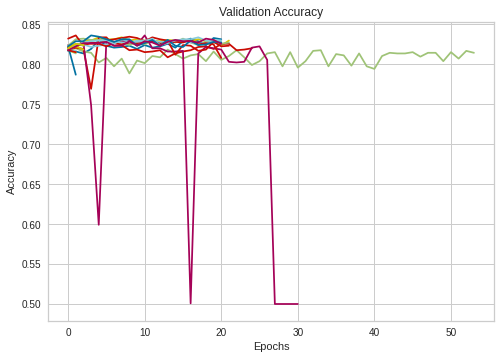

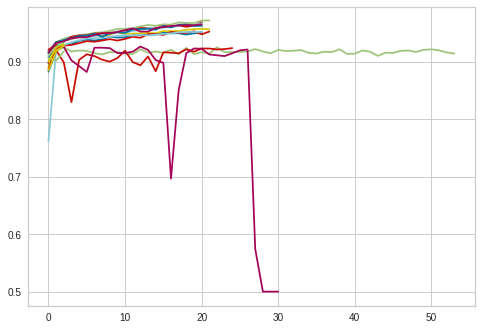

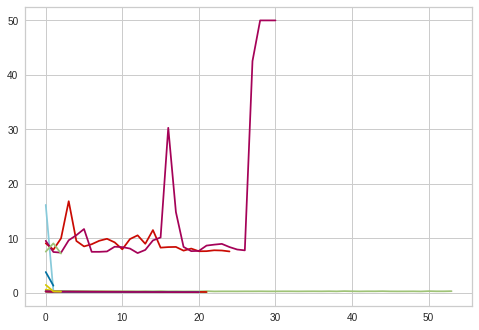

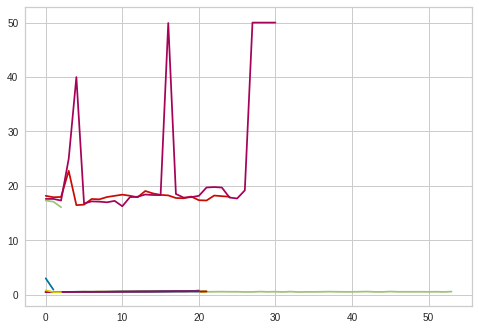

TypeError: ignored

In [ ]:
import matplotlib.pyplot as plt
dfs = dataframe
[d.val_acc.plot() for d in dfs.values()]
plt.title(f'Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.savefig('validation_accuracy' + '.png')
plt.show()
[d.train_acc.plot() for d in dfs.values()]
plt.show()
[d.train_loss.plot() for d in dfs.values()]
#plt.ylim([0, 0.5])
plt.show()
[d.mean_loss.plot() for d in dfs.values()]
#plt.ylim([0.3, 0.8])
plt.show()
#print(f'Best config: {analysis[0].get_best_config(metric="val_acc", mode="max")}')
#print(f'Best trial {analysis.get_best_trial(metric="f1_score", mode="min")}')
analysis[0].trials
#current_best_params
#analysis.dataframe().head()

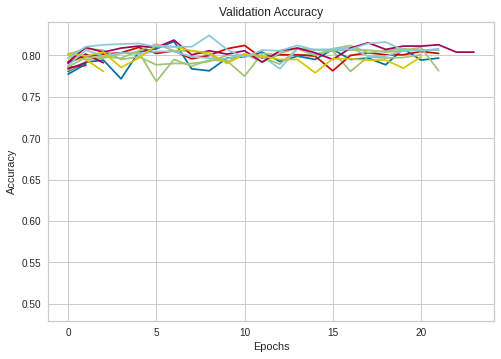

In [ ]:
[d.val_acc.plot() for d in dfs.values()]
plt.title(f'Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.savefig('validation_accuracy' + '.png')
plt.show()

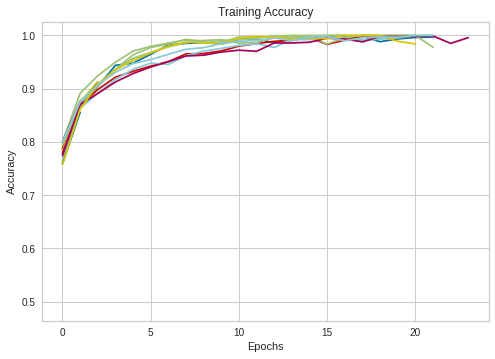

In [ ]:
[d.train_acc.plot() for d in dfs.values()]
plt.title(f'Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.savefig('training_accuracy' + '.png')
plt.show()

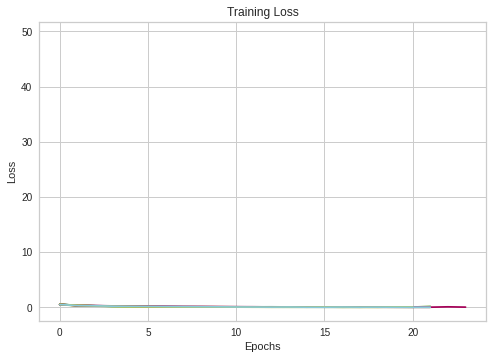

In [ ]:
[d.train_loss.plot() for d in dfs.values()]
plt.title(f'Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.savefig('train_loss' + '.png')
plt.show()

Using GPU...
AccountClassifier(
  (lstm): LSTM(768, 128, num_layers=2, dropout=0.088, bidirectional=True)
  (fc1): Linear(in_features=256, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)
Using GPU...
Starting to train the model
Training epoch 0
Epoch: 0 Training loss: 0.22938694970475304 Training Accuracy 0.9131944444444444 Validation Accuracy: 0.8145161290322581, Validation loss: 0.44175097288661486
Re-setting early stopping
Training epoch 1
Epoch: 1 Training loss: 0.18497963891261154 Training Accuracy 0.9315972222222222 Validation Accuracy: 0.8169354838709677, Validation loss: 0.45002887076585585
Possibly early stopping will be neccesary 1
Training epoch 2
Epoch: 2 Training loss: 0.17543089667128192 Training Accuracy 0.9357638888888888 Validation Accuracy: 0.8225806451612904, Validation loss: 0.45948555958795273
Possibly early stopping will be neccesary 2
Training epoch 3
Epoch: 3 Training loss: 0.1

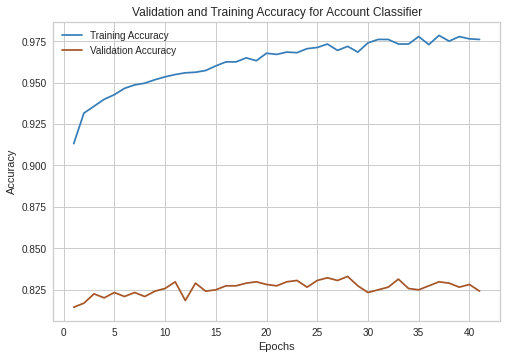

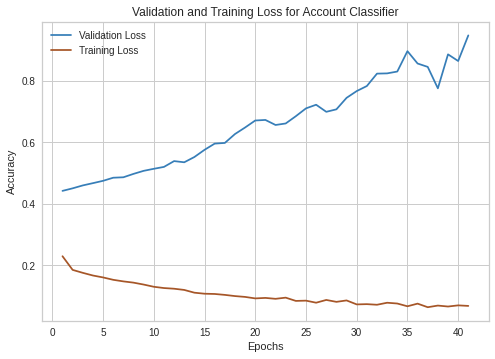

AccountClassifier(
  (lstm): LSTM(768, 128, num_layers=2, dropout=0.088, bidirectional=True)
  (fc1): Linear(in_features=256, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)

In [ ]:
lengths = [100]*len(accounts_hidden_states_train_np)
account_classifier = AccountClassifier(input_size=768,
                                     batch_size = 64,
                                     lstm_layers = 2,
                                     lr = 0.00040,
                                     lstm_hidden_size=128,
                                     lstm_dropout=0.088,
                                     fc_drouput=0.1,
                                     nn_size=512,
                                     weight_decay=6.7e-06,
                                     bidirectional = True, n_eopchs_stop=40)
 
account_classifier.train_model(accounts_h_train_norm, y_train, accounts_h_val_norm, lengths, y_val,  epochs=200)

In [ ]:
h_train = accounts_h_train_norm + accounts_h_val_norm
h_train = np.array(h_train)
y_train_kfold = y_train + y_val
y_train_kfold = np.array(y_train_kfold)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


Using GPU...
AccountClassifier(
  (lstm): LSTM(768, 128, num_layers=2, dropout=0.088, bidirectional=True)
  (fc1): Linear(in_features=256, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)
Using GPU...
Starting to train the model
Training epoch 0
Epoch: 0 Training loss: 0.28376930217760116 Training Accuracy 0.8825849514563107 Validation Accuracy: 0.912621359223301, Validation loss: 0.24042372505668805
Re-setting early stopping
Training epoch 1
Epoch: 1 Training loss: 0.2446025488181756 Training Accuracy 0.8995752427184466 Validation Accuracy: 0.9150485436893204, Validation loss: 0.23658647858176055
Re-setting early stopping
Training epoch 2
Epoch: 2 Training loss: 0.23957696098547715 Training Accuracy 0.9010922330097088 Validation Accuracy: 0.9162621359223301, Validation loss: 0.23793250693797216
Possibly early stopping will be neccesary 1
Training epoch 3
Epoch: 3 Training loss: 0.2339963668670792 Trai

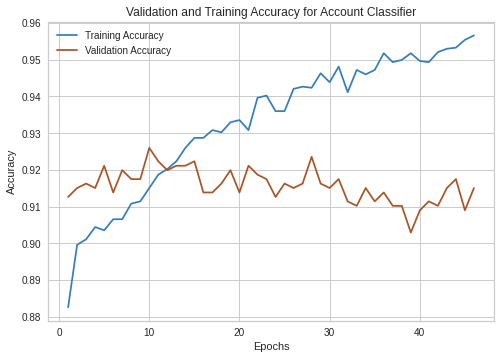

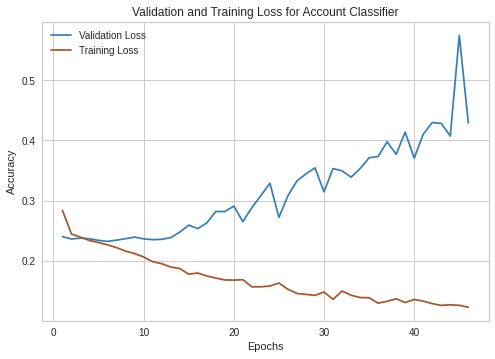

Using GPU...
AccountClassifier(
  (lstm): LSTM(768, 128, num_layers=2, dropout=0.088, bidirectional=True)
  (fc1): Linear(in_features=256, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)
Using GPU...
Starting to train the model
Training epoch 0
Epoch: 0 Training loss: 0.30387681930397564 Training Accuracy 0.8731796116504854 Validation Accuracy: 0.9259708737864077, Validation loss: 0.18112577091296683
Re-setting early stopping
Training epoch 1
Epoch: 1 Training loss: 0.26114965677977753 Training Accuracy 0.8947208737864077 Validation Accuracy: 0.9283980582524272, Validation loss: 0.17826017511565492
Re-setting early stopping
Training epoch 2
Epoch: 2 Training loss: 0.25419551954389763 Training Accuracy 0.8983616504854369 Validation Accuracy: 0.9320388349514563, Validation loss: 0.18120996742786216
Possibly early stopping will be neccesary 1
Training epoch 3
Epoch: 3 Training loss: 0.24661490514587897 T

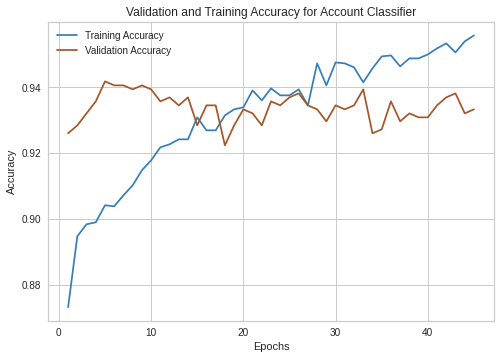

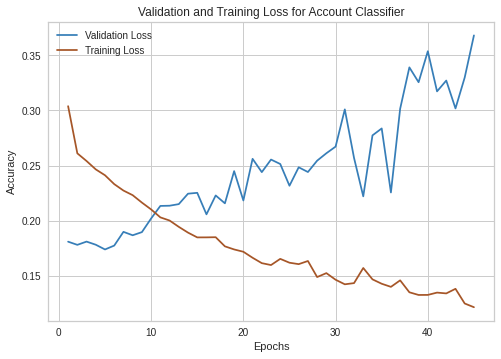

Using GPU...
AccountClassifier(
  (lstm): LSTM(768, 128, num_layers=2, dropout=0.088, bidirectional=True)
  (fc1): Linear(in_features=256, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)
Using GPU...
Starting to train the model
Training epoch 0
Epoch: 0 Training loss: 0.30856737587600946 Training Accuracy 0.8719660194174758 Validation Accuracy: 0.9514563106796117, Validation loss: 0.1473715368170038
Re-setting early stopping
Training epoch 1
Epoch: 1 Training loss: 0.26208626056233275 Training Accuracy 0.8892597087378641 Validation Accuracy: 0.9502427184466019, Validation loss: 0.15192621072937365
Possibly early stopping will be neccesary 1
Training epoch 2
Epoch: 2 Training loss: 0.2546181178006988 Training Accuracy 0.8935072815533981 Validation Accuracy: 0.9526699029126213, Validation loss: 0.15404592285857274
Possibly early stopping will be neccesary 2
Training epoch 3
Epoch: 3 Training loss: 0.247

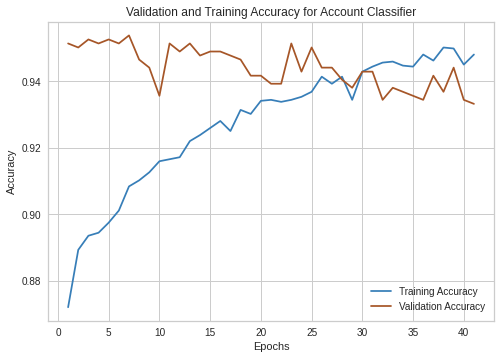

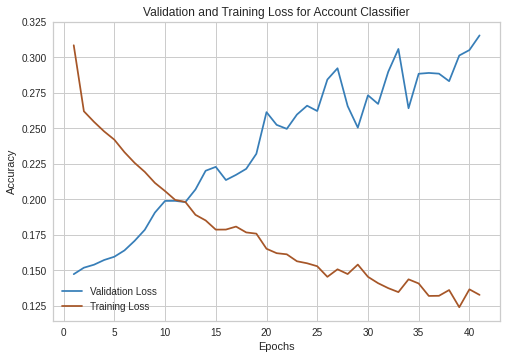

Using GPU...
AccountClassifier(
  (lstm): LSTM(768, 128, num_layers=2, dropout=0.088, bidirectional=True)
  (fc1): Linear(in_features=256, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)
Using GPU...
Starting to train the model
Training epoch 0
Epoch: 0 Training loss: 0.274855420888903 Training Accuracy 0.9004854368932039 Validation Accuracy: 0.8434466019417476, Validation loss: 0.35142488692869045
Re-setting early stopping
Training epoch 1
Epoch: 1 Training loss: 0.230846932122054 Training Accuracy 0.9174757281553398 Validation Accuracy: 0.8495145631067961, Validation loss: 0.34904262182829465
Re-setting early stopping
Training epoch 2
Epoch: 2 Training loss: 0.2222763244420863 Training Accuracy 0.9205097087378641 Validation Accuracy: 0.845873786407767, Validation loss: 0.35430014836098955
Possibly early stopping will be neccesary 1
Training epoch 3
Epoch: 3 Training loss: 0.21460933750495315 Trainin

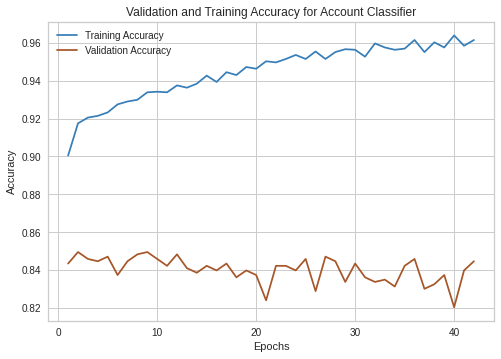

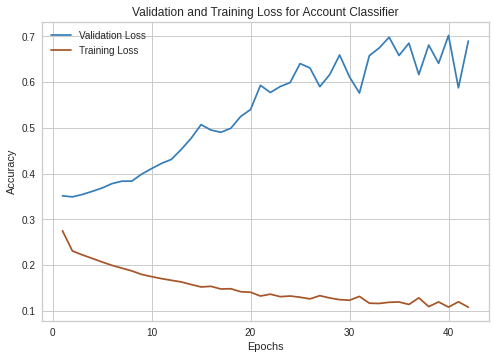

Using GPU...
AccountClassifier(
  (lstm): LSTM(768, 128, num_layers=2, dropout=0.088, bidirectional=True)
  (fc1): Linear(in_features=256, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
)
Using GPU...
Starting to train the model
Training epoch 0
Epoch: 0 Training loss: 0.2618869191322189 Training Accuracy 0.8916868932038835 Validation Accuracy: 0.8325242718446602, Validation loss: 0.3829837443184976
Re-setting early stopping
Training epoch 1
Epoch: 1 Training loss: 0.22552757978869173 Training Accuracy 0.9129247572815534 Validation Accuracy: 0.8337378640776699, Validation loss: 0.37414916394588094
Re-setting early stopping
Training epoch 2
Epoch: 2 Training loss: 0.21826403190453464 Training Accuracy 0.9153519417475728 Validation Accuracy: 0.8325242718446602, Validation loss: 0.3689494082880505
Re-setting early stopping
Training epoch 3
Epoch: 3 Training loss: 0.2115462920986689 Training Accuracy 0.918

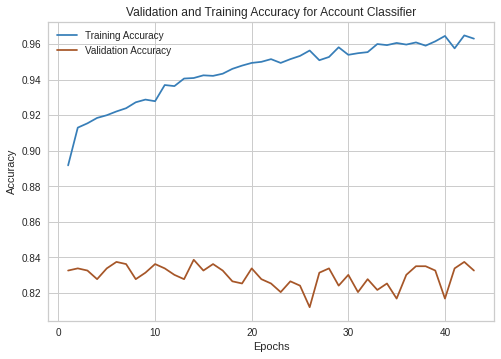

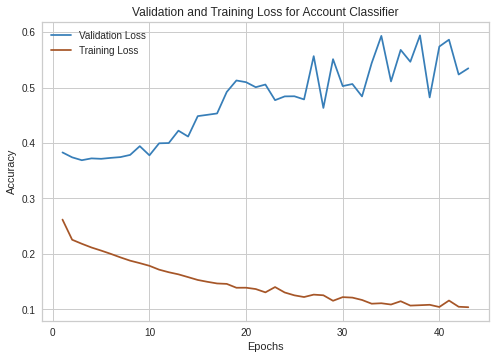

In [ ]:
from sklearn.model_selection import KFold

index = 0
folds = KFold(n_splits=5, random_state=42, shuffle=False)
for train_index, test_index in folds.split(h_train):
  X_train, X_test, Y_train, Y_test = h_train[train_index], h_train[test_index], y_train_kfold[train_index], y_train_kfold[test_index]
  lengths = [100]*len(X_train)
  account_classifier = AccountClassifier(input_size=768,
                                     batch_size = 64,
                                     lstm_layers = 2,
                                     lr = 0.00040,
                                     lstm_hidden_size=128,
                                     lstm_dropout=0.088,
                                     fc_drouput=0.1,
                                     nn_size=512,
                                     weight_decay=6.7e-06,
                                     bidirectional = True, n_eopchs_stop=40)
 
  account_classifier.train_model(X_train, Y_train, X_test, lengths, Y_test, epochs=250)
  torch.save(account_classifier, f'account_classifier_{index}')
  index +=1

In [ ]:
accoutn_classifier_0 = torch.load('account_classifier_0')
accoutn_classifier_1 = torch.load('account_classifier_1')
accoutn_classifier_2 = torch.load('account_classifier_2')
accoutn_classifier_3 = torch.load('account_classifier_3')
accoutn_classifier_4 = torch.load('account_classifier_4')

In [ ]:
y_pred_test = [0]*len(accounts_h_test_norm)
y_prob_test = [0]*len(accounts_h_test_norm)

In [ ]:
pred, _, prob = accoutn_classifier_0.get_prediction(accounts_h_test_norm, y_test)
y_pred_test = [x+y for x,y in zip(y_pred_test, pred)]
y_prob_test = [x+y for x,y in zip(y_prob_test, prob)]

pred, _, prob = accoutn_classifier_1.get_prediction(accounts_h_test_norm, y_test)
y_pred_test = [x+y for x,y in zip(y_pred_test, pred)]
y_prob_test = [x+y for x,y in zip(y_prob_test, prob)]

pred, _, prob = accoutn_classifier_2.get_prediction(accounts_h_test_norm, y_test)
y_pred_test = [x+y for x,y in zip(y_pred_test, pred)]
y_prob_test = [x+y for x,y in zip(y_prob_test, prob)]

pred, _, prob = accoutn_classifier_3.get_prediction(accounts_h_test_norm, y_test)
y_pred_test = [x+y for x,y in zip(y_pred_test, pred)]
y_prob_test = [x+y for x,y in zip(y_prob_test, prob)]

pred, _, prob = accoutn_classifier_4.get_prediction(accounts_h_test_norm, y_test)
y_pred_test = [x+y for x,y in zip(y_pred_test, pred)]
y_prob_test = [x+y for x,y in zip(y_prob_test, prob)]

In [ ]:
majority_pred = []
for p in y_pred_test:
  if p>2:
    majority_pred.append(1)
  else:
    majority_pred.append(0)

In [ ]:
majority_prob = []
for p in y_prob_test:
  if p>2.5:
    majority_prob.append(1)
  else:
    majority_prob.append(0)

In [ ]:
evaulate(majority_pred, y_test)

Accuracy: 0.8363636363636363
F1 Score: 0.8280254777070063
Precision: 0.87248322147651
Recall: 0.7878787878787878
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.88      0.84      1320
           1       0.87      0.79      0.83      1320

    accuracy                           0.84      2640
   macro avg       0.84      0.84      0.84      2640
weighted avg       0.84      0.84      0.84      2640

Confusion Matrix:
[[1168  152]
 [ 280 1040]]


0.8280254777070063

In [ ]:
evaulate(majority_prob, y_test)

Accuracy: 0.8378787878787879
F1 Score: 0.8297533810660302
Precision: 0.873534338358459
Recall: 0.7901515151515152
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.89      0.85      1320
           1       0.87      0.79      0.83      1320

    accuracy                           0.84      2640
   macro avg       0.84      0.84      0.84      2640
weighted avg       0.84      0.84      0.84      2640

Confusion Matrix:
[[1169  151]
 [ 277 1043]]


0.8297533810660302

In [ ]:
y_account_test_pred, loss, probabilities = account_classifier.get_prediction(accounts_h_test_norm, y_test)

In [ ]:
evaulate(y_account_test_pred, y_test)

Accuracy: 0.8276515151515151
F1 Score: 0.8072850487081745
Precision: 0.9154658981748319
Recall: 0.7219696969696969
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.93      0.84      1320
           1       0.92      0.72      0.81      1320

    accuracy                           0.83      2640
   macro avg       0.84      0.83      0.83      2640
weighted avg       0.84      0.83      0.83      2640

Confusion Matrix:
[[1232   88]
 [ 367  953]]


0.8072850487081745

In [ ]:
majority_prob = []
for p in probabilities:
  if p>0.5:
    majority_prob.append(1)
  else:
    majority_prob.append(0)

In [ ]:
evaulate(majority_prob, y_test)

Accuracy: 0.8276515151515151
F1 Score: 0.8072850487081745
Precision: 0.9154658981748319
Recall: 0.7219696969696969
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.93      0.84      1320
           1       0.92      0.72      0.81      1320

    accuracy                           0.83      2640
   macro avg       0.84      0.83      0.83      2640
weighted avg       0.84      0.83      0.83      2640

Confusion Matrix:
[[1232   88]
 [ 367  953]]


0.8072850487081745

In [ ]:
space = {
    'input_size': hp.choice('input_size', [32]),
    'lr': hp.loguniform('lr', np.log(0.0001), np.log(0.2)),
    'lstm_hidden_size': hp.choice('lstm_hidden_size', [32, 64, 128, 256]),
    'lstm_layers': hp.choice('lstm_layers', [1, 2]),
    'batch_size': hp.choice('batch_size', [32, 64]),
    'nn_layers': hp.choice('nn_layers', [32, 64, 128, 256]),
    'lstm_dropout': hp.uniform('lstm_dropout', 0.0, 0.5),
    'fc_drouput': hp.uniform('fc_drouput', 0.0, 0.5),
    'weight_decay': hp.uniform('weight_decay', 0.0, 0.00001)
    }
current_best_params = [
{
    'input_size': 32,
    'lr': 0.001,
    'lstm_hidden_size': 32,
    'lstm_layers': 2,
    'batch_size': 64,
    'nn_layers': 128,
    'lstm_dropout':0,
    'fc_drouput':0,
    'weight_decay': 0
}]

analysis_aug, dataframe = optimizer.optimize(space, current_best_params, trials = 30, optimizeTweetClassifier=False, lengths=lengths)

2021-05-28 17:39:30,624	INFO services.py:1269 -- View the Ray dashboard at http://127.0.0.1:8265
2021-05-28 17:39:36,333	WARNING function_runner.py:545 -- Function checkpointing is disabled. This may result in unexpected behavior when using checkpointing features or certain schedulers. To enable, set the train function arguments to be `func(config, checkpoint_dir=None)`.


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_abc29244,PENDING,,64,0,32,0.001,0,32,2,128,0


(pid=1009) 2021-05-28 17:39:38.752214: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


(pid=1009) Reading twitter - 1grams ...
(pid=1009) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_abc29244,RUNNING,,64,0,32,0.001,0,32,2,128,0
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_abc29244,RUNNING,,64,0,32,0.001,0,32,2,128,0
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06


(pid=1009) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1009)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1009) Using GPU...
(pid=1009) AccountClassifier(
(pid=1009)   (lstm): LSTM(32, 32, num_layers=2, bidirectional=True)
(pid=1009)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1009)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1009)   (dropout): Dropout(p=0.0, inplace=False)
(pid=1009) )
(pid=1009) Using GPU...
(pid=1009) Starting to train the model
(pid=1009) Training epoch 0
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-40-07
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5113251209379204
  neg_mean_loss: -0.5113251209379204
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 19.536895513534546
  time_this_iter_s: 19.536895513534546
  time_total_s: 19.536895513534546
  timestamp: 1622223607
  timesteps_since_restore: 0
  train_acc: 0.5321759259259259
  train_loss: 0.6681865049733056
  training_iteration: 1
  tria

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.511325,1,19.5369,20,0.784677,0.532176
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 0 Training loss: 0.6681865049733056 Training Accuracy 0.5321759259259259 Validation Accuracy: 0.7846774193548387, Validation loss: 0.5113251209379204
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 1
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-40-19
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.6100116734951078
  neg_mean_loss: -0.6100116734951078
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 31.640750646591187
  time_this_iter_s: 12.10385513305664
  time_total_s: 31.640750646591187
  timestamp: 1622223619
  timesteps_since_restore: 0
  train_acc: 0.5443865740740741
  train_loss: 0.6594788231231549
  training_iteration: 2
  trial_id: abc29244
  val_acc: 0.6532258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.610012,2,31.6408,20,0.653226,0.544387
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 1 Training loss: 0.6594788231231549 Training Accuracy 0.5443865740740741 Validation Accuracy: 0.6532258064516129, Validation loss: 0.6100116734951078
(pid=1009) Possibly early stopping will be neccesary 1
(pid=1009) Training epoch 2
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-40-31
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.6473215458645661
  neg_mean_loss: -0.6473215458645661
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 43.75408601760864
  time_this_iter_s: 12.113335371017456
  time_total_s: 43.75408601760864
  timestamp: 1622223631
  timesteps_since_restore: 0
  train_acc: 0.5362847222222222
  train_loss: 0.6618875143704591
  training_iteration: 3
  trial_id: abc29244
  val_acc: 0.5564516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.647322,3,43.7541,20,0.556452,0.536285
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 2 Training loss: 0.6618875143704591 Training Accuracy 0.5362847222222222 Validation Accuracy: 0.5564516129032258, Validation loss: 0.6473215458645661
(pid=1009) Possibly early stopping will be neccesary 2
(pid=1009) Training epoch 3
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-40-43
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 4
  mean_loss: 0.4661660778438325
  neg_mean_loss: -0.4661660778438325
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 55.86711525917053
  time_this_iter_s: 12.11302924156189
  time_total_s: 55.86711525917053
  timestamp: 1622223643
  timesteps_since_restore: 0
  train_acc: 0.5318287037037037
  train_loss: 0.6632899895862296
  training_iteration: 4
  trial_id: abc29244
  val_acc: 0.8064516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.466166,4,55.8671,20,0.806452,0.531829
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 3 Training loss: 0.6632899895862296 Training Accuracy 0.5318287037037037 Validation Accuracy: 0.8064516129032258, Validation loss: 0.4661660778438325
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 4
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-40-55
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 5
  mean_loss: 0.4685736319083961
  neg_mean_loss: -0.4685736319083961
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 67.97495031356812
  time_this_iter_s: 12.107835054397583
  time_total_s: 67.97495031356812
  timestamp: 1622223655
  timesteps_since_restore: 0
  train_acc: 0.5505787037037037
  train_loss: 0.6455223630975794
  training_iteration: 5
  trial_id: abc29244
  val_acc: 0.8282258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.468574,5,67.975,20,0.828226,0.550579
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 4 Training loss: 0.6455223630975794 Training Accuracy 0.5505787037037037 Validation Accuracy: 0.8282258064516129, Validation loss: 0.4685736319083961
(pid=1009) Possibly early stopping will be neccesary 1
(pid=1009) Training epoch 5
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-41-08
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 6
  mean_loss: 0.4096373842141504
  neg_mean_loss: -0.4096373842141504
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 80.2223436832428
  time_this_iter_s: 12.247393369674683
  time_total_s: 80.2223436832428
  timestamp: 1622223668
  timesteps_since_restore: 0
  train_acc: 0.5544560185185186
  train_loss: 0.6404949305234132
  training_iteration: 6
  trial_id: abc29244
  val_acc: 0.8443548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.409637,6,80.2223,20,0.844355,0.554456
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 5 Training loss: 0.6404949305234132 Training Accuracy 0.5544560185185186 Validation Accuracy: 0.8443548387096774, Validation loss: 0.4096373842141504
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 6
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-41-20
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 7
  mean_loss: 0.3836272615088913
  neg_mean_loss: -0.3836272615088913
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 92.30293679237366
  time_this_iter_s: 12.08059310913086
  time_total_s: 92.30293679237366
  timestamp: 1622223680
  timesteps_since_restore: 0
  train_acc: 0.5556712962962963
  train_loss: 0.6375792991231989
  training_iteration: 7
  trial_id: abc29244
  val_acc: 0.8596774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.383627,7,92.3029,20,0.859677,0.555671
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 6 Training loss: 0.6375792991231989 Training Accuracy 0.5556712962962963 Validation Accuracy: 0.8596774193548387, Validation loss: 0.3836272615088913
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 7
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-41-32
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 8
  mean_loss: 0.36963545495788325
  neg_mean_loss: -0.36963545495788325
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 104.87931108474731
  time_this_iter_s: 12.576374292373657
  time_total_s: 104.87931108474731
  timestamp: 1622223692
  timesteps_since_restore: 0
  train_acc: 0.5560185185185185
  train_loss: 0.6346883378646991
  training_iteration: 8
  trial_id: abc29244
  val_acc: 0.8685483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.369635,8,104.879,20,0.868548,0.556019
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 7 Training loss: 0.6346883378646991 Training Accuracy 0.5560185185185185 Validation Accuracy: 0.8685483870967742, Validation loss: 0.36963545495788325
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 8
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-41-45
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 9
  mean_loss: 0.4242727595256339
  neg_mean_loss: -0.4242727595256339
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 117.34951829910278
  time_this_iter_s: 12.470207214355469
  time_total_s: 117.34951829910278
  timestamp: 1622223705
  timesteps_since_restore: 0
  train_acc: 0.5560763888888889
  train_loss: 0.6312245653735267
  training_iteration: 9
  trial_id: abc29244
  val_acc: 0.839516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.424273,9,117.35,20,0.839516,0.556076
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 8 Training loss: 0.6312245653735267 Training Accuracy 0.5560763888888889 Validation Accuracy: 0.839516129032258, Validation loss: 0.4242727595256339
(pid=1009) Possibly early stopping will be neccesary 1
(pid=1009) Training epoch 9
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-41-57
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 10
  mean_loss: 0.35653484143208075
  neg_mean_loss: -0.35653484143208075
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 129.917382478714
  time_this_iter_s: 12.567864179611206
  time_total_s: 129.917382478714
  timestamp: 1622223717
  timesteps_since_restore: 0
  train_acc: 0.5575231481481482
  train_loss: 0.6307969283174586
  training_iteration: 10
  trial_id: abc29244
  val_acc: 0.8709677419354839
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.356535,10,129.917,20,0.870968,0.557523
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 9 Training loss: 0.6307969283174586 Training Accuracy 0.5575231481481482 Validation Accuracy: 0.8709677419354839, Validation loss: 0.35653484143208075
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 10
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-42-10
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 11
  mean_loss: 0.3702766415420258
  neg_mean_loss: -0.3702766415420258
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 142.47971510887146
  time_this_iter_s: 12.56233263015747
  time_total_s: 142.47971510887146
  timestamp: 1622223730
  timesteps_since_restore: 0
  train_acc: 0.5588541666666667
  train_loss: 0.6282516687004654
  training_iteration: 11
  trial_id: abc29244
  val_acc: 0.8596774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.370277,11,142.48,20,0.859677,0.558854
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 10 Training loss: 0.6282516687004654 Training Accuracy 0.5588541666666667 Validation Accuracy: 0.8596774193548387, Validation loss: 0.3702766415420258
(pid=1009) Possibly early stopping will be neccesary 1
(pid=1009) Training epoch 11
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-42-23
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 12
  mean_loss: 0.3575102361641139
  neg_mean_loss: -0.3575102361641139
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 155.1712064743042
  time_this_iter_s: 12.69149136543274
  time_total_s: 155.1712064743042
  timestamp: 1622223743
  timesteps_since_restore: 0
  train_acc: 0.5601273148148148
  train_loss: 0.6265058548362167
  training_iteration: 12
  trial_id: abc29244
  val_acc: 0.8701612903225806
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.35751,12,155.171,20,0.870161,0.560127
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 11 Training loss: 0.6265058548362167 Training Accuracy 0.5601273148148148 Validation Accuracy: 0.8701612903225806, Validation loss: 0.3575102361641139
(pid=1009) Possibly early stopping will be neccesary 2
(pid=1009) Training epoch 12
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-42-35
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 13
  mean_loss: 0.35051953153822746
  neg_mean_loss: -0.35051953153822746
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 167.28440260887146
  time_this_iter_s: 12.11319613456726
  time_total_s: 167.28440260887146
  timestamp: 1622223755
  timesteps_since_restore: 0
  train_acc: 0.5622106481481481
  train_loss: 0.625300735897488
  training_iteration: 13
  trial_id: abc29244
  val_acc: 0.8701612903225806
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.35052,13,167.284,20,0.870161,0.562211
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 12 Training loss: 0.625300735897488 Training Accuracy 0.5622106481481481 Validation Accuracy: 0.8701612903225806, Validation loss: 0.35051953153822746
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 13
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-42-47
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 14
  mean_loss: 0.3506838378035172
  neg_mean_loss: -0.3506838378035172
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 179.56783771514893
  time_this_iter_s: 12.283435106277466
  time_total_s: 179.56783771514893
  timestamp: 1622223767
  timesteps_since_restore: 0
  train_acc: 0.5627314814814814
  train_loss: 0.6239505180606135
  training_iteration: 14
  trial_id: abc29244
  val_acc: 0.8741935483870967
  
(pid=1009) Epoch: 13 Training loss: 0.6239505180606135 Training Accuracy 0.5627314814814814 Validation Accuracy: 0.8741935483870967, Valid

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.350684,14,179.568,20,0.874194,0.562731
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Possibly early stopping will be neccesary 1
(pid=1009) Training epoch 14
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-42-59
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 15
  mean_loss: 0.3488864033061158
  neg_mean_loss: -0.3488864033061158
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 192.02660393714905
  time_this_iter_s: 12.458766222000122
  time_total_s: 192.02660393714905
  timestamp: 1622223779
  timesteps_since_restore: 0
  train_acc: 0.5630787037037037
  train_loss: 0.6221542786668848
  training_iteration: 15
  trial_id: abc29244
  val_acc: 0.875
  
(pid=1009) Epoch: 14 Training loss: 0.6221542786668848 Training Accuracy 0.5630787037037037 Validation Accuracy: 0.875, Validation loss: 0.3488864033061158


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.348886,15,192.027,20,0.875,0.563079
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 15
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-43-12
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 16
  mean_loss: 0.33934681529762845
  neg_mean_loss: -0.33934681529762845
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 204.3258500099182
  time_this_iter_s: 12.299246072769165
  time_total_s: 204.3258500099182
  timestamp: 1622223792
  timesteps_since_restore: 0
  train_acc: 0.5631944444444444
  train_loss: 0.6215555923956412
  training_iteration: 16
  trial_id: abc29244
  val_acc: 0.8790322580645161
  
(pid=1009) Epoch: 15 Training loss: 0.6215555923956412 Training Accuracy 0.5631944444444444 Validation Accuracy: 0.8790322580645161, Validation loss: 0.33934681529762845
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 16


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.339347,16,204.326,20,0.879032,0.563194
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-43-24
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 17
  mean_loss: 0.3635156586863342
  neg_mean_loss: -0.3635156586863342
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 216.72979617118835
  time_this_iter_s: 12.403946161270142
  time_total_s: 216.72979617118835
  timestamp: 1622223804
  timesteps_since_restore: 0
  train_acc: 0.5634259259259259
  train_loss: 0.6210793409082624
  training_iteration: 17
  trial_id: abc29244
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.363516,17,216.73,20,0.875806,0.563426
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 16 Training loss: 0.6210793409082624 Training Accuracy 0.5634259259259259 Validation Accuracy: 0.8758064516129033, Validation loss: 0.3635156586863342
(pid=1009) Possibly early stopping will be neccesary 1
(pid=1009) Training epoch 17
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-43-37
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 18
  mean_loss: 0.3428166383740123
  neg_mean_loss: -0.3428166383740123
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 229.08885383605957
  time_this_iter_s: 12.359057664871216
  time_total_s: 229.08885383605957
  timestamp: 1622223817
  timesteps_since_restore: 0
  train_acc: 0.5628472222222223
  train_loss: 0.6197562597416065
  training_iteration: 18
  trial_id: abc29244
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.342817,18,229.089,20,0.878226,0.562847
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 17 Training loss: 0.6197562597416065 Training Accuracy 0.5628472222222223 Validation Accuracy: 0.8782258064516129, Validation loss: 0.3428166383740123
(pid=1009) Possibly early stopping will be neccesary 2
(pid=1009) Training epoch 18
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-43-49
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 19
  mean_loss: 0.3378840671269822
  neg_mean_loss: -0.3378840671269822
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 241.42104053497314
  time_this_iter_s: 12.332186698913574
  time_total_s: 241.42104053497314
  timestamp: 1622223829
  timesteps_since_restore: 0
  train_acc: 0.5643518518518519
  train_loss: 0.6173220632252869
  training_iteration: 19
  trial_id: abc29244
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.337884,19,241.421,20,0.878226,0.564352
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 18 Training loss: 0.6173220632252869 Training Accuracy 0.5643518518518519 Validation Accuracy: 0.8782258064516129, Validation loss: 0.3378840671269822
(pid=1009) Re-setting early stopping
(pid=1009) Training epoch 19
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-44-01
  done: false
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.35394592730818164
  neg_mean_loss: -0.35394592730818164
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 253.90130639076233
  time_this_iter_s: 12.480265855789185
  time_total_s: 253.90130639076233
  timestamp: 1622223841
  timesteps_since_restore: 0
  train_acc: 0.5662037037037037
  train_loss: 0.6171193193506311
  training_iteration: 20
  trial_id: abc29244
  val_acc: 0.8790322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,RUNNING,172.28.0.2:1009,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,PENDING,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,,,,,,


(pid=1009) Epoch: 19 Training loss: 0.6171193193506311 Training Accuracy 0.5662037037037037 Validation Accuracy: 0.8790322580645161, Validation loss: 0.35394592730818164
(pid=1009) Possibly early stopping will be neccesary 1
(pid=1009) <Figure size 640x480 with 1 Axes>
(pid=1009) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_abc29244:
  date: 2021-05-28_17-44-01
  done: true
  experiment_id: b5ac3c4dc2da46efa8d125734da4f028
  experiment_tag: 1_batch_size=64,fc_drouput=0.0,input_size=32,lr=0.001,lstm_dropout=0.0,lstm_hidden_size=32,lstm_layers=2,nn_layers=128,weight_decay=0.0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.35394592730818164
  neg_mean_loss: -0.35394592730818164
  node_ip: 172.28.0.2
  pid: 1009
  time_since_restore: 253.90130639076233
  time_this_iter_s: 12.480265855789185
  time_total_s: 253.90130639076233
  timestamp: 1622223841
  timesteps_since_restore: 0
  train_acc: 0.5662037037037037
  train_loss: 0

(pid=1009) Error in atexit._run_exitfuncs:
(pid=1009) Traceback (most recent call last):
(pid=1009)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1009)     self._writeout_input_cache(conn)
(pid=1009)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1009)     (self.session_number,)+line)
(pid=1009) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140452932511488 and this is thread id 140465933576064.
(pid=1010) 2021-05-28 17:44:06.526355: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


(pid=1010) Reading twitter - 1grams ...
(pid=1010) Reading twitter - 2grams ...


(pid=1010) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1010)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1010) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2536721113709811 and num_layers=1
(pid=1010)   "num_layers={}".format(dropout, num_layers))


(pid=1010) Using GPU...
(pid=1010) AccountClassifier(
(pid=1010)   (lstm): LSTM(32, 256, dropout=0.2536721113709811, bidirectional=True)
(pid=1010)   (fc1): Linear(in_features=512, out_features=128, bias=True)
(pid=1010)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1010)   (dropout): Dropout(p=0.4525536008476096, inplace=False)
(pid=1010) )
(pid=1010) Using GPU...
(pid=1010) Starting to train the model
(pid=1010) Training epoch 0
Result for create_account_classifier_abd8417a:
  date: 2021-05-28_17-44-32
  done: true
  experiment_id: 8a069651c45b40a1b3b65573c37d52f8
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5447108629726685
  neg_mean_loss: -0.5447108629726685
  node_ip: 172.28.0.2
  pid: 1010
  time_since_restore: 16.446659326553345
  time_this_iter_s: 16.446659326553345
  time_total_s: 16.446659326553345
  timestamp: 1622223872
  timesteps_since_restore: 0
  train_acc: 0.5320601851851852
  train_loss: 0.672865582395483
 

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,PENDING,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1010) Epoch: 0 Training loss: 0.672865582395483 Training Accuracy 0.5320601851851852 Validation Accuracy: 0.7532258064516129, Validation loss: 0.5447108629726685


(pid=1008) 2021-05-28 17:44:35.367779: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,,,,,,
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Reading twitter - 1grams ...
(pid=1008) Reading twitter - 2grams ...


(pid=1008) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1008)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1008) Using GPU...
(pid=1008) AccountClassifier(
(pid=1008)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.3549919026165004, bidirectional=True)
(pid=1008)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1008)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1008)   (dropout): Dropout(p=0.10141922926873642, inplace=False)
(pid=1008) )
(pid=1008) Using GPU...
(pid=1008) Starting to train the model
(pid=1008) Training epoch 0
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-45-05
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.39173159023667986
  neg_mean_loss: -0.39173159023667986
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 20.875495433807373
  time_this_iter_s: 20.875495433807373
  time_total_s: 20.875495433807373
  timestamp: 1622223905
  timesteps_since_restore: 0
  train_acc: 0.528125
  train_loss: 0.6775644520918

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.391732,1,20.8755,20,0.859677,0.528125
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 0 Training loss: 0.6775644520918528 Training Accuracy 0.528125 Validation Accuracy: 0.8596774193548387, Validation loss: 0.39173159023667986
(pid=1008) Re-setting early stopping
(pid=1008) Training epoch 1
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-45-18
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.3455296617845717
  neg_mean_loss: -0.3455296617845717
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 34.385685205459595
  time_this_iter_s: 13.510189771652222
  time_total_s: 34.385685205459595
  timestamp: 1622223918
  timesteps_since_restore: 0
  train_acc: 0.5586226851851852
  train_loss: 0.6412283486790127
  training_iteration: 2
  trial_id: 4b5a14da
  val_acc: 0.8838709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.34553,2,34.3857,20,0.883871,0.558623
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 1 Training loss: 0.6412283486790127 Training Accuracy 0.5586226851851852 Validation Accuracy: 0.8838709677419355, Validation loss: 0.3455296617845717
(pid=1008) Re-setting early stopping
(pid=1008) Training epoch 2
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-45-32
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.39674911134006946
  neg_mean_loss: -0.39674911134006946
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 47.98897314071655
  time_this_iter_s: 13.603287935256958
  time_total_s: 47.98897314071655
  timestamp: 1622223932
  timesteps_since_restore: 0
  train_acc: 0.5621527777777777
  train_loss: 0.6343013628765389
  training_iteration: 3
  trial_id: 4b5a14da
  val_acc: 0.8540322580645161
  
(pid=1008) Epoch: 2 Training loss: 0.6343013628765389 Training Accuracy 0.5621527777777777 Validation Accuracy: 0.8540322580645161, Validation

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.396749,3,47.989,20,0.854032,0.562153
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Possibly early stopping will be neccesary 1
(pid=1008) Training epoch 3
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-45-45
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 4
  mean_loss: 0.32722092502441574
  neg_mean_loss: -0.32722092502441574
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 61.54095411300659
  time_this_iter_s: 13.551980972290039
  time_total_s: 61.54095411300659
  timestamp: 1622223945
  timesteps_since_restore: 0
  train_acc: 0.5619791666666667
  train_loss: 0.6348378786334286
  training_iteration: 4
  trial_id: 4b5a14da
  val_acc: 0.8862903225806451
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.327221,4,61.541,20,0.88629,0.561979
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 3 Training loss: 0.6348378786334286 Training Accuracy 0.5619791666666667 Validation Accuracy: 0.8862903225806451, Validation loss: 0.32722092502441574
(pid=1008) Re-setting early stopping
(pid=1008) Training epoch 4
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-45-59
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 5
  mean_loss: 0.32761343344702054
  neg_mean_loss: -0.32761343344702054
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 75.04626846313477
  time_this_iter_s: 13.505314350128174
  time_total_s: 75.04626846313477
  timestamp: 1622223959
  timesteps_since_restore: 0
  train_acc: 0.5622685185185186
  train_loss: 0.6323711788212811
  training_iteration: 5
  trial_id: 4b5a14da
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.327613,5,75.0463,20,0.88871,0.562269
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 4 Training loss: 0.6323711788212811 Training Accuracy 0.5622685185185186 Validation Accuracy: 0.8887096774193548, Validation loss: 0.32761343344702054
(pid=1008) Possibly early stopping will be neccesary 1
(pid=1008) Training epoch 5
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-46-13
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 6
  mean_loss: 0.3561733060274785
  neg_mean_loss: -0.3561733060274785
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 88.68623304367065
  time_this_iter_s: 13.639964580535889
  time_total_s: 88.68623304367065
  timestamp: 1622223973
  timesteps_since_restore: 0
  train_acc: 0.5635416666666667
  train_loss: 0.6286987896318789
  training_iteration: 6
  trial_id: 4b5a14da
  val_acc: 0.8733870967741936
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.356173,6,88.6862,20,0.873387,0.563542
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 5 Training loss: 0.6286987896318789 Training Accuracy 0.5635416666666667 Validation Accuracy: 0.8733870967741936, Validation loss: 0.3561733060274785
(pid=1008) Possibly early stopping will be neccesary 2
(pid=1008) Training epoch 6
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-46-26
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 7
  mean_loss: 0.32078785776237406
  neg_mean_loss: -0.32078785776237406
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 102.26174139976501
  time_this_iter_s: 13.57550835609436
  time_total_s: 102.26174139976501
  timestamp: 1622223986
  timesteps_since_restore: 0
  train_acc: 0.5635416666666667
  train_loss: 0.6292534962848381
  training_iteration: 7
  trial_id: 4b5a14da
  val_acc: 0.9
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.320788,7,102.262,20,0.9,0.563542
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 6 Training loss: 0.6292534962848381 Training Accuracy 0.5635416666666667 Validation Accuracy: 0.9, Validation loss: 0.32078785776237406
(pid=1008) Re-setting early stopping
(pid=1008) Training epoch 7
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-46-40
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 8
  mean_loss: 0.33172376855629054
  neg_mean_loss: -0.33172376855629054
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 115.84443950653076
  time_this_iter_s: 13.582698106765747
  time_total_s: 115.84443950653076
  timestamp: 1622224000
  timesteps_since_restore: 0
  train_acc: 0.5640625
  train_loss: 0.6279828793472714
  training_iteration: 8
  trial_id: 4b5a14da
  val_acc: 0.8903225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.331724,8,115.844,20,0.890323,0.564063
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 7 Training loss: 0.6279828793472714 Training Accuracy 0.5640625 Validation Accuracy: 0.8903225806451613, Validation loss: 0.33172376855629054
(pid=1008) Possibly early stopping will be neccesary 1
(pid=1008) Training epoch 8
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-46-53
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 9
  mean_loss: 0.360159573719674
  neg_mean_loss: -0.360159573719674
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 129.33687686920166
  time_this_iter_s: 13.492437362670898
  time_total_s: 129.33687686920166
  timestamp: 1622224013
  timesteps_since_restore: 0
  train_acc: 0.5597222222222222
  train_loss: 0.6277049839496612
  training_iteration: 9
  trial_id: 4b5a14da
  val_acc: 0.8733870967741936
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.36016,9,129.337,20,0.873387,0.559722
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 8 Training loss: 0.6277049839496612 Training Accuracy 0.5597222222222222 Validation Accuracy: 0.8733870967741936, Validation loss: 0.360159573719674
(pid=1008) Possibly early stopping will be neccesary 2
(pid=1008) Training epoch 9
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-47-07
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 10
  mean_loss: 0.35695876244598984
  neg_mean_loss: -0.35695876244598984
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 143.0618040561676
  time_this_iter_s: 13.724927186965942
  time_total_s: 143.0618040561676
  timestamp: 1622224027
  timesteps_since_restore: 0
  train_acc: 0.561400462962963
  train_loss: 0.6267995218435923
  training_iteration: 10
  trial_id: 4b5a14da
  val_acc: 0.8806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.356959,10,143.062,20,0.880645,0.5614
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 9 Training loss: 0.6267995218435923 Training Accuracy 0.561400462962963 Validation Accuracy: 0.8806451612903226, Validation loss: 0.35695876244598984
(pid=1008) Possibly early stopping will be neccesary 3
(pid=1008) Training epoch 10
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-47-21
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 11
  mean_loss: 0.35318054437380164
  neg_mean_loss: -0.35318054437380164
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 156.68388509750366
  time_this_iter_s: 13.62208104133606
  time_total_s: 156.68388509750366
  timestamp: 1622224041
  timesteps_since_restore: 0
  train_acc: 0.5614583333333333
  train_loss: 0.6242789177982896
  training_iteration: 11
  trial_id: 4b5a14da
  val_acc: 0.8927419354838709
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.353181,11,156.684,20,0.892742,0.561458
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 10 Training loss: 0.6242789177982896 Training Accuracy 0.5614583333333333 Validation Accuracy: 0.8927419354838709, Validation loss: 0.35318054437380164
(pid=1008) Possibly early stopping will be neccesary 4
(pid=1008) Training epoch 11
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-47-34
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 12
  mean_loss: 0.33439014624662144
  neg_mean_loss: -0.33439014624662144
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 170.34572982788086
  time_this_iter_s: 13.661844730377197
  time_total_s: 170.34572982788086
  timestamp: 1622224054
  timesteps_since_restore: 0
  train_acc: 0.5604166666666667
  train_loss: 0.6264953187218418
  training_iteration: 12
  trial_id: 4b5a14da
  val_acc: 0.8879032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.33439,12,170.346,20,0.887903,0.560417
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 11 Training loss: 0.6264953187218418 Training Accuracy 0.5604166666666667 Validation Accuracy: 0.8879032258064516, Validation loss: 0.33439014624662144
(pid=1008) Possibly early stopping will be neccesary 5
(pid=1008) Training epoch 12
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-47-48
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 13
  mean_loss: 0.33933356992239433
  neg_mean_loss: -0.33933356992239433
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 183.97544074058533
  time_this_iter_s: 13.629710912704468
  time_total_s: 183.97544074058533
  timestamp: 1622224068
  timesteps_since_restore: 0
  train_acc: 0.5634837962962963
  train_loss: 0.6259364432758755
  training_iteration: 13
  trial_id: 4b5a14da
  val_acc: 0.8895161290322581
  
(pid=1008) Epoch: 12 Training loss: 0.6259364432758755 Training Accuracy 0.5634837962962963 Validation Accuracy: 0.88

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.339334,13,183.975,20,0.889516,0.563484
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Possibly early stopping will be neccesary 6
(pid=1008) Training epoch 13
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-48-02
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 14
  mean_loss: 0.3270599522423003
  neg_mean_loss: -0.3270599522423003
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 197.65876412391663
  time_this_iter_s: 13.683323383331299
  time_total_s: 197.65876412391663
  timestamp: 1622224082
  timesteps_since_restore: 0
  train_acc: 0.5638888888888889
  train_loss: 0.6214526406040898
  training_iteration: 14
  trial_id: 4b5a14da
  val_acc: 0.8903225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.32706,14,197.659,20,0.890323,0.563889
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 13 Training loss: 0.6214526406040898 Training Accuracy 0.5638888888888889 Validation Accuracy: 0.8903225806451613, Validation loss: 0.3270599522423003
(pid=1008) Possibly early stopping will be neccesary 7
(pid=1008) Training epoch 14
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-48-15
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 15
  mean_loss: 0.32793311274330017
  neg_mean_loss: -0.32793311274330017
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 211.22448587417603
  time_this_iter_s: 13.5657217502594
  time_total_s: 211.22448587417603
  timestamp: 1622224095
  timesteps_since_restore: 0
  train_acc: 0.5653935185185185
  train_loss: 0.6209934320714738
  training_iteration: 15
  trial_id: 4b5a14da
  val_acc: 0.8911290322580645
  
(pid=1008) Epoch: 14 Training loss: 0.6209934320714738 Training Accuracy 0.5653935185185185 Validation Accuracy: 0.89112

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.327933,15,211.224,20,0.891129,0.565394
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Possibly early stopping will be neccesary 8
(pid=1008) Training epoch 15
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-48-29
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 16
  mean_loss: 0.3355287083938579
  neg_mean_loss: -0.3355287083938579
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 224.9336860179901
  time_this_iter_s: 13.709200143814087
  time_total_s: 224.9336860179901
  timestamp: 1622224109
  timesteps_since_restore: 0
  train_acc: 0.5641203703703703
  train_loss: 0.6212173700332642
  training_iteration: 16
  trial_id: 4b5a14da
  val_acc: 0.8935483870967742
  
(pid=1008) Epoch: 15 Training loss: 0.6212173700332642 Training Accuracy 0.5641203703703703 Validation Accuracy: 0.8935483870967742, Validation loss: 0.3355287083938579
(pid=1008) Possibly early stopping will be neccesary 9
(pid=1008) Training epoch 16


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.335529,16,224.934,20,0.893548,0.56412
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-48-42
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 17
  mean_loss: 0.33888820781294565
  neg_mean_loss: -0.33888820781294565
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 238.46019792556763
  time_this_iter_s: 13.526511907577515
  time_total_s: 238.46019792556763
  timestamp: 1622224122
  timesteps_since_restore: 0
  train_acc: 0.5619212962962963
  train_loss: 0.6238014411043238
  training_iteration: 17
  trial_id: 4b5a14da
  val_acc: 0.8870967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.338888,17,238.46,20,0.887097,0.561921
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 16 Training loss: 0.6238014411043238 Training Accuracy 0.5619212962962963 Validation Accuracy: 0.8870967741935484, Validation loss: 0.33888820781294565
(pid=1008) Possibly early stopping will be neccesary 10
(pid=1008) Training epoch 17
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-48-56
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 18
  mean_loss: 0.32441636221378906
  neg_mean_loss: -0.32441636221378906
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 252.17114663124084
  time_this_iter_s: 13.710948705673218
  time_total_s: 252.17114663124084
  timestamp: 1622224136
  timesteps_since_restore: 0
  train_acc: 0.5591435185185185
  train_loss: 0.6292995854660317
  training_iteration: 18
  trial_id: 4b5a14da
  val_acc: 0.8709677419354839
  
(pid=1008) Epoch: 17 Training loss: 0.6292995854660317 Training Accuracy 0.5591435185185185 Validation Accuracy: 0.8

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.324416,18,252.171,20,0.870968,0.559144
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Possibly early stopping will be neccesary 11
(pid=1008) Training epoch 18
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-49-10
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 19
  mean_loss: 0.31123621102533067
  neg_mean_loss: -0.31123621102533067
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 265.6954710483551
  time_this_iter_s: 13.524324417114258
  time_total_s: 265.6954710483551
  timestamp: 1622224150
  timesteps_since_restore: 0
  train_acc: 0.5639467592592593
  train_loss: 0.6219532057091042
  training_iteration: 19
  trial_id: 4b5a14da
  val_acc: 0.8935483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.311236,19,265.695,20,0.893548,0.563947
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 18 Training loss: 0.6219532057091042 Training Accuracy 0.5639467592592593 Validation Accuracy: 0.8935483870967742, Validation loss: 0.31123621102533067
(pid=1008) Re-setting early stopping
(pid=1008) Training epoch 19
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-49-23
  done: false
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.375597211526108
  neg_mean_loss: -0.375597211526108
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 279.3617887496948
  time_this_iter_s: 13.666317701339722
  time_total_s: 279.3617887496948
  timestamp: 1622224163
  timesteps_since_restore: 0
  train_acc: 0.5625578703703704
  train_loss: 0.62011854979727
  training_iteration: 20
  trial_id: 4b5a14da
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_4b5a14da,RUNNING,172.28.0.2:1008,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,PENDING,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206


(pid=1008) Epoch: 19 Training loss: 0.62011854979727 Training Accuracy 0.5625578703703704 Validation Accuracy: 0.8887096774193548, Validation loss: 0.375597211526108
(pid=1008) Possibly early stopping will be neccesary 1
(pid=1008) <Figure size 640x480 with 1 Axes>
(pid=1008) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_4b5a14da:
  date: 2021-05-28_17-49-23
  done: true
  experiment_id: 068064f4ae9e47508aec35d51c044c31
  experiment_tag: 3_batch_size=64,fc_drouput=0.10142,input_size=32,lr=0.015564,lstm_dropout=0.35499,lstm_hidden_size=32,lstm_layers=2,nn_layers=32,weight_decay=8.7848e-07
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.375597211526108
  neg_mean_loss: -0.375597211526108
  node_ip: 172.28.0.2
  pid: 1008
  time_since_restore: 279.3617887496948
  time_this_iter_s: 13.666317701339722
  time_total_s: 279.3617887496948
  timestamp: 1622224163
  timesteps_since_restore: 0
  train_acc: 0.5625578703703704
  train_

(pid=1008) Error in atexit._run_exitfuncs:
(pid=1008) Traceback (most recent call last):
(pid=1008)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1008)     self._writeout_input_cache(conn)
(pid=1008)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1008)     (self.session_number,)+line)
(pid=1008) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140367775905536 and this is thread id 140380776970112.
(pid=1007) 2021-05-28 17:49:28.318206: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


(pid=1007) Reading twitter - 1grams ...
(pid=1007) Reading twitter - 2grams ...


(pid=1007) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1007)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1007) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2563663454467822 and num_layers=1
(pid=1007)   "num_layers={}".format(dropout, num_layers))


(pid=1007) Using GPU...
(pid=1007) AccountClassifier(
(pid=1007)   (lstm): LSTM(32, 64, dropout=0.2563663454467822, bidirectional=True)
(pid=1007)   (fc1): Linear(in_features=128, out_features=256, bias=True)
(pid=1007)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1007)   (dropout): Dropout(p=0.09544276154503689, inplace=False)
(pid=1007) )
(pid=1007) Using GPU...
(pid=1007) Starting to train the model
(pid=1007) Training epoch 0
Result for create_account_classifier_5c18a99e:
  date: 2021-05-28_17-49-54
  done: true
  experiment_id: a3a8bc749a874c1380e20817c2107cc4
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 39.97931333357288
  neg_mean_loss: -39.97931333357288
  node_ip: 172.28.0.2
  pid: 1007
  time_since_restore: 17.38246440887451
  time_this_iter_s: 17.38246440887451
  time_total_s: 17.38246440887451
  timestamp: 1622224194
  timesteps_since_restore: 0
  train_acc: 0.4997685185185185
  train_loss: 46.4495392565374
  train

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,PENDING,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1007) Epoch: 0 Training loss: 46.4495392565374 Training Accuracy 0.4997685185185185 Validation Accuracy: 0.5, Validation loss: 39.97931333357288


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1163) 2021-05-28 17:49:58.432995: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,,,,,,
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Reading twitter - 1grams ...
(pid=1163) Reading twitter - 2grams ...


(pid=1163) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1163)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1163) Using GPU...
(pid=1163) AccountClassifier(
(pid=1163)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.35711137570114215, bidirectional=True)
(pid=1163)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1163)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1163)   (dropout): Dropout(p=0.016677517134008057, inplace=False)
(pid=1163) )
(pid=1163) Using GPU...
(pid=1163) Starting to train the model
(pid=1163) Training epoch 0
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-50-28
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.4563326574875968
  neg_mean_loss: -0.4563326574875968
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 20.677459955215454
  time_this_iter_s: 20.677459955215454
  time_total_s: 20.677459955215454
  timestamp: 1622224228
  timesteps_since_restore: 0
  train_acc: 0.520775462962963
  train_loss: 0.98

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.456333,1,20.6775,20,0.829839,0.520775
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 0 Training loss: 0.9805097392311802 Training Accuracy 0.520775462962963 Validation Accuracy: 0.8298387096774194, Validation loss: 0.4563326574875968
(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 1
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-50-41
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.385274191637046
  neg_mean_loss: -0.385274191637046
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 33.92825412750244
  time_this_iter_s: 13.250794172286987
  time_total_s: 33.92825412750244
  timestamp: 1622224241
  timesteps_since_restore: 0
  train_acc: 0.5533564814814815
  train_loss: 0.645823786214546
  training_iteration: 2
  trial_id: 0b32b5d2
  val_acc: 0.8669354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.385274,2,33.9283,20,0.866935,0.553356
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 1 Training loss: 0.645823786214546 Training Accuracy 0.5533564814814815 Validation Accuracy: 0.8669354838709677, Validation loss: 0.385274191637046
(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 2
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-50-54
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.3583433104374689
  neg_mean_loss: -0.3583433104374689
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 47.31405162811279
  time_this_iter_s: 13.385797500610352
  time_total_s: 47.31405162811279
  timestamp: 1622224254
  timesteps_since_restore: 0
  train_acc: 0.5548032407407407
  train_loss: 0.6414722747272915
  training_iteration: 3
  trial_id: 0b32b5d2
  val_acc: 0.8790322580645161
  
(pid=1163) Epoch: 2 Training loss: 0.6414722747272915 Training Accuracy 0.5548032407407407 Validation Accuracy: 0.8790322580645161, Validation los

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.358343,3,47.3141,20,0.879032,0.554803
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 3
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-51-08
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 4
  mean_loss: 0.3442646891722219
  neg_mean_loss: -0.3442646891722219
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 60.71867632865906
  time_this_iter_s: 13.404624700546265
  time_total_s: 60.71867632865906
  timestamp: 1622224268
  timesteps_since_restore: 0
  train_acc: 0.557349537037037
  train_loss: 0.6390653155468128
  training_iteration: 4
  trial_id: 0b32b5d2
  val_acc: 0.8895161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.344265,4,60.7187,20,0.889516,0.55735
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 3 Training loss: 0.6390653155468128 Training Accuracy 0.557349537037037 Validation Accuracy: 0.8895161290322581, Validation loss: 0.3442646891722219
(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 4
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-51-21
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 5
  mean_loss: 0.36144679644244354
  neg_mean_loss: -0.36144679644244354
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 74.10015845298767
  time_this_iter_s: 13.381482124328613
  time_total_s: 74.10015845298767
  timestamp: 1622224281
  timesteps_since_restore: 0
  train_acc: 0.5616319444444444
  train_loss: 0.6348259947918079
  training_iteration: 5
  trial_id: 0b32b5d2
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.361447,5,74.1002,20,0.883065,0.561632
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 4 Training loss: 0.6348259947918079 Training Accuracy 0.5616319444444444 Validation Accuracy: 0.8830645161290323, Validation loss: 0.36144679644244354
(pid=1163) Possibly early stopping will be neccesary 1
(pid=1163) Training epoch 5
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-51-35
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 6
  mean_loss: 0.35456579483902273
  neg_mean_loss: -0.35456579483902273
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 87.49276661872864
  time_this_iter_s: 13.392608165740967
  time_total_s: 87.49276661872864
  timestamp: 1622224295
  timesteps_since_restore: 0
  train_acc: 0.5608217592592593
  train_loss: 0.6369326938081671
  training_iteration: 6
  trial_id: 0b32b5d2
  val_acc: 0.8798387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.354566,6,87.4928,20,0.879839,0.560822
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 5 Training loss: 0.6369326938081671 Training Accuracy 0.5608217592592593 Validation Accuracy: 0.8798387096774194, Validation loss: 0.35456579483902273
(pid=1163) Possibly early stopping will be neccesary 2
(pid=1163) Training epoch 6
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-51-48
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 7
  mean_loss: 0.35316271268927646
  neg_mean_loss: -0.35316271268927646
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 100.80518841743469
  time_this_iter_s: 13.312421798706055
  time_total_s: 100.80518841743469
  timestamp: 1622224308
  timesteps_since_restore: 0
  train_acc: 0.561863425925926
  train_loss: 0.6350939077359659
  training_iteration: 7
  trial_id: 0b32b5d2
  val_acc: 0.8862903225806451
  
(pid=1163) Epoch: 6 Training loss: 0.6350939077359659 Training Accuracy 0.561863425925926 Validation Accuracy: 0.886290322

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.353163,7,100.805,20,0.88629,0.561863
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Possibly early stopping will be neccesary 3
(pid=1163) Training epoch 7
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-52-01
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 8
  mean_loss: 0.33802198664361927
  neg_mean_loss: -0.33802198664361927
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 114.2098479270935
  time_this_iter_s: 13.404659509658813
  time_total_s: 114.2098479270935
  timestamp: 1622224321
  timesteps_since_restore: 0
  train_acc: 0.5632523148148149
  train_loss: 0.6344124319376769
  training_iteration: 8
  trial_id: 0b32b5d2
  val_acc: 0.8879032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.338022,8,114.21,20,0.887903,0.563252
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 7 Training loss: 0.6344124319376769 Training Accuracy 0.5632523148148149 Validation Accuracy: 0.8879032258064516, Validation loss: 0.33802198664361927
(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 8
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-52-15
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 9
  mean_loss: 0.36193667434740495
  neg_mean_loss: -0.36193667434740495
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 127.59016585350037
  time_this_iter_s: 13.38031792640686
  time_total_s: 127.59016585350037
  timestamp: 1622224335
  timesteps_since_restore: 0
  train_acc: 0.5621527777777777
  train_loss: 0.6352692197870325
  training_iteration: 9
  trial_id: 0b32b5d2
  val_acc: 0.8838709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.361937,9,127.59,20,0.883871,0.562153
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 8 Training loss: 0.6352692197870325 Training Accuracy 0.5621527777777777 Validation Accuracy: 0.8838709677419355, Validation loss: 0.36193667434740495
(pid=1163) Possibly early stopping will be neccesary 1
(pid=1163) Training epoch 9
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-52-28
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 10
  mean_loss: 0.3440991595532941
  neg_mean_loss: -0.3440991595532941
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 141.0161485671997
  time_this_iter_s: 13.42598271369934
  time_total_s: 141.0161485671997
  timestamp: 1622224348
  timesteps_since_restore: 0
  train_acc: 0.5608796296296297
  train_loss: 0.6379693667093913
  training_iteration: 10
  trial_id: 0b32b5d2
  val_acc: 0.885483870967742
  
(pid=1163) Epoch: 9 Training loss: 0.6379693667093913 Training Accuracy 0.5608796296296297 Validation Accuracy: 0.88548387096

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.344099,10,141.016,20,0.885484,0.56088
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Possibly early stopping will be neccesary 2
(pid=1163) Training epoch 10
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-52-42
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 11
  mean_loss: 0.34611957240941854
  neg_mean_loss: -0.34611957240941854
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 154.4125964641571
  time_this_iter_s: 13.396447896957397
  time_total_s: 154.4125964641571
  timestamp: 1622224362
  timesteps_since_restore: 0
  train_acc: 0.559837962962963
  train_loss: 0.6363816462181232
  training_iteration: 11
  trial_id: 0b32b5d2
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.34612,11,154.413,20,0.88871,0.559838
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 10 Training loss: 0.6363816462181232 Training Accuracy 0.559837962962963 Validation Accuracy: 0.8887096774193548, Validation loss: 0.34611957240941854
(pid=1163) Possibly early stopping will be neccesary 3
(pid=1163) Training epoch 11
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-52-55
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 12
  mean_loss: 0.3539916614469363
  neg_mean_loss: -0.3539916614469363
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 167.82061123847961
  time_this_iter_s: 13.40801477432251
  time_total_s: 167.82061123847961
  timestamp: 1622224375
  timesteps_since_restore: 0
  train_acc: 0.5611689814814815
  train_loss: 0.6338469545046489
  training_iteration: 12
  trial_id: 0b32b5d2
  val_acc: 0.8806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.353992,12,167.821,20,0.880645,0.561169
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 11 Training loss: 0.6338469545046489 Training Accuracy 0.5611689814814815 Validation Accuracy: 0.8806451612903226, Validation loss: 0.3539916614469363
(pid=1163) Possibly early stopping will be neccesary 4
(pid=1163) Training epoch 12
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-53-08
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 13
  mean_loss: 0.33669976917322825
  neg_mean_loss: -0.33669976917322825
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 181.26400661468506
  time_this_iter_s: 13.443395376205444
  time_total_s: 181.26400661468506
  timestamp: 1622224388
  timesteps_since_restore: 0
  train_acc: 0.5616319444444444
  train_loss: 0.6349000389929171
  training_iteration: 13
  trial_id: 0b32b5d2
  val_acc: 0.885483870967742
  
(pid=1163) Epoch: 12 Training loss: 0.6349000389929171 Training Accuracy 0.5616319444444444 Validation Accuracy: 0.8854

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.3367,13,181.264,20,0.885484,0.561632
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 13
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-53-22
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 14
  mean_loss: 0.33233286547297064
  neg_mean_loss: -0.33233286547297064
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 194.7572319507599
  time_this_iter_s: 13.493225336074829
  time_total_s: 194.7572319507599
  timestamp: 1622224402
  timesteps_since_restore: 0
  train_acc: 0.5636574074074074
  train_loss: 0.6328384037371035
  training_iteration: 14
  trial_id: 0b32b5d2
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.332333,14,194.757,20,0.88871,0.563657
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 13 Training loss: 0.6328384037371035 Training Accuracy 0.5636574074074074 Validation Accuracy: 0.8887096774193548, Validation loss: 0.33233286547297064
(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 14
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-53-35
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 15
  mean_loss: 0.3943180145819262
  neg_mean_loss: -0.3943180145819262
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 208.21266865730286
  time_this_iter_s: 13.455436706542969
  time_total_s: 208.21266865730286
  timestamp: 1622224415
  timesteps_since_restore: 0
  train_acc: 0.5593171296296297
  train_loss: 0.6348036172213378
  training_iteration: 15
  trial_id: 0b32b5d2
  val_acc: 0.8403225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.394318,15,208.213,20,0.840323,0.559317
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 14 Training loss: 0.6348036172213378 Training Accuracy 0.5593171296296297 Validation Accuracy: 0.8403225806451613, Validation loss: 0.3943180145819262
(pid=1163) Possibly early stopping will be neccesary 1
(pid=1163) Training epoch 15
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-53-49
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 16
  mean_loss: 0.33573855780294604
  neg_mean_loss: -0.33573855780294604
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 221.58003211021423
  time_this_iter_s: 13.367363452911377
  time_total_s: 221.58003211021423
  timestamp: 1622224429
  timesteps_since_restore: 0
  train_acc: 0.5634259259259259
  train_loss: 0.6334586403988026
  training_iteration: 16
  trial_id: 0b32b5d2
  val_acc: 0.8911290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.335739,16,221.58,20,0.891129,0.563426
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 15 Training loss: 0.6334586403988026 Training Accuracy 0.5634259259259259 Validation Accuracy: 0.8911290322580645, Validation loss: 0.33573855780294604
(pid=1163) Possibly early stopping will be neccesary 2
(pid=1163) Training epoch 16
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-54-02
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 17
  mean_loss: 0.35452256030868534
  neg_mean_loss: -0.35452256030868534
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 234.95378923416138
  time_this_iter_s: 13.373757123947144
  time_total_s: 234.95378923416138
  timestamp: 1622224442
  timesteps_since_restore: 0
  train_acc: 0.5666087962962963
  train_loss: 0.630353574178837
  training_iteration: 17
  trial_id: 0b32b5d2
  val_acc: 0.8830645161290323
  
(pid=1163) Epoch: 16 Training loss: 0.630353574178837 Training Accuracy 0.5666087962962963 Validation Accuracy: 0.8830

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.354523,17,234.954,20,0.883065,0.566609
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Possibly early stopping will be neccesary 3
(pid=1163) Training epoch 17
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-54-16
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 18
  mean_loss: 0.31638172957699856
  neg_mean_loss: -0.31638172957699856
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 248.3917121887207
  time_this_iter_s: 13.437922954559326
  time_total_s: 248.3917121887207
  timestamp: 1622224456
  timesteps_since_restore: 0
  train_acc: 0.5644675925925926
  train_loss: 0.6317654196862821
  training_iteration: 18
  trial_id: 0b32b5d2
  val_acc: 0.8943548387096775
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.316382,18,248.392,20,0.894355,0.564468
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 17 Training loss: 0.6317654196862821 Training Accuracy 0.5644675925925926 Validation Accuracy: 0.8943548387096775, Validation loss: 0.31638172957699856
(pid=1163) Re-setting early stopping
(pid=1163) Training epoch 18
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-54-29
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 19
  mean_loss: 0.3342475969335341
  neg_mean_loss: -0.3342475969335341
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 261.80752301216125
  time_this_iter_s: 13.415810823440552
  time_total_s: 261.80752301216125
  timestamp: 1622224469
  timesteps_since_restore: 0
  train_acc: 0.5640046296296296
  train_loss: 0.6313809019547921
  training_iteration: 19
  trial_id: 0b32b5d2
  val_acc: 0.8895161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.334248,19,261.808,20,0.889516,0.564005
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 18 Training loss: 0.6313809019547921 Training Accuracy 0.5640046296296296 Validation Accuracy: 0.8895161290322581, Validation loss: 0.3342475969335341
(pid=1163) Possibly early stopping will be neccesary 1
(pid=1163) Training epoch 19
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-54-42
  done: false
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.3402509623980963
  neg_mean_loss: -0.3402509623980963
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 275.2176990509033
  time_this_iter_s: 13.410176038742065
  time_total_s: 275.2176990509033
  timestamp: 1622224482
  timesteps_since_restore: 0
  train_acc: 0.5601851851851852
  train_loss: 0.631095994843377
  training_iteration: 20
  trial_id: 0b32b5d2
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0b32b5d2,RUNNING,172.28.0.2:1163,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,PENDING,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769


(pid=1163) Epoch: 19 Training loss: 0.631095994843377 Training Accuracy 0.5601851851851852 Validation Accuracy: 0.8774193548387097, Validation loss: 0.3402509623980963
(pid=1163) Possibly early stopping will be neccesary 2
(pid=1163) <Figure size 640x480 with 1 Axes>
(pid=1163) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_0b32b5d2:
  date: 2021-05-28_17-54-42
  done: true
  experiment_id: 6dea5951617b465c9a2aa16ea8902df0
  experiment_tag: 5_batch_size=64,fc_drouput=0.016678,input_size=32,lr=0.026681,lstm_dropout=0.35711,lstm_hidden_size=32,lstm_layers=2,nn_layers=128,weight_decay=7.9093e-06
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.3402509623980963
  neg_mean_loss: -0.3402509623980963
  node_ip: 172.28.0.2
  pid: 1163
  time_since_restore: 275.2176990509033
  time_this_iter_s: 13.410176038742065
  time_total_s: 275.2176990509033
  timestamp: 1622224482
  timesteps_since_restore: 0
  train_acc: 0.5601851851851852
  

(pid=1163) Error in atexit._run_exitfuncs:
(pid=1163) Traceback (most recent call last):
(pid=1163)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1163)     self._writeout_input_cache(conn)
(pid=1163)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1163)     (self.session_number,)+line)
(pid=1163) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140172811155200 and this is thread id 140185812219776.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1202) 2021-05-28 17:54:47.731486: I 

(pid=1202) Reading twitter - 1grams ...
(pid=1202) Reading twitter - 2grams ...


(pid=1202) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1202)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1202) Using GPU...
(pid=1202) AccountClassifier(
(pid=1202)   (lstm): LSTM(32, 128, num_layers=2, dropout=0.3187785316207873, bidirectional=True)
(pid=1202)   (fc1): Linear(in_features=256, out_features=64, bias=True)
(pid=1202)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1202)   (dropout): Dropout(p=0.31744446496977397, inplace=False)
(pid=1202) )
(pid=1202) Using GPU...
(pid=1202) Starting to train the model
(pid=1202) Training epoch 0
Result for create_account_classifier_1c660d9a:
  date: 2021-05-28_17-55-19
  done: true
  experiment_id: 99557a2f31b740e18edfafdea371c92c
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5335561013564603
  neg_mean_loss: -0.5335561013564603
  node_ip: 172.28.0.2
  pid: 1202
  time_since_restore: 22.824372053146362
  time_this_iter_s: 22.824372053146362
  time_total_s: 22.824372053146362
  timestamp: 1622224519
  timesteps_since_restore: 0
  train_acc: 0.5245949074074074
  train_loss: 0.6779

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c95d4612,PENDING,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1231) 2021-05-28 17:55:23.037472: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c95d4612,RUNNING,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,,,,,,
create_account_classifier_ddec837c,PENDING,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595


(pid=1231) Reading twitter - 1grams ...
(pid=1231) Reading twitter - 2grams ...


(pid=1231) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1231)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1231) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1291509962744637 and num_layers=1
(pid=1231)   "num_layers={}".format(dropout, num_layers))


(pid=1231) Using GPU...
(pid=1231) AccountClassifier(
(pid=1231)   (lstm): LSTM(32, 64, dropout=0.1291509962744637, bidirectional=True)
(pid=1231)   (fc1): Linear(in_features=128, out_features=64, bias=True)
(pid=1231)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1231)   (dropout): Dropout(p=0.26553525484613477, inplace=False)
(pid=1231) )
(pid=1231) Using GPU...
(pid=1231) Starting to train the model
(pid=1231) Training epoch 0
Result for create_account_classifier_c95d4612:
  date: 2021-05-28_17-55-46
  done: true
  experiment_id: 17463a86ae7540a89216b26f325ee9f0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1231
  time_since_restore: 14.794251441955566
  time_this_iter_s: 14.794251441955566
  time_total_s: 14.794251441955566
  timestamp: 1622224546
  timesteps_since_restore: 0
  train_acc: 0.5010416666666667
  train_loss: 13.041454915426396
  training_iteration: 1
  tria

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ddec837c,PENDING,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1262) 2021-05-28 17:55:50.364190: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ddec837c,RUNNING,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,,,,,,
create_account_classifier_ee38db5e,PENDING,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042


(pid=1262) Reading twitter - 1grams ...
(pid=1262) Reading twitter - 2grams ...


(pid=1262) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1262)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1262) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.21189286741890123 and num_layers=1
(pid=1262)   "num_layers={}".format(dropout, num_layers))


(pid=1262) Using GPU...
(pid=1262) AccountClassifier(
(pid=1262)   (lstm): LSTM(32, 64, dropout=0.21189286741890123, bidirectional=True)
(pid=1262)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=1262)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1262)   (dropout): Dropout(p=0.181884681419492, inplace=False)
(pid=1262) )
(pid=1262) Using GPU...
(pid=1262) Starting to train the model
(pid=1262) Training epoch 0
Result for create_account_classifier_ddec837c:
  date: 2021-05-28_17-56-16
  done: false
  experiment_id: 7e3798eb61e547fe8026473fac34227e
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.43558994576989146
  neg_mean_loss: -0.43558994576989146
  node_ip: 172.28.0.2
  pid: 1262
  time_since_restore: 17.419306755065918
  time_this_iter_s: 17.419306755065918
  time_total_s: 17.419306755065918
  timestamp: 1622224576
  timesteps_since_restore: 0
  train_acc: 0.5375
  train_loss: 0.6731005516317156
  training

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ddec837c,RUNNING,172.28.0.2:1262,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.43559,1,17.4193,20,0.818548,0.5375
create_account_classifier_ee38db5e,PENDING,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042


(pid=1262) Re-setting early stopping
(pid=1262) Training epoch 1
Result for create_account_classifier_ddec837c:
  date: 2021-05-28_17-56-27
  done: true
  experiment_id: 7e3798eb61e547fe8026473fac34227e
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.40068133832287595
  neg_mean_loss: -0.40068133832287595
  node_ip: 172.28.0.2
  pid: 1262
  time_since_restore: 27.675987482070923
  time_this_iter_s: 10.256680727005005
  time_total_s: 27.675987482070923
  timestamp: 1622224587
  timesteps_since_restore: 0
  train_acc: 0.5485532407407407
  train_loss: 0.6535406115982267
  training_iteration: 2
  trial_id: ddec837c
  val_acc: 0.8612903225806452
  
(pid=1262) Epoch: 1 Training loss: 0.6535406115982267 Training Accuracy 0.5485532407407407 Validation Accuracy: 0.8612903225806452, Validation loss: 0.40068133832287595


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ee38db5e,PENDING,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1291) 2021-05-28 17:56:30.600368: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ee38db5e,RUNNING,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,,,,,,
create_account_classifier_062c02ea,PENDING,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1291) Reading twitter - 1grams ...
(pid=1291) Reading twitter - 2grams ...


(pid=1291) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1291)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1291) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.20320048824047132 and num_layers=1
(pid=1291)   "num_layers={}".format(dropout, num_layers))


(pid=1291) Using GPU...
(pid=1291) AccountClassifier(
(pid=1291)   (lstm): LSTM(32, 128, dropout=0.20320048824047132, bidirectional=True)
(pid=1291)   (fc1): Linear(in_features=256, out_features=256, bias=True)
(pid=1291)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1291)   (dropout): Dropout(p=0.16158391393444677, inplace=False)
(pid=1291) )
(pid=1291) Using GPU...
(pid=1291) Starting to train the model
(pid=1291) Training epoch 0
Result for create_account_classifier_ee38db5e:
  date: 2021-05-28_17-56-54
  done: true
  experiment_id: 5794f656b34f4c06a10071b57af0b211
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5401404169436935
  neg_mean_loss: -0.5401404169436935
  node_ip: 172.28.0.2
  pid: 1291
  time_since_restore: 15.010963678359985
  time_this_iter_s: 15.010963678359985
  time_total_s: 15.010963678359985
  timestamp: 1622224614
  timesteps_since_restore: 0
  train_acc: 0.5300925925925926
  train_loss: 0.676739659132780

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_062c02ea,PENDING,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1291) Epoch: 0 Training loss: 0.6767396591327809 Training Accuracy 0.5300925925925926 Validation Accuracy: 0.7475806451612903, Validation loss: 0.5401404169436935


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1324) 2021-05-28 17:56:58.049058: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_062c02ea,RUNNING,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,,,,,,
create_account_classifier_1691a176,PENDING,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1324) Reading twitter - 1grams ...
(pid=1324) Reading twitter - 2grams ...


(pid=1324) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1324)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1324) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.20555704118999668 and num_layers=1
(pid=1324)   "num_layers={}".format(dropout, num_layers))


(pid=1324) Using GPU...
(pid=1324) AccountClassifier(
(pid=1324)   (lstm): LSTM(32, 256, dropout=0.20555704118999668, bidirectional=True)
(pid=1324)   (fc1): Linear(in_features=512, out_features=64, bias=True)
(pid=1324)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1324)   (dropout): Dropout(p=0.01025739397248443, inplace=False)
(pid=1324) )
(pid=1324) Using GPU...
(pid=1324) Starting to train the model
(pid=1324) Training epoch 0
Result for create_account_classifier_062c02ea:
  date: 2021-05-28_17-57-26
  done: true
  experiment_id: 553b42ab3f544d6982822250ebd31d59
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.6587717905464571
  neg_mean_loss: -0.6587717905464571
  node_ip: 172.28.0.2
  pid: 1324
  time_since_restore: 18.9931423664093
  time_this_iter_s: 18.9931423664093
  time_total_s: 18.9931423664093
  timestamp: 1622224646
  timesteps_since_restore: 0
  train_acc: 0.515162037037037
  train_loss: 0.6820166283183627
  train

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_1691a176,PENDING,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1324) Epoch: 0 Training loss: 0.6820166283183627 Training Accuracy 0.515162037037037 Validation Accuracy: 0.589516129032258, Validation loss: 0.6587717905464571


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1353) 2021-05-28 17:57:29.681720: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_1691a176,RUNNING,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,,,,,,
create_account_classifier_295f80e8,PENDING,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1353) Reading twitter - 1grams ...
(pid=1353) Reading twitter - 2grams ...


(pid=1353) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1353)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1353) Using GPU...
(pid=1353) AccountClassifier(
(pid=1353)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.13575938783233976, bidirectional=True)
(pid=1353)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=1353)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1353)   (dropout): Dropout(p=0.0939348454967342, inplace=False)
(pid=1353) )
(pid=1353) Using GPU...
(pid=1353) Starting to train the model
(pid=1353) Training epoch 0
Result for create_account_classifier_1691a176:
  date: 2021-05-28_17-58-00
  done: false
  experiment_id: 9eb12042dd6c4c019d071f6bd104c832
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.49982594637033123
  neg_mean_loss: -0.49982594637033123
  node_ip: 172.28.0.2
  pid: 1353
  time_since_restore: 21.944241762161255
  time_this_iter_s: 21.944241762161255
  time_total_s: 21.944241762161255
  timestamp: 1622224680
  timesteps_since_restore: 0
  train_acc: 0.5369212962962963
  train_loss: 0.

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_1691a176,RUNNING,172.28.0.2:1353,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.499826,1,21.9442,20,0.780645,0.536921
create_account_classifier_295f80e8,PENDING,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1353) Re-setting early stopping
(pid=1353) Training epoch 1
Result for create_account_classifier_1691a176:
  date: 2021-05-28_17-58-15
  done: true
  experiment_id: 9eb12042dd6c4c019d071f6bd104c832
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.4911539007113465
  neg_mean_loss: -0.4911539007113465
  node_ip: 172.28.0.2
  pid: 1353
  time_since_restore: 36.596359729766846
  time_this_iter_s: 14.65211796760559
  time_total_s: 36.596359729766846
  timestamp: 1622224695
  timesteps_since_restore: 0
  train_acc: 0.5544560185185186
  train_loss: 0.6501905615682955
  training_iteration: 2
  trial_id: 1691a176
  val_acc: 0.782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_295f80e8,PENDING,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1353) Epoch: 1 Training loss: 0.6501905615682955 Training Accuracy 0.5544560185185186 Validation Accuracy: 0.782258064516129, Validation loss: 0.4911539007113465


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1384) 2021-05-28 17:58:18.920928: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_295f80e8,RUNNING,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,,,,,,
create_account_classifier_46bae2ea,PENDING,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1384) Reading twitter - 1grams ...
(pid=1384) Reading twitter - 2grams ...


(pid=1384) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1384)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1384) Using GPU...
(pid=1384) AccountClassifier(
(pid=1384)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.018430471176940355, bidirectional=True)
(pid=1384)   (fc1): Linear(in_features=128, out_features=64, bias=True)
(pid=1384)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1384)   (dropout): Dropout(p=0.25184423450832816, inplace=False)
(pid=1384) )
(pid=1384) Using GPU...
(pid=1384) Starting to train the model
(pid=1384) Training epoch 0
Result for create_account_classifier_295f80e8:
  date: 2021-05-28_17-58-49
  done: true
  experiment_id: 5c81f236847e497ea92c90e0f92df1be
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.6493899996573155
  neg_mean_loss: -0.6493899996573155
  node_ip: 172.28.0.2
  pid: 1384
  time_since_restore: 21.774752855300903
  time_this_iter_s: 21.774752855300903
  time_total_s: 21.774752855300903
  timestamp: 1622224729
  timesteps_since_restore: 0
  train_acc: 0.5224537037037037
  train_loss: 0.677

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_46bae2ea,PENDING,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1384) Epoch: 0 Training loss: 0.6778290097360258 Training Accuracy 0.5224537037037037 Validation Accuracy: 0.5564516129032258, Validation loss: 0.6493899996573155


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1415) 2021-05-28 17:58:53.242690: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_46bae2ea,RUNNING,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,,,,,,
create_account_classifier_5b337bd8,PENDING,,64,0.368949,32,0.00254056,0.123311,64,1,64,4.10141e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1415) Reading twitter - 1grams ...
(pid=1415) Reading twitter - 2grams ...


(pid=1415) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1415)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1415) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.35613807421463467 and num_layers=1
(pid=1415)   "num_layers={}".format(dropout, num_layers))


(pid=1415) Using GPU...
(pid=1415) AccountClassifier(
(pid=1415)   (lstm): LSTM(32, 256, dropout=0.35613807421463467, bidirectional=True)
(pid=1415)   (fc1): Linear(in_features=512, out_features=256, bias=True)
(pid=1415)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1415)   (dropout): Dropout(p=0.3968034269883833, inplace=False)
(pid=1415) )
(pid=1415) Using GPU...
(pid=1415) Starting to train the model
(pid=1415) Training epoch 0
Result for create_account_classifier_46bae2ea:
  date: 2021-05-28_17-59-18
  done: true
  experiment_id: 08dc8cf7939a49a4b4622e8d04238f34
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 49.89215064510223
  neg_mean_loss: -49.89215064510223
  node_ip: 172.28.0.2
  pid: 1415
  time_since_restore: 16.443600177764893
  time_this_iter_s: 16.443600177764893
  time_total_s: 16.443600177764893
  timestamp: 1622224758
  timesteps_since_restore: 0
  train_acc: 0.5001736111111111
  train_loss: 49.704962401036866
 

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5b337bd8,PENDING,,64,0.368949,32,0.00254056,0.123311,64,1,64,4.10141e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1415) Epoch: 0 Training loss: 49.704962401036866 Training Accuracy 0.5001736111111111 Validation Accuracy: 0.5008064516129033, Validation loss: 49.89215064510223


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1444) 2021-05-28 17:59:22.181446: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5b337bd8,RUNNING,,64,0.368949,32,0.00254056,0.123311,64,1,64,4.10141e-06,,,,,,
create_account_classifier_6c787ede,PENDING,,32,0.106267,32,0.0424201,0.299963,128,1,256,9.49572e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1444) Reading twitter - 1grams ...
(pid=1444) Reading twitter - 2grams ...


(pid=1444) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1444)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1444) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.12331087859512774 and num_layers=1
(pid=1444)   "num_layers={}".format(dropout, num_layers))


(pid=1444) Using GPU...
(pid=1444) AccountClassifier(
(pid=1444)   (lstm): LSTM(32, 64, dropout=0.12331087859512774, bidirectional=True)
(pid=1444)   (fc1): Linear(in_features=128, out_features=64, bias=True)
(pid=1444)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1444)   (dropout): Dropout(p=0.3689491477753539, inplace=False)
(pid=1444) )
(pid=1444) Using GPU...
(pid=1444) Starting to train the model
(pid=1444) Training epoch 0
Result for create_account_classifier_5b337bd8:
  date: 2021-05-28_17-59-48
  done: false
  experiment_id: af8413ce1c8c48d5b4bd7e287d5aacd8
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5786084895350335
  neg_mean_loss: -0.5786084895350335
  node_ip: 172.28.0.2
  pid: 1444
  time_since_restore: 16.533321380615234
  time_this_iter_s: 16.533321380615234
  time_total_s: 16.533321380615234
  timestamp: 1622224788
  timesteps_since_restore: 0
  train_acc: 0.5344328703703703
  train_loss: 0.6695172276761797
 

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5b337bd8,RUNNING,172.28.0.2:1444,64,0.368949,32,0.00254056,0.123311,64,1,64,4.10141e-06,0.578608,1,16.5333,20,0.759677,0.534433
create_account_classifier_6c787ede,PENDING,,32,0.106267,32,0.0424201,0.299963,128,1,256,9.49572e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1444) Epoch: 0 Training loss: 0.6695172276761797 Training Accuracy 0.5344328703703703 Validation Accuracy: 0.7596774193548387, Validation loss: 0.5786084895350335
(pid=1444) Re-setting early stopping
(pid=1444) Training epoch 1
Result for create_account_classifier_5b337bd8:
  date: 2021-05-28_17-59-55
  done: true
  experiment_id: af8413ce1c8c48d5b4bd7e287d5aacd8
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.47490303636992803
  neg_mean_loss: -0.47490303636992803
  node_ip: 172.28.0.2
  pid: 1444
  time_since_restore: 24.061272621154785
  time_this_iter_s: 7.527951240539551
  time_total_s: 24.061272621154785
  timestamp: 1622224795
  timesteps_since_restore: 0
  train_acc: 0.5426504629629629
  train_loss: 0.663230840144334
  training_iteration: 2
  trial_id: 5b337bd8
  val_acc: 0.8169354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c787ede,PENDING,,32,0.106267,32,0.0424201,0.299963,128,1,256,9.49572e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1444) Epoch: 1 Training loss: 0.663230840144334 Training Accuracy 0.5426504629629629 Validation Accuracy: 0.8169354838709677, Validation loss: 0.47490303636992803


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1472) 2021-05-28 17:59:58.991705: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c787ede,RUNNING,,32,0.106267,32,0.0424201,0.299963,128,1,256,9.49572e-06,,,,,,
create_account_classifier_8264f0ce,PENDING,,64,0.0608847,32,0.00310957,0.416258,128,2,256,2.70467e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1472) Reading twitter - 1grams ...
(pid=1472) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c787ede,RUNNING,,32,0.106267,32,0.0424201,0.299963,128,1,256,9.49572e-06,,,,,,
create_account_classifier_8264f0ce,PENDING,,64,0.0608847,32,0.00310957,0.416258,128,2,256,2.70467e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1472) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1472)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1472) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2999634414468003 and num_layers=1
(pid=1472)   "num_layers={}".format(dropout, num_layers))


(pid=1472) Using GPU...
(pid=1472) AccountClassifier(
(pid=1472)   (lstm): LSTM(32, 128, dropout=0.2999634414468003, bidirectional=True)
(pid=1472)   (fc1): Linear(in_features=256, out_features=256, bias=True)
(pid=1472)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1472)   (dropout): Dropout(p=0.10626652710014095, inplace=False)
(pid=1472) )
(pid=1472) Using GPU...
(pid=1472) Starting to train the model
(pid=1472) Training epoch 0
Result for create_account_classifier_6c787ede:
  date: 2021-05-28_18-00-25
  done: true
  experiment_id: 4c2c4f24ebe4439dbd641048d642ced4
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 49.930534666392845
  neg_mean_loss: -49.930534666392845
  node_ip: 172.28.0.2
  pid: 1472
  time_since_restore: 17.492053031921387
  time_this_iter_s: 17.492053031921387
  time_total_s: 17.492053031921387
  timestamp: 1622224825
  timesteps_since_restore: 0
  train_acc: 0.4958912037037037
  train_loss: 8.970704604188601


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8264f0ce,PENDING,,64,0.0608847,32,0.00310957,0.416258,128,2,256,2.70467e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1501) 2021-05-28 18:00:29.112355: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_8264f0ce,RUNNING,,64,0.0608847,32,0.00310957,0.416258,128,2,256,2.70467e-06,,,,,,
create_account_classifier_944dab82,PENDING,,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1501) Reading twitter - 1grams ...
(pid=1501) Reading twitter - 2grams ...


(pid=1501) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1501)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1501) Using GPU...
(pid=1501) AccountClassifier(
(pid=1501)   (lstm): LSTM(32, 128, num_layers=2, dropout=0.4162579126881669, bidirectional=True)
(pid=1501)   (fc1): Linear(in_features=256, out_features=256, bias=True)
(pid=1501)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1501)   (dropout): Dropout(p=0.06088467385311358, inplace=False)
(pid=1501) )
(pid=1501) Using GPU...
(pid=1501) Starting to train the model
(pid=1501) Training epoch 0
Result for create_account_classifier_8264f0ce:
  date: 2021-05-28_18-01-02
  done: true
  experiment_id: 38eb5e45ef134e35be01fdf4ccc9626f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5456546550274183
  neg_mean_loss: -0.5456546550274183
  node_ip: 172.28.0.2
  pid: 1501
  time_since_restore: 23.855170249938965
  time_this_iter_s: 23.855170249938965
  time_total_s: 23.855170249938965
  timestamp: 1622224862
  timesteps_since_restore: 0
  train_acc: 0.5186921296296296
  train_loss: 0.68

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,PENDING,,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1532) 2021-05-28 18:01:06.591286: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,,,,,,
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Reading twitter - 1grams ...
(pid=1532) Reading twitter - 2grams ...


(pid=1532) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1532)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1532) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2658879127631236 and num_layers=1
(pid=1532)   "num_layers={}".format(dropout, num_layers))


(pid=1532) Using GPU...
(pid=1532) AccountClassifier(
(pid=1532)   (lstm): LSTM(32, 32, dropout=0.2658879127631236, bidirectional=True)
(pid=1532)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1532)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1532)   (dropout): Dropout(p=0.20360891631271244, inplace=False)
(pid=1532) )
(pid=1532) Using GPU...
(pid=1532) Starting to train the model
(pid=1532) Training epoch 0
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-01-34
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.45458336904001395
  neg_mean_loss: -0.45458336904001395
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 18.043072938919067
  time_this_iter_s: 18.043072938919067
  time_total_s: 18.043072938919067
  timestamp: 1622224894
  timesteps_since_restore: 0
  train_acc: 0.534375
  train_loss: 0.6662643036356679
  traini

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.454583,1,18.0431,20,0.832258,0.534375
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 0 Training loss: 0.6662643036356679 Training Accuracy 0.534375 Validation Accuracy: 0.832258064516129, Validation loss: 0.45458336904001395
(pid=1532) Re-setting early stopping
(pid=1532) Training epoch 1
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-01-45
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.41320836552296986
  neg_mean_loss: -0.41320836552296986
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 28.660226345062256
  time_this_iter_s: 10.617153406143188
  time_total_s: 28.660226345062256
  timestamp: 1622224905
  timesteps_since_restore: 0
  train_acc: 0.5442708333333334
  train_loss: 0.6537370499637392
  training_iteration: 2
  trial_id: 944dab82
  val_acc: 0.8620967741935484
  
(pid=1532) Epoch: 1 Training loss: 0.6537370499637392 Training Accuracy 0.5442708333333334 Validation Accuracy: 0.8620967741935484, Validation loss: 0

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.413208,2,28.6602,20,0.862097,0.544271
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-01-55
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.3981352927084744
  neg_mean_loss: -0.3981352927084744
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 39.107199907302856
  time_this_iter_s: 10.4469735622406
  time_total_s: 39.107199907302856
  timestamp: 1622224915
  timesteps_since_restore: 0
  train_acc: 0.554050925925926
  train_loss: 0.6423803946486226
  training_iteration: 3
  trial_id: 944dab82
  val_acc: 0.8540322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.398135,3,39.1072,20,0.854032,0.554051
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 2 Training loss: 0.6423803946486226 Training Accuracy 0.554050925925926 Validation Accuracy: 0.8540322580645161, Validation loss: 0.3981352927084744
(pid=1532) Re-setting early stopping
(pid=1532) Training epoch 3
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-02-06
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 4
  mean_loss: 0.402031610760228
  neg_mean_loss: -0.402031610760228
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 49.61650824546814
  time_this_iter_s: 10.509308338165283
  time_total_s: 49.61650824546814
  timestamp: 1622224926
  timesteps_since_restore: 0
  train_acc: 0.5588541666666667
  train_loss: 0.6355365956271136
  training_iteration: 4
  trial_id: 944dab82
  val_acc: 0.8491935483870968
  
(pid=1532) Epoch: 3 Training loss: 0.6355365956271136 Training Accuracy 0.5588541666666667 Validation Accuracy: 0.8491935483870968, Validation loss

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.402032,4,49.6165,20,0.849194,0.558854
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Possibly early stopping will be neccesary 1
(pid=1532) Training epoch 4
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-02-16
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 5
  mean_loss: 0.39218167974455836
  neg_mean_loss: -0.39218167974455836
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 60.05975341796875
  time_this_iter_s: 10.44324517250061
  time_total_s: 60.05975341796875
  timestamp: 1622224936
  timesteps_since_restore: 0
  train_acc: 0.5576967592592592
  train_loss: 0.6354937905514682
  training_iteration: 5
  trial_id: 944dab82
  val_acc: 0.8661290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.392182,5,60.0598,20,0.866129,0.557697
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 4 Training loss: 0.6354937905514682 Training Accuracy 0.5576967592592592 Validation Accuracy: 0.8661290322580645, Validation loss: 0.39218167974455836
(pid=1532) Re-setting early stopping
(pid=1532) Training epoch 5
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-02-27
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 6
  mean_loss: 0.42751777324301915
  neg_mean_loss: -0.42751777324301915
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 70.49118447303772
  time_this_iter_s: 10.43143105506897
  time_total_s: 70.49118447303772
  timestamp: 1622224947
  timesteps_since_restore: 0
  train_acc: 0.5572337962962963
  train_loss: 0.6337812110229775
  training_iteration: 6
  trial_id: 944dab82
  val_acc: 0.8516129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.427518,6,70.4912,20,0.851613,0.557234
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 5 Training loss: 0.6337812110229775 Training Accuracy 0.5572337962962963 Validation Accuracy: 0.8516129032258064, Validation loss: 0.42751777324301915
(pid=1532) Possibly early stopping will be neccesary 1
(pid=1532) Training epoch 6
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-02-37
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 7
  mean_loss: 0.39542182244357965
  neg_mean_loss: -0.39542182244357965
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 81.09883141517639
  time_this_iter_s: 10.607646942138672
  time_total_s: 81.09883141517639
  timestamp: 1622224957
  timesteps_since_restore: 0
  train_acc: 0.562962962962963
  train_loss: 0.631071839288429
  training_iteration: 7
  trial_id: 944dab82
  val_acc: 0.8620967741935484
  
(pid=1532) Epoch: 6 Training loss: 0.631071839288429 Training Accuracy 0.562962962962963 Validation Accuracy: 0.8620967741935

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.395422,7,81.0988,20,0.862097,0.562963
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553



(pid=1532) Possibly early stopping will be neccesary 2
(pid=1532) Training epoch 7
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-02-48
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 8
  mean_loss: 0.4077844906186152
  neg_mean_loss: -0.4077844906186152
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 91.51115155220032
  time_this_iter_s: 10.412320137023926
  time_total_s: 91.51115155220032
  timestamp: 1622224968
  timesteps_since_restore: 0
  train_acc: 0.5627314814814814
  train_loss: 0.6309390668515806
  training_iteration: 8
  trial_id: 944dab82
  val_acc: 0.8669354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.407784,8,91.5112,20,0.866935,0.562731
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 7 Training loss: 0.6309390668515806 Training Accuracy 0.5627314814814814 Validation Accuracy: 0.8669354838709677, Validation loss: 0.4077844906186152
(pid=1532) Possibly early stopping will be neccesary 3
(pid=1532) Training epoch 8
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-02-57
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 9
  mean_loss: 0.41541279424464644
  neg_mean_loss: -0.41541279424464644
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 101.40295505523682
  time_this_iter_s: 9.891803503036499
  time_total_s: 101.40295505523682
  timestamp: 1622224977
  timesteps_since_restore: 0
  train_acc: 0.5571180555555556
  train_loss: 0.6293331663917612
  training_iteration: 9
  trial_id: 944dab82
  val_acc: 0.8306451612903226
  
(pid=1532) Epoch: 8 Training loss: 0.6293331663917612 Training Accuracy 0.5571180555555556 Validation Accuracy: 0.830645161

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.415413,9,101.403,20,0.830645,0.557118
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Possibly early stopping will be neccesary 4
(pid=1532) Training epoch 9
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-03-08
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 10
  mean_loss: 0.4096204430119324
  neg_mean_loss: -0.4096204430119324
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 111.5345196723938
  time_this_iter_s: 10.131564617156982
  time_total_s: 111.5345196723938
  timestamp: 1622224988
  timesteps_since_restore: 0
  train_acc: 0.5606481481481481
  train_loss: 0.6304350110115828
  training_iteration: 10
  trial_id: 944dab82
  val_acc: 0.8685483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.40962,10,111.535,20,0.868548,0.560648
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 9 Training loss: 0.6304350110115828 Training Accuracy 0.5606481481481481 Validation Accuracy: 0.8685483870967742, Validation loss: 0.4096204430119324
(pid=1532) Possibly early stopping will be neccesary 5
(pid=1532) Training epoch 10
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-03-18
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 11
  mean_loss: 0.39928181567681437
  neg_mean_loss: -0.39928181567681437
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 121.55833959579468
  time_this_iter_s: 10.023819923400879
  time_total_s: 121.55833959579468
  timestamp: 1622224998
  timesteps_since_restore: 0
  train_acc: 0.5607060185185185
  train_loss: 0.6293964090722578
  training_iteration: 11
  trial_id: 944dab82
  val_acc: 0.8725806451612903
  
(pid=1532) Epoch: 10 Training loss: 0.6293964090722578 Training Accuracy 0.5607060185185185 Validation Accuracy: 0.8725

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.399282,11,121.558,20,0.872581,0.560706
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Possibly early stopping will be neccesary 6
(pid=1532) Training epoch 11
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-03-28
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 12
  mean_loss: 0.3860063323048844
  neg_mean_loss: -0.3860063323048844
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 131.5546588897705
  time_this_iter_s: 9.99631929397583
  time_total_s: 131.5546588897705
  timestamp: 1622225008
  timesteps_since_restore: 0
  train_acc: 0.5622685185185186
  train_loss: 0.6250600282792692
  training_iteration: 12
  trial_id: 944dab82
  val_acc: 0.8790322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.386006,12,131.555,20,0.879032,0.562269
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 11 Training loss: 0.6250600282792692 Training Accuracy 0.5622685185185186 Validation Accuracy: 0.8790322580645161, Validation loss: 0.3860063323048844
(pid=1532) Re-setting early stopping
(pid=1532) Training epoch 12
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-03-38
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 13
  mean_loss: 0.39158102836515113
  neg_mean_loss: -0.39158102836515113
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 141.63250994682312
  time_this_iter_s: 10.077851057052612
  time_total_s: 141.63250994682312
  timestamp: 1622225018
  timesteps_since_restore: 0
  train_acc: 0.5677662037037037
  train_loss: 0.6242708211695707
  training_iteration: 13
  trial_id: 944dab82
  val_acc: 0.8862903225806451
  
(pid=1532) Epoch: 12 Training loss: 0.6242708211695707 Training Accuracy 0.5677662037037037 Validation Accuracy: 0.8862903225806451, Val

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.391581,13,141.633,20,0.88629,0.567766
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Possibly early stopping will be neccesary 1
(pid=1532) Training epoch 13
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-03-48
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 14
  mean_loss: 0.5026435420890294
  neg_mean_loss: -0.5026435420890294
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 151.65609169006348
  time_this_iter_s: 10.023581743240356
  time_total_s: 151.65609169006348
  timestamp: 1622225028
  timesteps_since_restore: 0
  train_acc: 0.5617476851851851
  train_loss: 0.6227774286159763
  training_iteration: 14
  trial_id: 944dab82
  val_acc: 0.8717741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.502644,14,151.656,20,0.871774,0.561748
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 13 Training loss: 0.6227774286159763 Training Accuracy 0.5617476851851851 Validation Accuracy: 0.8717741935483871, Validation loss: 0.5026435420890294
(pid=1532) Possibly early stopping will be neccesary 2
(pid=1532) Training epoch 14
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-03-58
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 15
  mean_loss: 0.383635813898083
  neg_mean_loss: -0.383635813898083
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 161.63838052749634
  time_this_iter_s: 9.982288837432861
  time_total_s: 161.63838052749634
  timestamp: 1622225038
  timesteps_since_restore: 0
  train_acc: 0.5623842592592593
  train_loss: 0.6215697406066789
  training_iteration: 15
  trial_id: 944dab82
  val_acc: 0.8790322580645161
  
(pid=1532) Epoch: 14 Training loss: 0.6215697406066789 Training Accuracy 0.5623842592592593 Validation Accuracy: 0.87903225

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.383636,15,161.638,20,0.879032,0.562384
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Re-setting early stopping
(pid=1532) Training epoch 15
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-04-08
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 16
  mean_loss: 0.4313012608075265
  neg_mean_loss: -0.4313012608075265
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 171.62240195274353
  time_this_iter_s: 9.984021425247192
  time_total_s: 171.62240195274353
  timestamp: 1622225048
  timesteps_since_restore: 0
  train_acc: 0.5641782407407407
  train_loss: 0.6236272380859763
  training_iteration: 16
  trial_id: 944dab82
  val_acc: 0.864516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.431301,16,171.622,20,0.864516,0.564178
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 15 Training loss: 0.6236272380859763 Training Accuracy 0.5641782407407407 Validation Accuracy: 0.864516129032258, Validation loss: 0.4313012608075265
(pid=1532) Possibly early stopping will be neccesary 1
(pid=1532) Training epoch 16
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-04-18
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 17
  mean_loss: 0.46832801757403353
  neg_mean_loss: -0.46832801757403353
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 181.6351752281189
  time_this_iter_s: 10.012773275375366
  time_total_s: 181.6351752281189
  timestamp: 1622225058
  timesteps_since_restore: 0
  train_acc: 0.5628472222222223
  train_loss: 0.6231935850448078
  training_iteration: 17
  trial_id: 944dab82
  val_acc: 0.8604838709677419
  
(pid=1532) Epoch: 16 Training loss: 0.6231935850448078 Training Accuracy 0.5628472222222223 Validation Accuracy: 0.860483

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.468328,17,181.635,20,0.860484,0.562847
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Possibly early stopping will be neccesary 2
(pid=1532) Training epoch 17
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-04-28
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 18
  mean_loss: 0.45415502541492986
  neg_mean_loss: -0.45415502541492986
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 191.656254529953
  time_this_iter_s: 10.021079301834106
  time_total_s: 191.656254529953
  timestamp: 1622225068
  timesteps_since_restore: 0
  train_acc: 0.5659722222222222
  train_loss: 0.6180774619181951
  training_iteration: 18
  trial_id: 944dab82
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.454155,18,191.656,20,0.883065,0.565972
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Epoch: 17 Training loss: 0.6180774619181951 Training Accuracy 0.5659722222222222 Validation Accuracy: 0.8830645161290323, Validation loss: 0.45415502541492986
(pid=1532) Possibly early stopping will be neccesary 3
(pid=1532) Training epoch 18
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-04-38
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 19
  mean_loss: 0.42070154119333425
  neg_mean_loss: -0.42070154119333425
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 201.75289249420166
  time_this_iter_s: 10.096637964248657
  time_total_s: 201.75289249420166
  timestamp: 1622225078
  timesteps_since_restore: 0
  train_acc: 0.5699652777777777
  train_loss: 0.6166768711474206
  training_iteration: 19
  trial_id: 944dab82
  val_acc: 0.8629032258064516
  
(pid=1532) Epoch: 18 Training loss: 0.6166768711474206 Training Accuracy 0.5699652777777777 Validation Accuracy: 0.86

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.420702,19,201.753,20,0.862903,0.569965
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553



(pid=1532) Possibly early stopping will be neccesary 4
(pid=1532) Training epoch 19
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-04-48
  done: false
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.4934385512343731
  neg_mean_loss: -0.4934385512343731
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 211.78657984733582
  time_this_iter_s: 10.033687353134155
  time_total_s: 211.78657984733582
  timestamp: 1622225088
  timesteps_since_restore: 0
  train_acc: 0.5666666666666667
  train_loss: 0.6208046655963968
  training_iteration: 20
  trial_id: 944dab82
  val_acc: 0.8790322580645161
  
(pid=1532) Epoch: 19 Training loss: 0.6208046655963968 Training Accuracy 0.5666666666666667 Validation Accuracy: 0.8790322580645161, Validation loss: 0.4934385512343731


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_944dab82,RUNNING,172.28.0.2:1532,32,0.203609,32,0.00402824,0.265888,32,1,128,2.47705e-06,0.493439,20,211.787,20,0.879032,0.566667
create_account_classifier_aa8cfcfe,PENDING,,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1532) Possibly early stopping will be neccesary 5
(pid=1532) <Figure size 640x480 with 1 Axes>
(pid=1532) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_944dab82:
  date: 2021-05-28_18-04-48
  done: true
  experiment_id: d759b99c7a074bb182565a8cdf399ca7
  experiment_tag: 17_batch_size=32,fc_drouput=0.20361,input_size=32,lr=0.0040282,lstm_dropout=0.26589,lstm_hidden_size=32,lstm_layers=1,nn_layers=128,weight_decay=2.4771e-06
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.4934385512343731
  neg_mean_loss: -0.4934385512343731
  node_ip: 172.28.0.2
  pid: 1532
  time_since_restore: 211.78657984733582
  time_this_iter_s: 10.033687353134155
  time_total_s: 211.78657984733582
  timestamp: 1622225088
  timesteps_since_restore: 0
  train_acc: 0.5666666666666667
  train_loss: 0.6208046655963968
  training_iteration: 20
  trial_id: 944dab82
  val_acc: 0.8790322580645161
  


(pid=1532) Error in atexit._run_exitfuncs:
(pid=1532) Traceback (most recent call last):
(pid=1532)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1532)     self._writeout_input_cache(conn)
(pid=1532)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1532)     (self.session_number,)+line)
(pid=1532) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140100975703808 and this is thread id 140113976833920.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1570) 2021-05-28 18:04:53.312096: I 

(pid=1570) Reading twitter - 1grams ...
(pid=1570) Reading twitter - 2grams ...


(pid=1570) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1570)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1570) Using GPU...
(pid=1570) AccountClassifier(
(pid=1570)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.12587005404609058, bidirectional=True)
(pid=1570)   (fc1): Linear(in_features=128, out_features=256, bias=True)
(pid=1570)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1570)   (dropout): Dropout(p=0.43165506973402956, inplace=False)
(pid=1570) )
(pid=1570) Using GPU...
(pid=1570) Starting to train the model
(pid=1570) Training epoch 0
Result for create_account_classifier_aa8cfcfe:
  date: 2021-05-28_18-05-29
  done: false
  experiment_id: 90a23b87d1cb4d67a3893d383a9e02e0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5324439195051861
  neg_mean_loss: -0.5324439195051861
  node_ip: 172.28.0.2
  pid: 1570
  time_since_restore: 27.169189453125
  time_this_iter_s: 27.169189453125
  time_total_s: 27.169189453125
  timestamp: 1622225129
  timesteps_since_restore: 0
  train_acc: 0.5347800925925926
  train_loss: 0.6690419586

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_aa8cfcfe,RUNNING,172.28.0.2:1570,32,0.431655,32,0.000416482,0.12587,64,2,256,4.13061e-06,0.532444,1,27.1692,20,0.771774,0.53478
create_account_classifier_3245fac4,PENDING,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1570) Epoch: 0 Training loss: 0.669041958672029 Training Accuracy 0.5347800925925926 Validation Accuracy: 0.771774193548387, Validation loss: 0.5324439195051861
(pid=1570) Re-setting early stopping
(pid=1570) Training epoch 1
Result for create_account_classifier_aa8cfcfe:
  date: 2021-05-28_18-05-49
  done: true
  experiment_id: 90a23b87d1cb4d67a3893d383a9e02e0
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.552090744864296
  neg_mean_loss: -0.552090744864296
  node_ip: 172.28.0.2
  pid: 1570
  time_since_restore: 47.15834283828735
  time_this_iter_s: 19.989153385162354
  time_total_s: 47.15834283828735
  timestamp: 1622225149
  timesteps_since_restore: 0
  train_acc: 0.5369791666666667
  train_loss: 0.6647532800833384
  training_iteration: 2
  trial_id: aa8cfcfe
  val_acc: 0.7322580645161291
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3245fac4,PENDING,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1570) Epoch: 1 Training loss: 0.6647532800833384 Training Accuracy 0.5369791666666667 Validation Accuracy: 0.7322580645161291, Validation loss: 0.552090744864296


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1601) 2021-05-28 18:05:53.056925: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3245fac4,RUNNING,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,,,,,,
create_account_classifier_556aae82,PENDING,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1601) Reading twitter - 1grams ...
(pid=1601) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3245fac4,RUNNING,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,,,,,,
create_account_classifier_556aae82,PENDING,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553


(pid=1601) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1601)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1601) Using GPU...
(pid=1601) AccountClassifier(
(pid=1601)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.42799512981203264, bidirectional=True)
(pid=1601)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=1601)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1601)   (dropout): Dropout(p=0.37866251480415053, inplace=False)
(pid=1601) )
(pid=1601) Using GPU...
(pid=1601) Starting to train the model
(pid=1601) Training epoch 0
Result for create_account_classifier_3245fac4:
  date: 2021-05-28_18-06-24
  done: true
  experiment_id: d655cea057b14a88ba1d4ec65a55c79b
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1601
  time_since_restore: 22.054412126541138
  time_this_iter_s: 22.054412126541138
  time_total_s: 22.054412126541138
  timestamp: 1622225184
  timesteps_since_restore: 0
  train_acc: 0.5019675925925926
  train_loss: 48.9633702856523
  training_iter

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_556aae82,PENDING,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,,,,,,
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093


(pid=1601) Epoch: 0 Training loss: 48.9633702856523 Training Accuracy 0.5019675925925926 Validation Accuracy: 0.5, Validation loss: 50.0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1630) 2021-05-28 18:06:27.897446: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_556aae82,RUNNING,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,,,,,,
create_account_classifier_6a27cfee,PENDING,,64,0.00724178,32,0.00870386,0.478186,32,2,32,2.13752e-08,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1630) Reading twitter - 1grams ...
(pid=1630) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_556aae82,RUNNING,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,,,,,,
create_account_classifier_6a27cfee,PENDING,,64,0.00724178,32,0.00870386,0.478186,32,2,32,2.13752e-08,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1630) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1630)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1630) Using GPU...
(pid=1630) AccountClassifier(
(pid=1630)   (lstm): LSTM(32, 256, num_layers=2, dropout=0.009076301334083825, bidirectional=True)
(pid=1630)   (fc1): Linear(in_features=512, out_features=128, bias=True)
(pid=1630)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1630)   (dropout): Dropout(p=0.11651204497960083, inplace=False)
(pid=1630) )
(pid=1630) Using GPU...
(pid=1630) Starting to train the model
(pid=1630) Training epoch 0
Result for create_account_classifier_556aae82:
  date: 2021-05-28_18-07-12
  done: true
  experiment_id: 005fd32ea88d4f258401a4e657af7eda
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1630
  time_since_restore: 35.154226541519165
  time_this_iter_s: 35.154226541519165
  time_total_s: 35.154226541519165
  timestamp: 1622225232
  timesteps_since_restore: 0
  train_acc: 0.49907407407407406
  train_loss: 8.873216054395392
  training_

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6a27cfee,PENDING,,64,0.00724178,32,0.00870386,0.478186,32,2,32,2.13752e-08,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_556aae82,TERMINATED,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,50,1,35.1542,20,0.5,0.499074


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1661) 2021-05-28 18:07:15.870142: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6a27cfee,RUNNING,,64,0.00724178,32,0.00870386,0.478186,32,2,32,2.13752e-08,,,,,,
create_account_classifier_86bf8f16,PENDING,,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1661) Reading twitter - 1grams ...
(pid=1661) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6a27cfee,RUNNING,,64,0.00724178,32,0.00870386,0.478186,32,2,32,2.13752e-08,,,,,,
create_account_classifier_86bf8f16,PENDING,,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1661) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1661)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1661) Using GPU...
(pid=1661) AccountClassifier(
(pid=1661)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.4781858450360997, bidirectional=True)
(pid=1661)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1661)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1661)   (dropout): Dropout(p=0.0072417805086828725, inplace=False)
(pid=1661) )
(pid=1661) Using GPU...
(pid=1661) Starting to train the model
(pid=1661) Training epoch 0
Result for create_account_classifier_6a27cfee:
  date: 2021-05-28_18-07-46
  done: false
  experiment_id: 48da1ec6231742d996e66bdec3cd97ed
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5261300485332369
  neg_mean_loss: -0.5261300485332369
  node_ip: 172.28.0.2
  pid: 1661
  time_since_restore: 21.36626887321472
  time_this_iter_s: 21.36626887321472
  time_total_s: 21.36626887321472
  timestamp: 1622225266
  timesteps_since_restore: 0
  train_acc: 0.5316550925925926
  train_loss: 0.674505

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6a27cfee,RUNNING,172.28.0.2:1661,64,0.00724178,32,0.00870386,0.478186,32,2,32,2.13752e-08,0.52613,1,21.3663,20,0.766935,0.531655
create_account_classifier_86bf8f16,PENDING,,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1661) Epoch: 0 Training loss: 0.6745050946871439 Training Accuracy 0.5316550925925926 Validation Accuracy: 0.7669354838709678, Validation loss: 0.5261300485332369
(pid=1661) Re-setting early stopping
(pid=1661) Training epoch 1
Result for create_account_classifier_6a27cfee:
  date: 2021-05-28_18-08-00
  done: true
  experiment_id: 48da1ec6231742d996e66bdec3cd97ed
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.47284458640525345
  neg_mean_loss: -0.47284458640525345
  node_ip: 172.28.0.2
  pid: 1661
  time_since_restore: 35.054452657699585
  time_this_iter_s: 13.688183784484863
  time_total_s: 35.054452657699585
  timestamp: 1622225280
  timesteps_since_restore: 0
  train_acc: 0.5487847222222222
  train_loss: 0.6520677659246656
  training_iteration: 2
  trial_id: 6a27cfee
  val_acc: 0.7903225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,PENDING,,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_556aae82,TERMINATED,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,50,1,35.1542,20,0.5,0.499074


(pid=1661) Epoch: 1 Training loss: 0.6520677659246656 Training Accuracy 0.5487847222222222 Validation Accuracy: 0.7903225806451613, Validation loss: 0.47284458640525345


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1689) 2021-05-28 18:08:03.816925: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,,,,,,
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Reading twitter - 1grams ...
(pid=1689) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,,,,,,
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1689)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1689) Using GPU...
(pid=1689) AccountClassifier(
(pid=1689)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.4660858318795682, bidirectional=True)
(pid=1689)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1689)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1689)   (dropout): Dropout(p=0.05521540154383386, inplace=False)
(pid=1689) )
(pid=1689) Using GPU...
(pid=1689) Starting to train the model
(pid=1689) Training epoch 0
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-08-34
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.3689478125148936
  neg_mean_loss: -0.3689478125148936
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 21.212238311767578
  time_this_iter_s: 21.212238311767578
  time_total_s: 21.212238311767578
  timestamp: 1622225314
  timesteps_since_restore: 0
  train_acc: 0.5329282407407407
  train_loss: 0.66886

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.368948,1,21.2122,20,0.875806,0.532928
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 0 Training loss: 0.6688645086906574 Training Accuracy 0.5329282407407407 Validation Accuracy: 0.8758064516129033, Validation loss: 0.3689478125148936
(pid=1689) Re-setting early stopping
(pid=1689) Training epoch 1
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-08-48
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.4283670115672125
  neg_mean_loss: -0.4283670115672125
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 34.94755458831787
  time_this_iter_s: 13.735316276550293
  time_total_s: 34.94755458831787
  timestamp: 1622225328
  timesteps_since_restore: 0
  train_acc: 0.5577546296296296
  train_loss: 0.6336013144916959
  training_iteration: 2
  trial_id: 86bf8f16
  val_acc: 0.8217741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.428367,2,34.9476,20,0.821774,0.557755
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 1 Training loss: 0.6336013144916959 Training Accuracy 0.5577546296296296 Validation Accuracy: 0.8217741935483871, Validation loss: 0.4283670115672125
(pid=1689) Possibly early stopping will be neccesary 1
(pid=1689) Training epoch 2
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-09-02
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.3454892422683645
  neg_mean_loss: -0.3454892422683645
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 48.629599809646606
  time_this_iter_s: 13.682045221328735
  time_total_s: 48.629599809646606
  timestamp: 1622225342
  timesteps_since_restore: 0
  train_acc: 0.5626157407407407
  train_loss: 0.6303894223990264
  training_iteration: 3
  trial_id: 86bf8f16
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.345489,3,48.6296,20,0.878226,0.562616
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 2 Training loss: 0.6303894223990264 Training Accuracy 0.5626157407407407 Validation Accuracy: 0.8782258064516129, Validation loss: 0.3454892422683645
(pid=1689) Re-setting early stopping
(pid=1689) Training epoch 3
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-09-15
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 4
  mean_loss: 0.3781832511969227
  neg_mean_loss: -0.3781832511969227
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 62.36644124984741
  time_this_iter_s: 13.736841440200806
  time_total_s: 62.36644124984741
  timestamp: 1622225355
  timesteps_since_restore: 0
  train_acc: 0.5623263888888889
  train_loss: 0.6273397121164533
  training_iteration: 4
  trial_id: 86bf8f16
  val_acc: 0.864516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.378183,4,62.3664,20,0.864516,0.562326
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 3 Training loss: 0.6273397121164533 Training Accuracy 0.5623263888888889 Validation Accuracy: 0.864516129032258, Validation loss: 0.3781832511969227
(pid=1689) Possibly early stopping will be neccesary 1
(pid=1689) Training epoch 4
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-09-29
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 5
  mean_loss: 0.3470478930696851
  neg_mean_loss: -0.3470478930696851
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 76.0063943862915
  time_this_iter_s: 13.639953136444092
  time_total_s: 76.0063943862915
  timestamp: 1622225369
  timesteps_since_restore: 0
  train_acc: 0.5619212962962963
  train_loss: 0.626366377318347
  training_iteration: 5
  trial_id: 86bf8f16
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.347048,5,76.0064,20,0.877419,0.561921
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 4 Training loss: 0.626366377318347 Training Accuracy 0.5619212962962963 Validation Accuracy: 0.8774193548387097, Validation loss: 0.3470478930696851
(pid=1689) Possibly early stopping will be neccesary 2
(pid=1689) Training epoch 5
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-09-44
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 6
  mean_loss: 0.35702384699177914
  neg_mean_loss: -0.35702384699177914
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 91.09122276306152
  time_this_iter_s: 15.08482837677002
  time_total_s: 91.09122276306152
  timestamp: 1622225384
  timesteps_since_restore: 0
  train_acc: 0.562962962962963
  train_loss: 0.6234547266253718
  training_iteration: 6
  trial_id: 86bf8f16
  val_acc: 0.8830645161290323
  
(pid=1689) Epoch: 5 Training loss: 0.6234547266253718 Training Accuracy 0.562962962962963 Validation Accuracy: 0.88306451612903

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.357024,6,91.0912,20,0.883065,0.562963
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Possibly early stopping will be neccesary 3
(pid=1689) Training epoch 6
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-09-58
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 7
  mean_loss: 0.3361984636829711
  neg_mean_loss: -0.3361984636829711
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 104.75242209434509
  time_this_iter_s: 13.66119933128357
  time_total_s: 104.75242209434509
  timestamp: 1622225398
  timesteps_since_restore: 0
  train_acc: 0.5608796296296297
  train_loss: 0.6253665835769088
  training_iteration: 7
  trial_id: 86bf8f16
  val_acc: 0.8846774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.336198,7,104.752,20,0.884677,0.56088
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 6 Training loss: 0.6253665835769088 Training Accuracy 0.5608796296296297 Validation Accuracy: 0.8846774193548387, Validation loss: 0.3361984636829711
(pid=1689) Re-setting early stopping
(pid=1689) Training epoch 7
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-10-11
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 8
  mean_loss: 0.33518663358628453
  neg_mean_loss: -0.33518663358628453
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 118.45252871513367
  time_this_iter_s: 13.700106620788574
  time_total_s: 118.45252871513367
  timestamp: 1622225411
  timesteps_since_restore: 0
  train_acc: 0.5638310185185185
  train_loss: 0.6242492905369511
  training_iteration: 8
  trial_id: 86bf8f16
  val_acc: 0.8838709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.335187,8,118.453,20,0.883871,0.563831
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 7 Training loss: 0.6242492905369511 Training Accuracy 0.5638310185185185 Validation Accuracy: 0.8838709677419355, Validation loss: 0.33518663358628453
(pid=1689) Re-setting early stopping
(pid=1689) Training epoch 8
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-10-25
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 9
  mean_loss: 0.3347566179764512
  neg_mean_loss: -0.3347566179764512
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 132.18276023864746
  time_this_iter_s: 13.730231523513794
  time_total_s: 132.18276023864746
  timestamp: 1622225425
  timesteps_since_restore: 0
  train_acc: 0.5647569444444445
  train_loss: 0.6220302829036006
  training_iteration: 9
  trial_id: 86bf8f16
  val_acc: 0.8798387096774194
  
(pid=1689) Epoch: 8 Training loss: 0.6220302829036006 Training Accuracy 0.5647569444444445 Validation Accuracy: 0.8798387096774194, Validatio

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.334757,9,132.183,20,0.879839,0.564757
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Re-setting early stopping
(pid=1689) Training epoch 9
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-10-39
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 10
  mean_loss: 0.3506524483497419
  neg_mean_loss: -0.3506524483497419
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 145.9376504421234
  time_this_iter_s: 13.754890203475952
  time_total_s: 145.9376504421234
  timestamp: 1622225439
  timesteps_since_restore: 0
  train_acc: 0.5655671296296296
  train_loss: 0.6218416726147687
  training_iteration: 10
  trial_id: 86bf8f16
  val_acc: 0.875
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.350652,10,145.938,20,0.875,0.565567
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 9 Training loss: 0.6218416726147687 Training Accuracy 0.5655671296296296 Validation Accuracy: 0.875, Validation loss: 0.3506524483497419
(pid=1689) Possibly early stopping will be neccesary 1
(pid=1689) Training epoch 10
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-10-53
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 11
  mean_loss: 0.3165334793626126
  neg_mean_loss: -0.3165334793626126
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 159.73290181159973
  time_this_iter_s: 13.795251369476318
  time_total_s: 159.73290181159973
  timestamp: 1622225453
  timesteps_since_restore: 0
  train_acc: 0.5667824074074074
  train_loss: 0.6222063329484727
  training_iteration: 11
  trial_id: 86bf8f16
  val_acc: 0.8927419354838709
  
(pid=1689) Epoch: 10 Training loss: 0.6222063329484727 Training Accuracy 0.5667824074074074 Validation Accuracy: 0.8927419354838709, V

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.316533,11,159.733,20,0.892742,0.566782
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558



(pid=1689) Re-setting early stopping
(pid=1689) Training epoch 11
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-11-06
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 12
  mean_loss: 0.32957913933017946
  neg_mean_loss: -0.32957913933017946
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 173.38725924491882
  time_this_iter_s: 13.654357433319092
  time_total_s: 173.38725924491882
  timestamp: 1622225466
  timesteps_since_restore: 0
  train_acc: 0.5619791666666667
  train_loss: 0.6210775911808014
  training_iteration: 12
  trial_id: 86bf8f16
  val_acc: 0.8887096774193548
  
(pid=1689) Epoch: 11 Training loss: 0.6210775911808014 Training Accuracy 0.5619791666666667 Validation Accuracy: 0.8887096774193548, Validation loss: 0.32957913933017946
(pid=1689) Possibly early stopping will be neccesary 1
(pid=1689) Training epoch 12


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.329579,12,173.387,20,0.88871,0.561979
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-11-20
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 13
  mean_loss: 0.3408094176188071
  neg_mean_loss: -0.3408094176188071
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 187.03438997268677
  time_this_iter_s: 13.647130727767944
  time_total_s: 187.03438997268677
  timestamp: 1622225480
  timesteps_since_restore: 0
  train_acc: 0.5673611111111111
  train_loss: 0.6185130801465776
  training_iteration: 13
  trial_id: 86bf8f16
  val_acc: 0.8870967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.340809,13,187.034,20,0.887097,0.567361
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 12 Training loss: 0.6185130801465776 Training Accuracy 0.5673611111111111 Validation Accuracy: 0.8870967741935484, Validation loss: 0.3408094176188071
(pid=1689) Possibly early stopping will be neccesary 2
(pid=1689) Training epoch 13
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-11-34
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 14
  mean_loss: 0.3903675865666423
  neg_mean_loss: -0.3903675865666423
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 200.81762027740479
  time_this_iter_s: 13.783230304718018
  time_total_s: 200.81762027740479
  timestamp: 1622225494
  timesteps_since_restore: 0
  train_acc: 0.5637731481481482
  train_loss: 0.6174402256806691
  training_iteration: 14
  trial_id: 86bf8f16
  val_acc: 0.8814516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.390368,14,200.818,20,0.881452,0.563773
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 13 Training loss: 0.6174402256806691 Training Accuracy 0.5637731481481482 Validation Accuracy: 0.8814516129032258, Validation loss: 0.3903675865666423
(pid=1689) Possibly early stopping will be neccesary 3
(pid=1689) Training epoch 14
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-11-47
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 15
  mean_loss: 0.3494648356109939
  neg_mean_loss: -0.3494648356109939
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 214.47202062606812
  time_this_iter_s: 13.65440034866333
  time_total_s: 214.47202062606812
  timestamp: 1622225507
  timesteps_since_restore: 0
  train_acc: 0.5668981481481481
  train_loss: 0.6161434732101582
  training_iteration: 15
  trial_id: 86bf8f16
  val_acc: 0.8879032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.349465,15,214.472,20,0.887903,0.566898
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 14 Training loss: 0.6161434732101582 Training Accuracy 0.5668981481481481 Validation Accuracy: 0.8879032258064516, Validation loss: 0.3494648356109939
(pid=1689) Possibly early stopping will be neccesary 4
(pid=1689) Training epoch 15
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-12-01
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 16
  mean_loss: 0.3641469755202677
  neg_mean_loss: -0.3641469755202677
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 228.21174812316895
  time_this_iter_s: 13.73972749710083
  time_total_s: 228.21174812316895
  timestamp: 1622225521
  timesteps_since_restore: 0
  train_acc: 0.5652199074074075
  train_loss: 0.6160492164117318
  training_iteration: 16
  trial_id: 86bf8f16
  val_acc: 0.8911290322580645
  
(pid=1689) Epoch: 15 Training loss: 0.6160492164117318 Training Accuracy 0.5652199074074075 Validation Accuracy: 0.891129

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.364147,16,228.212,20,0.891129,0.56522
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Possibly early stopping will be neccesary 5
(pid=1689) Training epoch 16
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-12-15
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 17
  mean_loss: 0.34283863346364607
  neg_mean_loss: -0.34283863346364607
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 241.90073895454407
  time_this_iter_s: 13.688990831375122
  time_total_s: 241.90073895454407
  timestamp: 1622225535
  timesteps_since_restore: 0
  train_acc: 0.568113425925926
  train_loss: 0.6163958074869933
  training_iteration: 17
  trial_id: 86bf8f16
  val_acc: 0.8862903225806451
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.342839,17,241.901,20,0.88629,0.568113
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 16 Training loss: 0.6163958074869933 Training Accuracy 0.568113425925926 Validation Accuracy: 0.8862903225806451, Validation loss: 0.34283863346364607
(pid=1689) Possibly early stopping will be neccesary 6
(pid=1689) Training epoch 17
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-12-29
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 18
  mean_loss: 0.3040294069008181
  neg_mean_loss: -0.3040294069008181
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 255.62596917152405
  time_this_iter_s: 13.72523021697998
  time_total_s: 255.62596917152405
  timestamp: 1622225549
  timesteps_since_restore: 0
  train_acc: 0.5662037037037037
  train_loss: 0.616441199073085
  training_iteration: 18
  trial_id: 86bf8f16
  val_acc: 0.8959677419354839
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.304029,18,255.626,20,0.895968,0.566204
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Epoch: 17 Training loss: 0.616441199073085 Training Accuracy 0.5662037037037037 Validation Accuracy: 0.8959677419354839, Validation loss: 0.3040294069008181
(pid=1689) Re-setting early stopping
(pid=1689) Training epoch 18
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-12-42
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 19
  mean_loss: 0.3276209429902778
  neg_mean_loss: -0.3276209429902778
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 269.42700266838074
  time_this_iter_s: 13.80103349685669
  time_total_s: 269.42700266838074
  timestamp: 1622225562
  timesteps_since_restore: 0
  train_acc: 0.564699074074074
  train_loss: 0.6165995882617102
  training_iteration: 19
  trial_id: 86bf8f16
  val_acc: 0.8943548387096775
  
(pid=1689) Epoch: 18 Training loss: 0.6165995882617102 Training Accuracy 0.564699074074074 Validation Accuracy: 0.8943548387096775, Validatio

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.327621,19,269.427,20,0.894355,0.564699
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-12-56
  done: false
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.3386592710332714
  neg_mean_loss: -0.3386592710332714
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 283.09220457077026
  time_this_iter_s: 13.665201902389526
  time_total_s: 283.09220457077026
  timestamp: 1622225576
  timesteps_since_restore: 0
  train_acc: 0.5654513888888889
  train_loss: 0.6163930508825514
  training_iteration: 20
  trial_id: 86bf8f16
  val_acc: 0.8911290322580645
  
(pid=1689) Epoch: 19 Training loss: 0.6163930508825514 Training Accuracy 0.5654513888888889 Validation Accuracy: 0.8911290322580645, Validation loss: 0.3386592710332714


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_86bf8f16,RUNNING,172.28.0.2:1689,64,0.0552154,32,0.00894523,0.466086,32,2,32,1.14724e-06,0.338659,20,283.092,20,0.891129,0.565451
create_account_classifier_a347b564,PENDING,,64,0.142807,32,0.000488465,0.060007,32,2,32,1.37393e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1689) Possibly early stopping will be neccesary 2
(pid=1689) <Figure size 640x480 with 1 Axes>
(pid=1689) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_86bf8f16:
  date: 2021-05-28_18-12-56
  done: true
  experiment_id: 0348d19c26a24487af8ba8012a44a1f2
  experiment_tag: 22_batch_size=64,fc_drouput=0.055215,input_size=32,lr=0.0089452,lstm_dropout=0.46609,lstm_hidden_size=32,lstm_layers=2,nn_layers=32,weight_decay=1.1472e-06
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.3386592710332714
  neg_mean_loss: -0.3386592710332714
  node_ip: 172.28.0.2
  pid: 1689
  time_since_restore: 283.09220457077026
  time_this_iter_s: 13.665201902389526
  time_total_s: 283.09220457077026
  timestamp: 1622225576
  timesteps_since_restore: 0
  train_acc: 0.5654513888888889
  train_loss: 0.6163930508825514
  training_iteration: 20
  trial_id: 86bf8f16
  val_acc: 0.8911290322580645
  


(pid=1689) Error in atexit._run_exitfuncs:
(pid=1689) Traceback (most recent call last):
(pid=1689)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1689)     self._writeout_input_cache(conn)
(pid=1689)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1689)     (self.session_number,)+line)
(pid=1689) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 139849604941568 and this is thread id 139862606006144.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1728) 2021-05-28 18:13:00.536808: I 

(pid=1728) Reading twitter - 1grams ...
(pid=1728) Reading twitter - 2grams ...


(pid=1728) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1728)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1728) Using GPU...
(pid=1728) AccountClassifier(
(pid=1728)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.06000696132960556, bidirectional=True)
(pid=1728)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1728)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1728)   (dropout): Dropout(p=0.14280712826546568, inplace=False)
(pid=1728) )
(pid=1728) Using GPU...
(pid=1728) Starting to train the model
(pid=1728) Training epoch 0
Result for create_account_classifier_a347b564:
  date: 2021-05-28_18-13-30
  done: true
  experiment_id: c7e0f1b9a9fb497b93a6cb581e8883ea
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5240440849808135
  neg_mean_loss: -0.5240440849808135
  node_ip: 172.28.0.2
  pid: 1728
  time_since_restore: 20.901191234588623
  time_this_iter_s: 20.901191234588623
  time_total_s: 20.901191234588623
  timestamp: 1622225610
  timesteps_since_restore: 0
  train_acc: 0.5251736111111112
  train_loss: 0.67604

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54ab19c2,PENDING,,64,0.0537837,32,0.0109311,0.492542,32,2,32,1.25301e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_556aae82,TERMINATED,,32,0.116512,32,0.023871,0.0090763,256,2,128,2.76362e-07,50,1,35.1542,20,0.5,0.499074


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1755) 2021-05-28 18:13:34.098829: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54ab19c2,RUNNING,,64,0.0537837,32,0.0109311,0.492542,32,2,32,1.25301e-06,,,,,,
create_account_classifier_683694d0,PENDING,,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1755) Reading twitter - 1grams ...
(pid=1755) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54ab19c2,RUNNING,,64,0.0537837,32,0.0109311,0.492542,32,2,32,1.25301e-06,,,,,,
create_account_classifier_683694d0,PENDING,,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1755) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1755)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1755) Using GPU...
(pid=1755) AccountClassifier(
(pid=1755)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.4925417086045796, bidirectional=True)
(pid=1755)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1755)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1755)   (dropout): Dropout(p=0.053783715851229874, inplace=False)
(pid=1755) )
(pid=1755) Using GPU...
(pid=1755) Starting to train the model
(pid=1755) Training epoch 0
Result for create_account_classifier_54ab19c2:
  date: 2021-05-28_18-14-04
  done: true
  experiment_id: 830483725b044f8dbb91892d0ee260e9
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5228190794131332
  neg_mean_loss: -0.5228190794131332
  node_ip: 172.28.0.2
  pid: 1755
  time_since_restore: 21.039955139160156
  time_this_iter_s: 21.039955139160156
  time_total_s: 21.039955139160156
  timestamp: 1622225644
  timesteps_since_restore: 0
  train_acc: 0.5304976851851851
  train_loss: 0.67405

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,PENDING,,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_54ab19c2,TERMINATED,,64,0.0537837,32,0.0109311,0.492542,32,2,32,1.25301e-06,0.522819,1,21.04,20,0.734677,0.530498


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1786) 2021-05-28 18:14:07.743228: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,,,,,,
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Reading twitter - 1grams ...
(pid=1786) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,,,,,,
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1786)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1786) Using GPU...
(pid=1786) AccountClassifier(
(pid=1786)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.43654585560295267, bidirectional=True)
(pid=1786)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1786)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1786)   (dropout): Dropout(p=0.2184231202570425, inplace=False)
(pid=1786) )
(pid=1786) Using GPU...
(pid=1786) Starting to train the model
(pid=1786) Training epoch 0
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-14-37
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.4154813938637392
  neg_mean_loss: -0.4154813938637392
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 20.972725868225098
  time_this_iter_s: 20.972725868225098
  time_total_s: 20.972725868225098
  timestamp: 1622225677
  timesteps_since_restore: 0
  train_acc: 0.5335069444444445
  train_loss: 0.66845

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.415481,1,20.9727,20,0.828226,0.533507
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-14-51
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.3615862043266574
  neg_mean_loss: -0.3615862043266574
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 34.590006589889526
  time_this_iter_s: 13.617280721664429
  time_total_s: 34.590006589889526
  timestamp: 1622225691
  timesteps_since_restore: 0
  train_acc: 0.5575231481481482
  train_loss: 0.6412286224188628
  training_iteration: 2
  trial_id: 683694d0
  val_acc: 0.8661290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.361586,2,34.59,20,0.866129,0.557523
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 1 Training loss: 0.6412286224188628 Training Accuracy 0.5575231481481482 Validation Accuracy: 0.8661290322580645, Validation loss: 0.3615862043266574
(pid=1786) Re-setting early stopping
(pid=1786) Training epoch 2
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-15-05
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.39125921613731407
  neg_mean_loss: -0.39125921613731407
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 48.12029433250427
  time_this_iter_s: 13.530287742614746
  time_total_s: 48.12029433250427
  timestamp: 1622225705
  timesteps_since_restore: 0
  train_acc: 0.5621527777777777
  train_loss: 0.633360117232358
  training_iteration: 3
  trial_id: 683694d0
  val_acc: 0.8596774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.391259,3,48.1203,20,0.859677,0.562153
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 2 Training loss: 0.633360117232358 Training Accuracy 0.5621527777777777 Validation Accuracy: 0.8596774193548387, Validation loss: 0.39125921613731407
(pid=1786) Possibly early stopping will be neccesary 1
(pid=1786) Training epoch 3
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-15-18
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 4
  mean_loss: 0.37300466891214923
  neg_mean_loss: -0.37300466891214923
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 61.816309452056885
  time_this_iter_s: 13.696015119552612
  time_total_s: 61.816309452056885
  timestamp: 1622225718
  timesteps_since_restore: 0
  train_acc: 0.5596064814814815
  train_loss: 0.630066669649548
  training_iteration: 4
  trial_id: 683694d0
  val_acc: 0.8580645161290322
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.373005,4,61.8163,20,0.858065,0.559606
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 3 Training loss: 0.630066669649548 Training Accuracy 0.5596064814814815 Validation Accuracy: 0.8580645161290322, Validation loss: 0.37300466891214923
(pid=1786) Possibly early stopping will be neccesary 2
(pid=1786) Training epoch 4
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-15-32
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 5
  mean_loss: 0.35524476538588307
  neg_mean_loss: -0.35524476538588307
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 75.48806047439575
  time_this_iter_s: 13.671751022338867
  time_total_s: 75.48806047439575
  timestamp: 1622225732
  timesteps_since_restore: 0
  train_acc: 0.5659722222222222
  train_loss: 0.6265479434419561
  training_iteration: 5
  trial_id: 683694d0
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.355245,5,75.4881,20,0.877419,0.565972
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 4 Training loss: 0.6265479434419561 Training Accuracy 0.5659722222222222 Validation Accuracy: 0.8774193548387097, Validation loss: 0.35524476538588307
(pid=1786) Re-setting early stopping
(pid=1786) Training epoch 5
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-15-46
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 6
  mean_loss: 0.3662074253585102
  neg_mean_loss: -0.3662074253585102
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 89.12086486816406
  time_this_iter_s: 13.63280439376831
  time_total_s: 89.12086486816406
  timestamp: 1622225746
  timesteps_since_restore: 0
  train_acc: 0.5626736111111111
  train_loss: 0.6258793755813882
  training_iteration: 6
  trial_id: 683694d0
  val_acc: 0.875
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.366207,6,89.1209,20,0.875,0.562674
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 5 Training loss: 0.6258793755813882 Training Accuracy 0.5626736111111111 Validation Accuracy: 0.875, Validation loss: 0.3662074253585102
(pid=1786) Possibly early stopping will be neccesary 1
(pid=1786) Training epoch 6
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-15-59
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 7
  mean_loss: 0.37210272179048726
  neg_mean_loss: -0.37210272179048726
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 102.78453087806702
  time_this_iter_s: 13.663666009902954
  time_total_s: 102.78453087806702
  timestamp: 1622225759
  timesteps_since_restore: 0
  train_acc: 0.5657986111111111
  train_loss: 0.6251079740347686
  training_iteration: 7
  trial_id: 683694d0
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.372103,7,102.785,20,0.875806,0.565799
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 6 Training loss: 0.6251079740347686 Training Accuracy 0.5657986111111111 Validation Accuracy: 0.8758064516129033, Validation loss: 0.37210272179048726
(pid=1786) Possibly early stopping will be neccesary 2
(pid=1786) Training epoch 7
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-16-13
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 8
  mean_loss: 0.3726797859313181
  neg_mean_loss: -0.3726797859313181
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 116.35659289360046
  time_this_iter_s: 13.572062015533447
  time_total_s: 116.35659289360046
  timestamp: 1622225773
  timesteps_since_restore: 0
  train_acc: 0.5630208333333333
  train_loss: 0.6220493778034493
  training_iteration: 8
  trial_id: 683694d0
  val_acc: 0.8701612903225806
  
(pid=1786) Epoch: 7 Training loss: 0.6220493778034493 Training Accuracy 0.5630208333333333 Validation Accuracy: 0.870161290

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.37268,8,116.357,20,0.870161,0.563021
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-16-26
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 9
  mean_loss: 0.34427591391425105
  neg_mean_loss: -0.34427591391425105
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 129.87624883651733
  time_this_iter_s: 13.51965594291687
  time_total_s: 129.87624883651733
  timestamp: 1622225786
  timesteps_since_restore: 0
  train_acc: 0.5666087962962963
  train_loss: 0.622953556643592
  training_iteration: 9
  trial_id: 683694d0
  val_acc: 0.8846774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.344276,9,129.876,20,0.884677,0.566609
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 8 Training loss: 0.622953556643592 Training Accuracy 0.5666087962962963 Validation Accuracy: 0.8846774193548387, Validation loss: 0.34427591391425105
(pid=1786) Re-setting early stopping
(pid=1786) Training epoch 9
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-16-40
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 10
  mean_loss: 0.347375627380521
  neg_mean_loss: -0.347375627380521
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 143.4823670387268
  time_this_iter_s: 13.606118202209473
  time_total_s: 143.4823670387268
  timestamp: 1622225800
  timesteps_since_restore: 0
  train_acc: 0.5678819444444444
  train_loss: 0.6183656359160388
  training_iteration: 10
  trial_id: 683694d0
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.347376,10,143.482,20,0.875806,0.567882
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 9 Training loss: 0.6183656359160388 Training Accuracy 0.5678819444444444 Validation Accuracy: 0.8758064516129033, Validation loss: 0.347375627380521
(pid=1786) Possibly early stopping will be neccesary 1
(pid=1786) Training epoch 10
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-16-54
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 11
  mean_loss: 0.3807066092811469
  neg_mean_loss: -0.3807066092811469
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 157.0947072505951
  time_this_iter_s: 13.612340211868286
  time_total_s: 157.0947072505951
  timestamp: 1622225814
  timesteps_since_restore: 0
  train_acc: 0.5695023148148148
  train_loss: 0.6172357320785522
  training_iteration: 11
  trial_id: 683694d0
  val_acc: 0.8830645161290323
  
(pid=1786) Epoch: 10 Training loss: 0.6172357320785522 Training Accuracy 0.5695023148148148 Validation Accuracy: 0.883064516

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.380707,11,157.095,20,0.883065,0.569502
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Possibly early stopping will be neccesary 2
(pid=1786) Training epoch 11
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-17-07
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 12
  mean_loss: 0.37190147899729
  neg_mean_loss: -0.37190147899729
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 170.65430450439453
  time_this_iter_s: 13.559597253799438
  time_total_s: 170.65430450439453
  timestamp: 1622225827
  timesteps_since_restore: 0
  train_acc: 0.5679398148148148
  train_loss: 0.6196017945254291
  training_iteration: 12
  trial_id: 683694d0
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.371901,12,170.654,20,0.877419,0.56794
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 11 Training loss: 0.6196017945254291 Training Accuracy 0.5679398148148148 Validation Accuracy: 0.8774193548387097, Validation loss: 0.37190147899729
(pid=1786) Possibly early stopping will be neccesary 3
(pid=1786) Training epoch 12
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-17-21
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 13
  mean_loss: 0.3690030492551706
  neg_mean_loss: -0.3690030492551706
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 184.34320735931396
  time_this_iter_s: 13.688902854919434
  time_total_s: 184.34320735931396
  timestamp: 1622225841
  timesteps_since_restore: 0
  train_acc: 0.5596643518518518
  train_loss: 0.6168295602003734
  training_iteration: 13
  trial_id: 683694d0
  val_acc: 0.8870967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.369003,13,184.343,20,0.887097,0.559664
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 12 Training loss: 0.6168295602003734 Training Accuracy 0.5596643518518518 Validation Accuracy: 0.8870967741935484, Validation loss: 0.3690030492551706
(pid=1786) Possibly early stopping will be neccesary 4
(pid=1786) Training epoch 13
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-17-35
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 14
  mean_loss: 0.38301382891746677
  neg_mean_loss: -0.38301382891746677
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 198.02818393707275
  time_this_iter_s: 13.684976577758789
  time_total_s: 198.02818393707275
  timestamp: 1622225855
  timesteps_since_restore: 0
  train_acc: 0.5674189814814815
  train_loss: 0.6161256938068955
  training_iteration: 14
  trial_id: 683694d0
  val_acc: 0.8943548387096775
  
(pid=1786) Epoch: 13 Training loss: 0.6161256938068955 Training Accuracy 0.5674189814814815 Validation Accuracy: 0.894

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.383014,14,198.028,20,0.894355,0.567419
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-17-48
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 15
  mean_loss: 0.38971692812184494
  neg_mean_loss: -0.38971692812184494
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 211.71036505699158
  time_this_iter_s: 13.682181119918823
  time_total_s: 211.71036505699158
  timestamp: 1622225868
  timesteps_since_restore: 0
  train_acc: 0.5690972222222223
  train_loss: 0.6157197916949236
  training_iteration: 15
  trial_id: 683694d0
  val_acc: 0.8701612903225806
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.389717,15,211.71,20,0.870161,0.569097
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 14 Training loss: 0.6157197916949236 Training Accuracy 0.5690972222222223 Validation Accuracy: 0.8701612903225806, Validation loss: 0.38971692812184494
(pid=1786) Possibly early stopping will be neccesary 6
(pid=1786) Training epoch 15
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-18-02
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 16
  mean_loss: 0.39920633595728644
  neg_mean_loss: -0.39920633595728644
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 225.3513219356537
  time_this_iter_s: 13.64095687866211
  time_total_s: 225.3513219356537
  timestamp: 1622225882
  timesteps_since_restore: 0
  train_acc: 0.5710069444444444
  train_loss: 0.6140554039566605
  training_iteration: 16
  trial_id: 683694d0
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.399206,16,225.351,20,0.877419,0.571007
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 15 Training loss: 0.6140554039566605 Training Accuracy 0.5710069444444444 Validation Accuracy: 0.8774193548387097, Validation loss: 0.39920633595728644
(pid=1786) Possibly early stopping will be neccesary 7
(pid=1786) Training epoch 16
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-18-16
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 17
  mean_loss: 0.3739444377122914
  neg_mean_loss: -0.3739444377122914
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 239.01752638816833
  time_this_iter_s: 13.666204452514648
  time_total_s: 239.01752638816833
  timestamp: 1622225896
  timesteps_since_restore: 0
  train_acc: 0.5683449074074074
  train_loss: 0.6129080355167389
  training_iteration: 17
  trial_id: 683694d0
  val_acc: 0.867741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.373944,17,239.018,20,0.867742,0.568345
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 16 Training loss: 0.6129080355167389 Training Accuracy 0.5683449074074074 Validation Accuracy: 0.867741935483871, Validation loss: 0.3739444377122914
(pid=1786) Possibly early stopping will be neccesary 8
(pid=1786) Training epoch 17
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-18-29
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 18
  mean_loss: 0.40151608440715614
  neg_mean_loss: -0.40151608440715614
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 252.58765745162964
  time_this_iter_s: 13.570131063461304
  time_total_s: 252.58765745162964
  timestamp: 1622225909
  timesteps_since_restore: 0
  train_acc: 0.5671875
  train_loss: 0.6123740209473504
  training_iteration: 18
  trial_id: 683694d0
  val_acc: 0.8846774193548387
  
(pid=1786) Epoch: 17 Training loss: 0.6123740209473504 Training Accuracy 0.5671875 Validation Accuracy: 0.8846774193548387, Vali

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.401516,18,252.588,20,0.884677,0.567187
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-18-43
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 19
  mean_loss: 0.37169478017028146
  neg_mean_loss: -0.37169478017028146
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 266.2440676689148
  time_this_iter_s: 13.656410217285156
  time_total_s: 266.2440676689148
  timestamp: 1622225923
  timesteps_since_restore: 0
  train_acc: 0.5662615740740741
  train_loss: 0.6115262228029745
  training_iteration: 19
  trial_id: 683694d0
  val_acc: 0.885483870967742
  
(pid=1786) Epoch: 18 Training loss: 0.6115262228029745 Training Accuracy 0.5662615740740741 Validation Accuracy: 0.885483870967742, Validation loss: 0.37169478017028146
(pid=1786) Possibly early stopping will be neccesary 10
(pid=1786) Training epoch 19


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.371695,19,266.244,20,0.885484,0.566262
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-18-56
  done: false
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.39822877002054946
  neg_mean_loss: -0.39822877002054946
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 279.9556634426117
  time_this_iter_s: 13.7115957736969
  time_total_s: 279.9556634426117
  timestamp: 1622225936
  timesteps_since_restore: 0
  train_acc: 0.5691550925925926
  train_loss: 0.6106458352671729
  training_iteration: 20
  trial_id: 683694d0
  val_acc: 0.8806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_683694d0,RUNNING,172.28.0.2:1786,64,0.218423,32,0.00706729,0.436546,32,2,32,1.78766e-06,0.398229,20,279.956,20,0.880645,0.569155
create_account_classifier_7c4f8544,PENDING,,64,0.0575531,32,0.0250826,0.381329,32,2,32,6.34662e-07,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1786) Epoch: 19 Training loss: 0.6106458352671729 Training Accuracy 0.5691550925925926 Validation Accuracy: 0.8806451612903226, Validation loss: 0.39822877002054946
(pid=1786) Possibly early stopping will be neccesary 11
(pid=1786) <Figure size 640x480 with 1 Axes>
(pid=1786) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_683694d0:
  date: 2021-05-28_18-18-56
  done: true
  experiment_id: f263832ef1ed42f9ae8ae0ef75c83608
  experiment_tag: 25_batch_size=64,fc_drouput=0.21842,input_size=32,lr=0.0070673,lstm_dropout=0.43655,lstm_hidden_size=32,lstm_layers=2,nn_layers=32,weight_decay=1.7877e-06
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.39822877002054946
  neg_mean_loss: -0.39822877002054946
  node_ip: 172.28.0.2
  pid: 1786
  time_since_restore: 279.9556634426117
  time_this_iter_s: 13.7115957736969
  time_total_s: 279.9556634426117
  timestamp: 1622225936
  timesteps_since_restore: 0
  train_acc: 0.5691550925925926

(pid=1786) Error in atexit._run_exitfuncs:
(pid=1786) Traceback (most recent call last):
(pid=1786)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1786)     self._writeout_input_cache(conn)
(pid=1786)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1786)     (self.session_number,)+line)
(pid=1786) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 139856584406784 and this is thread id 139869585471360.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1823) 2021-05-28 18:19:01.973926: I 

(pid=1823) Reading twitter - 1grams ...
(pid=1823) Reading twitter - 2grams ...


(pid=1823) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1823)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1823) Using GPU...
(pid=1823) AccountClassifier(
(pid=1823)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.38132944618777725, bidirectional=True)
(pid=1823)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1823)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1823)   (dropout): Dropout(p=0.05755312686435662, inplace=False)
(pid=1823) )
(pid=1823) Using GPU...
(pid=1823) Starting to train the model
(pid=1823) Training epoch 0
Result for create_account_classifier_7c4f8544:
  date: 2021-05-28_18-19-33
  done: true
  experiment_id: ca37dacf42cb471b9563d80deb4bf453
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5293075763345358
  neg_mean_loss: -0.5293075763345358
  node_ip: 172.28.0.2
  pid: 1823
  time_since_restore: 22.636453866958618
  time_this_iter_s: 22.636453866958618
  time_total_s: 22.636453866958618
  timestamp: 1622225973
  timesteps_since_restore: 0
  train_acc: 0.5282986111111111
  train_loss: 0.68810

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2c1733fa,PENDING,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_54ab19c2,TERMINATED,,64,0.0537837,32,0.0109311,0.492542,32,2,32,1.25301e-06,0.522819,1,21.04,20,0.734677,0.530498


(pid=1823) Epoch: 0 Training loss: 0.6881009563251778 Training Accuracy 0.5282986111111111 Validation Accuracy: 0.7403225806451613, Validation loss: 0.5293075763345358


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1852) 2021-05-28 18:19:37.284207: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2c1733fa,RUNNING,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,,,,,,
create_account_classifier_40b08f3c,PENDING,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1852) Reading twitter - 1grams ...
(pid=1852) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_2c1733fa,RUNNING,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,,,,,,
create_account_classifier_40b08f3c,PENDING,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(pid=1852) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1852)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1852) Using GPU...
(pid=1852) AccountClassifier(
(pid=1852)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.4677352227949322, bidirectional=True)
(pid=1852)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1852)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1852)   (dropout): Dropout(p=0.1350664861135568, inplace=False)
(pid=1852) )
(pid=1852) Using GPU...
(pid=1852) Starting to train the model
(pid=1852) Training epoch 0
Result for create_account_classifier_2c1733fa:
  date: 2021-05-28_18-20-07
  done: true
  experiment_id: a140e8b0f8dc4738acaf61a0b665e5b4
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5144916325141938
  neg_mean_loss: -0.5144916325141938
  node_ip: 172.28.0.2
  pid: 1852
  time_since_restore: 21.1403169631958
  time_this_iter_s: 21.1403169631958
  time_total_s: 21.1403169631958
  timestamp: 1622226007
  timesteps_since_restore: 0
  train_acc: 0.5267361111111111
  train_loss: 0.6821702451617

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_40b08f3c,PENDING,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1883) 2021-05-28 18:20:11.112948: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_40b08f3c,RUNNING,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,,,,,,
create_account_classifier_54d988d8,PENDING,,64,0.281713,32,0.0049088,0.316234,32,2,32,6.17582e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1883) Reading twitter - 1grams ...
(pid=1883) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_40b08f3c,RUNNING,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,,,,,,
create_account_classifier_54d988d8,PENDING,,64,0.281713,32,0.0049088,0.316234,32,2,32,6.17582e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1883) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1883)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1883) Using GPU...
(pid=1883) AccountClassifier(
(pid=1883)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.3874974786852999, bidirectional=True)
(pid=1883)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1883)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1883)   (dropout): Dropout(p=0.4940308790667616, inplace=False)
(pid=1883) )
(pid=1883) Using GPU...
(pid=1883) Starting to train the model
(pid=1883) Training epoch 0
Result for create_account_classifier_40b08f3c:
  date: 2021-05-28_18-20-41
  done: true
  experiment_id: 07cf2d49ed5e4cb48fad0d5a228a394c
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.6499293473544974
  neg_mean_loss: -0.6499293473544974
  node_ip: 172.28.0.2
  pid: 1883
  time_since_restore: 20.812974452972412
  time_this_iter_s: 20.812974452972412
  time_total_s: 20.812974452972412
  timestamp: 1622226041
  timesteps_since_restore: 0
  train_acc: 0.5046296296296297
  train_loss: 0.8540601

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54d988d8,PENDING,,64,0.281713,32,0.0049088,0.316234,32,2,32,6.17582e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1883) Epoch: 0 Training loss: 0.8540601129885073 Training Accuracy 0.5046296296296297 Validation Accuracy: 0.5580645161290323, Validation loss: 0.6499293473544974


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1912) 2021-05-28 18:20:44.674545: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54d988d8,RUNNING,,64,0.281713,32,0.0049088,0.316234,32,2,32,6.17582e-06,,,,,,
create_account_classifier_68d75f22,PENDING,,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463


(pid=1912) Reading twitter - 1grams ...
(pid=1912) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54d988d8,RUNNING,,64,0.281713,32,0.0049088,0.316234,32,2,32,6.17582e-06,,,,,,
create_account_classifier_68d75f22,PENDING,,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463


(pid=1912) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1912)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1912) Using GPU...
(pid=1912) AccountClassifier(
(pid=1912)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.31623418801384323, bidirectional=True)
(pid=1912)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1912)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1912)   (dropout): Dropout(p=0.2817129679837565, inplace=False)
(pid=1912) )
(pid=1912) Using GPU...
(pid=1912) Starting to train the model
(pid=1912) Training epoch 0
Result for create_account_classifier_54d988d8:
  date: 2021-05-28_18-21-14
  done: false
  experiment_id: a11bd505a152451690fbae467710ab31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.5011841639889979
  neg_mean_loss: -0.5011841639889979
  node_ip: 172.28.0.2
  pid: 1912
  time_since_restore: 21.090948343276978
  time_this_iter_s: 21.090948343276978
  time_total_s: 21.090948343276978
  timestamp: 1622226074
  timesteps_since_restore: 0
  train_acc: 0.5282407407407408
  train_loss: 0.67714

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54d988d8,RUNNING,172.28.0.2:1912,64,0.281713,32,0.0049088,0.316234,32,2,32,6.17582e-06,0.501184,1,21.0909,20,0.760484,0.528241
create_account_classifier_68d75f22,PENDING,,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463


Result for create_account_classifier_54d988d8:
  date: 2021-05-28_18-21-28
  done: false
  experiment_id: a11bd505a152451690fbae467710ab31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.4254092682859224
  neg_mean_loss: -0.4254092682859224
  node_ip: 172.28.0.2
  pid: 1912
  time_since_restore: 34.90733218193054
  time_this_iter_s: 13.816383838653564
  time_total_s: 34.90733218193054
  timestamp: 1622226088
  timesteps_since_restore: 0
  train_acc: 0.5469907407407407
  train_loss: 0.6526606643641436
  training_iteration: 2
  trial_id: 54d988d8
  val_acc: 0.8403225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_54d988d8,RUNNING,172.28.0.2:1912,64,0.281713,32,0.0049088,0.316234,32,2,32,6.17582e-06,0.425409,2,34.9073,20,0.840323,0.546991
create_account_classifier_68d75f22,PENDING,,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463


(pid=1912) Epoch: 1 Training loss: 0.6526606643641436 Training Accuracy 0.5469907407407407 Validation Accuracy: 0.8403225806451613, Validation loss: 0.4254092682859224
(pid=1912) Re-setting early stopping
(pid=1912) Training epoch 2
Result for create_account_classifier_54d988d8:
  date: 2021-05-28_18-21-42
  done: true
  experiment_id: a11bd505a152451690fbae467710ab31
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.4336319611316603
  neg_mean_loss: -0.4336319611316603
  node_ip: 172.28.0.2
  pid: 1912
  time_since_restore: 48.69609308242798
  time_this_iter_s: 13.788760900497437
  time_total_s: 48.69609308242798
  timestamp: 1622226102
  timesteps_since_restore: 0
  train_acc: 0.556886574074074
  train_loss: 0.6419264848585482
  training_iteration: 3
  trial_id: 54d988d8
  val_acc: 0.8387096774193549
  
(pid=1912) Epoch: 2 Training loss: 0.6419264848585482 Training Accuracy 0.556886574074074 Validation Accuracy: 0.8387096774193549, Validation loss

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,PENDING,,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1943) 2021-05-28 18:21:46.034730: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,,,,,,
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Reading twitter - 1grams ...
(pid=1943) Reading twitter - 2grams ...


(pid=1943) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1943)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1943) Using GPU...
(pid=1943) AccountClassifier(
(pid=1943)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.4602629167162462, bidirectional=True)
(pid=1943)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1943)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1943)   (dropout): Dropout(p=0.046113847627320556, inplace=False)
(pid=1943) )
(pid=1943) Using GPU...
(pid=1943) Starting to train the model
(pid=1943) Training epoch 0
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-22-16
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 1
  mean_loss: 0.47158007629299276
  neg_mean_loss: -0.47158007629299276
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 20.932560682296753
  time_this_iter_s: 20.932560682296753
  time_total_s: 20.932560682296753
  timestamp: 1622226136
  timesteps_since_restore: 0
  train_acc: 0.5352430555555555
  train_loss: 0.67

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.47158,1,20.9326,20,0.808871,0.535243
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 0 Training loss: 0.6718827042314741 Training Accuracy 0.5352430555555555 Validation Accuracy: 0.8088709677419355, Validation loss: 0.47158007629299276
(pid=1943) Re-setting early stopping
(pid=1943) Training epoch 1
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-22-29
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 2
  mean_loss: 0.39644164268572624
  neg_mean_loss: -0.39644164268572624
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 34.54934740066528
  time_this_iter_s: 13.61678671836853
  time_total_s: 34.54934740066528
  timestamp: 1622226149
  timesteps_since_restore: 0
  train_acc: 0.5533564814814815
  train_loss: 0.6492828704692699
  training_iteration: 2
  trial_id: 68d75f22
  val_acc: 0.8338709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.396442,2,34.5493,20,0.833871,0.553356
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 1 Training loss: 0.6492828704692699 Training Accuracy 0.5533564814814815 Validation Accuracy: 0.8338709677419355, Validation loss: 0.39644164268572624
(pid=1943) Re-setting early stopping
(pid=1943) Training epoch 2
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-22-43
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 3
  mean_loss: 0.34656056061732904
  neg_mean_loss: -0.34656056061732904
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 48.162243127822876
  time_this_iter_s: 13.612895727157593
  time_total_s: 48.162243127822876
  timestamp: 1622226163
  timesteps_since_restore: 0
  train_acc: 0.5518518518518518
  train_loss: 0.6389948063426547
  training_iteration: 3
  trial_id: 68d75f22
  val_acc: 0.8790322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.346561,3,48.1622,20,0.879032,0.551852
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 2 Training loss: 0.6389948063426547 Training Accuracy 0.5518518518518518 Validation Accuracy: 0.8790322580645161, Validation loss: 0.34656056061732904
(pid=1943) Re-setting early stopping
(pid=1943) Training epoch 3
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-22-57
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 4
  mean_loss: 0.3402267715160457
  neg_mean_loss: -0.3402267715160457
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 61.816006898880005
  time_this_iter_s: 13.653763771057129
  time_total_s: 61.816006898880005
  timestamp: 1622226177
  timesteps_since_restore: 0
  train_acc: 0.5586805555555555
  train_loss: 0.6323938252749266
  training_iteration: 4
  trial_id: 68d75f22
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.340227,4,61.816,20,0.875806,0.558681
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 3 Training loss: 0.6323938252749266 Training Accuracy 0.5586805555555555 Validation Accuracy: 0.8758064516129033, Validation loss: 0.3402267715160457
(pid=1943) Re-setting early stopping
(pid=1943) Training epoch 4
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-23-10
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 5
  mean_loss: 0.3383730310634453
  neg_mean_loss: -0.3383730310634453
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 75.29712295532227
  time_this_iter_s: 13.48111605644226
  time_total_s: 75.29712295532227
  timestamp: 1622226190
  timesteps_since_restore: 0
  train_acc: 0.5585648148148148
  train_loss: 0.6301988104979197
  training_iteration: 5
  trial_id: 68d75f22
  val_acc: 0.8838709677419355
  
(pid=1943) Epoch: 4 Training loss: 0.6301988104979197 Training Accuracy 0.5585648148148148 Validation Accuracy: 0.8838709677419355, Validation lo

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.338373,5,75.2971,20,0.883871,0.558565
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Re-setting early stopping
(pid=1943) Training epoch 5
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-23-24
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 6
  mean_loss: 0.36376530806155644
  neg_mean_loss: -0.36376530806155644
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 88.97156429290771
  time_this_iter_s: 13.67444133758545
  time_total_s: 88.97156429290771
  timestamp: 1622226204
  timesteps_since_restore: 0
  train_acc: 0.5620949074074074
  train_loss: 0.630817315755067
  training_iteration: 6
  trial_id: 68d75f22
  val_acc: 0.8669354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.363765,6,88.9716,20,0.866935,0.562095
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 5 Training loss: 0.630817315755067 Training Accuracy 0.5620949074074074 Validation Accuracy: 0.8669354838709677, Validation loss: 0.36376530806155644
(pid=1943) Possibly early stopping will be neccesary 1
(pid=1943) Training epoch 6
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-23-37
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 7
  mean_loss: 0.3780353294804539
  neg_mean_loss: -0.3780353294804539
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 102.53253746032715
  time_this_iter_s: 13.560973167419434
  time_total_s: 102.53253746032715
  timestamp: 1622226217
  timesteps_since_restore: 0
  train_acc: 0.5614583333333333
  train_loss: 0.6298089802265168
  training_iteration: 7
  trial_id: 68d75f22
  val_acc: 0.8596774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.378035,7,102.533,20,0.859677,0.561458
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 6 Training loss: 0.6298089802265168 Training Accuracy 0.5614583333333333 Validation Accuracy: 0.8596774193548387, Validation loss: 0.3780353294804539
(pid=1943) Possibly early stopping will be neccesary 2
(pid=1943) Training epoch 7
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-23-51
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 8
  mean_loss: 0.3520566221751981
  neg_mean_loss: -0.3520566221751981
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 116.10084748268127
  time_this_iter_s: 13.568310022354126
  time_total_s: 116.10084748268127
  timestamp: 1622226231
  timesteps_since_restore: 0
  train_acc: 0.5608796296296297
  train_loss: 0.6298801850389552
  training_iteration: 8
  trial_id: 68d75f22
  val_acc: 0.8862903225806451
  
(pid=1943) Epoch: 7 Training loss: 0.6298801850389552 Training Accuracy 0.5608796296296297 Validation Accuracy: 0.8862903225

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.352057,8,116.101,20,0.88629,0.56088
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Possibly early stopping will be neccesary 3
(pid=1943) Training epoch 8
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-24-04
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 9
  mean_loss: 0.34335097126519404
  neg_mean_loss: -0.34335097126519404
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 129.76392245292664
  time_this_iter_s: 13.663074970245361
  time_total_s: 129.76392245292664
  timestamp: 1622226244
  timesteps_since_restore: 0
  train_acc: 0.5627314814814814
  train_loss: 0.6290689912107256
  training_iteration: 9
  trial_id: 68d75f22
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.343351,9,129.764,20,0.883065,0.562731
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 8 Training loss: 0.6290689912107256 Training Accuracy 0.5627314814814814 Validation Accuracy: 0.8830645161290323, Validation loss: 0.34335097126519404
(pid=1943) Possibly early stopping will be neccesary 4
(pid=1943) Training epoch 9
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-24-18
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 10
  mean_loss: 0.3167745778719109
  neg_mean_loss: -0.3167745778719109
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 143.3707790374756
  time_this_iter_s: 13.60685658454895
  time_total_s: 143.3707790374756
  timestamp: 1622226258
  timesteps_since_restore: 0
  train_acc: 0.5617476851851851
  train_loss: 0.6248870377187375
  training_iteration: 10
  trial_id: 68d75f22
  val_acc: 0.8959677419354839
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.316775,10,143.371,20,0.895968,0.561748
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 9 Training loss: 0.6248870377187375 Training Accuracy 0.5617476851851851 Validation Accuracy: 0.8959677419354839, Validation loss: 0.3167745778719109
(pid=1943) Re-setting early stopping
(pid=1943) Training epoch 10
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-24-32
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 11
  mean_loss: 0.3457209141415088
  neg_mean_loss: -0.3457209141415088
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 156.98155665397644
  time_this_iter_s: 13.610777616500854
  time_total_s: 156.98155665397644
  timestamp: 1622226272
  timesteps_since_restore: 0
  train_acc: 0.5603587962962963
  train_loss: 0.6296744693208624
  training_iteration: 11
  trial_id: 68d75f22
  val_acc: 0.8870967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.345721,11,156.982,20,0.887097,0.560359
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 10 Training loss: 0.6296744693208624 Training Accuracy 0.5603587962962963 Validation Accuracy: 0.8870967741935484, Validation loss: 0.3457209141415088
(pid=1943) Possibly early stopping will be neccesary 1
(pid=1943) Training epoch 11
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-24-45
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 12
  mean_loss: 0.34701676902849204
  neg_mean_loss: -0.34701676902849204
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 170.63639783859253
  time_this_iter_s: 13.654841184616089
  time_total_s: 170.63639783859253
  timestamp: 1622226285
  timesteps_since_restore: 0
  train_acc: 0.5638888888888889
  train_loss: 0.6274056436838927
  training_iteration: 12
  trial_id: 68d75f22
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.347017,12,170.636,20,0.878226,0.563889
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 11 Training loss: 0.6274056436838927 Training Accuracy 0.5638888888888889 Validation Accuracy: 0.8782258064516129, Validation loss: 0.34701676902849204
(pid=1943) Possibly early stopping will be neccesary 2
(pid=1943) Training epoch 12
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-24-59
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 13
  mean_loss: 0.3216700353601042
  neg_mean_loss: -0.3216700353601042
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 184.2854197025299
  time_this_iter_s: 13.649021863937378
  time_total_s: 184.2854197025299
  timestamp: 1622226299
  timesteps_since_restore: 0
  train_acc: 0.5649305555555556
  train_loss: 0.6254993299643199
  training_iteration: 13
  trial_id: 68d75f22
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.32167,13,184.285,20,0.883065,0.564931
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 12 Training loss: 0.6254993299643199 Training Accuracy 0.5649305555555556 Validation Accuracy: 0.8830645161290323, Validation loss: 0.3216700353601042
(pid=1943) Possibly early stopping will be neccesary 3
(pid=1943) Training epoch 13
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-25-13
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 14
  mean_loss: 0.3362618387769757
  neg_mean_loss: -0.3362618387769757
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 197.95315289497375
  time_this_iter_s: 13.667733192443848
  time_total_s: 197.95315289497375
  timestamp: 1622226313
  timesteps_since_restore: 0
  train_acc: 0.5653935185185185
  train_loss: 0.6215286908326325
  training_iteration: 14
  trial_id: 68d75f22
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.336262,14,197.953,20,0.876613,0.565394
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 13 Training loss: 0.6215286908326325 Training Accuracy 0.5653935185185185 Validation Accuracy: 0.8766129032258064, Validation loss: 0.3362618387769757
(pid=1943) Possibly early stopping will be neccesary 4
(pid=1943) Training epoch 14
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-25-26
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 15
  mean_loss: 0.34118677825409105
  neg_mean_loss: -0.34118677825409105
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 211.4448163509369
  time_this_iter_s: 13.491663455963135
  time_total_s: 211.4448163509369
  timestamp: 1622226326
  timesteps_since_restore: 0
  train_acc: 0.5640046296296296
  train_loss: 0.6213092490478799
  training_iteration: 15
  trial_id: 68d75f22
  val_acc: 0.8838709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.341187,15,211.445,20,0.883871,0.564005
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 14 Training loss: 0.6213092490478799 Training Accuracy 0.5640046296296296 Validation Accuracy: 0.8838709677419355, Validation loss: 0.34118677825409105
(pid=1943) Possibly early stopping will be neccesary 5
(pid=1943) Training epoch 15
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-25-40
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 16
  mean_loss: 0.30896420144997516
  neg_mean_loss: -0.30896420144997516
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 225.09563159942627
  time_this_iter_s: 13.65081524848938
  time_total_s: 225.09563159942627
  timestamp: 1622226340
  timesteps_since_restore: 0
  train_acc: 0.5626157407407407
  train_loss: 0.6227980496706786
  training_iteration: 16
  trial_id: 68d75f22
  val_acc: 0.8943548387096775
  
(pid=1943) Epoch: 15 Training loss: 0.6227980496706786 Training Accuracy 0.5626157407407407 Validation Accuracy: 0.894

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.308964,16,225.096,20,0.894355,0.562616
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-25-53
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 17
  mean_loss: 0.30823472451819534
  neg_mean_loss: -0.30823472451819534
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 238.7451000213623
  time_this_iter_s: 13.649468421936035
  time_total_s: 238.7451000213623
  timestamp: 1622226353
  timesteps_since_restore: 0
  train_acc: 0.5667245370370371
  train_loss: 0.6205285361519566
  training_iteration: 17
  trial_id: 68d75f22
  val_acc: 0.8879032258064516
  
(pid=1943) Epoch: 16 Training loss: 0.6205285361519566 Training Accuracy 0.5667245370370371 Validation Accuracy: 0.8879032258064516, Validation loss: 0.30823472451819534


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.308235,17,238.745,20,0.887903,0.566725
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Re-setting early stopping
(pid=1943) Training epoch 17
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-26-07
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 18
  mean_loss: 0.30851600729163925
  neg_mean_loss: -0.30851600729163925
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 252.361483335495
  time_this_iter_s: 13.61638331413269
  time_total_s: 252.361483335495
  timestamp: 1622226367
  timesteps_since_restore: 0
  train_acc: 0.5642361111111112
  train_loss: 0.6202599362090782
  training_iteration: 18
  trial_id: 68d75f22
  val_acc: 0.8935483870967742
  
(pid=1943) Epoch: 17 Training loss: 0.6202599362090782 Training Accuracy 0.5642361111111112 Validation Accuracy: 0.8935483870967742, Validation loss: 0.30851600729163925
(pid=1943) Possibly early stopping will be neccesary 1
(pid=1943) Training epoch 18


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.308516,18,252.361,20,0.893548,0.564236
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-26-21
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 19
  mean_loss: 0.31642988607138944
  neg_mean_loss: -0.31642988607138944
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 266.2027955055237
  time_this_iter_s: 13.841312170028687
  time_total_s: 266.2027955055237
  timestamp: 1622226381
  timesteps_since_restore: 0
  train_acc: 0.5636574074074074
  train_loss: 0.6200358947118123
  training_iteration: 19
  trial_id: 68d75f22
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.31643,19,266.203,20,0.88871,0.563657
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 18 Training loss: 0.6200358947118123 Training Accuracy 0.5636574074074074 Validation Accuracy: 0.8887096774193548, Validation loss: 0.31642988607138944
(pid=1943) Possibly early stopping will be neccesary 2
(pid=1943) Training epoch 19
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-26-35
  done: false
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.3495704351080965
  neg_mean_loss: -0.3495704351080965
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 279.8833110332489
  time_this_iter_s: 13.68051552772522
  time_total_s: 279.8833110332489
  timestamp: 1622226395
  timesteps_since_restore: 0
  train_acc: 0.5660879629629629
  train_loss: 0.6194763819376627
  training_iteration: 20
  trial_id: 68d75f22
  val_acc: 0.8612903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_68d75f22,RUNNING,172.28.0.2:1943,64,0.0461138,32,0.0153331,0.460263,32,2,32,1.80183e-06,0.34957,20,279.883,20,0.86129,0.566088
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1691a176,TERMINATED,,64,0.0939348,32,0.00116388,0.135759,64,2,128,8.39765e-06,0.491154,2,36.5964,20,0.782258,0.554456
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_295f80e8,TERMINATED,,64,0.251844,32,0.00101729,0.0184305,64,2,64,2.86966e-06,0.64939,1,21.7748,20,0.556452,0.522454
create_account_classifier_2c1733fa,TERMINATED,,64,0.135066,32,0.0150649,0.467735,32,2,32,3.79186e-06,0.514492,1,21.1403,20,0.725806,0.526736
create_account_classifier_3245fac4,TERMINATED,,64,0.378663,32,0.147061,0.427995,64,2,128,7.86079e-06,50,1,22.0544,20,0.5,0.501968
create_account_classifier_40b08f3c,TERMINATED,,64,0.494031,32,0.0552058,0.387497,32,2,32,5.33042e-06,0.649929,1,20.813,20,0.558065,0.50463
create_account_classifier_46bae2ea,TERMINATED,,64,0.396803,32,0.158612,0.356138,256,1,256,2.97371e-06,49.8922,1,16.4436,20,0.500806,0.500174


(pid=1943) Epoch: 19 Training loss: 0.6194763819376627 Training Accuracy 0.5660879629629629 Validation Accuracy: 0.8612903225806452, Validation loss: 0.3495704351080965
(pid=1943) Possibly early stopping will be neccesary 3
(pid=1943) <Figure size 640x480 with 1 Axes>
(pid=1943) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_68d75f22:
  date: 2021-05-28_18-26-35
  done: true
  experiment_id: 5e8f42febf3544a2a8f1da137062810f
  experiment_tag: 30_batch_size=64,fc_drouput=0.046114,input_size=32,lr=0.015333,lstm_dropout=0.46026,lstm_hidden_size=32,lstm_layers=2,nn_layers=32,weight_decay=1.8018e-06
  hostname: 447b81d08562
  iterations: 20
  iterations_since_restore: 20
  mean_loss: 0.3495704351080965
  neg_mean_loss: -0.3495704351080965
  node_ip: 172.28.0.2
  pid: 1943
  time_since_restore: 279.8833110332489
  time_this_iter_s: 13.68051552772522
  time_total_s: 279.8833110332489
  timestamp: 1622226395
  timesteps_since_restore: 0
  train_acc: 0.5660879629629629
  

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_abc29244,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.353946,20,253.901,20,0.879032,0.566204
create_account_classifier_abd8417a,TERMINATED,,64,0.452554,32,0.000209642,0.253672,256,1,128,9.76334e-06,0.544711,1,16.4467,20,0.753226,0.53206
create_account_classifier_4b5a14da,TERMINATED,,64,0.101419,32,0.0155638,0.354992,32,2,32,8.78479e-07,0.375597,20,279.362,20,0.88871,0.562558
create_account_classifier_5c18a99e,TERMINATED,,32,0.0954428,32,0.0626887,0.256366,64,1,256,9.98847e-06,39.9793,1,17.3825,20,0.5,0.499769
create_account_classifier_0b32b5d2,TERMINATED,,64,0.0166775,32,0.0266808,0.357111,32,2,128,7.90933e-06,0.340251,20,275.218,20,0.877419,0.560185
create_account_classifier_1c660d9a,TERMINATED,,64,0.317444,32,0.00196848,0.318779,128,2,64,2.98817e-06,0.533556,1,22.8244,20,0.75,0.524595
create_account_classifier_c95d4612,TERMINATED,,64,0.265535,32,0.100266,0.129151,64,1,64,5.28666e-06,50,1,14.7943,20,0.5,0.501042
create_account_classifier_ddec837c,TERMINATED,,32,0.181885,32,0.0090363,0.211893,64,1,128,1.12089e-06,0.400681,2,27.676,20,0.86129,0.548553
create_account_classifier_ee38db5e,TERMINATED,,64,0.161584,32,0.000115323,0.2032,128,1,256,6.35844e-06,0.54014,1,15.011,20,0.747581,0.530093
create_account_classifier_062c02ea,TERMINATED,,32,0.0102574,32,0.00178909,0.205557,256,1,64,2.68479e-06,0.658772,1,18.9931,20,0.589516,0.515162


(pid=1943) Error in atexit._run_exitfuncs:
(pid=1943) Traceback (most recent call last):
(pid=1943)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1943)     self._writeout_input_cache(conn)
(pid=1943)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1943)     (self.session_number,)+line)
(pid=1943) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 139792959162112 and this is thread id 139805960226688.
2021-05-28 18:26:37,598	INFO tune.py:549 -- Total run time: 2821.28 seconds (2821.09 seconds for the tuning loop).


Best config:  {'batch_size': 64, 'fc_drouput': 0.05521540154383386, 'input_size': 32, 'lr': 0.008945226129329248, 'lstm_dropout': 0.4660858318795682, 'lstm_hidden_size': 32, 'lstm_layers': 2, 'nn_layers': 32, 'weight_decay': 1.1472383449699353e-06}


In [ ]:
lengths_norm = [100]*len(accounts_h_train_norm)
print(lengths_norm)

[100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100, 100,

In [ ]:
#del account_classifier
import gc

gc.collect()

1159

In [ ]:
import matplotlib.pyplot as plt



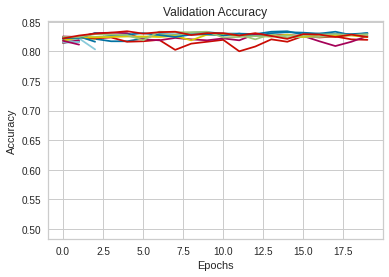

In [ ]:
[d.val_acc.plot() for d in dataframe.values()]
plt.title(f'Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.savefig('validation_accuracy' + '.png')
plt.show()

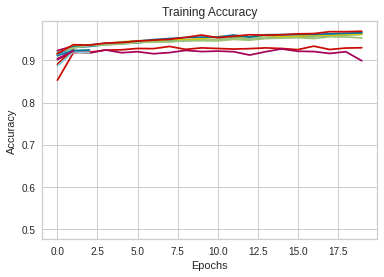

In [ ]:
[d.train_acc.plot() for d in dataframe.values()]
plt.title(f'Training Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.savefig('training_accuracy' + '.png')
plt.show()

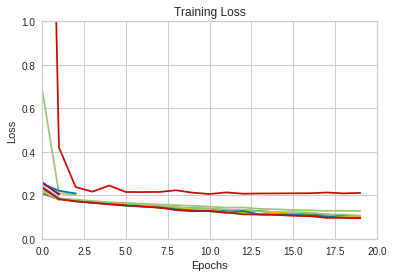

In [ ]:
[d.train_loss.plot() for d in dataframe.values()]
plt.title(f'Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.axis([0, 20, 0, 1])
plt.savefig('train_loss' + '.png')
plt.show()

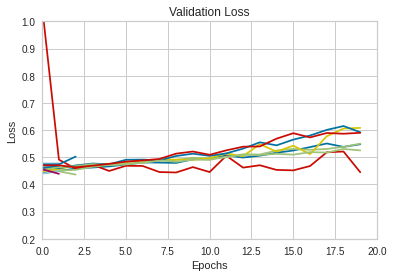

In [ ]:
[d.mean_loss.plot() for d in dataframe.values()]
plt.title(f'Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.axis([0, 20, 0.2, 1])
plt.savefig('validation_loss' + '.png')
plt.show()

In [ ]:
print(f'Best config for validation accuracy: {analysis.get_best_config(metric="val_acc", mode="max")} with value: {analysis.get_best_config(metric="val_acc", mode="max")}')
print(f'Best config for validation loss: {analysis.get_best_config(metric="mean_loss", mode="min")}')

print(f'Best config for training accuracy: {analysis.get_best_config(metric="train_acc", mode="max")}')
print(f'Best config for training loss: {analysis.get_best_config(metric="train_loss", mode="min")}')

Best config for validation accuracy: {'batch_size': 64, 'fc_drouput': 0.0, 'input_size': 768, 'lr': 0.001, 'lstm_dropout': 0.0, 'lstm_hidden_size': 32, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 0.0} with value: {'batch_size': 64, 'fc_drouput': 0.0, 'input_size': 768, 'lr': 0.001, 'lstm_dropout': 0.0, 'lstm_hidden_size': 32, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 0.0}
Best config for validation loss: {'batch_size': 32, 'fc_drouput': 0.10559468071018108, 'input_size': 768, 'lr': 0.003070658360470661, 'lstm_dropout': 0.10292872041797652, 'lstm_hidden_size': 256, 'lstm_layers': 2, 'nn_layers': 512, 'weight_decay': 7.514561559707385e-06}
Best config for training accuracy: {'batch_size': 64, 'fc_drouput': 0.4199734726484282, 'input_size': 768, 'lr': 0.00010195684876450086, 'lstm_dropout': 0.07933907880252777, 'lstm_hidden_size': 256, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 9.168822746917103e-06}
Best config for training loss: {'batch_size': 64, 'fc_drouput'

In [ ]:
augmented_optimizer = Optimizer(x_train=accounts_h_train_augmented, y_train=y_augmented, x_val=accounts_h_val_norm,
                 y_val=y_val, embedding=embedding, 
                 preprocessor=0, vocab = 10000,
                 embedding_dim=50, epochs=100)

In [ ]:
space = {
    'input_size': hp.choice('input_size', [32]),
    'lr': hp.loguniform('lr', np.log(0.0001), np.log(0.2)),
    'lstm_hidden_size': hp.choice('lstm_hidden_size', [32, 64, 128, 256]),
    'lstm_layers': hp.choice('lstm_layers', [1, 2]),
    'batch_size': hp.choice('batch_size', [32, 64]),
    'nn_layers': hp.choice('nn_layers', [32, 64, 128, 256]),
    'lstm_dropout': hp.uniform('lstm_dropout', 0.0, 0.5),
    'fc_drouput': hp.uniform('fc_drouput', 0.0, 0.5),
    'weight_decay': hp.uniform('weight_decay', 0.0, 0.1)
    }
current_best_params = [
{
    'input_size': 32,
    'lr': 0.001,
    'lstm_hidden_size': 32,
    'lstm_layers': 2,
    'batch_size': 64,
    'nn_layers': 128,
    'lstm_dropout':0,
    'fc_drouput':0,
    'weight_decay': 0
}]

analysis, dataframe = augmented_optimizer.optimize(space, current_best_params, trials = 30, optimizeTweetClassifier=False, lengths=lengths)

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_3b8040d2,PENDING,,64,0,32,0.001,0,32,2,128,0


(pid=776) 2021-05-27 11:32:37.289685: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


(pid=776) Reading twitter - 1grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_3b8040d2,RUNNING,,64,0,32,0.001,0,32,2,128,0
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211


(pid=776) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay
create_account_classifier_3b8040d2,RUNNING,,64,0,32,0.001,0,32,2,128,0
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211


(pid=776) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=776)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=776) Using GPU...
(pid=776) AccountClassifier(
(pid=776)   (lstm): LSTM(32, 32, num_layers=2, bidirectional=True)
(pid=776)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=776)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=776)   (dropout): Dropout(p=0.0, inplace=False)
(pid=776) )
(pid=776) Using GPU...
(pid=776) Starting to train the model
(pid=776) Training epoch 0
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-33-02
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.55108646549798
  neg_mean_loss: -0.55108646549798
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 15.540735721588135
  time_this_iter_s: 15.540735721588135
  time_total_s: 15.540735721588135
  timestamp: 1622115182
  timesteps_since_restore: 0
  train_acc: 0.5657407407407408
  train_loss: 0.6511285340344465
  training_iteration: 1
  trial_id: 3b8040d2

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.551086,1,15.5407,100,0.718548,0.565741
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 0 Training loss: 0.6511285340344465 Training Accuracy 0.5657407407407408 Validation Accuracy: 0.7185483870967742, Validation loss: 0.55108646549798
(pid=776) Re-setting early stopping
(pid=776) Training epoch 1
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-33-12
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.5432796705468659
  neg_mean_loss: -0.5432796705468659
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 25.67216157913208
  time_this_iter_s: 10.131425857543945
  time_total_s: 25.67216157913208
  timestamp: 1622115192
  timesteps_since_restore: 0
  train_acc: 0.569212962962963
  train_loss: 0.6374971857777348
  training_iteration: 2
  trial_id: 3b8040d2
  val_acc: 0.7524193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.54328,2,25.6722,100,0.752419,0.569213
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 1 Training loss: 0.6374971857777348 Training Accuracy 0.569212962962963 Validation Accuracy: 0.7524193548387097, Validation loss: 0.5432796705468659
(pid=776) Re-setting early stopping
(pid=776) Training epoch 2
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-33-22
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.4664826290706368
  neg_mean_loss: -0.4664826290706368
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 35.81374144554138
  time_this_iter_s: 10.141579866409302
  time_total_s: 35.81374144554138
  timestamp: 1622115202
  timesteps_since_restore: 0
  train_acc: 0.5928240740740741
  train_loss: 0.6157532299006426
  training_iteration: 3
  trial_id: 3b8040d2
  val_acc: 0.8169354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.466483,3,35.8137,100,0.816935,0.592824
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 2 Training loss: 0.6157532299006426 Training Accuracy 0.5928240740740741 Validation Accuracy: 0.8169354838709677, Validation loss: 0.4664826290706368
(pid=776) Re-setting early stopping
(pid=776) Training epoch 3
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-33-32
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.5970521092833223
  neg_mean_loss: -0.5970521092833223
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 45.9683358669281
  time_this_iter_s: 10.154594421386719
  time_total_s: 45.9683358669281
  timestamp: 1622115212
  timesteps_since_restore: 0
  train_acc: 0.5930555555555556
  train_loss: 0.6154587904612223
  training_iteration: 4
  trial_id: 3b8040d2
  val_acc: 0.5685483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.597052,4,45.9683,100,0.568548,0.593056
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 3 Training loss: 0.6154587904612223 Training Accuracy 0.5930555555555556 Validation Accuracy: 0.5685483870967742, Validation loss: 0.5970521092833223
(pid=776) Possibly early stopping will be neccesary 1
(pid=776) Training epoch 4
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-33-42
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.6085247701139803
  neg_mean_loss: -0.6085247701139803
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 56.05921244621277
  time_this_iter_s: 10.090876579284668
  time_total_s: 56.05921244621277
  timestamp: 1622115222
  timesteps_since_restore: 0
  train_acc: 0.5700231481481481
  train_loss: 0.6380325317382812
  training_iteration: 5
  trial_id: 3b8040d2
  val_acc: 0.5870967741935483
  
(pid=776) Epoch: 4 Training loss: 0.6380325317382812 Training Accuracy 0.5700231481481481 Validation Accuracy: 0.5870967741935483

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.608525,5,56.0592,100,0.587097,0.570023
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 2
(pid=776) Training epoch 5
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-33-52
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.40934373131373186
  neg_mean_loss: -0.40934373131373186
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 66.17678713798523
  time_this_iter_s: 10.117574691772461
  time_total_s: 66.17678713798523
  timestamp: 1622115232
  timesteps_since_restore: 0
  train_acc: 0.5825231481481481
  train_loss: 0.6182026311203286
  training_iteration: 6
  trial_id: 3b8040d2
  val_acc: 0.8516129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.409344,6,66.1768,100,0.851613,0.582523
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 5 Training loss: 0.6182026311203286 Training Accuracy 0.5825231481481481 Validation Accuracy: 0.8516129032258064, Validation loss: 0.40934373131373186
(pid=776) Re-setting early stopping
(pid=776) Training epoch 6
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-34-02
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.5128885422329613
  neg_mean_loss: -0.5128885422329613
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 76.24967050552368
  time_this_iter_s: 10.072883367538452
  time_total_s: 76.24967050552368
  timestamp: 1622115242
  timesteps_since_restore: 0
  train_acc: 0.5693287037037037
  train_loss: 0.6386235764733067
  training_iteration: 7
  trial_id: 3b8040d2
  val_acc: 0.7637096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.512889,7,76.2497,100,0.76371,0.569329
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 6 Training loss: 0.6386235764733067 Training Accuracy 0.5693287037037037 Validation Accuracy: 0.7637096774193548, Validation loss: 0.5128885422329613
(pid=776) Possibly early stopping will be neccesary 1
(pid=776) Training epoch 7
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-34-13
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.431248855363098
  neg_mean_loss: -0.431248855363098
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 86.34036326408386
  time_this_iter_s: 10.09069275856018
  time_total_s: 86.34036326408386
  timestamp: 1622115253
  timesteps_since_restore: 0
  train_acc: 0.5936342592592593
  train_loss: 0.6104161986598262
  training_iteration: 8
  trial_id: 3b8040d2
  val_acc: 0.8362903225806452
  
(pid=776) Epoch: 7 Training loss: 0.6104161986598262 Training Accuracy 0.5936342592592593 Validation Accuracy: 0.8362903225806452, V

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.431249,8,86.3404,100,0.83629,0.593634
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 2
(pid=776) Training epoch 8
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-34-23
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.396778160624025
  neg_mean_loss: -0.396778160624025
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 96.45832896232605
  time_this_iter_s: 10.117965698242188
  time_total_s: 96.45832896232605
  timestamp: 1622115263
  timesteps_since_restore: 0
  train_acc: 0.6239583333333333
  train_loss: 0.5776613372343558
  training_iteration: 9
  trial_id: 3b8040d2
  val_acc: 0.8475806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.396778,9,96.4583,100,0.847581,0.623958
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 8 Training loss: 0.5776613372343558 Training Accuracy 0.6239583333333333 Validation Accuracy: 0.8475806451612903, Validation loss: 0.396778160624025
(pid=776) Re-setting early stopping
(pid=776) Training epoch 9
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-34-33
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.38699602466155875
  neg_mean_loss: -0.38699602466155875
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 106.63271379470825
  time_this_iter_s: 10.174384832382202
  time_total_s: 106.63271379470825
  timestamp: 1622115273
  timesteps_since_restore: 0
  train_acc: 0.6251157407407407
  train_loss: 0.5720415353775025
  training_iteration: 10
  trial_id: 3b8040d2
  val_acc: 0.8524193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.386996,10,106.633,100,0.852419,0.625116
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 9 Training loss: 0.5720415353775025 Training Accuracy 0.6251157407407407 Validation Accuracy: 0.8524193548387097, Validation loss: 0.38699602466155875
(pid=776) Re-setting early stopping
(pid=776) Training epoch 10
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-34-43
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.4132090200771066
  neg_mean_loss: -0.4132090200771066
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 116.68800473213196
  time_this_iter_s: 10.055290937423706
  time_total_s: 116.68800473213196
  timestamp: 1622115283
  timesteps_since_restore: 0
  train_acc: 0.6212962962962963
  train_loss: 0.5739972410378633
  training_iteration: 11
  trial_id: 3b8040d2
  val_acc: 0.8475806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.413209,11,116.688,100,0.847581,0.621296
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 10 Training loss: 0.5739972410378633 Training Accuracy 0.6212962962962963 Validation Accuracy: 0.8475806451612903, Validation loss: 0.4132090200771066
(pid=776) Possibly early stopping will be neccesary 1
(pid=776) Training epoch 11
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-34-53
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.36820484320965613
  neg_mean_loss: -0.36820484320965613
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 126.83290696144104
  time_this_iter_s: 10.144902229309082
  time_total_s: 126.83290696144104
  timestamp: 1622115293
  timesteps_since_restore: 0
  train_acc: 0.6247685185185186
  train_loss: 0.5667990552054512
  training_iteration: 12
  trial_id: 3b8040d2
  val_acc: 0.8604838709677419
  
(pid=776) Epoch: 11 Training loss: 0.5667990552054512 Training Accuracy 0.6247685185185186 Validation Accuracy: 0.8604838

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.368205,12,126.833,100,0.860484,0.624769
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Re-setting early stopping
(pid=776) Training epoch 12
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-35-03
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.36657751152624524
  neg_mean_loss: -0.36657751152624524
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 136.92636132240295
  time_this_iter_s: 10.093454360961914
  time_total_s: 136.92636132240295
  timestamp: 1622115303
  timesteps_since_restore: 0
  train_acc: 0.6265046296296296
  train_loss: 0.5605630724518388
  training_iteration: 13
  trial_id: 3b8040d2
  val_acc: 0.8604838709677419
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.366578,13,136.926,100,0.860484,0.626505
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 12 Training loss: 0.5605630724518388 Training Accuracy 0.6265046296296296 Validation Accuracy: 0.8604838709677419, Validation loss: 0.36657751152624524
(pid=776) Re-setting early stopping
(pid=776) Training epoch 13
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-35-13
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.38222064575884346
  neg_mean_loss: -0.38222064575884346
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 147.08622193336487
  time_this_iter_s: 10.159860610961914
  time_total_s: 147.08622193336487
  timestamp: 1622115313
  timesteps_since_restore: 0
  train_acc: 0.6284722222222222
  train_loss: 0.5574479118541434
  training_iteration: 14
  trial_id: 3b8040d2
  val_acc: 0.8612903225806452
  
(pid=776) Epoch: 13 Training loss: 0.5574479118541434 Training Accuracy 0.6284722222222222 Validation Accuracy: 0.8612903225806452, Valida

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.382221,14,147.086,100,0.86129,0.628472
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 1
(pid=776) Training epoch 14
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-35-23
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.35813085037946774
  neg_mean_loss: -0.35813085037946774
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 157.2528395652771
  time_this_iter_s: 10.166617631912231
  time_total_s: 157.2528395652771
  timestamp: 1622115323
  timesteps_since_restore: 0
  train_acc: 0.6283564814814815
  train_loss: 0.5551385241526144
  training_iteration: 15
  trial_id: 3b8040d2
  val_acc: 0.8725806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.358131,15,157.253,100,0.872581,0.628356
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 14 Training loss: 0.5551385241526144 Training Accuracy 0.6283564814814815 Validation Accuracy: 0.8725806451612903, Validation loss: 0.35813085037946774
(pid=776) Re-setting early stopping
(pid=776) Training epoch 15
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-35-34
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.48335784543187005
  neg_mean_loss: -0.48335784543187005
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 167.41804003715515
  time_this_iter_s: 10.165200471878052
  time_total_s: 167.41804003715515
  timestamp: 1622115334
  timesteps_since_restore: 0
  train_acc: 0.5951388888888889
  train_loss: 0.6060006881201708
  training_iteration: 16
  trial_id: 3b8040d2
  val_acc: 0.7806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.483358,16,167.418,100,0.780645,0.595139
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 15 Training loss: 0.6060006881201708 Training Accuracy 0.5951388888888889 Validation Accuracy: 0.7806451612903226, Validation loss: 0.48335784543187005
(pid=776) Possibly early stopping will be neccesary 1
(pid=776) Training epoch 16
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-35-44
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.3823345376847363
  neg_mean_loss: -0.3823345376847363
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 177.5932743549347
  time_this_iter_s: 10.175234317779541
  time_total_s: 177.5932743549347
  timestamp: 1622115344
  timesteps_since_restore: 0
  train_acc: 0.6125
  train_loss: 0.5765243015907429
  training_iteration: 17
  trial_id: 3b8040d2
  val_acc: 0.8540322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.382335,17,177.593,100,0.854032,0.6125
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 16 Training loss: 0.5765243015907429 Training Accuracy 0.6125 Validation Accuracy: 0.8540322580645161, Validation loss: 0.3823345376847363
(pid=776) Possibly early stopping will be neccesary 2
(pid=776) Training epoch 17
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-35-54
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.3720778094695601
  neg_mean_loss: -0.3720778094695601
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 187.70577788352966
  time_this_iter_s: 10.11250352859497
  time_total_s: 187.70577788352966
  timestamp: 1622115354
  timesteps_since_restore: 0
  train_acc: 0.6222222222222222
  train_loss: 0.5597000585661994
  training_iteration: 18
  trial_id: 3b8040d2
  val_acc: 0.8669354838709677
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.372078,18,187.706,100,0.866935,0.622222
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 17 Training loss: 0.5597000585661994 Training Accuracy 0.6222222222222222 Validation Accuracy: 0.8669354838709677, Validation loss: 0.3720778094695601
(pid=776) Possibly early stopping will be neccesary 3
(pid=776) Training epoch 18
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-36-04
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.3704506697248564
  neg_mean_loss: -0.3704506697248564
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 197.78611755371094
  time_this_iter_s: 10.080339670181274
  time_total_s: 197.78611755371094
  timestamp: 1622115364
  timesteps_since_restore: 0
  train_acc: 0.625
  train_loss: 0.5501269823975034
  training_iteration: 19
  trial_id: 3b8040d2
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.370451,19,197.786,100,0.876613,0.625
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 18 Training loss: 0.5501269823975034 Training Accuracy 0.625 Validation Accuracy: 0.8766129032258064, Validation loss: 0.3704506697248564
(pid=776) Possibly early stopping will be neccesary 4
(pid=776) Training epoch 19
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-36-14
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.3685536224559997
  neg_mean_loss: -0.3685536224559997
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 207.93256068229675
  time_this_iter_s: 10.146443128585815
  time_total_s: 207.93256068229675
  timestamp: 1622115374
  timesteps_since_restore: 0
  train_acc: 0.6303240740740741
  train_loss: 0.547049672515304
  training_iteration: 20
  trial_id: 3b8040d2
  val_acc: 0.8637096774193549
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.368554,20,207.933,100,0.86371,0.630324
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 19 Training loss: 0.547049672515304 Training Accuracy 0.6303240740740741 Validation Accuracy: 0.8637096774193549, Validation loss: 0.3685536224559997
(pid=776) Possibly early stopping will be neccesary 5
(pid=776) Training epoch 20
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-36-24
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.3242450095891026
  neg_mean_loss: -0.3242450095891026
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 218.0544295310974
  time_this_iter_s: 10.12186884880066
  time_total_s: 218.0544295310974
  timestamp: 1622115384
  timesteps_since_restore: 0
  train_acc: 0.6328703703703704
  train_loss: 0.5461741321616702
  training_iteration: 21
  trial_id: 3b8040d2
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.324245,21,218.054,100,0.88871,0.63287
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 20 Training loss: 0.5461741321616702 Training Accuracy 0.6328703703703704 Validation Accuracy: 0.8887096774193548, Validation loss: 0.3242450095891026
(pid=776) Re-setting early stopping
(pid=776) Training epoch 21
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-36-35
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.35278273212878086
  neg_mean_loss: -0.35278273212878086
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 228.28907012939453
  time_this_iter_s: 10.23464059829712
  time_total_s: 228.28907012939453
  timestamp: 1622115395
  timesteps_since_restore: 0
  train_acc: 0.6381944444444444
  train_loss: 0.5398507548703088
  training_iteration: 22
  trial_id: 3b8040d2
  val_acc: 0.882258064516129
  
(pid=776) Epoch: 21 Training loss: 0.5398507548703088 Training Accuracy 0.6381944444444444 Validation Accuracy: 0.882258064516129, Validation

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.352783,22,228.289,100,0.882258,0.638194
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 1
(pid=776) Training epoch 22
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-36-45
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.34985512826920634
  neg_mean_loss: -0.34985512826920634
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 238.4820694923401
  time_this_iter_s: 10.192999362945557
  time_total_s: 238.4820694923401
  timestamp: 1622115405
  timesteps_since_restore: 0
  train_acc: 0.6373842592592592
  train_loss: 0.5361110744652925
  training_iteration: 23
  trial_id: 3b8040d2
  val_acc: 0.8790322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.349855,23,238.482,100,0.879032,0.637384
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 22 Training loss: 0.5361110744652925 Training Accuracy 0.6373842592592592 Validation Accuracy: 0.8790322580645161, Validation loss: 0.34985512826920634
(pid=776) Possibly early stopping will be neccesary 2
(pid=776) Training epoch 23
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-36-55
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 0.38123708345829954
  neg_mean_loss: -0.38123708345829954
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 248.65652298927307
  time_this_iter_s: 10.174453496932983
  time_total_s: 248.65652298927307
  timestamp: 1622115415
  timesteps_since_restore: 0
  train_acc: 0.6368055555555555
  train_loss: 0.5328258816842679
  training_iteration: 24
  trial_id: 3b8040d2
  val_acc: 0.8741935483870967
  
(pid=776) Epoch: 23 Training loss: 0.5328258816842679 Training Accuracy 0.6368055555555555 Validation Accuracy: 0.874193

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.381237,24,248.657,100,0.874194,0.636806
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 3
(pid=776) Training epoch 24
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-37-05
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.32614337386030035
  neg_mean_loss: -0.32614337386030035
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 258.8271589279175
  time_this_iter_s: 10.17063593864441
  time_total_s: 258.8271589279175
  timestamp: 1622115425
  timesteps_since_restore: 0
  train_acc: 0.6337962962962963
  train_loss: 0.5328139751045792
  training_iteration: 25
  trial_id: 3b8040d2
  val_acc: 0.885483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.326143,25,258.827,100,0.885484,0.633796
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 24 Training loss: 0.5328139751045792 Training Accuracy 0.6337962962962963 Validation Accuracy: 0.885483870967742, Validation loss: 0.32614337386030035
(pid=776) Possibly early stopping will be neccesary 4
(pid=776) Training epoch 25
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-37-15
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 0.3909169030030122
  neg_mean_loss: -0.3909169030030122
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 268.9937903881073
  time_this_iter_s: 10.16663146018982
  time_total_s: 268.9937903881073
  timestamp: 1622115435
  timesteps_since_restore: 0
  train_acc: 0.6386574074074074
  train_loss: 0.5327241469312597
  training_iteration: 26
  trial_id: 3b8040d2
  val_acc: 0.8580645161290322
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.390917,26,268.994,100,0.858065,0.638657
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 25 Training loss: 0.5327241469312597 Training Accuracy 0.6386574074074074 Validation Accuracy: 0.8580645161290322, Validation loss: 0.3909169030030122
(pid=776) Possibly early stopping will be neccesary 5
(pid=776) Training epoch 26
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-37-25
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 27
  mean_loss: 0.3496106226697234
  neg_mean_loss: -0.3496106226697234
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 279.1887149810791
  time_this_iter_s: 10.194924592971802
  time_total_s: 279.1887149810791
  timestamp: 1622115445
  timesteps_since_restore: 0
  train_acc: 0.6380787037037037
  train_loss: 0.5257729508258678
  training_iteration: 27
  trial_id: 3b8040d2
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.349611,27,279.189,100,0.88871,0.638079
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 26 Training loss: 0.5257729508258678 Training Accuracy 0.6380787037037037 Validation Accuracy: 0.8887096774193548, Validation loss: 0.3496106226697234
(pid=776) Possibly early stopping will be neccesary 6
(pid=776) Training epoch 27
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-37-36
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 28
  mean_loss: 0.38752485802563946
  neg_mean_loss: -0.38752485802563946
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 289.336710691452
  time_this_iter_s: 10.147995710372925
  time_total_s: 289.336710691452
  timestamp: 1622115456
  timesteps_since_restore: 0
  train_acc: 0.6373842592592592
  train_loss: 0.5258757127655878
  training_iteration: 28
  trial_id: 3b8040d2
  val_acc: 0.8580645161290322
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.387525,28,289.337,100,0.858065,0.637384
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 27 Training loss: 0.5258757127655878 Training Accuracy 0.6373842592592592 Validation Accuracy: 0.8580645161290322, Validation loss: 0.38752485802563946
(pid=776) Possibly early stopping will be neccesary 7
(pid=776) Training epoch 28
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-37-46
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 29
  mean_loss: 0.4269315954959991
  neg_mean_loss: -0.4269315954959991
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 299.47308111190796
  time_this_iter_s: 10.136370420455933
  time_total_s: 299.47308111190796
  timestamp: 1622115466
  timesteps_since_restore: 0
  train_acc: 0.6424768518518519
  train_loss: 0.5242072816248293
  training_iteration: 29
  trial_id: 3b8040d2
  val_acc: 0.8370967741935483
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.426932,29,299.473,100,0.837097,0.642477
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 28 Training loss: 0.5242072816248293 Training Accuracy 0.6424768518518519 Validation Accuracy: 0.8370967741935483, Validation loss: 0.4269315954959991
(pid=776) Possibly early stopping will be neccesary 8
(pid=776) Training epoch 29
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-37-56
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 30
  mean_loss: 0.3690375010928479
  neg_mean_loss: -0.3690375010928479
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 309.66233015060425
  time_this_iter_s: 10.189249038696289
  time_total_s: 309.66233015060425
  timestamp: 1622115476
  timesteps_since_restore: 0
  train_acc: 0.6375
  train_loss: 0.5249152234307042
  training_iteration: 30
  trial_id: 3b8040d2
  val_acc: 0.8725806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.369038,30,309.662,100,0.872581,0.6375
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 29 Training loss: 0.5249152234307042 Training Accuracy 0.6375 Validation Accuracy: 0.8725806451612903, Validation loss: 0.3690375010928479
(pid=776) Possibly early stopping will be neccesary 9
(pid=776) Training epoch 30
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-38-06
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 31
  mean_loss: 0.40958981797413496
  neg_mean_loss: -0.40958981797413496
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 319.83327174186707
  time_this_iter_s: 10.170941591262817
  time_total_s: 319.83327174186707
  timestamp: 1622115486
  timesteps_since_restore: 0
  train_acc: 0.6416666666666667
  train_loss: 0.5214449030381662
  training_iteration: 31
  trial_id: 3b8040d2
  val_acc: 0.8693548387096774
  
(pid=776) Epoch: 30 Training loss: 0.5214449030381662 Training Accuracy 0.6416666666666667 Validation Accuracy: 0.8693548387096774, V

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.40959,31,319.833,100,0.869355,0.641667
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 10
(pid=776) Training epoch 31
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-38-16
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 32
  mean_loss: 0.464548754600486
  neg_mean_loss: -0.464548754600486
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 329.9376714229584
  time_this_iter_s: 10.104399681091309
  time_total_s: 329.9376714229584
  timestamp: 1622115496
  timesteps_since_restore: 0
  train_acc: 0.6405092592592593
  train_loss: 0.5194806787702773
  training_iteration: 32
  trial_id: 3b8040d2
  val_acc: 0.8266129032258065
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.464549,32,329.938,100,0.826613,0.640509
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 31 Training loss: 0.5194806787702773 Training Accuracy 0.6405092592592593 Validation Accuracy: 0.8266129032258065, Validation loss: 0.464548754600486
(pid=776) Possibly early stopping will be neccesary 11
(pid=776) Training epoch 32
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-38-26
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 33
  mean_loss: 0.46349926106090295
  neg_mean_loss: -0.46349926106090295
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 340.180038690567
  time_this_iter_s: 10.242367267608643
  time_total_s: 340.180038690567
  timestamp: 1622115506
  timesteps_since_restore: 0
  train_acc: 0.6381944444444444
  train_loss: 0.5171987193602102
  training_iteration: 33
  trial_id: 3b8040d2
  val_acc: 0.832258064516129
  
(pid=776) Epoch: 32 Training loss: 0.5171987193602102 Training Accuracy 0.6381944444444444 Validation Accuracy: 0.832258064516

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.463499,33,340.18,100,0.832258,0.638194
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 12
(pid=776) Training epoch 33
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-38-37
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 34
  mean_loss: 0.48335654795777117
  neg_mean_loss: -0.48335654795777117
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 350.4129111766815
  time_this_iter_s: 10.232872486114502
  time_total_s: 350.4129111766815
  timestamp: 1622115517
  timesteps_since_restore: 0
  train_acc: 0.6424768518518519
  train_loss: 0.5136852149610166
  training_iteration: 34
  trial_id: 3b8040d2
  val_acc: 0.8346774193548387
  
(pid=776) Epoch: 33 Training loss: 0.5136852149610166 Training Accuracy 0.6424768518518519 Validation Accuracy: 0.8346774193548387, Validation loss: 0.48335654795777117


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.483357,34,350.413,100,0.834677,0.642477
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 13
(pid=776) Training epoch 34
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-38-47
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 35
  mean_loss: 0.3923593177428925
  neg_mean_loss: -0.3923593177428925
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 360.6318106651306
  time_this_iter_s: 10.218899488449097
  time_total_s: 360.6318106651306
  timestamp: 1622115527
  timesteps_since_restore: 0
  train_acc: 0.6399305555555556
  train_loss: 0.5158379113232648
  training_iteration: 35
  trial_id: 3b8040d2
  val_acc: 0.8814516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.392359,35,360.632,100,0.881452,0.639931
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 34 Training loss: 0.5158379113232648 Training Accuracy 0.6399305555555556 Validation Accuracy: 0.8814516129032258, Validation loss: 0.3923593177428925
(pid=776) Possibly early stopping will be neccesary 14
(pid=776) Training epoch 35
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-38-57
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 36
  mean_loss: 0.40890358057438986
  neg_mean_loss: -0.40890358057438986
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 370.85684037208557
  time_this_iter_s: 10.225029706954956
  time_total_s: 370.85684037208557
  timestamp: 1622115537
  timesteps_since_restore: 0
  train_acc: 0.6447916666666667
  train_loss: 0.512261505259408
  training_iteration: 36
  trial_id: 3b8040d2
  val_acc: 0.8741935483870967
  
(pid=776) Epoch: 35 Training loss: 0.512261505259408 Training Accuracy 0.6447916666666667 Validation Accuracy: 0.87419354

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.408904,36,370.857,100,0.874194,0.644792
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Possibly early stopping will be neccesary 15
(pid=776) Training epoch 36
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-39-07
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 37
  mean_loss: 0.3814095095709096
  neg_mean_loss: -0.3814095095709096
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 381.03157472610474
  time_this_iter_s: 10.174734354019165
  time_total_s: 381.03157472610474
  timestamp: 1622115547
  timesteps_since_restore: 0
  train_acc: 0.6447916666666667
  train_loss: 0.5138430635134379
  training_iteration: 37
  trial_id: 3b8040d2
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.38141,37,381.032,100,0.88871,0.644792
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 36 Training loss: 0.5138430635134379 Training Accuracy 0.6447916666666667 Validation Accuracy: 0.8887096774193548, Validation loss: 0.3814095095709096
(pid=776) Possibly early stopping will be neccesary 16
(pid=776) Training epoch 37
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-39-17
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 38
  mean_loss: 0.3878001499992468
  neg_mean_loss: -0.3878001499992468
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 391.079514503479
  time_this_iter_s: 10.047939777374268
  time_total_s: 391.079514503479
  timestamp: 1622115557
  timesteps_since_restore: 0
  train_acc: 0.6431712962962963
  train_loss: 0.5108636087841458
  training_iteration: 38
  trial_id: 3b8040d2
  val_acc: 0.8903225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.3878,38,391.08,100,0.890323,0.643171
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 37 Training loss: 0.5108636087841458 Training Accuracy 0.6431712962962963 Validation Accuracy: 0.8903225806451613, Validation loss: 0.3878001499992468
(pid=776) Possibly early stopping will be neccesary 17
(pid=776) Training epoch 38
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-39-28
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 39
  mean_loss: 0.4202161283615121
  neg_mean_loss: -0.4202161283615121
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 401.3135464191437
  time_this_iter_s: 10.234031915664673
  time_total_s: 401.3135464191437
  timestamp: 1622115568
  timesteps_since_restore: 0
  train_acc: 0.6454861111111111
  train_loss: 0.5092507307176237
  training_iteration: 39
  trial_id: 3b8040d2
  val_acc: 0.8814516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.420216,39,401.314,100,0.881452,0.645486
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 38 Training loss: 0.5092507307176237 Training Accuracy 0.6454861111111111 Validation Accuracy: 0.8814516129032258, Validation loss: 0.4202161283615121
(pid=776) Possibly early stopping will be neccesary 18
(pid=776) Training epoch 39
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-39-38
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 40
  mean_loss: 0.43638929359901335
  neg_mean_loss: -0.43638929359901335
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 411.4917576313019
  time_this_iter_s: 10.178211212158203
  time_total_s: 411.4917576313019
  timestamp: 1622115578
  timesteps_since_restore: 0
  train_acc: 0.6431712962962963
  train_loss: 0.5113337618333322
  training_iteration: 40
  trial_id: 3b8040d2
  val_acc: 0.8733870967741936
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.436389,40,411.492,100,0.873387,0.643171
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 39 Training loss: 0.5113337618333322 Training Accuracy 0.6431712962962963 Validation Accuracy: 0.8733870967741936, Validation loss: 0.43638929359901335
(pid=776) Possibly early stopping will be neccesary 19
(pid=776) Training epoch 40
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-39-48
  done: false
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 41
  mean_loss: 0.4073749836751688
  neg_mean_loss: -0.4073749836751688
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 421.6322364807129
  time_this_iter_s: 10.14047884941101
  time_total_s: 421.6322364807129
  timestamp: 1622115588
  timesteps_since_restore: 0
  train_acc: 0.6427083333333333
  train_loss: 0.509025823186945
  training_iteration: 41
  trial_id: 3b8040d2
  val_acc: 0.8879032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,RUNNING,172.28.0.2:776,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,PENDING,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,,,,,,


(pid=776) Epoch: 40 Training loss: 0.509025823186945 Training Accuracy 0.6427083333333333 Validation Accuracy: 0.8879032258064516, Validation loss: 0.4073749836751688
(pid=776) Possibly early stopping will be neccesary 20
(pid=776) Early stopping
(pid=776) <Figure size 640x480 with 1 Axes>
(pid=776) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_3b8040d2:
  date: 2021-05-27_11-39-48
  done: true
  experiment_id: 3ff4cf0b5502438d9cb255b51777eca6
  experiment_tag: 1_batch_size=64,fc_drouput=0.0,input_size=32,lr=0.001,lstm_dropout=0.0,lstm_hidden_size=32,lstm_layers=2,nn_layers=128,weight_decay=0.0
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 41
  mean_loss: 0.4073749836751688
  neg_mean_loss: -0.4073749836751688
  node_ip: 172.28.0.2
  pid: 776
  time_since_restore: 421.6322364807129
  time_this_iter_s: 10.14047884941101
  time_total_s: 421.6322364807129
  timestamp: 1622115588
  timesteps_since_restore: 0
  train_acc: 0.6427083333333333


(pid=776) Error in atexit._run_exitfuncs:
(pid=776) Traceback (most recent call last):
(pid=776)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=776)     self._writeout_input_cache(conn)
(pid=776)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=776)     (self.session_number,)+line)
(pid=776) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140096017311488 and this is thread id 140109023500160.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=935) 2021-05-27 11:39:53.197577: I tensorfl

(pid=935) Reading twitter - 1grams ...
(pid=935) Reading twitter - 2grams ...


(pid=935) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=935)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=935) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.02313060408321782 and num_layers=1
(pid=935)   "num_layers={}".format(dropout, num_layers))


(pid=935) Using GPU...
(pid=935) AccountClassifier(
(pid=935)   (lstm): LSTM(32, 128, dropout=0.02313060408321782, bidirectional=True)
(pid=935)   (fc1): Linear(in_features=256, out_features=256, bias=True)
(pid=935)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=935)   (dropout): Dropout(p=0.19298928634066181, inplace=False)
(pid=935) )
(pid=935) Using GPU...
(pid=935) Starting to train the model
(pid=935) Training epoch 0
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-40-15
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4883555862928193
  neg_mean_loss: -0.4883555862928193
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 12.608607292175293
  time_this_iter_s: 12.608607292175293
  time_total_s: 12.608607292175293
  timestamp: 1622115615
  timesteps_since_restore: 0
  train_acc: 0.5547453703703704
  train_loss: 0.6667380955484178
  train

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.488356,1,12.6086,100,0.775806,0.554745
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-40-22
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.3834039100317187
  neg_mean_loss: -0.3834039100317187
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 20.090403079986572
  time_this_iter_s: 7.481795787811279
  time_total_s: 20.090403079986572
  timestamp: 1622115622
  timesteps_since_restore: 0
  train_acc: 0.5969907407407408
  train_loss: 0.6059591817635077
  training_iteration: 2
  trial_id: 3bb16f36
  val_acc: 0.8516129032258064
  
(pid=935) Epoch: 1 Training loss: 0.6059591817635077 Training Accuracy 0.5969907407407408 Validation Accuracy: 0.8516129032258064, Validation loss: 0.3834039100317187


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.383404,2,20.0904,100,0.851613,0.596991
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Re-setting early stopping
(pid=935) Training epoch 2
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-40-30
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.3733499072222898
  neg_mean_loss: -0.3733499072222898
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 27.505356788635254
  time_this_iter_s: 7.414953708648682
  time_total_s: 27.505356788635254
  timestamp: 1622115630
  timesteps_since_restore: 0
  train_acc: 0.6155092592592593
  train_loss: 0.5796519111703944
  training_iteration: 3
  trial_id: 3bb16f36
  val_acc: 0.8564516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.37335,3,27.5054,100,0.856452,0.615509
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 2 Training loss: 0.5796519111703944 Training Accuracy 0.6155092592592593 Validation Accuracy: 0.8564516129032258, Validation loss: 0.3733499072222898
(pid=935) Re-setting early stopping
(pid=935) Training epoch 3
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-40-37
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.3759071365746891
  neg_mean_loss: -0.3759071365746891
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 34.94541311264038
  time_this_iter_s: 7.440056324005127
  time_total_s: 34.94541311264038
  timestamp: 1622115637
  timesteps_since_restore: 0
  train_acc: 0.6199074074074075
  train_loss: 0.5700264352339285
  training_iteration: 4
  trial_id: 3bb16f36
  val_acc: 0.8596774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.375907,4,34.9454,100,0.859677,0.619907
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 3 Training loss: 0.5700264352339285 Training Accuracy 0.6199074074074075 Validation Accuracy: 0.8596774193548387, Validation loss: 0.3759071365746891
(pid=935) Possibly early stopping will be neccesary 1
(pid=935) Training epoch 4
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-40-44
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.34442644974257
  neg_mean_loss: -0.34442644974257
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 42.33900475502014
  time_this_iter_s: 7.393591642379761
  time_total_s: 42.33900475502014
  timestamp: 1622115644
  timesteps_since_restore: 0
  train_acc: 0.6217592592592592
  train_loss: 0.5619345319491845
  training_iteration: 5
  trial_id: 3bb16f36
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.344426,5,42.339,100,0.877419,0.621759
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 4 Training loss: 0.5619345319491845 Training Accuracy 0.6217592592592592 Validation Accuracy: 0.8774193548387097, Validation loss: 0.34442644974257
(pid=935) Re-setting early stopping
(pid=935) Training epoch 5
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-40-52
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.36907458922476677
  neg_mean_loss: -0.36907458922476677
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 49.786768674850464
  time_this_iter_s: 7.447763919830322
  time_total_s: 49.786768674850464
  timestamp: 1622115652
  timesteps_since_restore: 0
  train_acc: 0.6324074074074074
  train_loss: 0.5552012197397374
  training_iteration: 6
  trial_id: 3bb16f36
  val_acc: 0.8838709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.369075,6,49.7868,100,0.883871,0.632407
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 5 Training loss: 0.5552012197397374 Training Accuracy 0.6324074074074074 Validation Accuracy: 0.8838709677419355, Validation loss: 0.36907458922476677
(pid=935) Possibly early stopping will be neccesary 1
(pid=935) Training epoch 6
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-40-59
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.3839979803252759
  neg_mean_loss: -0.3839979803252759
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 57.19629168510437
  time_this_iter_s: 7.409523010253906
  time_total_s: 57.19629168510437
  timestamp: 1622115659
  timesteps_since_restore: 0
  train_acc: 0.625
  train_loss: 0.561514115664694
  training_iteration: 7
  trial_id: 3bb16f36
  val_acc: 0.8701612903225806
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.383998,7,57.1963,100,0.870161,0.625
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 6 Training loss: 0.561514115664694 Training Accuracy 0.625 Validation Accuracy: 0.8701612903225806, Validation loss: 0.3839979803252759
(pid=935) Possibly early stopping will be neccesary 2
(pid=935) Training epoch 7
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-41-07
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.384521623939889
  neg_mean_loss: -0.384521623939889
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 64.61102390289307
  time_this_iter_s: 7.414732217788696
  time_total_s: 64.61102390289307
  timestamp: 1622115667
  timesteps_since_restore: 0
  train_acc: 0.6331018518518519
  train_loss: 0.5484482403154727
  training_iteration: 8
  trial_id: 3bb16f36
  val_acc: 0.8798387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.384522,8,64.611,100,0.879839,0.633102
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 7 Training loss: 0.5484482403154727 Training Accuracy 0.6331018518518519 Validation Accuracy: 0.8798387096774194, Validation loss: 0.384521623939889
(pid=935) Possibly early stopping will be neccesary 3
(pid=935) Training epoch 8
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-41-14
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.40993559347994163
  neg_mean_loss: -0.40993559347994163
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 72.07824897766113
  time_this_iter_s: 7.467225074768066
  time_total_s: 72.07824897766113
  timestamp: 1622115674
  timesteps_since_restore: 0
  train_acc: 0.6370370370370371
  train_loss: 0.5414495453790382
  training_iteration: 9
  trial_id: 3bb16f36
  val_acc: 0.8782258064516129
  
(pid=935) Epoch: 8 Training loss: 0.5414495453790382 Training Accuracy 0.6370370370370371 Validation Accuracy: 0.8782258064516129

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.409936,9,72.0782,100,0.878226,0.637037
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Possibly early stopping will be neccesary 4
(pid=935) Training epoch 9
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-41-22
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.4267848904323324
  neg_mean_loss: -0.4267848904323324
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 79.5532021522522
  time_this_iter_s: 7.4749531745910645
  time_total_s: 79.5532021522522
  timestamp: 1622115682
  timesteps_since_restore: 0
  train_acc: 0.6387731481481481
  train_loss: 0.534461670782831
  training_iteration: 10
  trial_id: 3bb16f36
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.426785,10,79.5532,100,0.876613,0.638773
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 9 Training loss: 0.534461670782831 Training Accuracy 0.6387731481481481 Validation Accuracy: 0.8766129032258064, Validation loss: 0.4267848904323324
(pid=935) Possibly early stopping will be neccesary 5
(pid=935) Training epoch 10
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-41-30
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.4705775857258721
  neg_mean_loss: -0.4705775857258721
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 87.88108015060425
  time_this_iter_s: 8.32787799835205
  time_total_s: 87.88108015060425
  timestamp: 1622115690
  timesteps_since_restore: 0
  train_acc: 0.6336805555555556
  train_loss: 0.5348395082685683
  training_iteration: 11
  trial_id: 3bb16f36
  val_acc: 0.8693548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.470578,11,87.8811,100,0.869355,0.633681
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 10 Training loss: 0.5348395082685683 Training Accuracy 0.6336805555555556 Validation Accuracy: 0.8693548387096774, Validation loss: 0.4705775857258721
(pid=935) Possibly early stopping will be neccesary 6
(pid=935) Training epoch 11
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-41-37
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.4377510481493823
  neg_mean_loss: -0.4377510481493823
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 95.3165533542633
  time_this_iter_s: 7.435473203659058
  time_total_s: 95.3165533542633
  timestamp: 1622115697
  timesteps_since_restore: 0
  train_acc: 0.6413194444444444
  train_loss: 0.5262609901251616
  training_iteration: 12
  trial_id: 3bb16f36
  val_acc: 0.885483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.437751,12,95.3166,100,0.885484,0.641319
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 11 Training loss: 0.5262609901251616 Training Accuracy 0.6413194444444444 Validation Accuracy: 0.885483870967742, Validation loss: 0.4377510481493823
(pid=935) Possibly early stopping will be neccesary 7
(pid=935) Training epoch 12
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-41-45
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.663783681508288
  neg_mean_loss: -0.663783681508288
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 102.80179286003113
  time_this_iter_s: 7.485239505767822
  time_total_s: 102.80179286003113
  timestamp: 1622115705
  timesteps_since_restore: 0
  train_acc: 0.6400462962962963
  train_loss: 0.5211291805461601
  training_iteration: 13
  trial_id: 3bb16f36
  val_acc: 0.8741935483870967
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.663784,13,102.802,100,0.874194,0.640046
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 12 Training loss: 0.5211291805461601 Training Accuracy 0.6400462962962963 Validation Accuracy: 0.8741935483870967, Validation loss: 0.663783681508288
(pid=935) Possibly early stopping will be neccesary 8
(pid=935) Training epoch 13
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-41-52
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.8252534872158644
  neg_mean_loss: -0.8252534872158644
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 110.21412873268127
  time_this_iter_s: 7.4123358726501465
  time_total_s: 110.21412873268127
  timestamp: 1622115712
  timesteps_since_restore: 0
  train_acc: 0.6409722222222223
  train_loss: 0.5133856671827811
  training_iteration: 14
  trial_id: 3bb16f36
  val_acc: 0.8629032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.825253,14,110.214,100,0.862903,0.640972
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 13 Training loss: 0.5133856671827811 Training Accuracy 0.6409722222222223 Validation Accuracy: 0.8629032258064516, Validation loss: 0.8252534872158644
(pid=935) Possibly early stopping will be neccesary 9
(pid=935) Training epoch 14
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-00
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5664025005831819
  neg_mean_loss: -0.5664025005831819
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 117.67939853668213
  time_this_iter_s: 7.4652698040008545
  time_total_s: 117.67939853668213
  timestamp: 1622115720
  timesteps_since_restore: 0
  train_acc: 0.6446759259259259
  train_loss: 0.5322450513089144
  training_iteration: 15
  trial_id: 3bb16f36
  val_acc: 0.8725806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.566403,15,117.679,100,0.872581,0.644676
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 14 Training loss: 0.5322450513089144 Training Accuracy 0.6446759259259259 Validation Accuracy: 0.8725806451612903, Validation loss: 0.5664025005831819
(pid=935) Possibly early stopping will be neccesary 10
(pid=935) Training epoch 15
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-07
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.6154612772938907
  neg_mean_loss: -0.6154612772938907
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 125.08550333976746
  time_this_iter_s: 7.406104803085327
  time_total_s: 125.08550333976746
  timestamp: 1622115727
  timesteps_since_restore: 0
  train_acc: 0.6414351851851852
  train_loss: 0.5143714411391153
  training_iteration: 16
  trial_id: 3bb16f36
  val_acc: 0.8661290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.615461,16,125.086,100,0.866129,0.641435
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 15 Training loss: 0.5143714411391153 Training Accuracy 0.6414351851851852 Validation Accuracy: 0.8661290322580645, Validation loss: 0.6154612772938907
(pid=935) Possibly early stopping will be neccesary 11
(pid=935) Training epoch 16
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-15
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.45812641665577103
  neg_mean_loss: -0.45812641665577103
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 132.4774796962738
  time_this_iter_s: 7.391976356506348
  time_total_s: 132.4774796962738
  timestamp: 1622115735
  timesteps_since_restore: 0
  train_acc: 0.6442129629629629
  train_loss: 0.529074047561045
  training_iteration: 17
  trial_id: 3bb16f36
  val_acc: 0.8895161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.458126,17,132.477,100,0.889516,0.644213
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 16 Training loss: 0.529074047561045 Training Accuracy 0.6442129629629629 Validation Accuracy: 0.8895161290322581, Validation loss: 0.45812641665577103
(pid=935) Possibly early stopping will be neccesary 12
(pid=935) Training epoch 17
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-22
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.4177333187792079
  neg_mean_loss: -0.4177333187792079
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 139.92319321632385
  time_this_iter_s: 7.445713520050049
  time_total_s: 139.92319321632385
  timestamp: 1622115742
  timesteps_since_restore: 0
  train_acc: 0.6398148148148148
  train_loss: 0.5176347747997001
  training_iteration: 18
  trial_id: 3bb16f36
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.417733,18,139.923,100,0.878226,0.639815
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 17 Training loss: 0.5176347747997001 Training Accuracy 0.6398148148148148 Validation Accuracy: 0.8782258064516129, Validation loss: 0.4177333187792079
(pid=935) Possibly early stopping will be neccesary 13
(pid=935) Training epoch 18
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-30
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.6006352595854606
  neg_mean_loss: -0.6006352595854606
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 147.37854719161987
  time_this_iter_s: 7.4553539752960205
  time_total_s: 147.37854719161987
  timestamp: 1622115750
  timesteps_since_restore: 0
  train_acc: 0.6444444444444445
  train_loss: 0.5135389741924073
  training_iteration: 19
  trial_id: 3bb16f36
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.600635,19,147.379,100,0.875806,0.644444
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 18 Training loss: 0.5135389741924073 Training Accuracy 0.6444444444444445 Validation Accuracy: 0.8758064516129033, Validation loss: 0.6006352595854606
(pid=935) Possibly early stopping will be neccesary 14
(pid=935) Training epoch 19
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-37
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.8132148460260924
  neg_mean_loss: -0.8132148460260924
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 154.82971358299255
  time_this_iter_s: 7.451166391372681
  time_total_s: 154.82971358299255
  timestamp: 1622115757
  timesteps_since_restore: 0
  train_acc: 0.6450231481481481
  train_loss: 0.5053933107190662
  training_iteration: 20
  trial_id: 3bb16f36
  val_acc: 0.8653225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.813215,20,154.83,100,0.865323,0.645023
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 19 Training loss: 0.5053933107190662 Training Accuracy 0.6450231481481481 Validation Accuracy: 0.8653225806451613, Validation loss: 0.8132148460260924
(pid=935) Possibly early stopping will be neccesary 15
(pid=935) Training epoch 20
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-44
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.7325565449822382
  neg_mean_loss: -0.7325565449822382
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 162.25063300132751
  time_this_iter_s: 7.420919418334961
  time_total_s: 162.25063300132751
  timestamp: 1622115764
  timesteps_since_restore: 0
  train_acc: 0.6427083333333333
  train_loss: 0.5104287245759258
  training_iteration: 21
  trial_id: 3bb16f36
  val_acc: 0.8459677419354839
  
(pid=935) Epoch: 20 Training loss: 0.5104287245759258 Training Accuracy 0.6427083333333333 Validation Accuracy: 0.845967741

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.732557,21,162.251,100,0.845968,0.642708
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Possibly early stopping will be neccesary 16
(pid=935) Training epoch 21
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-52
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.7705093777333856
  neg_mean_loss: -0.7705093777333856
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 169.69467186927795
  time_this_iter_s: 7.4440388679504395
  time_total_s: 169.69467186927795
  timestamp: 1622115772
  timesteps_since_restore: 0
  train_acc: 0.6439814814814815
  train_loss: 0.5071771698969382
  training_iteration: 22
  trial_id: 3bb16f36
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.770509,22,169.695,100,0.876613,0.643981
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 21 Training loss: 0.5071771698969382 Training Accuracy 0.6439814814814815 Validation Accuracy: 0.8766129032258064, Validation loss: 0.7705093777333856
(pid=935) Possibly early stopping will be neccesary 17
(pid=935) Training epoch 22
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-42-59
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.778452964014051
  neg_mean_loss: -0.778452964014051
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 177.10763835906982
  time_this_iter_s: 7.41296648979187
  time_total_s: 177.10763835906982
  timestamp: 1622115779
  timesteps_since_restore: 0
  train_acc: 0.6503472222222222
  train_loss: 0.5007870553820222
  training_iteration: 23
  trial_id: 3bb16f36
  val_acc: 0.8741935483870967
  
(pid=935) Epoch: 22 Training loss: 0.5007870553820222 Training Accuracy 0.6503472222222222 Validation Accuracy: 0.874193548387

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.778453,23,177.108,100,0.874194,0.650347
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-43-07
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 0.8359924816417814
  neg_mean_loss: -0.8359924816417814
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 184.57596373558044
  time_this_iter_s: 7.46832537651062
  time_total_s: 184.57596373558044
  timestamp: 1622115787
  timesteps_since_restore: 0
  train_acc: 0.6457175925925925
  train_loss: 0.497570029452995
  training_iteration: 24
  trial_id: 3bb16f36
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.835992,24,184.576,100,0.878226,0.645718
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 23 Training loss: 0.497570029452995 Training Accuracy 0.6457175925925925 Validation Accuracy: 0.8782258064516129, Validation loss: 0.8359924816417814
(pid=935) Possibly early stopping will be neccesary 19
(pid=935) Training epoch 24
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-43-14
  done: false
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.7830358515258007
  neg_mean_loss: -0.7830358515258007
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 192.03863072395325
  time_this_iter_s: 7.462666988372803
  time_total_s: 192.03863072395325
  timestamp: 1622115794
  timesteps_since_restore: 0
  train_acc: 0.6457175925925925
  train_loss: 0.5045318944586648
  training_iteration: 25
  trial_id: 3bb16f36
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3bb16f36,RUNNING,172.28.0.2:935,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,PENDING,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708


(pid=935) Epoch: 24 Training loss: 0.5045318944586648 Training Accuracy 0.6457175925925925 Validation Accuracy: 0.8782258064516129, Validation loss: 0.7830358515258007
(pid=935) Possibly early stopping will be neccesary 20
(pid=935) Early stopping
(pid=935) <Figure size 640x480 with 1 Axes>
(pid=935) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_3bb16f36:
  date: 2021-05-27_11-43-14
  done: true
  experiment_id: dc98ee5e89924e2292580e57ff7d9364
  experiment_tag: 2_batch_size=32,fc_drouput=0.19299,input_size=32,lr=0.0052203,lstm_dropout=0.023131,lstm_hidden_size=128,lstm_layers=1,nn_layers=256,weight_decay=0.037621
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.7830358515258007
  neg_mean_loss: -0.7830358515258007
  node_ip: 172.28.0.2
  pid: 935
  time_since_restore: 192.03863072395325
  time_this_iter_s: 7.462666988372803
  time_total_s: 192.03863072395325
  timestamp: 1622115794
  timesteps_since_restore: 0
  train_ac

(pid=935) Error in atexit._run_exitfuncs:
(pid=935) Traceback (most recent call last):
(pid=935)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=935)     self._writeout_input_cache(conn)
(pid=935)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=935)     (self.session_number,)+line)
(pid=935) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140191812261632 and this is thread id 140204818384768.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=983) 2021-05-27 11:43:18.005867: I tensorfl

(pid=983) Reading twitter - 1grams ...
(pid=983) Reading twitter - 2grams ...


(pid=983) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=983)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=983) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.0426801692596957 and num_layers=1
(pid=983)   "num_layers={}".format(dropout, num_layers))


(pid=983) Using GPU...
(pid=983) AccountClassifier(
(pid=983)   (lstm): LSTM(32, 128, dropout=0.0426801692596957, bidirectional=True)
(pid=983)   (fc1): Linear(in_features=256, out_features=64, bias=True)
(pid=983)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=983)   (dropout): Dropout(p=0.336361260695493, inplace=False)
(pid=983) )
(pid=983) Using GPU...
(pid=983) Starting to train the model
(pid=983) Training epoch 0
Result for create_account_classifier_3f3370e0:
  date: 2021-05-27_11-43-40
  done: true
  experiment_id: 20342a02a9fa4bc680f16c9f3d05ef89
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.6000614361822485
  neg_mean_loss: -0.6000614361822485
  node_ip: 172.28.0.2
  pid: 983
  time_since_restore: 12.653192043304443
  time_this_iter_s: 12.653192043304443
  time_total_s: 12.653192043304443
  timestamp: 1622115820
  timesteps_since_restore: 0
  train_acc: 0.5315972222222223
  train_loss: 0.6731969833374023
  training_it

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b94ec14a,PENDING,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597


(pid=983) Epoch: 0 Training loss: 0.6731969833374023 Training Accuracy 0.5315972222222223 Validation Accuracy: 0.7290322580645161, Validation loss: 0.6000614361822485


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1013) 2021-05-27 11:43:42.999456: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b94ec14a,RUNNING,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,,,,,,
create_account_classifier_c7f2a4be,PENDING,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597


(pid=1013) Reading twitter - 1grams ...
(pid=1013) Reading twitter - 2grams ...


(pid=1013) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1013)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1013) Using GPU...
(pid=1013) AccountClassifier(
(pid=1013)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.1578971279431422, bidirectional=True)
(pid=1013)   (fc1): Linear(in_features=64, out_features=32, bias=True)
(pid=1013)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1013)   (dropout): Dropout(p=0.09665464906807913, inplace=False)
(pid=1013) )
(pid=1013) Using GPU...
(pid=1013) Starting to train the model
(pid=1013) Training epoch 0
Result for create_account_classifier_b94ec14a:
  date: 2021-05-27_11-44-08
  done: true
  experiment_id: 653b0045c522440cb9691b693ee7ca96
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.6521181915796572
  neg_mean_loss: -0.6521181915796572
  node_ip: 172.28.0.2
  pid: 1013
  time_since_restore: 15.808922529220581
  time_this_iter_s: 15.808922529220581
  time_total_s: 15.808922529220581
  timestamp: 1622115848
  timesteps_since_restore: 0
  train_acc: 0.5501157407407408
  train_loss: 0.67516

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f2a4be,PENDING,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1044) 2021-05-27 11:44:11.224082: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c7f2a4be,RUNNING,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,,,,,,
create_account_classifier_d8c4e612,PENDING,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116


(pid=1044) Reading twitter - 1grams ...
(pid=1044) Reading twitter - 2grams ...


(pid=1044) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1044)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1044) Using GPU...
(pid=1044) AccountClassifier(
(pid=1044)   (lstm): LSTM(32, 128, num_layers=2, dropout=0.4578547880989217, bidirectional=True)
(pid=1044)   (fc1): Linear(in_features=256, out_features=32, bias=True)
(pid=1044)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1044)   (dropout): Dropout(p=0.0776333133305982, inplace=False)
(pid=1044) )
(pid=1044) Using GPU...
(pid=1044) Starting to train the model
(pid=1044) Training epoch 0
Result for create_account_classifier_c7f2a4be:
  date: 2021-05-27_11-44-37
  done: true
  experiment_id: 92db333f56054d6e8a6a28c5c2794b46
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.623342314236957
  neg_mean_loss: -0.623342314236957
  node_ip: 172.28.0.2
  pid: 1044
  time_since_restore: 16.966264009475708
  time_this_iter_s: 16.966264009475708
  time_total_s: 16.966264009475708
  timestamp: 1622115877
  timesteps_since_restore: 0
  train_acc: 0.5305555555555556
  train_loss: 0.704392

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_d8c4e612,PENDING,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556


(pid=1044) Epoch: 0 Training loss: 0.7043921161580968 Training Accuracy 0.5305555555555556 Validation Accuracy: 0.7104838709677419, Validation loss: 0.623342314236957


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1073) 2021-05-27 11:44:40.542847: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_d8c4e612,RUNNING,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,,,,,,
create_account_classifier_ea426662,PENDING,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556


(pid=1073) Reading twitter - 1grams ...
(pid=1073) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_d8c4e612,RUNNING,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,,,,,,
create_account_classifier_ea426662,PENDING,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556


(pid=1073) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1073)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1073) Using GPU...
(pid=1073) AccountClassifier(
(pid=1073)   (lstm): LSTM(32, 256, num_layers=2, dropout=0.1557082016084278, bidirectional=True)
(pid=1073)   (fc1): Linear(in_features=512, out_features=32, bias=True)
(pid=1073)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1073)   (dropout): Dropout(p=0.10698543850169268, inplace=False)
(pid=1073) )
(pid=1073) Using GPU...
(pid=1073) Starting to train the model
(pid=1073) Training epoch 0
Result for create_account_classifier_d8c4e612:
  date: 2021-05-27_11-45-13
  done: true
  experiment_id: 89e3b33c7f0841dc848cb78fcfadf5bb
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1073
  time_since_restore: 23.040958166122437
  time_this_iter_s: 23.040958166122437
  time_total_s: 23.040958166122437
  timestamp: 1622115913
  timesteps_since_restore: 0
  train_acc: 0.4931712962962963
  train_loss: 17.046722707704262
  training_ite

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ea426662,PENDING,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171


(pid=1073) Epoch: 0 Training loss: 17.046722707704262 Training Accuracy 0.4931712962962963 Validation Accuracy: 0.5, Validation loss: 50.0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1101) 2021-05-27 11:45:16.006077: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ea426662,RUNNING,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,,,,,,
create_account_classifier_ff5ef60a,PENDING,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171


(pid=1101) Reading twitter - 1grams ...
(pid=1101) Reading twitter - 2grams ...


(pid=1101) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1101)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1101) Using GPU...
(pid=1101) AccountClassifier(
(pid=1101)   (lstm): LSTM(32, 256, num_layers=2, dropout=0.3630501643010961, bidirectional=True)
(pid=1101)   (fc1): Linear(in_features=512, out_features=256, bias=True)
(pid=1101)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1101)   (dropout): Dropout(p=0.15181840943684083, inplace=False)
(pid=1101) )
(pid=1101) Using GPU...
(pid=1101) Starting to train the model
(pid=1101) Training epoch 0
Result for create_account_classifier_ea426662:
  date: 2021-05-27_11-45-48
  done: true
  experiment_id: 4bb904c208834429b90ba2a9271b12ca
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1101
  time_since_restore: 23.038959503173828
  time_this_iter_s: 23.038959503173828
  time_total_s: 23.038959503173828
  timestamp: 1622115948
  timesteps_since_restore: 0
  train_acc: 0.49907407407407406
  train_loss: 49.6656697317406
  training_it

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,PENDING,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1101) Epoch: 0 Training loss: 49.6656697317406 Training Accuracy 0.49907407407407406 Validation Accuracy: 0.5, Validation loss: 50.0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1130) 2021-05-27 11:45:51.482108: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,,,,,,
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Reading twitter - 1grams ...
(pid=1130) Reading twitter - 2grams ...


(pid=1130) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1130)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1130) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3957276405852682 and num_layers=1
(pid=1130)   "num_layers={}".format(dropout, num_layers))


(pid=1130) Using GPU...
(pid=1130) AccountClassifier(
(pid=1130)   (lstm): LSTM(32, 64, dropout=0.3957276405852682, bidirectional=True)
(pid=1130)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=1130)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1130)   (dropout): Dropout(p=0.2075741506111471, inplace=False)
(pid=1130) )
(pid=1130) Using GPU...
(pid=1130) Starting to train the model
(pid=1130) Training epoch 0
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-46-13
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4417403756587573
  neg_mean_loss: -0.4417403756587573
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 12.37936019897461
  time_this_iter_s: 12.37936019897461
  time_total_s: 12.37936019897461
  timestamp: 1622115973
  timesteps_since_restore: 0
  train_acc: 0.5631944444444444
  train_loss: 0.6445082856549157
  

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.44174,1,12.3794,100,0.815323,0.563194
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Re-setting early stopping
(pid=1130) Training epoch 1
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-46-20
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.38495277547957696
  neg_mean_loss: -0.38495277547957696
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 19.530636072158813
  time_this_iter_s: 7.151275873184204
  time_total_s: 19.530636072158813
  timestamp: 1622115980
  timesteps_since_restore: 0
  train_acc: 0.6063657407407408
  train_loss: 0.6009713647542176
  training_iteration: 2
  trial_id: ff5ef60a
  val_acc: 0.875
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.384953,2,19.5306,100,0.875,0.606366
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 1 Training loss: 0.6009713647542176 Training Accuracy 0.6063657407407408 Validation Accuracy: 0.875, Validation loss: 0.38495277547957696
(pid=1130) Re-setting early stopping
(pid=1130) Training epoch 2
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-46-27
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.394036190989432
  neg_mean_loss: -0.394036190989432
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 26.709674835205078
  time_this_iter_s: 7.179038763046265
  time_total_s: 26.709674835205078
  timestamp: 1622115987
  timesteps_since_restore: 0
  train_acc: 0.6043981481481482
  train_loss: 0.5984290412178745
  training_iteration: 3
  trial_id: ff5ef60a
  val_acc: 0.8370967741935483
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.394036,3,26.7097,100,0.837097,0.604398
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 2 Training loss: 0.5984290412178745 Training Accuracy 0.6043981481481482 Validation Accuracy: 0.8370967741935483, Validation loss: 0.394036190989432
(pid=1130) Possibly early stopping will be neccesary 1
(pid=1130) Training epoch 3
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-46-34
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.43844217154283766
  neg_mean_loss: -0.43844217154283766
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 33.867274045944214
  time_this_iter_s: 7.157599210739136
  time_total_s: 33.867274045944214
  timestamp: 1622115994
  timesteps_since_restore: 0
  train_acc: 0.6266203703703703
  train_loss: 0.573245119717386
  training_iteration: 4
  trial_id: ff5ef60a
  val_acc: 0.7919354838709678
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.438442,4,33.8673,100,0.791935,0.62662
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 3 Training loss: 0.573245119717386 Training Accuracy 0.6266203703703703 Validation Accuracy: 0.7919354838709678, Validation loss: 0.43844217154283766
(pid=1130) Possibly early stopping will be neccesary 2
(pid=1130) Training epoch 4
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-46-41
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.3572565019003337
  neg_mean_loss: -0.3572565019003337
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 41.06305766105652
  time_this_iter_s: 7.195783615112305
  time_total_s: 41.06305766105652
  timestamp: 1622116001
  timesteps_since_restore: 0
  train_acc: 0.6238425925925926
  train_loss: 0.5714691431434066
  training_iteration: 5
  trial_id: ff5ef60a
  val_acc: 0.8693548387096774
  
(pid=1130) Epoch: 4 Training loss: 0.5714691431434066 Training Accuracy 0.6238425925925926 Validation Accuracy: 0.869354838709

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.357257,5,41.0631,100,0.869355,0.623843
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Re-setting early stopping
(pid=1130) Training epoch 5
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-46-49
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.36590266236305435
  neg_mean_loss: -0.36590266236305435
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 48.236923694610596
  time_this_iter_s: 7.173866033554077
  time_total_s: 48.236923694610596
  timestamp: 1622116009
  timesteps_since_restore: 0
  train_acc: 0.6210648148148148
  train_loss: 0.5652464504595156
  training_iteration: 6
  trial_id: ff5ef60a
  val_acc: 0.8596774193548387
  
(pid=1130) Epoch: 5 Training loss: 0.5652464504595156 Training Accuracy 0.6210648148148148 Validation Accuracy: 0.8596774193548387, Validation loss: 0.36590266236305435


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.365903,6,48.2369,100,0.859677,0.621065
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Possibly early stopping will be neccesary 1
(pid=1130) Training epoch 6
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-46-56
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.33334207381221936
  neg_mean_loss: -0.33334207381221936
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 55.44491720199585
  time_this_iter_s: 7.207993507385254
  time_total_s: 55.44491720199585
  timestamp: 1622116016
  timesteps_since_restore: 0
  train_acc: 0.6293981481481481
  train_loss: 0.5583166248268552
  training_iteration: 7
  trial_id: ff5ef60a
  val_acc: 0.8790322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.333342,7,55.4449,100,0.879032,0.629398
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 6 Training loss: 0.5583166248268552 Training Accuracy 0.6293981481481481 Validation Accuracy: 0.8790322580645161, Validation loss: 0.33334207381221936
(pid=1130) Re-setting early stopping
(pid=1130) Training epoch 7
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-03
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.36686814732204387
  neg_mean_loss: -0.36686814732204387
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 62.68056011199951
  time_this_iter_s: 7.235642910003662
  time_total_s: 62.68056011199951
  timestamp: 1622116023
  timesteps_since_restore: 0
  train_acc: 0.6260416666666667
  train_loss: 0.5551714341949534
  training_iteration: 8
  trial_id: ff5ef60a
  val_acc: 0.867741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.366868,8,62.6806,100,0.867742,0.626042
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 7 Training loss: 0.5551714341949534 Training Accuracy 0.6260416666666667 Validation Accuracy: 0.867741935483871, Validation loss: 0.36686814732204387
(pid=1130) Possibly early stopping will be neccesary 1
(pid=1130) Training epoch 8
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-10
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.339711615259767
  neg_mean_loss: -0.339711615259767
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 69.86283922195435
  time_this_iter_s: 7.182279109954834
  time_total_s: 69.86283922195435
  timestamp: 1622116030
  timesteps_since_restore: 0
  train_acc: 0.6255787037037037
  train_loss: 0.5561637346391325
  training_iteration: 9
  trial_id: ff5ef60a
  val_acc: 0.8838709677419355
  
(pid=1130) Epoch: 8 Training loss: 0.5561637346391325 Training Accuracy 0.6255787037037037 Validation Accuracy: 0.88387096774193

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.339712,9,69.8628,100,0.883871,0.625579
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Possibly early stopping will be neccesary 2
(pid=1130) Training epoch 9
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-17
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.33565665910633213
  neg_mean_loss: -0.33565665910633213
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 76.97030878067017
  time_this_iter_s: 7.10746955871582
  time_total_s: 76.97030878067017
  timestamp: 1622116037
  timesteps_since_restore: 0
  train_acc: 0.6224537037037037
  train_loss: 0.5530790821269707
  training_iteration: 10
  trial_id: ff5ef60a
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.335657,10,76.9703,100,0.878226,0.622454
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 9 Training loss: 0.5530790821269707 Training Accuracy 0.6224537037037037 Validation Accuracy: 0.8782258064516129, Validation loss: 0.33565665910633213
(pid=1130) Possibly early stopping will be neccesary 3
(pid=1130) Training epoch 10
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-25
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.33460784118530984
  neg_mean_loss: -0.33460784118530984
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 84.17027974128723
  time_this_iter_s: 7.199970960617065
  time_total_s: 84.17027974128723
  timestamp: 1622116045
  timesteps_since_restore: 0
  train_acc: 0.625
  train_loss: 0.5476378135107182
  training_iteration: 11
  trial_id: ff5ef60a
  val_acc: 0.8846774193548387
  
(pid=1130) Epoch: 10 Training loss: 0.5476378135107182 Training Accuracy 0.625 Validation Accuracy: 0.8846774193548387, Validation lo

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.334608,11,84.1703,100,0.884677,0.625
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-32
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.34347877124756543
  neg_mean_loss: -0.34347877124756543
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 91.36366844177246
  time_this_iter_s: 7.1933887004852295
  time_total_s: 91.36366844177246
  timestamp: 1622116052
  timesteps_since_restore: 0
  train_acc: 0.6388888888888888
  train_loss: 0.5426798022455639
  training_iteration: 12
  trial_id: ff5ef60a
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.343479,12,91.3637,100,0.876613,0.638889
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 11 Training loss: 0.5426798022455639 Training Accuracy 0.6388888888888888 Validation Accuracy: 0.8766129032258064, Validation loss: 0.34347877124756543
(pid=1130) Possibly early stopping will be neccesary 5
(pid=1130) Training epoch 12
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-39
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.3553461280331026
  neg_mean_loss: -0.3553461280331026
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 98.5541410446167
  time_this_iter_s: 7.190472602844238
  time_total_s: 98.5541410446167
  timestamp: 1622116059
  timesteps_since_restore: 0
  train_acc: 0.6400462962962963
  train_loss: 0.5410930433758983
  training_iteration: 13
  trial_id: ff5ef60a
  val_acc: 0.882258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.355346,13,98.5541,100,0.882258,0.640046
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 12 Training loss: 0.5410930433758983 Training Accuracy 0.6400462962962963 Validation Accuracy: 0.882258064516129, Validation loss: 0.3553461280331026
(pid=1130) Possibly early stopping will be neccesary 6
(pid=1130) Training epoch 13
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-46
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.3627287506598066
  neg_mean_loss: -0.3627287506598066
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 105.7886254787445
  time_this_iter_s: 7.234484434127808
  time_total_s: 105.7886254787445
  timestamp: 1622116066
  timesteps_since_restore: 0
  train_acc: 0.6361111111111111
  train_loss: 0.5392080663530915
  training_iteration: 14
  trial_id: ff5ef60a
  val_acc: 0.875
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.362729,14,105.789,100,0.875,0.636111
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 13 Training loss: 0.5392080663530915 Training Accuracy 0.6361111111111111 Validation Accuracy: 0.875, Validation loss: 0.3627287506598066
(pid=1130) Possibly early stopping will be neccesary 7
(pid=1130) Training epoch 14
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-47-53
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.3415717075498832
  neg_mean_loss: -0.3415717075498832
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 112.9395227432251
  time_this_iter_s: 7.150897264480591
  time_total_s: 112.9395227432251
  timestamp: 1622116073
  timesteps_since_restore: 0
  train_acc: 0.6348379629629629
  train_loss: 0.5329450006838198
  training_iteration: 15
  trial_id: ff5ef60a
  val_acc: 0.8983870967741936
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.341572,15,112.94,100,0.898387,0.634838
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 14 Training loss: 0.5329450006838198 Training Accuracy 0.6348379629629629 Validation Accuracy: 0.8983870967741936, Validation loss: 0.3415717075498832
(pid=1130) Possibly early stopping will be neccesary 8
(pid=1130) Training epoch 15
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-01
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.35208480264404146
  neg_mean_loss: -0.35208480264404146
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 120.12727761268616
  time_this_iter_s: 7.18775486946106
  time_total_s: 120.12727761268616
  timestamp: 1622116081
  timesteps_since_restore: 0
  train_acc: 0.6369212962962963
  train_loss: 0.5350445265019381
  training_iteration: 16
  trial_id: ff5ef60a
  val_acc: 0.8806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.352085,16,120.127,100,0.880645,0.636921
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 15 Training loss: 0.5350445265019381 Training Accuracy 0.6369212962962963 Validation Accuracy: 0.8806451612903226, Validation loss: 0.35208480264404146
(pid=1130) Possibly early stopping will be neccesary 9
(pid=1130) Training epoch 16
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-08
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.3409537122187411
  neg_mean_loss: -0.3409537122187411
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 127.35909581184387
  time_this_iter_s: 7.231818199157715
  time_total_s: 127.35909581184387
  timestamp: 1622116088
  timesteps_since_restore: 0
  train_acc: 0.6313657407407407
  train_loss: 0.5343126539830808
  training_iteration: 17
  trial_id: ff5ef60a
  val_acc: 0.8870967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.340954,17,127.359,100,0.887097,0.631366
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 16 Training loss: 0.5343126539830808 Training Accuracy 0.6313657407407407 Validation Accuracy: 0.8870967741935484, Validation loss: 0.3409537122187411
(pid=1130) Possibly early stopping will be neccesary 10
(pid=1130) Training epoch 17
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-15
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.406465399974157
  neg_mean_loss: -0.406465399974157
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 134.57657384872437
  time_this_iter_s: 7.217478036880493
  time_total_s: 134.57657384872437
  timestamp: 1622116095
  timesteps_since_restore: 0
  train_acc: 0.6431712962962963
  train_loss: 0.5295336165913829
  training_iteration: 18
  trial_id: ff5ef60a
  val_acc: 0.8814516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.406465,18,134.577,100,0.881452,0.643171
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 17 Training loss: 0.5295336165913829 Training Accuracy 0.6431712962962963 Validation Accuracy: 0.8814516129032258, Validation loss: 0.406465399974157
(pid=1130) Possibly early stopping will be neccesary 11
(pid=1130) Training epoch 18
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-22
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.3850201430294724
  neg_mean_loss: -0.3850201430294724
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 141.75194120407104
  time_this_iter_s: 7.17536735534668
  time_total_s: 141.75194120407104
  timestamp: 1622116102
  timesteps_since_restore: 0
  train_acc: 0.6344907407407407
  train_loss: 0.5263654905336874
  training_iteration: 19
  trial_id: ff5ef60a
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.38502,19,141.752,100,0.878226,0.634491
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 18 Training loss: 0.5263654905336874 Training Accuracy 0.6344907407407407 Validation Accuracy: 0.8782258064516129, Validation loss: 0.3850201430294724
(pid=1130) Possibly early stopping will be neccesary 12
(pid=1130) Training epoch 19
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-29
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.4502902405458024
  neg_mean_loss: -0.4502902405458024
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 148.92521142959595
  time_this_iter_s: 7.173270225524902
  time_total_s: 148.92521142959595
  timestamp: 1622116109
  timesteps_since_restore: 0
  train_acc: 0.6391203703703704
  train_loss: 0.5234250884365153
  training_iteration: 20
  trial_id: ff5ef60a
  val_acc: 0.8798387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.45029,20,148.925,100,0.879839,0.63912
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 19 Training loss: 0.5234250884365153 Training Accuracy 0.6391203703703704 Validation Accuracy: 0.8798387096774194, Validation loss: 0.4502902405458024
(pid=1130) Possibly early stopping will be neccesary 13
(pid=1130) Training epoch 20
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-37
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.38692618684002433
  neg_mean_loss: -0.38692618684002433
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 156.14448165893555
  time_this_iter_s: 7.2192702293396
  time_total_s: 156.14448165893555
  timestamp: 1622116117
  timesteps_since_restore: 0
  train_acc: 0.6350694444444445
  train_loss: 0.5242665775396206
  training_iteration: 21
  trial_id: ff5ef60a
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.386926,21,156.144,100,0.883065,0.635069
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 20 Training loss: 0.5242665775396206 Training Accuracy 0.6350694444444445 Validation Accuracy: 0.8830645161290323, Validation loss: 0.38692618684002433
(pid=1130) Possibly early stopping will be neccesary 14
(pid=1130) Training epoch 21
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-44
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.46969610895512565
  neg_mean_loss: -0.46969610895512565
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 163.34619402885437
  time_this_iter_s: 7.201712369918823
  time_total_s: 163.34619402885437
  timestamp: 1622116124
  timesteps_since_restore: 0
  train_acc: 0.640625
  train_loss: 0.5206806818644206
  training_iteration: 22
  trial_id: ff5ef60a
  val_acc: 0.8846774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.469696,22,163.346,100,0.884677,0.640625
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 21 Training loss: 0.5206806818644206 Training Accuracy 0.640625 Validation Accuracy: 0.8846774193548387, Validation loss: 0.46969610895512565
(pid=1130) Possibly early stopping will be neccesary 15
(pid=1130) Training epoch 22
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-51
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.41214388070658164
  neg_mean_loss: -0.41214388070658164
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 170.5267584323883
  time_this_iter_s: 7.1805644035339355
  time_total_s: 170.5267584323883
  timestamp: 1622116131
  timesteps_since_restore: 0
  train_acc: 0.6413194444444444
  train_loss: 0.5196290083505489
  training_iteration: 23
  trial_id: ff5ef60a
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.412144,23,170.527,100,0.883065,0.641319
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 22 Training loss: 0.5196290083505489 Training Accuracy 0.6413194444444444 Validation Accuracy: 0.8830645161290323, Validation loss: 0.41214388070658164
(pid=1130) Possibly early stopping will be neccesary 16
(pid=1130) Training epoch 23
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-48-58
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 0.42908579204479375
  neg_mean_loss: -0.42908579204479375
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 177.7403063774109
  time_this_iter_s: 7.213547945022583
  time_total_s: 177.7403063774109
  timestamp: 1622116138
  timesteps_since_restore: 0
  train_acc: 0.640625
  train_loss: 0.5155284027258555
  training_iteration: 24
  trial_id: ff5ef60a
  val_acc: 0.8733870967741936
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.429086,24,177.74,100,0.873387,0.640625
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 23 Training loss: 0.5155284027258555 Training Accuracy 0.640625 Validation Accuracy: 0.8733870967741936, Validation loss: 0.42908579204479375
(pid=1130) Possibly early stopping will be neccesary 17
(pid=1130) Training epoch 24
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-49-05
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.5424593500149394
  neg_mean_loss: -0.5424593500149394
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 184.96066403388977
  time_this_iter_s: 7.220357656478882
  time_total_s: 184.96066403388977
  timestamp: 1622116145
  timesteps_since_restore: 0
  train_acc: 0.6408564814814814
  train_loss: 0.5129694078807477
  training_iteration: 25
  trial_id: ff5ef60a
  val_acc: 0.853225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.542459,25,184.961,100,0.853226,0.640856
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 24 Training loss: 0.5129694078807477 Training Accuracy 0.6408564814814814 Validation Accuracy: 0.853225806451613, Validation loss: 0.5424593500149394
(pid=1130) Possibly early stopping will be neccesary 18
(pid=1130) Training epoch 25
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-49-12
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 0.490296136542263
  neg_mean_loss: -0.490296136542263
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 192.101313829422
  time_this_iter_s: 7.140649795532227
  time_total_s: 192.101313829422
  timestamp: 1622116152
  timesteps_since_restore: 0
  train_acc: 0.6408564814814814
  train_loss: 0.5140580670701133
  training_iteration: 26
  trial_id: ff5ef60a
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.490296,26,192.101,100,0.878226,0.640856
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 25 Training loss: 0.5140580670701133 Training Accuracy 0.6408564814814814 Validation Accuracy: 0.8782258064516129, Validation loss: 0.490296136542263
(pid=1130) Possibly early stopping will be neccesary 19
(pid=1130) Training epoch 26
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-49-20
  done: false
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 27
  mean_loss: 0.5500740248842687
  neg_mean_loss: -0.5500740248842687
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 199.24994683265686
  time_this_iter_s: 7.148633003234863
  time_total_s: 199.24994683265686
  timestamp: 1622116160
  timesteps_since_restore: 0
  train_acc: 0.6383101851851852
  train_loss: 0.5143192248211966
  training_iteration: 27
  trial_id: ff5ef60a
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ff5ef60a,RUNNING,172.28.0.2:1130,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,PENDING,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074


(pid=1130) Epoch: 26 Training loss: 0.5143192248211966 Training Accuracy 0.6383101851851852 Validation Accuracy: 0.8766129032258064, Validation loss: 0.5500740248842687
(pid=1130) Possibly early stopping will be neccesary 20
(pid=1130) Early stopping
(pid=1130) <Figure size 640x480 with 1 Axes>
(pid=1130) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_ff5ef60a:
  date: 2021-05-27_11-49-20
  done: true
  experiment_id: 3bb936631fdb4fe4bb990f3bc35cead3
  experiment_tag: 8_batch_size=32,fc_drouput=0.20757,input_size=32,lr=0.0035046,lstm_dropout=0.39573,lstm_hidden_size=64,lstm_layers=1,nn_layers=128,weight_decay=0.089187
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 27
  mean_loss: 0.5500740248842687
  neg_mean_loss: -0.5500740248842687
  node_ip: 172.28.0.2
  pid: 1130
  time_since_restore: 199.24994683265686
  time_this_iter_s: 7.148633003234863
  time_total_s: 199.24994683265686
  timestamp: 1622116160
  timesteps_since_restore: 0
  trai

(pid=1130) Error in atexit._run_exitfuncs:
(pid=1130) Traceback (most recent call last):
(pid=1130)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1130)     self._writeout_input_cache(conn)
(pid=1130)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1130)     (self.session_number,)+line)
(pid=1130) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140107462629120 and this is thread id 140120468752256.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1167) 2021-05-27 11:49:24.957950: I 

(pid=1167) Reading twitter - 1grams ...
(pid=1167) Reading twitter - 2grams ...


(pid=1167) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1167)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1167) Using GPU...
(pid=1167) AccountClassifier(
(pid=1167)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.10121221302583483, bidirectional=True)
(pid=1167)   (fc1): Linear(in_features=128, out_features=256, bias=True)
(pid=1167)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1167)   (dropout): Dropout(p=0.03316278062026101, inplace=False)
(pid=1167) )
(pid=1167) Using GPU...
(pid=1167) Starting to train the model
(pid=1167) Training epoch 0
Result for create_account_classifier_1487c868:
  date: 2021-05-27_11-49-50
  done: true
  experiment_id: f39768e578774097bc943b8a2c887fe5
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1167
  time_since_restore: 16.208162784576416
  time_this_iter_s: 16.208162784576416
  time_total_s: 16.208162784576416
  timestamp: 1622116190
  timesteps_since_restore: 0
  train_acc: 0.5115740740740741
  train_loss: 48.324895011054146
  training_i

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9400cc70,PENDING,,64,0.303992,32,0.00014019,0.477002,32,2,64,0.038608,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(pid=1167) Epoch: 0 Training loss: 48.324895011054146 Training Accuracy 0.5115740740740741 Validation Accuracy: 0.5, Validation loss: 50.0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1194) 2021-05-27 11:49:53.425350: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9400cc70,RUNNING,,64,0.303992,32,0.00014019,0.477002,32,2,64,0.038608,,,,,,
create_account_classifier_a4c1e986,PENDING,,32,0.471922,32,0.00694252,0.0884342,64,1,256,0.0012011,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1194) Reading twitter - 1grams ...
(pid=1194) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_9400cc70,RUNNING,,64,0.303992,32,0.00014019,0.477002,32,2,64,0.038608,,,,,,
create_account_classifier_a4c1e986,PENDING,,32,0.471922,32,0.00694252,0.0884342,64,1,256,0.0012011,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1194) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1194)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1194) Using GPU...
(pid=1194) AccountClassifier(
(pid=1194)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.4770015233732672, bidirectional=True)
(pid=1194)   (fc1): Linear(in_features=64, out_features=64, bias=True)
(pid=1194)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1194)   (dropout): Dropout(p=0.3039919562357553, inplace=False)
(pid=1194) )
(pid=1194) Using GPU...
(pid=1194) Starting to train the model
(pid=1194) Training epoch 0
Result for create_account_classifier_9400cc70:
  date: 2021-05-27_11-50-18
  done: true
  experiment_id: 684e6e6e896e4c11abb3b4619a70f51d
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.6712001369605142
  neg_mean_loss: -0.6712001369605142
  node_ip: 172.28.0.2
  pid: 1194
  time_since_restore: 15.889453172683716
  time_this_iter_s: 15.889453172683716
  time_total_s: 15.889453172683716
  timestamp: 1622116218
  timesteps_since_restore: 0
  train_acc: 0.5042824074074074
  train_loss: 0.689084

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a4c1e986,PENDING,,32,0.471922,32,0.00694252,0.0884342,64,1,256,0.0012011,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1225) 2021-05-27 11:50:21.603474: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a4c1e986,RUNNING,,32,0.471922,32,0.00694252,0.0884342,64,1,256,0.0012011,,,,,,
create_account_classifier_b58e047a,PENDING,,64,0.251313,32,0.00123339,0.442276,256,1,256,0.0300951,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1225) Reading twitter - 1grams ...
(pid=1225) Reading twitter - 2grams ...


(pid=1225) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1225)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1225) Using GPU...
(pid=1225) AccountClassifier(
(pid=1225)   (lstm): LSTM(32, 64, dropout=0.08843416661200032, bidirectional=True)
(pid=1225)   (fc1): Linear(in_features=128, out_features=256, bias=True)
(pid=1225)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1225)   (dropout): Dropout(p=0.4719221394839671, inplace=False)
(pid=1225) )
(pid=1225) Using GPU...


(pid=1225) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.08843416661200032 and num_layers=1
(pid=1225)   "num_layers={}".format(dropout, num_layers))


(pid=1225) Starting to train the model
(pid=1225) Training epoch 0
Result for create_account_classifier_a4c1e986:
  date: 2021-05-27_11-50-43
  done: false
  experiment_id: 4e71954c23da448db47ea8ac1e37c3f1
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.45119049217133533
  neg_mean_loss: -0.45119049217133533
  node_ip: 172.28.0.2
  pid: 1225
  time_since_restore: 12.421875715255737
  time_this_iter_s: 12.421875715255737
  time_total_s: 12.421875715255737
  timestamp: 1622116243
  timesteps_since_restore: 0
  train_acc: 0.5590277777777778
  train_loss: 0.667249752857067
  training_iteration: 1
  trial_id: a4c1e986
  val_acc: 0.8
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_a4c1e986,RUNNING,172.28.0.2:1225,32,0.471922,32,0.00694252,0.0884342,64,1,256,0.0012011,0.45119,1,12.4219,100,0.8,0.559028
create_account_classifier_b58e047a,PENDING,,64,0.251313,32,0.00123339,0.442276,256,1,256,0.0300951,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1225) Epoch: 0 Training loss: 0.667249752857067 Training Accuracy 0.5590277777777778 Validation Accuracy: 0.8, Validation loss: 0.45119049217133533
(pid=1225) Re-setting early stopping
(pid=1225) Training epoch 1
Result for create_account_classifier_a4c1e986:
  date: 2021-05-27_11-50-50
  done: true
  experiment_id: 4e71954c23da448db47ea8ac1e37c3f1
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.498874580550543
  neg_mean_loss: -0.498874580550543
  node_ip: 172.28.0.2
  pid: 1225
  time_since_restore: 19.570606231689453
  time_this_iter_s: 7.148730516433716
  time_total_s: 19.570606231689453
  timestamp: 1622116250
  timesteps_since_restore: 0
  train_acc: 0.5792824074074074
  train_loss: 0.6386859639927193
  training_iteration: 2
  trial_id: a4c1e986
  val_acc: 0.7943548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b58e047a,PENDING,,64,0.251313,32,0.00123339,0.442276,256,1,256,0.0300951,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(pid=1225) Epoch: 1 Training loss: 0.6386859639927193 Training Accuracy 0.5792824074074074 Validation Accuracy: 0.7943548387096774, Validation loss: 0.498874580550543


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1254) 2021-05-27 11:50:53.626767: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b58e047a,RUNNING,,64,0.251313,32,0.00123339,0.442276,256,1,256,0.0300951,,,,,,
create_account_classifier_c89cbdae,PENDING,,32,0.0401826,32,0.00117928,0.211893,32,2,64,0.0866385,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1254) Reading twitter - 1grams ...
(pid=1254) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b58e047a,RUNNING,,64,0.251313,32,0.00123339,0.442276,256,1,256,0.0300951,,,,,,
create_account_classifier_c89cbdae,PENDING,,32,0.0401826,32,0.00117928,0.211893,32,2,64,0.0866385,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1254) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1254)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1254) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.4422762306757683 and num_layers=1
(pid=1254)   "num_layers={}".format(dropout, num_layers))


(pid=1254) Using GPU...
(pid=1254) AccountClassifier(
(pid=1254)   (lstm): LSTM(32, 256, dropout=0.4422762306757683, bidirectional=True)
(pid=1254)   (fc1): Linear(in_features=512, out_features=256, bias=True)
(pid=1254)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1254)   (dropout): Dropout(p=0.25131266333789787, inplace=False)
(pid=1254) )
(pid=1254) Using GPU...
(pid=1254) Starting to train the model
(pid=1254) Training epoch 0
Result for create_account_classifier_b58e047a:
  date: 2021-05-27_11-51-15
  done: false
  experiment_id: 667ae1846176482c83df3882f60e137b
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5298090209712222
  neg_mean_loss: -0.5298090209712222
  node_ip: 172.28.0.2
  pid: 1254
  time_since_restore: 12.072134017944336
  time_this_iter_s: 12.072134017944336
  time_total_s: 12.072134017944336
  timestamp: 1622116275
  timesteps_since_restore: 0
  train_acc: 0.5725694444444445
  train_loss: 0.65530123092510

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_b58e047a,RUNNING,172.28.0.2:1254,64,0.251313,32,0.00123339,0.442276,256,1,256,0.0300951,0.529809,1,12.0721,100,0.773387,0.572569
create_account_classifier_c89cbdae,PENDING,,32,0.0401826,32,0.00117928,0.211893,32,2,64,0.0866385,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1254) Re-setting early stopping
(pid=1254) Training epoch 1
Result for create_account_classifier_b58e047a:
  date: 2021-05-27_11-51-21
  done: true
  experiment_id: 667ae1846176482c83df3882f60e137b
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.5054031619532203
  neg_mean_loss: -0.5054031619532203
  node_ip: 172.28.0.2
  pid: 1254
  time_since_restore: 18.83365821838379
  time_this_iter_s: 6.761524200439453
  time_total_s: 18.83365821838379
  timestamp: 1622116281
  timesteps_since_restore: 0
  train_acc: 0.5905092592592592
  train_loss: 0.6309223612149556
  training_iteration: 2
  trial_id: b58e047a
  val_acc: 0.760483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c89cbdae,PENDING,,32,0.0401826,32,0.00117928,0.211893,32,2,64,0.0866385,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(pid=1254) Epoch: 1 Training loss: 0.6309223612149556 Training Accuracy 0.5905092592592592 Validation Accuracy: 0.760483870967742, Validation loss: 0.5054031619532203


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1285) 2021-05-27 11:51:24.937405: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


(pid=1285) Reading twitter - 1grams ...
(pid=1285) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c89cbdae,RUNNING,,32,0.0401826,32,0.00117928,0.211893,32,2,64,0.0866385,,,,,,
create_account_classifier_db42e9f6,PENDING,,32,0.450505,32,0.0123927,0.477989,128,1,256,0.0817945,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1285) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1285)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1285) Using GPU...
(pid=1285) AccountClassifier(
(pid=1285)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.21189299688642904, bidirectional=True)
(pid=1285)   (fc1): Linear(in_features=64, out_features=64, bias=True)
(pid=1285)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1285)   (dropout): Dropout(p=0.04018255368718471, inplace=False)
(pid=1285) )
(pid=1285) Using GPU...
(pid=1285) Starting to train the model
(pid=1285) Training epoch 0
Result for create_account_classifier_c89cbdae:
  date: 2021-05-27_11-51-52
  done: false
  experiment_id: d8ac4d5e4e0d4e018b758d365c3c7108
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.6032577475788252
  neg_mean_loss: -0.6032577475788252
  node_ip: 172.28.0.2
  pid: 1285
  time_since_restore: 18.138932943344116
  time_this_iter_s: 18.138932943344116
  time_total_s: 18.138932943344116
  timestamp: 1622116312
  timesteps_since_restore: 0
  train_acc: 0.5722222222222222
  train_loss: 0.647

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c89cbdae,RUNNING,172.28.0.2:1285,32,0.0401826,32,0.00117928,0.211893,32,2,64,0.0866385,0.603258,1,18.1389,100,0.744355,0.572222
create_account_classifier_db42e9f6,PENDING,,32,0.450505,32,0.0123927,0.477989,128,1,256,0.0817945,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1285) Epoch: 0 Training loss: 0.6474183976650238 Training Accuracy 0.5722222222222222 Validation Accuracy: 0.7443548387096774, Validation loss: 0.6032577475788252
(pid=1285) Re-setting early stopping
(pid=1285) Training epoch 1
Result for create_account_classifier_c89cbdae:
  date: 2021-05-27_11-52-05
  done: false
  experiment_id: d8ac4d5e4e0d4e018b758d365c3c7108
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4597841599117777
  neg_mean_loss: -0.4597841599117777
  node_ip: 172.28.0.2
  pid: 1285
  time_since_restore: 31.212840795516968
  time_this_iter_s: 13.073907852172852
  time_total_s: 31.212840795516968
  timestamp: 1622116325
  timesteps_since_restore: 0
  train_acc: 0.5920138888888888
  train_loss: 0.6246962505358237
  training_iteration: 2
  trial_id: c89cbdae
  val_acc: 0.8112903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_c89cbdae,RUNNING,172.28.0.2:1285,32,0.0401826,32,0.00117928,0.211893,32,2,64,0.0866385,0.459784,2,31.2128,100,0.81129,0.592014
create_account_classifier_db42e9f6,PENDING,,32,0.450505,32,0.0123927,0.477989,128,1,256,0.0817945,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1285) Epoch: 1 Training loss: 0.6246962505358237 Training Accuracy 0.5920138888888888 Validation Accuracy: 0.8112903225806452, Validation loss: 0.4597841599117777
(pid=1285) Re-setting early stopping
(pid=1285) Training epoch 2
Result for create_account_classifier_c89cbdae:
  date: 2021-05-27_11-52-18
  done: true
  experiment_id: d8ac4d5e4e0d4e018b758d365c3c7108
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.6455607365216448
  neg_mean_loss: -0.6455607365216448
  node_ip: 172.28.0.2
  pid: 1285
  time_since_restore: 44.21371531486511
  time_this_iter_s: 13.000874519348145
  time_total_s: 44.21371531486511
  timestamp: 1622116338
  timesteps_since_restore: 0
  train_acc: 0.5925925925925926
  train_loss: 0.6126104645155094
  training_iteration: 3
  trial_id: c89cbdae
  val_acc: 0.557258064516129
  
(pid=1285) Epoch: 2 Training loss: 0.6126104645155094 Training Accuracy 0.5925925925925926 Validation Accuracy: 0.557258064516129, Validation los

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_db42e9f6,PENDING,,32,0.450505,32,0.0123927,0.477989,128,1,256,0.0817945,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1316) 2021-05-27 11:52:21.743112: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_db42e9f6,RUNNING,,32,0.450505,32,0.0123927,0.477989,128,1,256,0.0817945,,,,,,
create_account_classifier_fd2b67aa,PENDING,,32,0.248446,32,0.000154496,0.450387,32,1,64,0.0339219,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1316) Reading twitter - 1grams ...
(pid=1316) Reading twitter - 2grams ...


(pid=1316) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1316)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1316) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.47798862288698735 and num_layers=1
(pid=1316)   "num_layers={}".format(dropout, num_layers))


(pid=1316) Using GPU...
(pid=1316) AccountClassifier(
(pid=1316)   (lstm): LSTM(32, 128, dropout=0.47798862288698735, bidirectional=True)
(pid=1316)   (fc1): Linear(in_features=256, out_features=256, bias=True)
(pid=1316)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1316)   (dropout): Dropout(p=0.45050468079962885, inplace=False)
(pid=1316) )
(pid=1316) Using GPU...
(pid=1316) Starting to train the model
(pid=1316) Training epoch 0
Result for create_account_classifier_db42e9f6:
  date: 2021-05-27_11-52-43
  done: true
  experiment_id: bffda38eb11a46669fb159271414e269
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.8333250132996773
  neg_mean_loss: -0.8333250132996773
  node_ip: 172.28.0.2
  pid: 1316
  time_since_restore: 12.688658237457275
  time_this_iter_s: 12.688658237457275
  time_total_s: 12.688658237457275
  timestamp: 1622116363
  timesteps_since_restore: 0
  train_acc: 0.5211805555555555
  train_loss: 6.17632309088000

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_fd2b67aa,PENDING,,32,0.248446,32,0.000154496,0.450387,32,1,64,0.0339219,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(pid=1316) Epoch: 0 Training loss: 6.176323090880006 Training Accuracy 0.5211805555555555 Validation Accuracy: 0.7016129032258065, Validation loss: 0.8333250132996773


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1345) 2021-05-27 11:52:46.874003: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_fd2b67aa,RUNNING,,32,0.248446,32,0.000154496,0.450387,32,1,64,0.0339219,,,,,,
create_account_classifier_0c21493c,PENDING,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1345) Reading twitter - 1grams ...
(pid=1345) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_fd2b67aa,RUNNING,,32,0.248446,32,0.000154496,0.450387,32,1,64,0.0339219,,,,,,
create_account_classifier_0c21493c,PENDING,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1345) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1345)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1345) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.45038689206923094 and num_layers=1
(pid=1345)   "num_layers={}".format(dropout, num_layers))


(pid=1345) Using GPU...
(pid=1345) AccountClassifier(
(pid=1345)   (lstm): LSTM(32, 32, dropout=0.45038689206923094, bidirectional=True)
(pid=1345)   (fc1): Linear(in_features=64, out_features=64, bias=True)
(pid=1345)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1345)   (dropout): Dropout(p=0.2484460222350493, inplace=False)
(pid=1345) )
(pid=1345) Using GPU...
(pid=1345) Starting to train the model
(pid=1345) Training epoch 0
Result for create_account_classifier_fd2b67aa:
  date: 2021-05-27_11-53-08
  done: true
  experiment_id: 5bd214efb5c04b20bc56eb86639f2981
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.673246109269319
  neg_mean_loss: -0.673246109269319
  node_ip: 172.28.0.2
  pid: 1345
  time_since_restore: 12.546755313873291
  time_this_iter_s: 12.546755313873291
  time_total_s: 12.546755313873291
  timestamp: 1622116388
  timesteps_since_restore: 0
  train_acc: 0.5209490740740741
  train_loss: 0.6889999312383157
  tr

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,PENDING,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1376) 2021-05-27 11:53:11.711030: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,,,,,,
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Reading twitter - 1grams ...
(pid=1376) Reading twitter - 2grams ...


(pid=1376) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1376)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1376) Using GPU...
(pid=1376) AccountClassifier(
(pid=1376)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.29230816400561555, bidirectional=True)
(pid=1376)   (fc1): Linear(in_features=128, out_features=64, bias=True)
(pid=1376)   (fc2): Linear(in_features=64, out_features=1, bias=True)
(pid=1376)   (dropout): Dropout(p=0.37737008169368946, inplace=False)
(pid=1376) )
(pid=1376) Using GPU...
(pid=1376) Starting to train the model
(pid=1376) Training epoch 0
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-53-40
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4247503909282298
  neg_mean_loss: -0.4247503909282298
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 18.87975311279297
  time_this_iter_s: 18.87975311279297
  time_total_s: 18.87975311279297
  timestamp: 1622116420
  timesteps_since_restore: 0
  train_acc: 0.5664351851851852
  train_loss: 0.64079

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.42475,1,18.8798,100,0.846774,0.566435
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 0 Training loss: 0.640794516382394 Training Accuracy 0.5664351851851852 Validation Accuracy: 0.8467741935483871, Validation loss: 0.4247503909282298
(pid=1376) Re-setting early stopping
(pid=1376) Training epoch 1
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-53-53
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4459225085558325
  neg_mean_loss: -0.4459225085558325
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 32.61348605155945
  time_this_iter_s: 13.73373293876648
  time_total_s: 32.61348605155945
  timestamp: 1622116433
  timesteps_since_restore: 0
  train_acc: 0.5825231481481481
  train_loss: 0.6301872542610875
  training_iteration: 2
  trial_id: 0c21493c
  val_acc: 0.8048387096774193
  
(pid=1376) Epoch: 1 Training loss: 0.6301872542610875 Training Accuracy 0.5825231481481481 Validation Accuracy: 0.8048387096774193, Validation lo

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.445923,2,32.6135,100,0.804839,0.582523
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-54-07
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.39925093414453694
  neg_mean_loss: -0.39925093414453694
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 46.14408230781555
  time_this_iter_s: 13.530596256256104
  time_total_s: 46.14408230781555
  timestamp: 1622116447
  timesteps_since_restore: 0
  train_acc: 0.6114583333333333
  train_loss: 0.5863795714245902
  training_iteration: 3
  trial_id: 0c21493c
  val_acc: 0.8475806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.399251,3,46.1441,100,0.847581,0.611458
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 2 Training loss: 0.5863795714245902 Training Accuracy 0.6114583333333333 Validation Accuracy: 0.8475806451612903, Validation loss: 0.39925093414453694
(pid=1376) Re-setting early stopping
(pid=1376) Training epoch 3
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-54-20
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.3623035598120623
  neg_mean_loss: -0.3623035598120623
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 59.80429530143738
  time_this_iter_s: 13.660212993621826
  time_total_s: 59.80429530143738
  timestamp: 1622116460
  timesteps_since_restore: 0
  train_acc: 0.6204861111111111
  train_loss: 0.5767534270330712
  training_iteration: 4
  trial_id: 0c21493c
  val_acc: 0.8701612903225806
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.362304,4,59.8043,100,0.870161,0.620486
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 3 Training loss: 0.5767534270330712 Training Accuracy 0.6204861111111111 Validation Accuracy: 0.8701612903225806, Validation loss: 0.3623035598120623
(pid=1376) Re-setting early stopping
(pid=1376) Training epoch 4
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-54-34
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.4401888466062261
  neg_mean_loss: -0.4401888466062261
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 73.35405254364014
  time_this_iter_s: 13.549757242202759
  time_total_s: 73.35405254364014
  timestamp: 1622116474
  timesteps_since_restore: 0
  train_acc: 0.627199074074074
  train_loss: 0.5721670295353289
  training_iteration: 5
  trial_id: 0c21493c
  val_acc: 0.8362903225806452
  
(pid=1376) Epoch: 4 Training loss: 0.5721670295353289 Training Accuracy 0.627199074074074 Validation Accuracy: 0.8362903225806452, Validation lo

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.440189,5,73.3541,100,0.83629,0.627199
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 1
(pid=1376) Training epoch 5
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-54-48
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.38345688667945355
  neg_mean_loss: -0.38345688667945355
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 87.15063095092773
  time_this_iter_s: 13.796578407287598
  time_total_s: 87.15063095092773
  timestamp: 1622116488
  timesteps_since_restore: 0
  train_acc: 0.6259259259259259
  train_loss: 0.5815691452335429
  training_iteration: 6
  trial_id: 0c21493c
  val_acc: 0.8629032258064516
  
(pid=1376) Epoch: 5 Training loss: 0.5815691452335429 Training Accuracy 0.6259259259259259 Validation Accuracy: 0.8629032258064516, Validation loss: 0.38345688667945355


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.383457,6,87.1506,100,0.862903,0.625926
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 2
(pid=1376) Training epoch 6
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-55-01
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.41469995134854887
  neg_mean_loss: -0.41469995134854887
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 100.69632267951965
  time_this_iter_s: 13.545691728591919
  time_total_s: 100.69632267951965
  timestamp: 1622116501
  timesteps_since_restore: 0
  train_acc: 0.6239583333333333
  train_loss: 0.5704879156969211
  training_iteration: 7
  trial_id: 0c21493c
  val_acc: 0.8467741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.4147,7,100.696,100,0.846774,0.623958
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 6 Training loss: 0.5704879156969211 Training Accuracy 0.6239583333333333 Validation Accuracy: 0.8467741935483871, Validation loss: 0.41469995134854887
(pid=1376) Possibly early stopping will be neccesary 3
(pid=1376) Training epoch 7
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-55-15
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.3558666680878061
  neg_mean_loss: -0.3558666680878061
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 114.5960144996643
  time_this_iter_s: 13.899691820144653
  time_total_s: 114.5960144996643
  timestamp: 1622116515
  timesteps_since_restore: 0
  train_acc: 0.6229166666666667
  train_loss: 0.5646047717995114
  training_iteration: 8
  trial_id: 0c21493c
  val_acc: 0.8741935483870967
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.355867,8,114.596,100,0.874194,0.622917
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 7 Training loss: 0.5646047717995114 Training Accuracy 0.6229166666666667 Validation Accuracy: 0.8741935483870967, Validation loss: 0.3558666680878061
(pid=1376) Re-setting early stopping
(pid=1376) Training epoch 8
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-55-29
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.37538472384378346
  neg_mean_loss: -0.37538472384378346
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 128.42962765693665
  time_this_iter_s: 13.833613157272339
  time_total_s: 128.42962765693665
  timestamp: 1622116529
  timesteps_since_restore: 0
  train_acc: 0.6303240740740741
  train_loss: 0.5626688584133431
  training_iteration: 9
  trial_id: 0c21493c
  val_acc: 0.8693548387096774
  
(pid=1376) Epoch: 8 Training loss: 0.5626688584133431 Training Accuracy 0.6303240740740741 Validation Accuracy: 0.8693548387096774, Validat

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.375385,9,128.43,100,0.869355,0.630324
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 1
(pid=1376) Training epoch 9
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-55-43
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.3472289462952293
  neg_mean_loss: -0.3472289462952293
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 142.36878943443298
  time_this_iter_s: 13.939161777496338
  time_total_s: 142.36878943443298
  timestamp: 1622116543
  timesteps_since_restore: 0
  train_acc: 0.6233796296296297
  train_loss: 0.563541740068683
  training_iteration: 10
  trial_id: 0c21493c
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.347229,10,142.369,100,0.877419,0.62338
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 9 Training loss: 0.563541740068683 Training Accuracy 0.6233796296296297 Validation Accuracy: 0.8774193548387097, Validation loss: 0.3472289462952293
(pid=1376) Re-setting early stopping
(pid=1376) Training epoch 10
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-55-57
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.39386580487968875
  neg_mean_loss: -0.39386580487968875
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 156.2814769744873
  time_this_iter_s: 13.912687540054321
  time_total_s: 156.2814769744873
  timestamp: 1622116557
  timesteps_since_restore: 0
  train_acc: 0.6273148148148148
  train_loss: 0.5511047734154595
  training_iteration: 11
  trial_id: 0c21493c
  val_acc: 0.875
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.393866,11,156.281,100,0.875,0.627315
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 10 Training loss: 0.5511047734154595 Training Accuracy 0.6273148148148148 Validation Accuracy: 0.875, Validation loss: 0.39386580487968875
(pid=1376) Possibly early stopping will be neccesary 1
(pid=1376) Training epoch 11
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-56-11
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.36803905254648944
  neg_mean_loss: -0.36803905254648944
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 170.06257605552673
  time_this_iter_s: 13.781099081039429
  time_total_s: 170.06257605552673
  timestamp: 1622116571
  timesteps_since_restore: 0
  train_acc: 0.624537037037037
  train_loss: 0.5585792188291197
  training_iteration: 12
  trial_id: 0c21493c
  val_acc: 0.8620967741935484
  
(pid=1376) Epoch: 11 Training loss: 0.5585792188291197 Training Accuracy 0.624537037037037 Validation Accuracy: 0.8620967741935484

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.368039,12,170.063,100,0.862097,0.624537
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831



(pid=1376) Possibly early stopping will be neccesary 2
(pid=1376) Training epoch 12
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-56-25
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.34399182450085286
  neg_mean_loss: -0.34399182450085286
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 183.8819718360901
  time_this_iter_s: 13.819395780563354
  time_total_s: 183.8819718360901
  timestamp: 1622116585
  timesteps_since_restore: 0
  train_acc: 0.6275462962962963
  train_loss: 0.5547324515051312
  training_iteration: 13
  trial_id: 0c21493c
  val_acc: 0.8806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.343992,13,183.882,100,0.880645,0.627546
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 12 Training loss: 0.5547324515051312 Training Accuracy 0.6275462962962963 Validation Accuracy: 0.8806451612903226, Validation loss: 0.34399182450085286
(pid=1376) Re-setting early stopping
(pid=1376) Training epoch 13
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-56-38
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.35396021391542803
  neg_mean_loss: -0.35396021391542803
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 197.58655619621277
  time_this_iter_s: 13.70458436012268
  time_total_s: 197.58655619621277
  timestamp: 1622116598
  timesteps_since_restore: 0
  train_acc: 0.6329861111111111
  train_loss: 0.5444665968418121
  training_iteration: 14
  trial_id: 0c21493c
  val_acc: 0.8685483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.35396,14,197.587,100,0.868548,0.632986
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 13 Training loss: 0.5444665968418121 Training Accuracy 0.6329861111111111 Validation Accuracy: 0.8685483870967742, Validation loss: 0.35396021391542803
(pid=1376) Possibly early stopping will be neccesary 1
(pid=1376) Training epoch 14
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-56-52
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.3851230445250515
  neg_mean_loss: -0.3851230445250515
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 211.33581566810608
  time_this_iter_s: 13.74925947189331
  time_total_s: 211.33581566810608
  timestamp: 1622116612
  timesteps_since_restore: 0
  train_acc: 0.6378472222222222
  train_loss: 0.5488599318045156
  training_iteration: 15
  trial_id: 0c21493c
  val_acc: 0.882258064516129
  
(pid=1376) Epoch: 14 Training loss: 0.5488599318045156 Training Accuracy 0.6378472222222222 Validation Accuracy: 0.88225

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.385123,15,211.336,100,0.882258,0.637847
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 2
(pid=1376) Training epoch 15
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-57-06
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.40149796167748086
  neg_mean_loss: -0.40149796167748086
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 225.05570125579834
  time_this_iter_s: 13.71988558769226
  time_total_s: 225.05570125579834
  timestamp: 1622116626
  timesteps_since_restore: 0
  train_acc: 0.6322916666666667
  train_loss: 0.5372447801960839
  training_iteration: 16
  trial_id: 0c21493c
  val_acc: 0.8798387096774194
  
(pid=1376) Epoch: 15 Training loss: 0.5372447801960839 Training Accuracy 0.6322916666666667 Validation Accuracy: 0.8798387096774194, Validation loss: 0.40149796167748086


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.401498,16,225.056,100,0.879839,0.632292
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 3
(pid=1376) Training epoch 16
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-57-19
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.433796865105363
  neg_mean_loss: -0.433796865105363
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 238.76205921173096
  time_this_iter_s: 13.706357955932617
  time_total_s: 238.76205921173096
  timestamp: 1622116639
  timesteps_since_restore: 0
  train_acc: 0.6356481481481482
  train_loss: 0.5342380880205719
  training_iteration: 17
  trial_id: 0c21493c
  val_acc: 0.8790322580645161
  
(pid=1376) Epoch: 16 Training loss: 0.5342380880205719 Training Accuracy 0.6356481481481482 Validation Accuracy: 0.8790322580645161, Validation loss: 0.433796865105363


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.433797,17,238.762,100,0.879032,0.635648
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 4
(pid=1376) Training epoch 17
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-57-33
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.33631978513547195
  neg_mean_loss: -0.33631978513547195
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 252.48742127418518
  time_this_iter_s: 13.725362062454224
  time_total_s: 252.48742127418518
  timestamp: 1622116653
  timesteps_since_restore: 0
  train_acc: 0.6421296296296296
  train_loss: 0.5291270013208742
  training_iteration: 18
  trial_id: 0c21493c
  val_acc: 0.882258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.33632,18,252.487,100,0.882258,0.64213
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 17 Training loss: 0.5291270013208742 Training Accuracy 0.6421296296296296 Validation Accuracy: 0.882258064516129, Validation loss: 0.33631978513547195
(pid=1376) Re-setting early stopping
(pid=1376) Training epoch 18
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-57-47
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.3959745801038735
  neg_mean_loss: -0.3959745801038735
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 266.22679257392883
  time_this_iter_s: 13.739371299743652
  time_total_s: 266.22679257392883
  timestamp: 1622116667
  timesteps_since_restore: 0
  train_acc: 0.640162037037037
  train_loss: 0.5301817881840246
  training_iteration: 19
  trial_id: 0c21493c
  val_acc: 0.8814516129032258
  
(pid=1376) Epoch: 18 Training loss: 0.5301817881840246 Training Accuracy 0.640162037037037 Validation Accuracy: 0.8814516129032258, Valida

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.395975,19,266.227,100,0.881452,0.640162
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831



(pid=1376) Possibly early stopping will be neccesary 1
(pid=1376) Training epoch 19
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-58-01
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.40193324024972094
  neg_mean_loss: -0.40193324024972094
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 279.9799716472626
  time_this_iter_s: 13.75317907333374
  time_total_s: 279.9799716472626
  timestamp: 1622116681
  timesteps_since_restore: 0
  train_acc: 0.6449074074074074
  train_loss: 0.5236855896534743
  training_iteration: 20
  trial_id: 0c21493c
  val_acc: 0.8741935483870967
  
(pid=1376) Epoch: 19 Training loss: 0.5236855896534743 Training Accuracy 0.6449074074074074 Validation Accuracy: 0.8741935483870967, Validation loss: 0.40193324024972094
(pid=1376) Possibly early stopping will be neccesary 2
(pid=1376) Training epoch 20


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.401933,20,279.98,100,0.874194,0.644907
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-58-14
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.4309995429906324
  neg_mean_loss: -0.4309995429906324
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 293.7737774848938
  time_this_iter_s: 13.793805837631226
  time_total_s: 293.7737774848938
  timestamp: 1622116694
  timesteps_since_restore: 0
  train_acc: 0.6357638888888889
  train_loss: 0.5274407433138953
  training_iteration: 21
  trial_id: 0c21493c
  val_acc: 0.8806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.431,21,293.774,100,0.880645,0.635764
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 20 Training loss: 0.5274407433138953 Training Accuracy 0.6357638888888889 Validation Accuracy: 0.8806451612903226, Validation loss: 0.4309995429906324
(pid=1376) Possibly early stopping will be neccesary 3
(pid=1376) Training epoch 21
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-58-28
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.40442301035424805
  neg_mean_loss: -0.40442301035424805
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 307.4926235675812
  time_this_iter_s: 13.718846082687378
  time_total_s: 307.4926235675812
  timestamp: 1622116708
  timesteps_since_restore: 0
  train_acc: 0.6444444444444445
  train_loss: 0.5218996894580347
  training_iteration: 22
  trial_id: 0c21493c
  val_acc: 0.8717741935483871
  
(pid=1376) Epoch: 21 Training loss: 0.5218996894580347 Training Accuracy 0.6444444444444445 Validation Accuracy: 0.8717

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.404423,22,307.493,100,0.871774,0.644444
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 4
(pid=1376) Training epoch 22
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-58-42
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.42167643212391354
  neg_mean_loss: -0.42167643212391354
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 321.1508185863495
  time_this_iter_s: 13.65819501876831
  time_total_s: 321.1508185863495
  timestamp: 1622116722
  timesteps_since_restore: 0
  train_acc: 0.6444444444444445
  train_loss: 0.5203129690002513
  training_iteration: 23
  trial_id: 0c21493c
  val_acc: 0.8814516129032258
  
(pid=1376) Epoch: 22 Training loss: 0.5203129690002513 Training Accuracy 0.6444444444444445 Validation Accuracy: 0.8814516129032258, Validation loss: 0.42167643212391354


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.421676,23,321.151,100,0.881452,0.644444
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 5
(pid=1376) Training epoch 23
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-58-56
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 0.613459343027597
  neg_mean_loss: -0.613459343027597
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 334.86708879470825
  time_this_iter_s: 13.716270208358765
  time_total_s: 334.86708879470825
  timestamp: 1622116736
  timesteps_since_restore: 0
  train_acc: 0.6462962962962963
  train_loss: 0.5135592967271805
  training_iteration: 24
  trial_id: 0c21493c
  val_acc: 0.8733870967741936
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.613459,24,334.867,100,0.873387,0.646296
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 23 Training loss: 0.5135592967271805 Training Accuracy 0.6462962962962963 Validation Accuracy: 0.8733870967741936, Validation loss: 0.613459343027597
(pid=1376) Possibly early stopping will be neccesary 6
(pid=1376) Training epoch 24
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-59-09
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.48531520844078113
  neg_mean_loss: -0.48531520844078113
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 348.59720826148987
  time_this_iter_s: 13.730119466781616
  time_total_s: 348.59720826148987
  timestamp: 1622116749
  timesteps_since_restore: 0
  train_acc: 0.6399305555555556
  train_loss: 0.5141920590842212
  training_iteration: 25
  trial_id: 0c21493c
  val_acc: 0.8693548387096774
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.485315,25,348.597,100,0.869355,0.639931
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 24 Training loss: 0.5141920590842212 Training Accuracy 0.6399305555555556 Validation Accuracy: 0.8693548387096774, Validation loss: 0.48531520844078113
(pid=1376) Possibly early stopping will be neccesary 7
(pid=1376) Training epoch 25
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-59-23
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 0.4584369051838815
  neg_mean_loss: -0.4584369051838815
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 362.38508772850037
  time_this_iter_s: 13.787879467010498
  time_total_s: 362.38508772850037
  timestamp: 1622116763
  timesteps_since_restore: 0
  train_acc: 0.640625
  train_loss: 0.5044045726458232
  training_iteration: 26
  trial_id: 0c21493c
  val_acc: 0.8774193548387097
  
(pid=1376) Epoch: 25 Training loss: 0.5044045726458232 Training Accuracy 0.640625 Validation Accuracy: 0.8774193548387097, Valid

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.458437,26,362.385,100,0.877419,0.640625
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 8
(pid=1376) Training epoch 26
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-59-37
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 27
  mean_loss: 0.48797640874703474
  neg_mean_loss: -0.48797640874703474
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 376.1463279724121
  time_this_iter_s: 13.761240243911743
  time_total_s: 376.1463279724121
  timestamp: 1622116777
  timesteps_since_restore: 0
  train_acc: 0.6453703703703704
  train_loss: 0.5112859477599462
  training_iteration: 27
  trial_id: 0c21493c
  val_acc: 0.8782258064516129
  
(pid=1376) Epoch: 26 Training loss: 0.5112859477599462 Training Accuracy 0.6453703703703704 Validation Accuracy: 0.8782258064516129, Validation loss: 0.48797640874703474


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.487976,27,376.146,100,0.878226,0.64537
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 9
(pid=1376) Training epoch 27
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_11-59-51
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 28
  mean_loss: 0.6940520139323629
  neg_mean_loss: -0.6940520139323629
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 389.89803647994995
  time_this_iter_s: 13.751708507537842
  time_total_s: 389.89803647994995
  timestamp: 1622116791
  timesteps_since_restore: 0
  train_acc: 0.6503472222222222
  train_loss: 0.507383683765376
  training_iteration: 28
  trial_id: 0c21493c
  val_acc: 0.8717741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.694052,28,389.898,100,0.871774,0.650347
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 27 Training loss: 0.507383683765376 Training Accuracy 0.6503472222222222 Validation Accuracy: 0.8717741935483871, Validation loss: 0.6940520139323629
(pid=1376) Possibly early stopping will be neccesary 10
(pid=1376) Training epoch 28
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-00-04
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 29
  mean_loss: 0.4524847159332007
  neg_mean_loss: -0.4524847159332007
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 403.52082681655884
  time_this_iter_s: 13.622790336608887
  time_total_s: 403.52082681655884
  timestamp: 1622116804
  timesteps_since_restore: 0
  train_acc: 0.649074074074074
  train_loss: 0.5071037241706142
  training_iteration: 29
  trial_id: 0c21493c
  val_acc: 0.8701612903225806
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.452485,29,403.521,100,0.870161,0.649074
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 28 Training loss: 0.5071037241706142 Training Accuracy 0.649074074074074 Validation Accuracy: 0.8701612903225806, Validation loss: 0.4524847159332007
(pid=1376) Possibly early stopping will be neccesary 11
(pid=1376) Training epoch 29
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-00-18
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 30
  mean_loss: 0.5158406354459512
  neg_mean_loss: -0.5158406354459512
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 417.2651138305664
  time_this_iter_s: 13.744287014007568
  time_total_s: 417.2651138305664
  timestamp: 1622116818
  timesteps_since_restore: 0
  train_acc: 0.6466435185185185
  train_loss: 0.5046636517401095
  training_iteration: 30
  trial_id: 0c21493c
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.515841,30,417.265,100,0.875806,0.646644
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 29 Training loss: 0.5046636517401095 Training Accuracy 0.6466435185185185 Validation Accuracy: 0.8758064516129033, Validation loss: 0.5158406354459512
(pid=1376) Possibly early stopping will be neccesary 12
(pid=1376) Training epoch 30
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-00-32
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 31
  mean_loss: 0.5033259016413064
  neg_mean_loss: -0.5033259016413064
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 431.0714063644409
  time_this_iter_s: 13.806292533874512
  time_total_s: 431.0714063644409
  timestamp: 1622116832
  timesteps_since_restore: 0
  train_acc: 0.6479166666666667
  train_loss: 0.5021027450208311
  training_iteration: 31
  trial_id: 0c21493c
  val_acc: 0.8717741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.503326,31,431.071,100,0.871774,0.647917
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 30 Training loss: 0.5021027450208311 Training Accuracy 0.6479166666666667 Validation Accuracy: 0.8717741935483871, Validation loss: 0.5033259016413064
(pid=1376) Possibly early stopping will be neccesary 13
(pid=1376) Training epoch 31
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-00-46
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 32
  mean_loss: 0.6463173952036381
  neg_mean_loss: -0.6463173952036381
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 444.84102272987366
  time_this_iter_s: 13.76961636543274
  time_total_s: 444.84102272987366
  timestamp: 1622116846
  timesteps_since_restore: 0
  train_acc: 0.6475694444444444
  train_loss: 0.5034209415868477
  training_iteration: 32
  trial_id: 0c21493c
  val_acc: 0.8685483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.646317,32,444.841,100,0.868548,0.647569
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 31 Training loss: 0.5034209415868477 Training Accuracy 0.6475694444444444 Validation Accuracy: 0.8685483870967742, Validation loss: 0.6463173952036381
(pid=1376) Possibly early stopping will be neccesary 14
(pid=1376) Training epoch 32
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-00-59
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 33
  mean_loss: 0.5729748506135254
  neg_mean_loss: -0.5729748506135254
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 458.5617206096649
  time_this_iter_s: 13.72069787979126
  time_total_s: 458.5617206096649
  timestamp: 1622116859
  timesteps_since_restore: 0
  train_acc: 0.6482638888888889
  train_loss: 0.5038419513790696
  training_iteration: 33
  trial_id: 0c21493c
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.572975,33,458.562,100,0.877419,0.648264
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 32 Training loss: 0.5038419513790696 Training Accuracy 0.6482638888888889 Validation Accuracy: 0.8774193548387097, Validation loss: 0.5729748506135254
(pid=1376) Possibly early stopping will be neccesary 15
(pid=1376) Training epoch 33
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-01-13
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 34
  mean_loss: 0.4643712094914308
  neg_mean_loss: -0.4643712094914308
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 472.2792429924011
  time_this_iter_s: 13.717522382736206
  time_total_s: 472.2792429924011
  timestamp: 1622116873
  timesteps_since_restore: 0
  train_acc: 0.6488425925925926
  train_loss: 0.49692197651774794
  training_iteration: 34
  trial_id: 0c21493c
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.464371,34,472.279,100,0.88871,0.648843
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 33 Training loss: 0.49692197651774794 Training Accuracy 0.6488425925925926 Validation Accuracy: 0.8887096774193548, Validation loss: 0.4643712094914308
(pid=1376) Possibly early stopping will be neccesary 16
(pid=1376) Training epoch 34
Result for create_account_classifier_0c21493c:(pid=1376) Epoch: 34 Training loss: 0.4987590812974506 Training Accuracy 0.6467592592592593 Validation Accuracy: 0.8782258064516129, Validation loss: 0.6219045614983644

  date: 2021-05-27_12-01-28
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 35
  mean_loss: 0.6219045614983644
  neg_mean_loss: -0.6219045614983644
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 486.93224692344666
  time_this_iter_s: 14.653003931045532
  time_total_s: 486.93224692344666
  timestamp: 1622116888
  timesteps_since_restore: 0
  train_acc: 0.6467592592592593
  train_loss: 0.4987590812974506
  training_iteration: 35
  

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.621905,35,486.932,100,0.878226,0.646759
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Possibly early stopping will be neccesary 17
(pid=1376) Training epoch 35
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-01-41
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 36
  mean_loss: 0.5669121140019564
  neg_mean_loss: -0.5669121140019564
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 500.64205527305603
  time_this_iter_s: 13.709808349609375
  time_total_s: 500.64205527305603
  timestamp: 1622116901
  timesteps_since_restore: 0
  train_acc: 0.6498842592592593
  train_loss: 0.5004733247889412
  training_iteration: 36
  trial_id: 0c21493c
  val_acc: 0.8798387096774194
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.566912,36,500.642,100,0.879839,0.649884
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 35 Training loss: 0.5004733247889412 Training Accuracy 0.6498842592592593 Validation Accuracy: 0.8798387096774194, Validation loss: 0.5669121140019564
(pid=1376) Possibly early stopping will be neccesary 18
(pid=1376) Training epoch 36
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-01-55
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 37
  mean_loss: 0.652820183144013
  neg_mean_loss: -0.652820183144013
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 514.3658645153046
  time_this_iter_s: 13.723809242248535
  time_total_s: 514.3658645153046
  timestamp: 1622116915
  timesteps_since_restore: 0
  train_acc: 0.6509259259259259
  train_loss: 0.49821298939210396
  training_iteration: 37
  trial_id: 0c21493c
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.65282,37,514.366,100,0.877419,0.650926
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 36 Training loss: 0.49821298939210396 Training Accuracy 0.6509259259259259 Validation Accuracy: 0.8774193548387097, Validation loss: 0.652820183144013
(pid=1376) Possibly early stopping will be neccesary 19
(pid=1376) Training epoch 37
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-02-09
  done: false
  experiment_id: a9207f9812bb4796b0b52e691932c947
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 38
  mean_loss: 0.5902503060230139
  neg_mean_loss: -0.5902503060230139
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 528.1877243518829
  time_this_iter_s: 13.82185983657837
  time_total_s: 528.1877243518829
  timestamp: 1622116929
  timesteps_since_restore: 0
  train_acc: 0.6565972222222223
  train_loss: 0.49145356438778065
  training_iteration: 38
  trial_id: 0c21493c
  val_acc: 0.8620967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,RUNNING,172.28.0.2:1376,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1af54e2c,PENDING,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1376) Epoch: 37 Training loss: 0.49145356438778065 Training Accuracy 0.6565972222222223 Validation Accuracy: 0.8620967741935484, Validation loss: 0.5902503060230139
(pid=1376) Possibly early stopping will be neccesary 20
(pid=1376) Early stopping
(pid=1376) <Figure size 640x480 with 1 Axes>
(pid=1376) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_0c21493c:
  date: 2021-05-27_12-02-09
  done: true
  experiment_id: a9207f9812bb4796b0b52e691932c947
  experiment_tag: 16_batch_size=32,fc_drouput=0.37737,input_size=32,lr=0.0035733,lstm_dropout=0.29231,lstm_hidden_size=64,lstm_layers=2,nn_layers=64,weight_decay=0.018562
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 38
  mean_loss: 0.5902503060230139
  neg_mean_loss: -0.5902503060230139
  node_ip: 172.28.0.2
  pid: 1376
  time_since_restore: 528.1877243518829
  time_this_iter_s: 13.82185983657837
  time_total_s: 528.1877243518829
  timestamp: 1622116929
  timesteps_since_restore: 0
  train

(pid=1376) Error in atexit._run_exitfuncs:
(pid=1376) Traceback (most recent call last):
(pid=1376)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1376)     self._writeout_input_cache(conn)
(pid=1376)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1376)     (self.session_number,)+line)
(pid=1376) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140045650564864 and this is thread id 140058656688000.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1423) 2021-05-27 12:02:12.770034: I 

(pid=1423) Reading twitter - 1grams ...
(pid=1423) Reading twitter - 2grams ...


(pid=1423) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1423)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1423) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.04663440960367993 and num_layers=1
(pid=1423)   "num_layers={}".format(dropout, num_layers))


(pid=1423) Using GPU...
(pid=1423) AccountClassifier(
(pid=1423)   (lstm): LSTM(32, 256, dropout=0.04663440960367993, bidirectional=True)
(pid=1423)   (fc1): Linear(in_features=512, out_features=128, bias=True)
(pid=1423)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1423)   (dropout): Dropout(p=0.31167529688167084, inplace=False)
(pid=1423) )
(pid=1423) Using GPU...
(pid=1423) Starting to train the model
(pid=1423) Training epoch 0
Result for create_account_classifier_1af54e2c:
  date: 2021-05-27_12-02-34
  done: true
  experiment_id: bd0aaabf83b74de49caa28df57169c04
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1423
  time_since_restore: 12.173754692077637
  time_this_iter_s: 12.173754692077637
  time_total_s: 12.173754692077637
  timestamp: 1622116954
  timesteps_since_restore: 0
  train_acc: 0.4986111111111111
  train_loss: 49.65388999161897
  training_iteration: 1
  

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5da78a54,PENDING,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1455) 2021-05-27 12:02:37.352632: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5da78a54,RUNNING,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,,,,,,
create_account_classifier_6c1264ce,PENDING,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1455) Reading twitter - 1grams ...
(pid=1455) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5da78a54,RUNNING,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,,,,,,
create_account_classifier_6c1264ce,PENDING,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1455) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1455)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in
(pid=1455) /usr/local/lib/python3.7/dist-packages/torch/nn/modules/rnn.py:63: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.204833245690632 and num_layers=1
(pid=1455)   "num_layers={}".format(dropout, num_layers))


(pid=1455) Using GPU...
(pid=1455) AccountClassifier(
(pid=1455)   (lstm): LSTM(32, 32, dropout=0.204833245690632, bidirectional=True)
(pid=1455)   (fc1): Linear(in_features=64, out_features=256, bias=True)
(pid=1455)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1455)   (dropout): Dropout(p=0.06161313325768719, inplace=False)
(pid=1455) )
(pid=1455) Using GPU...
(pid=1455) Starting to train the model
(pid=1455) Training epoch 0
Result for create_account_classifier_5da78a54:
  date: 2021-05-27_12-02-59
  done: true
  experiment_id: ac9bc21c0ea348e48fb4a8e393bd9397
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.6341313384743708
  neg_mean_loss: -0.6341313384743708
  node_ip: 172.28.0.2
  pid: 1455
  time_since_restore: 12.365161180496216
  time_this_iter_s: 12.365161180496216
  time_total_s: 12.365161180496216
  timestamp: 1622116979
  timesteps_since_restore: 0
  train_acc: 0.538425925925926
  train_loss: 0.6769023093912336
  

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,PENDING,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1484) 2021-05-27 12:03:02.075959: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,,,,,,
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Reading twitter - 1grams ...
(pid=1484) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,,,,,,
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1484)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1484) Using GPU...
(pid=1484) AccountClassifier(
(pid=1484)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.1879702149480867, bidirectional=True)
(pid=1484)   (fc1): Linear(in_features=128, out_features=256, bias=True)
(pid=1484)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1484)   (dropout): Dropout(p=0.08552628694363734, inplace=False)
(pid=1484) )
(pid=1484) Using GPU...
(pid=1484) Starting to train the model
(pid=1484) Training epoch 0
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-03-30
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5039712112676215
  neg_mean_loss: -0.5039712112676215
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 18.931358098983765
  time_this_iter_s: 18.931358098983765
  time_total_s: 18.931358098983765
  timestamp: 1622117010
  timesteps_since_restore: 0
  train_acc: 0.5550925925925926
  train_loss: 0.6

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.503971,1,18.9314,100,0.780645,0.555093
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 0 Training loss: 0.6622666087415483 Training Accuracy 0.5550925925925926 Validation Accuracy: 0.7806451612903226, Validation loss: 0.5039712112676215
(pid=1484) Re-setting early stopping
(pid=1484) Training epoch 1
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-03-44
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.43924679114309495
  neg_mean_loss: -0.43924679114309495
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 32.66999936103821
  time_this_iter_s: 13.738641262054443
  time_total_s: 32.66999936103821
  timestamp: 1622117024
  timesteps_since_restore: 0
  train_acc: 0.5907407407407408
  train_loss: 0.61437107777154
  training_iteration: 2
  trial_id: 6c1264ce
  val_acc: 0.8314516129032258
  
(pid=1484) Epoch: 1 Training loss: 0.61437107777154 Training Accuracy 0.5907407407407408 Validation Accuracy: 0.8314516129032258, Validation lo

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.439247,2,32.67,100,0.831452,0.590741
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Re-setting early stopping
(pid=1484) Training epoch 2
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-03-58
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.36775404258069944
  neg_mean_loss: -0.36775404258069944
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 46.28986883163452
  time_this_iter_s: 13.619869470596313
  time_total_s: 46.28986883163452
  timestamp: 1622117038
  timesteps_since_restore: 0
  train_acc: 0.6199074074074075
  train_loss: 0.5734996755917867
  training_iteration: 3
  trial_id: 6c1264ce
  val_acc: 0.8596774193548387
  
(pid=1484) Epoch: 2 Training loss: 0.5734996755917867 Training Accuracy 0.6199074074074075 Validation Accuracy: 0.8596774193548387, Validation loss: 0.36775404258069944


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.367754,3,46.2899,100,0.859677,0.619907
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Re-setting early stopping
(pid=1484) Training epoch 3
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-04-11
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.34920147538856516
  neg_mean_loss: -0.34920147538856516
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 60.06191682815552
  time_this_iter_s: 13.772047996520996
  time_total_s: 60.06191682815552
  timestamp: 1622117051
  timesteps_since_restore: 0
  train_acc: 0.6247685185185186
  train_loss: 0.5627821752318629
  training_iteration: 4
  trial_id: 6c1264ce
  val_acc: 0.8653225806451613
  
(pid=1484) Epoch: 3 Training loss: 0.5627821752318629 Training Accuracy 0.6247685185185186 Validation Accuracy: 0.8653225806451613, Validation loss: 0.34920147538856516


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.349201,4,60.0619,100,0.865323,0.624769
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Re-setting early stopping
(pid=1484) Training epoch 4
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-04-25
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.33741751681226484
  neg_mean_loss: -0.33741751681226484
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 73.84343099594116
  time_this_iter_s: 13.781514167785645
  time_total_s: 73.84343099594116
  timestamp: 1622117065
  timesteps_since_restore: 0
  train_acc: 0.6313657407407407
  train_loss: 0.5571226254657463
  training_iteration: 5
  trial_id: 6c1264ce
  val_acc: 0.8701612903225806
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.337418,5,73.8434,100,0.870161,0.631366
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 4 Training loss: 0.5571226254657463 Training Accuracy 0.6313657407407407 Validation Accuracy: 0.8701612903225806, Validation loss: 0.33741751681226484
(pid=1484) Re-setting early stopping
(pid=1484) Training epoch 5
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-04-39
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.31614880636089654
  neg_mean_loss: -0.31614880636089654
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 87.60418319702148
  time_this_iter_s: 13.760752201080322
  time_total_s: 87.60418319702148
  timestamp: 1622117079
  timesteps_since_restore: 0
  train_acc: 0.6269675925925926
  train_loss: 0.5493952655129962
  training_iteration: 6
  trial_id: 6c1264ce
  val_acc: 0.8895161290322581
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.316149,6,87.6042,100,0.889516,0.626968
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 5 Training loss: 0.5493952655129962 Training Accuracy 0.6269675925925926 Validation Accuracy: 0.8895161290322581, Validation loss: 0.31614880636089654
(pid=1484) Re-setting early stopping
(pid=1484) Training epoch 6
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-04-53
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.3573229743548866
  neg_mean_loss: -0.3573229743548866
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 101.41501021385193
  time_this_iter_s: 13.810827016830444
  time_total_s: 101.41501021385193
  timestamp: 1622117093
  timesteps_since_restore: 0
  train_acc: 0.6293981481481481
  train_loss: 0.5447952654626634
  training_iteration: 7
  trial_id: 6c1264ce
  val_acc: 0.885483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.357323,7,101.415,100,0.885484,0.629398
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 6 Training loss: 0.5447952654626634 Training Accuracy 0.6293981481481481 Validation Accuracy: 0.885483870967742, Validation loss: 0.3573229743548866
(pid=1484) Possibly early stopping will be neccesary 1
(pid=1484) Training epoch 7
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-05-06
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.3778636022782176
  neg_mean_loss: -0.3778636022782176
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 115.08679437637329
  time_this_iter_s: 13.671784162521362
  time_total_s: 115.08679437637329
  timestamp: 1622117106
  timesteps_since_restore: 0
  train_acc: 0.6396990740740741
  train_loss: 0.540190765813545
  training_iteration: 8
  trial_id: 6c1264ce
  val_acc: 0.8741935483870967
  
(pid=1484) Epoch: 7 Training loss: 0.540190765813545 Training Accuracy 0.6396990740740741 Validation Accuracy: 0.874193548387

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.377864,8,115.087,100,0.874194,0.639699
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-05-20
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.4506037556028424
  neg_mean_loss: -0.4506037556028424
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 128.87131810188293
  time_this_iter_s: 13.784523725509644
  time_total_s: 128.87131810188293
  timestamp: 1622117120
  timesteps_since_restore: 0
  train_acc: 0.6378472222222222
  train_loss: 0.5340594327008282
  training_iteration: 9
  trial_id: 6c1264ce
  val_acc: 0.8774193548387097
  
(pid=1484) Epoch: 8 Training loss: 0.5340594327008282 Training Accuracy 0.6378472222222222 Validation Accuracy: 0.8774193548387097, Validation loss: 0.4506037556028424
(pid=1484) Possibly early stopping will be neccesary 3
(pid=1484) Training epoch 9


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.450604,9,128.871,100,0.877419,0.637847
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-05-34
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.4157105129644281
  neg_mean_loss: -0.4157105129644281
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 142.54997205734253
  time_this_iter_s: 13.678653955459595
  time_total_s: 142.54997205734253
  timestamp: 1622117134
  timesteps_since_restore: 0
  train_acc: 0.6392361111111111
  train_loss: 0.5309176690048641
  training_iteration: 10
  trial_id: 6c1264ce
  val_acc: 0.8701612903225806
  
(pid=1484) Epoch: 9 Training loss: 0.5309176690048641 Training Accuracy 0.6392361111111111 Validation Accuracy: 0.8701612903225806, Validation loss: 0.4157105129644281


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.415711,10,142.55,100,0.870161,0.639236
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Possibly early stopping will be neccesary 4
(pid=1484) Training epoch 10
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-05-48
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.46333872114510527
  neg_mean_loss: -0.46333872114510527
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 156.28229475021362
  time_this_iter_s: 13.732322692871094
  time_total_s: 156.28229475021362
  timestamp: 1622117148
  timesteps_since_restore: 0
  train_acc: 0.6375
  train_loss: 0.5265330407354567
  training_iteration: 11
  trial_id: 6c1264ce
  val_acc: 0.8758064516129033
  
(pid=1484) Epoch: 10 Training loss: 0.5265330407354567 Training Accuracy 0.6375 Validation Accuracy: 0.8758064516129033, Validation loss: 0.46333872114510527


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.463339,11,156.282,100,0.875806,0.6375
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Possibly early stopping will be neccesary 5
(pid=1484) Training epoch 11
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-06-01
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.4420218630874177
  neg_mean_loss: -0.4420218630874177
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 169.9471309185028
  time_this_iter_s: 13.664836168289185
  time_total_s: 169.9471309185028
  timestamp: 1622117161
  timesteps_since_restore: 0
  train_acc: 0.6413194444444444
  train_loss: 0.5232824539696729
  training_iteration: 12
  trial_id: 6c1264ce
  val_acc: 0.8887096774193548
  
(pid=1484) Epoch: 11 Training loss: 0.5232824539696729 Training Accuracy 0.6413194444444444 Validation Accuracy: 0.8887096774193548, Validation loss: 0.4420218630874177


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.442022,12,169.947,100,0.88871,0.641319
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Possibly early stopping will be neccesary 6
(pid=1484) Training epoch 12
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-06-15
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.43595410381457683
  neg_mean_loss: -0.43595410381457683
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 183.61524033546448
  time_this_iter_s: 13.66810941696167
  time_total_s: 183.61524033546448
  timestamp: 1622117175
  timesteps_since_restore: 0
  train_acc: 0.6392361111111111
  train_loss: 0.5194432799462919
  training_iteration: 13
  trial_id: 6c1264ce
  val_acc: 0.8725806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.435954,13,183.615,100,0.872581,0.639236
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 12 Training loss: 0.5194432799462919 Training Accuracy 0.6392361111111111 Validation Accuracy: 0.8725806451612903, Validation loss: 0.43595410381457683
(pid=1484) Possibly early stopping will be neccesary 7
(pid=1484) Training epoch 13
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-06-29
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.520005331348253
  neg_mean_loss: -0.520005331348253
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 197.41159200668335
  time_this_iter_s: 13.796351671218872
  time_total_s: 197.41159200668335
  timestamp: 1622117189
  timesteps_since_restore: 0
  train_acc: 0.6390046296296297
  train_loss: 0.5163724889357885
  training_iteration: 14
  trial_id: 6c1264ce
  val_acc: 0.8790322580645161
  
(pid=1484) Epoch: 13 Training loss: 0.5163724889357885 Training Accuracy 0.6390046296296297 Validation Accuracy: 0.87903

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.520005,14,197.412,100,0.879032,0.639005
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Possibly early stopping will be neccesary 8
(pid=1484) Training epoch 14
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-06-42
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.5729988053940754
  neg_mean_loss: -0.5729988053940754
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 211.05373740196228
  time_this_iter_s: 13.64214539527893
  time_total_s: 211.05373740196228
  timestamp: 1622117202
  timesteps_since_restore: 0
  train_acc: 0.6403935185185186
  train_loss: 0.5117383753811872
  training_iteration: 15
  trial_id: 6c1264ce
  val_acc: 0.8879032258064516
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.572999,15,211.054,100,0.887903,0.640394
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 14 Training loss: 0.5117383753811872 Training Accuracy 0.6403935185185186 Validation Accuracy: 0.8879032258064516, Validation loss: 0.5729988053940754
(pid=1484) Possibly early stopping will be neccesary 9
(pid=1484) Training epoch 15
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-06-56
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.6153388598817944
  neg_mean_loss: -0.6153388598817944
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 224.803893327713
  time_this_iter_s: 13.750155925750732
  time_total_s: 224.803893327713
  timestamp: 1622117216
  timesteps_since_restore: 0
  train_acc: 0.6422453703703703
  train_loss: 0.5109427160686917
  training_iteration: 16
  trial_id: 6c1264ce
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.615339,16,224.804,100,0.88871,0.642245
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 15 Training loss: 0.5109427160686917 Training Accuracy 0.6422453703703703 Validation Accuracy: 0.8887096774193548, Validation loss: 0.6153388598817944
(pid=1484) Possibly early stopping will be neccesary 10
(pid=1484) Training epoch 16
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-07-10
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.5491237229058525
  neg_mean_loss: -0.5491237229058525
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 238.55539727210999
  time_this_iter_s: 13.751503944396973
  time_total_s: 238.55539727210999
  timestamp: 1622117230
  timesteps_since_restore: 0
  train_acc: 0.6457175925925925
  train_loss: 0.5083504153622521
  training_iteration: 17
  trial_id: 6c1264ce
  val_acc: 0.8838709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.549124,17,238.555,100,0.883871,0.645718
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 16 Training loss: 0.5083504153622521 Training Accuracy 0.6457175925925925 Validation Accuracy: 0.8838709677419355, Validation loss: 0.5491237229058525
(pid=1484) Possibly early stopping will be neccesary 11
(pid=1484) Training epoch 17
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-07-24
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.6325303530487174
  neg_mean_loss: -0.6325303530487174
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 252.31537914276123
  time_this_iter_s: 13.759981870651245
  time_total_s: 252.31537914276123
  timestamp: 1622117244
  timesteps_since_restore: 0
  train_acc: 0.6418981481481482
  train_loss: 0.5105704258989405
  training_iteration: 18
  trial_id: 6c1264ce
  val_acc: 0.8919354838709678
  
(pid=1484) Epoch: 17 Training loss: 0.5105704258989405 Training Accuracy 0.6418981481481482 Validation Accuracy: 0.891

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.63253,18,252.315,100,0.891935,0.641898
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Possibly early stopping will be neccesary 12
(pid=1484) Training epoch 18
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-07-37
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5627703660516273
  neg_mean_loss: -0.5627703660516273
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 266.1977505683899
  time_this_iter_s: 13.882371425628662
  time_total_s: 266.1977505683899
  timestamp: 1622117257
  timesteps_since_restore: 0
  train_acc: 0.6452546296296297
  train_loss: 0.5093367958510363
  training_iteration: 19
  trial_id: 6c1264ce
  val_acc: 0.8887096774193548
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.56277,19,266.198,100,0.88871,0.645255
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 18 Training loss: 0.5093367958510363 Training Accuracy 0.6452546296296297 Validation Accuracy: 0.8887096774193548, Validation loss: 0.5627703660516273
(pid=1484) Possibly early stopping will be neccesary 13
(pid=1484) Training epoch 19
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-07-51
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.5225803216468076
  neg_mean_loss: -0.5225803216468076
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 279.9232270717621
  time_this_iter_s: 13.725476503372192
  time_total_s: 279.9232270717621
  timestamp: 1622117271
  timesteps_since_restore: 0
  train_acc: 0.6498842592592593
  train_loss: 0.5103978883337091
  training_iteration: 20
  trial_id: 6c1264ce
  val_acc: 0.885483870967742
  
(pid=1484) Epoch: 19 Training loss: 0.5103978883337091 Training Accuracy 0.6498842592592593 Validation Accuracy: 0.885483

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.52258,20,279.923,100,0.885484,0.649884
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Possibly early stopping will be neccesary 14
(pid=1484) Training epoch 20
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-08-05
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.5337720724809113
  neg_mean_loss: -0.5337720724809113
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 293.63230657577515
  time_this_iter_s: 13.709079504013062
  time_total_s: 293.63230657577515
  timestamp: 1622117285
  timesteps_since_restore: 0
  train_acc: 0.643287037037037
  train_loss: 0.5076548985860966
  training_iteration: 21
  trial_id: 6c1264ce
  val_acc: 0.8766129032258064
  
(pid=1484) Epoch: 20 Training loss: 0.5076548985860966 Training Accuracy 0.643287037037037 Validation Accuracy: 0.8766129032258064, Validation loss: 0.5337720724809113


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.533772,21,293.632,100,0.876613,0.643287
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Possibly early stopping will be neccesary 15
(pid=1484) Training epoch 21
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-08-19
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.6247887786488243
  neg_mean_loss: -0.6247887786488243
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 307.3124403953552
  time_this_iter_s: 13.680133819580078
  time_total_s: 307.3124403953552
  timestamp: 1622117299
  timesteps_since_restore: 0
  train_acc: 0.65
  train_loss: 0.5010321528823287
  training_iteration: 22
  trial_id: 6c1264ce
  val_acc: 0.8846774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.624789,22,307.312,100,0.884677,0.65
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 21 Training loss: 0.5010321528823287 Training Accuracy 0.65 Validation Accuracy: 0.8846774193548387, Validation loss: 0.6247887786488243
(pid=1484) Possibly early stopping will be neccesary 16
(pid=1484) Training epoch 22
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-08-32
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.6147822610392525
  neg_mean_loss: -0.6147822610392525
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 321.10720658302307
  time_this_iter_s: 13.794766187667847
  time_total_s: 321.10720658302307
  timestamp: 1622117312
  timesteps_since_restore: 0
  train_acc: 0.6489583333333333
  train_loss: 0.5118676586283578
  training_iteration: 23
  trial_id: 6c1264ce
  val_acc: 0.8919354838709678
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.614782,23,321.107,100,0.891935,0.648958
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 22 Training loss: 0.5118676586283578 Training Accuracy 0.6489583333333333 Validation Accuracy: 0.8919354838709678, Validation loss: 0.6147822610392525
(pid=1484) Possibly early stopping will be neccesary 17
(pid=1484) Training epoch 23
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-08-46
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 1.1628511708998213
  neg_mean_loss: -1.1628511708998213
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 334.8891353607178
  time_this_iter_s: 13.781928777694702
  time_total_s: 334.8891353607178
  timestamp: 1622117326
  timesteps_since_restore: 0
  train_acc: 0.6524305555555555
  train_loss: 0.5002596983203181
  training_iteration: 24
  trial_id: 6c1264ce
  val_acc: 0.8629032258064516
  
(pid=1484) Epoch: 23 Training loss: 0.5002596983203181 Training Accuracy 0.6524305555555555 Validation Accuracy: 0.86290

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,1.16285,24,334.889,100,0.862903,0.652431
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831



(pid=1484) Possibly early stopping will be neccesary 18
(pid=1484) Training epoch 24
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-09-00
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.6945204786249506
  neg_mean_loss: -0.6945204786249506
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 348.58278608322144
  time_this_iter_s: 13.693650722503662
  time_total_s: 348.58278608322144
  timestamp: 1622117340
  timesteps_since_restore: 0
  train_acc: 0.6489583333333333
  train_loss: 0.502600273931468
  training_iteration: 25
  trial_id: 6c1264ce
  val_acc: 0.885483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.69452,25,348.583,100,0.885484,0.648958
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 24 Training loss: 0.502600273931468 Training Accuracy 0.6489583333333333 Validation Accuracy: 0.885483870967742, Validation loss: 0.6945204786249506
(pid=1484) Possibly early stopping will be neccesary 19
(pid=1484) Training epoch 25
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-09-13
  done: false
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 0.6803721417256053
  neg_mean_loss: -0.6803721417256053
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 362.2425558567047
  time_this_iter_s: 13.659769773483276
  time_total_s: 362.2425558567047
  timestamp: 1622117353
  timesteps_since_restore: 0
  train_acc: 0.6429398148148148
  train_loss: 0.4968364703434485
  training_iteration: 26
  trial_id: 6c1264ce
  val_acc: 0.885483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c1264ce,RUNNING,172.28.0.2:1484,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294
create_account_classifier_7ad3dd3a,PENDING,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,,,,,,
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831


(pid=1484) Epoch: 25 Training loss: 0.4968364703434485 Training Accuracy 0.6429398148148148 Validation Accuracy: 0.885483870967742, Validation loss: 0.6803721417256053
(pid=1484) Possibly early stopping will be neccesary 20
(pid=1484) Early stopping
(pid=1484) <Figure size 640x480 with 1 Axes>
(pid=1484) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_6c1264ce:
  date: 2021-05-27_12-09-13
  done: true
  experiment_id: 76ab1d8a19534b8daf8dfe502f61eeae
  experiment_tag: 19_batch_size=32,fc_drouput=0.085526,input_size=32,lr=0.0061445,lstm_dropout=0.18797,lstm_hidden_size=64,lstm_layers=2,nn_layers=256,weight_decay=0.05867
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 0.6803721417256053
  neg_mean_loss: -0.6803721417256053
  node_ip: 172.28.0.2
  pid: 1484
  time_since_restore: 362.2425558567047
  time_this_iter_s: 13.659769773483276
  time_total_s: 362.2425558567047
  timestamp: 1622117353
  timesteps_since_restore: 0
  train

(pid=1484) Error in atexit._run_exitfuncs:
(pid=1484) Traceback (most recent call last):
(pid=1484)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1484)     self._writeout_input_cache(conn)
(pid=1484)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1484)     (self.session_number,)+line)
(pid=1484) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 139688681342720 and this is thread id 139701687531392.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1525) 2021-05-27 12:09:18.780390: I 

(pid=1525) Reading twitter - 1grams ...
(pid=1525) Reading twitter - 2grams ...


(pid=1525) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1525)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1525) Using GPU...
(pid=1525) AccountClassifier(
(pid=1525)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.06631472787485226, bidirectional=True)
(pid=1525)   (fc1): Linear(in_features=128, out_features=32, bias=True)
(pid=1525)   (fc2): Linear(in_features=32, out_features=1, bias=True)
(pid=1525)   (dropout): Dropout(p=0.19793447469833975, inplace=False)
(pid=1525) )
(pid=1525) Using GPU...
(pid=1525) Starting to train the model
(pid=1525) Training epoch 0
Result for create_account_classifier_7ad3dd3a:
  date: 2021-05-27_12-09-44
  done: true
  experiment_id: 0fd12e71b8954a668eeca7eb8d252b81
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5441623929602605
  neg_mean_loss: -0.5441623929602605
  node_ip: 172.28.0.2
  pid: 1525
  time_since_restore: 16.445504665374756
  time_this_iter_s: 16.445504665374756
  time_total_s: 16.445504665374756
  timestamp: 1622117384
  timesteps_since_restore: 0
  train_acc: 0.569212962962963
  train_loss: 0.6490

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5b9a8418,PENDING,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294
create_account_classifier_7ad3dd3a,TERMINATED,,64,0.197934,32,0.000558854,0.0663147,64,2,32,0.0572266,0.544162,1,16.4455,100,0.703226,0.569213


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1554) 2021-05-27 12:09:47.653876: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5b9a8418,RUNNING,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,,,,,,
create_account_classifier_6c8c96c6,PENDING,,64,0.00275777,32,0.00181247,0.134813,64,2,128,0.0971048,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(pid=1554) Reading twitter - 1grams ...
(pid=1554) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5b9a8418,RUNNING,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,,,,,,
create_account_classifier_6c8c96c6,PENDING,,64,0.00275777,32,0.00181247,0.134813,64,2,128,0.0971048,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(pid=1554) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1554)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1554) Using GPU...
(pid=1554) AccountClassifier(
(pid=1554)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.2934960629067277, bidirectional=True)
(pid=1554)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1554)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1554)   (dropout): Dropout(p=0.003022468412013923, inplace=False)
(pid=1554) )
(pid=1554) Using GPU...
(pid=1554) Starting to train the model
(pid=1554) Training epoch 0
Result for create_account_classifier_5b9a8418:
  date: 2021-05-27_12-10-13
  done: false
  experiment_id: 8c10864f216d4f7a804e8fd7c3e3cb73
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5393336556515762
  neg_mean_loss: -0.5393336556515762
  node_ip: 172.28.0.2
  pid: 1554
  time_since_restore: 15.939375162124634
  time_this_iter_s: 15.939375162124634
  time_total_s: 15.939375162124634
  timestamp: 1622117413
  timesteps_since_restore: 0
  train_acc: 0.5572916666666666
  train_loss: 0.6

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_5b9a8418,RUNNING,172.28.0.2:1554,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.539334,1,15.9394,100,0.759677,0.557292
create_account_classifier_6c8c96c6,PENDING,,64,0.00275777,32,0.00181247,0.134813,64,2,128,0.0971048,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(pid=1554) Re-setting early stopping
(pid=1554) Training epoch 1
Result for create_account_classifier_5b9a8418:
  date: 2021-05-27_12-10-23
  done: true
  experiment_id: 8c10864f216d4f7a804e8fd7c3e3cb73
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4681028268024449
  neg_mean_loss: -0.4681028268024449
  node_ip: 172.28.0.2
  pid: 1554
  time_since_restore: 26.70228338241577
  time_this_iter_s: 10.762908220291138
  time_total_s: 26.70228338241577
  timestamp: 1622117423
  timesteps_since_restore: 0
  train_acc: 0.5802083333333333
  train_loss: 0.6252486992765356
  training_iteration: 2
  trial_id: 5b9a8418
  val_acc: 0.8024193548387096
  
(pid=1554) Epoch: 1 Training loss: 0.6252486992765356 Training Accuracy 0.5802083333333333 Validation Accuracy: 0.8024193548387096, Validation loss: 0.4681028268024449

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c8c96c6,PENDING,,64,0.00275777,32,0.00181247,0.134813,64,2,128,0.0971048,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1585) 2021-05-27 12:10:26.729451: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c8c96c6,RUNNING,,64,0.00275777,32,0.00181247,0.134813,64,2,128,0.0971048,,,,,,
create_account_classifier_83de50ee,PENDING,,64,0.134837,32,0.000428923,0.00384829,64,2,128,0.0460742,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1585) Reading twitter - 1grams ...
(pid=1585) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6c8c96c6,RUNNING,,64,0.00275777,32,0.00181247,0.134813,64,2,128,0.0971048,,,,,,
create_account_classifier_83de50ee,PENDING,,64,0.134837,32,0.000428923,0.00384829,64,2,128,0.0460742,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1585) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1585)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1585) Using GPU...
(pid=1585) AccountClassifier(
(pid=1585)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.13481324814276013, bidirectional=True)
(pid=1585)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=1585)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1585)   (dropout): Dropout(p=0.0027577672090381283, inplace=False)
(pid=1585) )
(pid=1585) Using GPU...
(pid=1585) Starting to train the model
(pid=1585) Training epoch 0
Result for create_account_classifier_6c8c96c6:
  date: 2021-05-27_12-10-52
  done: true
  experiment_id: e37a402d599741fc86c0ff377fd36d3e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5766171780775391
  neg_mean_loss: -0.5766171780775391
  node_ip: 172.28.0.2
  pid: 1585
  time_since_restore: 16.44203495979309
  time_this_iter_s: 16.44203495979309
  time_total_s: 16.44203495979309
  timestamp: 1622117452
  timesteps_since_restore: 0
  train_acc: 0.5638888888888889
  train_loss: 0.65

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_83de50ee,PENDING,,64,0.134837,32,0.000428923,0.00384829,64,2,128,0.0460742,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(pid=1585) Epoch: 0 Training loss: 0.6508210195435418 Training Accuracy 0.5638888888888889 Validation Accuracy: 0.692741935483871, Validation loss: 0.5766171780775391


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1614) 2021-05-27 12:10:55.448551: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_83de50ee,RUNNING,,64,0.134837,32,0.000428923,0.00384829,64,2,128,0.0460742,,,,,,
create_account_classifier_94f6d298,PENDING,,64,0.00144546,32,0.0368029,0.277662,32,2,128,0.0492786,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1614) Reading twitter - 1grams ...
(pid=1614) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_83de50ee,RUNNING,,64,0.134837,32,0.000428923,0.00384829,64,2,128,0.0460742,,,,,,
create_account_classifier_94f6d298,PENDING,,64,0.00144546,32,0.0368029,0.277662,32,2,128,0.0492786,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1614) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1614)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1614) Using GPU...
(pid=1614) AccountClassifier(
(pid=1614)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.003848290679539984, bidirectional=True)
(pid=1614)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=1614)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1614)   (dropout): Dropout(p=0.13483696141591825, inplace=False)
(pid=1614) )
(pid=1614) Using GPU...
(pid=1614) Starting to train the model
(pid=1614) Training epoch 0
Result for create_account_classifier_83de50ee:
  date: 2021-05-27_12-11-20
  done: false
  experiment_id: de47b6a10ec84752ad57ff4e0c842c30
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5218785767195626
  neg_mean_loss: -0.5218785767195626
  node_ip: 172.28.0.2
  pid: 1614
  time_since_restore: 16.108336687088013
  time_this_iter_s: 16.108336687088013
  time_total_s: 16.108336687088013
  timestamp: 1622117480
  timesteps_since_restore: 0
  train_acc: 0.571412037037037
  train_loss: 0.

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_83de50ee,RUNNING,172.28.0.2:1614,64,0.134837,32,0.000428923,0.00384829,64,2,128,0.0460742,0.521879,1,16.1083,100,0.778226,0.571412
create_account_classifier_94f6d298,PENDING,,64,0.00144546,32,0.0368029,0.277662,32,2,128,0.0492786,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_83de50ee:
  date: 2021-05-27_12-11-32
  done: true
  experiment_id: de47b6a10ec84752ad57ff4e0c842c30
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.48991196475136317
  neg_mean_loss: -0.48991196475136317
  node_ip: 172.28.0.2
  pid: 1614
  time_since_restore: 28.0762619972229
  time_this_iter_s: 11.967925310134888
  time_total_s: 28.0762619972229
  timestamp: 1622117492
  timesteps_since_restore: 0
  train_acc: 0.5947916666666667
  train_loss: 0.6248506170732003
  training_iteration: 2
  trial_id: 83de50ee
  val_acc: 0.7846774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_94f6d298,PENDING,,64,0.00144546,32,0.0368029,0.277662,32,2,128,0.0492786,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(pid=1614) Epoch: 1 Training loss: 0.6248506170732003 Training Accuracy 0.5947916666666667 Validation Accuracy: 0.7846774193548387, Validation loss: 0.48991196475136317


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1645) 2021-05-27 12:11:35.782595: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_94f6d298,RUNNING,,64,0.00144546,32,0.0368029,0.277662,32,2,128,0.0492786,,,,,,
create_account_classifier_ad0886e2,PENDING,,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1645) Reading twitter - 1grams ...
(pid=1645) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_94f6d298,RUNNING,,64,0.00144546,32,0.0368029,0.277662,32,2,128,0.0492786,,,,,,
create_account_classifier_ad0886e2,PENDING,,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1645) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1645)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1645) Using GPU...
(pid=1645) AccountClassifier(
(pid=1645)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.277661689839975, bidirectional=True)
(pid=1645)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1645)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1645)   (dropout): Dropout(p=0.001445455145346941, inplace=False)
(pid=1645) )
(pid=1645) Using GPU...
(pid=1645) Starting to train the model
(pid=1645) Training epoch 0
Result for create_account_classifier_94f6d298:
  date: 2021-05-27_12-12-00
  done: true
  experiment_id: f1fdf32e1ef84f95a83826704f96d998
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1645
  time_since_restore: 15.580995559692383
  time_this_iter_s: 15.580995559692383
  time_total_s: 15.580995559692383
  timestamp: 1622117520
  timesteps_since_restore: 0
  train_acc: 0.49895833333333334
  train_loss: 16.31594079821198
  training_ite

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,PENDING,,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(pid=1645) Epoch: 0 Training loss: 16.31594079821198 Training Accuracy 0.49895833333333334 Validation Accuracy: 0.5, Validation loss: 50.0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1674) 2021-05-27 12:12:03.691895: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,,,,,,
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Reading twitter - 1grams ...
(pid=1674) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,,,,,,
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1674)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1674) Using GPU...
(pid=1674) AccountClassifier(
(pid=1674)   (lstm): LSTM(32, 64, num_layers=2, dropout=0.3349505045088088, bidirectional=True)
(pid=1674)   (fc1): Linear(in_features=128, out_features=128, bias=True)
(pid=1674)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1674)   (dropout): Dropout(p=0.1519854584308942, inplace=False)
(pid=1674) )
(pid=1674) Using GPU...
(pid=1674) Starting to train the model
(pid=1674) Training epoch 0
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-12-31
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5175409994206406
  neg_mean_loss: -0.5175409994206406
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 18.869661331176758
  time_this_iter_s: 18.869661331176758
  time_total_s: 18.869661331176758
  timestamp: 1622117551
  timesteps_since_restore: 0
  train_acc: 0.565625
  train_loss: 0.640637223036

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.517541,1,18.8697,100,0.747581,0.565625
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-12-45
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.420513821337872
  neg_mean_loss: -0.420513821337872
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 32.53502440452576
  time_this_iter_s: 13.665363073348999
  time_total_s: 32.53502440452576
  timestamp: 1622117565
  timesteps_since_restore: 0
  train_acc: 0.5844907407407407
  train_loss: 0.6296605107960878
  training_iteration: 2
  trial_id: ad0886e2
  val_acc: 0.8411290322580646
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.420514,2,32.535,100,0.841129,0.584491
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 1 Training loss: 0.6296605107960878 Training Accuracy 0.5844907407407407 Validation Accuracy: 0.8411290322580646, Validation loss: 0.420513821337872
(pid=1674) Re-setting early stopping
(pid=1674) Training epoch 2
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-12-59
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.37554094918322656
  neg_mean_loss: -0.37554094918322656
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 46.22171998023987
  time_this_iter_s: 13.686695575714111
  time_total_s: 46.22171998023987
  timestamp: 1622117579
  timesteps_since_restore: 0
  train_acc: 0.6171296296296296
  train_loss: 0.580206502366949
  training_iteration: 3
  trial_id: ad0886e2
  val_acc: 0.8717741935483871
  
(pid=1674) Epoch: 2 Training loss: 0.580206502366949 Training Accuracy 0.6171296296296296 Validation Accuracy: 0.8717741935483871, Validation l

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.375541,3,46.2217,100,0.871774,0.61713
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Re-setting early stopping
(pid=1674) Training epoch 3
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-13-12
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.3619354128292959
  neg_mean_loss: -0.3619354128292959
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 59.98450493812561
  time_this_iter_s: 13.762784957885742
  time_total_s: 59.98450493812561
  timestamp: 1622117592
  timesteps_since_restore: 0
  train_acc: 0.621875
  train_loss: 0.5719624404554013
  training_iteration: 4
  trial_id: ad0886e2
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.361935,4,59.9845,100,0.875806,0.621875
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 3 Training loss: 0.5719624404554013 Training Accuracy 0.621875 Validation Accuracy: 0.8758064516129033, Validation loss: 0.3619354128292959
(pid=1674) Re-setting early stopping
(pid=1674) Training epoch 4
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-13-26
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.3669047962552719
  neg_mean_loss: -0.3669047962552719
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 73.73267865180969
  time_this_iter_s: 13.748173713684082
  time_total_s: 73.73267865180969
  timestamp: 1622117606
  timesteps_since_restore: 0
  train_acc: 0.6266203703703703
  train_loss: 0.5661949711817282
  training_iteration: 5
  trial_id: ad0886e2
  val_acc: 0.8669354838709677
  
(pid=1674) Epoch: 4 Training loss: 0.5661949711817282 Training Accuracy 0.6266203703703703 Validation Accuracy: 0.8669354838709677, Validation loss: 0.36

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.366905,5,73.7327,100,0.866935,0.62662
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Possibly early stopping will be neccesary 1
(pid=1674) Training epoch 5
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-13-40
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.35351972546859844
  neg_mean_loss: -0.35351972546859844
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 87.42674088478088
  time_this_iter_s: 13.694062232971191
  time_total_s: 87.42674088478088
  timestamp: 1622117620
  timesteps_since_restore: 0
  train_acc: 0.631712962962963
  train_loss: 0.5593872136539884
  training_iteration: 6
  trial_id: ad0886e2
  val_acc: 0.8669354838709677
  
(pid=1674) Epoch: 5 Training loss: 0.5593872136539884 Training Accuracy 0.631712962962963 Validation Accuracy: 0.8669354838709677, Validation loss: 0.35351972546859844


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.35352,6,87.4267,100,0.866935,0.631713
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Re-setting early stopping
(pid=1674) Training epoch 6
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-13-54
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.345255331824096
  neg_mean_loss: -0.345255331824096
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 101.1231198310852
  time_this_iter_s: 13.696378946304321
  time_total_s: 101.1231198310852
  timestamp: 1622117634
  timesteps_since_restore: 0
  train_acc: 0.6261574074074074
  train_loss: 0.5581560424080602
  training_iteration: 7
  trial_id: ad0886e2
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.345255,7,101.123,100,0.877419,0.626157
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 6 Training loss: 0.5581560424080602 Training Accuracy 0.6261574074074074 Validation Accuracy: 0.8774193548387097, Validation loss: 0.345255331824096
(pid=1674) Re-setting early stopping
(pid=1674) Training epoch 7
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-14-07
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.33502838094697557
  neg_mean_loss: -0.33502838094697557
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 114.82602715492249
  time_this_iter_s: 13.70290732383728
  time_total_s: 114.82602715492249
  timestamp: 1622117647
  timesteps_since_restore: 0
  train_acc: 0.6291666666666667
  train_loss: 0.5524118105570476
  training_iteration: 8
  trial_id: ad0886e2
  val_acc: 0.8862903225806451
  
(pid=1674) Epoch: 7 Training loss: 0.5524118105570476 Training Accuracy 0.6291666666666667 Validation Accuracy: 0.8862903225806451, Validatio

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.335028,8,114.826,100,0.88629,0.629167
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-14-21
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.3470624989075928
  neg_mean_loss: -0.3470624989075928
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 128.3645977973938
  time_this_iter_s: 13.538570642471313
  time_total_s: 128.3645977973938
  timestamp: 1622117661
  timesteps_since_restore: 0
  train_acc: 0.6391203703703704
  train_loss: 0.5494587478814301
  training_iteration: 9
  trial_id: ad0886e2
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.347062,9,128.365,100,0.876613,0.63912
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 8 Training loss: 0.5494587478814301 Training Accuracy 0.6391203703703704 Validation Accuracy: 0.8766129032258064, Validation loss: 0.3470624989075928
(pid=1674) Possibly early stopping will be neccesary 1
(pid=1674) Training epoch 9
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-14-35
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.34297831635021925
  neg_mean_loss: -0.34297831635021925
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 142.16345071792603
  time_this_iter_s: 13.798852920532227
  time_total_s: 142.16345071792603
  timestamp: 1622117675
  timesteps_since_restore: 0
  train_acc: 0.6358796296296296
  train_loss: 0.5440922200679779
  training_iteration: 10
  trial_id: ad0886e2
  val_acc: 0.8830645161290323
  
(pid=1674) Epoch: 9 Training loss: 0.5440922200679779 Training Accuracy 0.6358796296296296 Validation Accuracy: 0.88306

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.342978,10,142.163,100,0.883065,0.63588
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Possibly early stopping will be neccesary 2
(pid=1674) Training epoch 10
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-14-48
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.35879939944848266
  neg_mean_loss: -0.35879939944848266
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 155.860910654068
  time_this_iter_s: 13.697459936141968
  time_total_s: 155.860910654068
  timestamp: 1622117688
  timesteps_since_restore: 0
  train_acc: 0.6355324074074075
  train_loss: 0.5392371583867956
  training_iteration: 11
  trial_id: ad0886e2
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.358799,11,155.861,100,0.876613,0.635532
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 10 Training loss: 0.5392371583867956 Training Accuracy 0.6355324074074075 Validation Accuracy: 0.8766129032258064, Validation loss: 0.35879939944848266
(pid=1674) Possibly early stopping will be neccesary 3
(pid=1674) Training epoch 11
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-15-02
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.3699572798382042
  neg_mean_loss: -0.3699572798382042
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 169.49753522872925
  time_this_iter_s: 13.636624574661255
  time_total_s: 169.49753522872925
  timestamp: 1622117702
  timesteps_since_restore: 0
  train_acc: 0.6412037037037037
  train_loss: 0.5348209820411823
  training_iteration: 12
  trial_id: ad0886e2
  val_acc: 0.8758064516129033
  
(pid=1674) Epoch: 11 Training loss: 0.5348209820411823 Training Accuracy 0.6412037037037037 Validation Accuracy: 0.875

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.369957,12,169.498,100,0.875806,0.641204
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Possibly early stopping will be neccesary 4
(pid=1674) Training epoch 12
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-15-16
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.3507177080896104
  neg_mean_loss: -0.3507177080896104
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 183.2453281879425
  time_this_iter_s: 13.747792959213257
  time_total_s: 183.2453281879425
  timestamp: 1622117716
  timesteps_since_restore: 0
  train_acc: 0.6363425925925926
  train_loss: 0.5329773867571795
  training_iteration: 13
  trial_id: ad0886e2
  val_acc: 0.8862903225806451
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.350718,13,183.245,100,0.88629,0.636343
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 12 Training loss: 0.5329773867571795 Training Accuracy 0.6363425925925926 Validation Accuracy: 0.8862903225806451, Validation loss: 0.3507177080896104
(pid=1674) Possibly early stopping will be neccesary 5
(pid=1674) Training epoch 13
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-15-29
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.3374142848864949
  neg_mean_loss: -0.3374142848864949
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 196.8981592655182
  time_this_iter_s: 13.652831077575684
  time_total_s: 196.8981592655182
  timestamp: 1622117729
  timesteps_since_restore: 0
  train_acc: 0.6383101851851852
  train_loss: 0.5318621865025273
  training_iteration: 14
  trial_id: ad0886e2
  val_acc: 0.882258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.337414,14,196.898,100,0.882258,0.63831
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 13 Training loss: 0.5318621865025273 Training Accuracy 0.6383101851851852 Validation Accuracy: 0.882258064516129, Validation loss: 0.3374142848864949
(pid=1674) Possibly early stopping will be neccesary 6
(pid=1674) Training epoch 14
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-15-43
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.35747526433773574
  neg_mean_loss: -0.35747526433773574
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 210.52511286735535
  time_this_iter_s: 13.626953601837158
  time_total_s: 210.52511286735535
  timestamp: 1622117743
  timesteps_since_restore: 0
  train_acc: 0.6394675925925926
  train_loss: 0.5241113851467768
  training_iteration: 15
  trial_id: ad0886e2
  val_acc: 0.8830645161290323
  
(pid=1674) Epoch: 14 Training loss: 0.5241113851467768 Training Accuracy 0.6394675925925926 Validation Accuracy: 0.883

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.357475,15,210.525,100,0.883065,0.639468
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Possibly early stopping will be neccesary 7
(pid=1674) Training epoch 15
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-15-57
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.36539229695926473
  neg_mean_loss: -0.36539229695926473
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 224.29888463020325
  time_this_iter_s: 13.7737717628479
  time_total_s: 224.29888463020325
  timestamp: 1622117757
  timesteps_since_restore: 0
  train_acc: 0.6372685185185185
  train_loss: 0.5266289088461135
  training_iteration: 16
  trial_id: ad0886e2
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.365392,16,224.299,100,0.883065,0.637269
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 15 Training loss: 0.5266289088461135 Training Accuracy 0.6372685185185185 Validation Accuracy: 0.8830645161290323, Validation loss: 0.36539229695926473
(pid=1674) Possibly early stopping will be neccesary 8
(pid=1674) Training epoch 16
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-16-11
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.3472943594420628
  neg_mean_loss: -0.3472943594420628
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 238.01992917060852
  time_this_iter_s: 13.721044540405273
  time_total_s: 238.01992917060852
  timestamp: 1622117771
  timesteps_since_restore: 0
  train_acc: 0.6371527777777778
  train_loss: 0.5213862953362641
  training_iteration: 17
  trial_id: ad0886e2
  val_acc: 0.8870967741935484
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.347294,17,238.02,100,0.887097,0.637153
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 16 Training loss: 0.5213862953362641 Training Accuracy 0.6371527777777778 Validation Accuracy: 0.8870967741935484, Validation loss: 0.3472943594420628
(pid=1674) Possibly early stopping will be neccesary 9
(pid=1674) Training epoch 17
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-16-24
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.37039323145670155
  neg_mean_loss: -0.37039323145670155
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 251.74733901023865
  time_this_iter_s: 13.727409839630127
  time_total_s: 251.74733901023865
  timestamp: 1622117784
  timesteps_since_restore: 0
  train_acc: 0.6454861111111111
  train_loss: 0.5190762512109898
  training_iteration: 18
  trial_id: ad0886e2
  val_acc: 0.882258064516129
  
(pid=1674) Epoch: 17 Training loss: 0.5190762512109898 Training Accuracy 0.6454861111111111 Validation Accuracy: 0.882

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.370393,18,251.747,100,0.882258,0.645486
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Possibly early stopping will be neccesary 10
(pid=1674) Training epoch 18
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-16-38
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.39959888976162605
  neg_mean_loss: -0.39959888976162605
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 265.410480260849
  time_this_iter_s: 13.663141250610352
  time_total_s: 265.410480260849
  timestamp: 1622117798
  timesteps_since_restore: 0
  train_acc: 0.6425925925925926
  train_loss: 0.5176790867690687
  training_iteration: 19
  trial_id: ad0886e2
  val_acc: 0.8782258064516129
  
(pid=1674) Epoch: 18 Training loss: 0.5176790867690687 Training Accuracy 0.6425925925925926 Validation Accuracy: 0.8782258064516129, Validation loss: 0.39959888976162605
(pid=1674) Possibly early stopping will be neccesary 11
(pid=1674) Training epoch 19


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.399599,19,265.41,100,0.878226,0.642593
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-16-52
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.4394383273703732
  neg_mean_loss: -0.4394383273703732
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 279.104505777359
  time_this_iter_s: 13.69402551651001
  time_total_s: 279.104505777359
  timestamp: 1622117812
  timesteps_since_restore: 0
  train_acc: 0.6443287037037037
  train_loss: 0.5155869924359852
  training_iteration: 20
  trial_id: ad0886e2
  val_acc: 0.8717741935483871
  
(pid=1674) Epoch: 19 Training loss: 0.5155869924359852 Training Accuracy 0.6443287037037037 Validation Accuracy: 0.8717741935483871, Validation loss: 0.4394383273703732


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.439438,20,279.105,100,0.871774,0.644329
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Possibly early stopping will be neccesary 12
(pid=1674) Training epoch 20
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-17-05
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.4253933539136329
  neg_mean_loss: -0.4253933539136329
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 292.73415875434875
  time_this_iter_s: 13.629652976989746
  time_total_s: 292.73415875434875
  timestamp: 1622117825
  timesteps_since_restore: 0
  train_acc: 0.6461805555555555
  train_loss: 0.515255496899287
  training_iteration: 21
  trial_id: ad0886e2
  val_acc: 0.8733870967741936
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.425393,21,292.734,100,0.873387,0.646181
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 20 Training loss: 0.515255496899287 Training Accuracy 0.6461805555555555 Validation Accuracy: 0.8733870967741936, Validation loss: 0.4253933539136329
(pid=1674) Possibly early stopping will be neccesary 13
(pid=1674) Training epoch 21
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-17-19
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.371054576768722
  neg_mean_loss: -0.371054576768722
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 306.4458029270172
  time_this_iter_s: 13.711644172668457
  time_total_s: 306.4458029270172
  timestamp: 1622117839
  timesteps_since_restore: 0
  train_acc: 0.6429398148148148
  train_loss: 0.5144784756280758
  training_iteration: 22
  trial_id: ad0886e2
  val_acc: 0.8919354838709678
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.371055,22,306.446,100,0.891935,0.64294
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 21 Training loss: 0.5144784756280758 Training Accuracy 0.6429398148148148 Validation Accuracy: 0.8919354838709678, Validation loss: 0.371054576768722
(pid=1674) Possibly early stopping will be neccesary 14
(pid=1674) Training epoch 22
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-17-33
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.37127278630034943
  neg_mean_loss: -0.37127278630034943
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 320.1176047325134
  time_this_iter_s: 13.671801805496216
  time_total_s: 320.1176047325134
  timestamp: 1622117853
  timesteps_since_restore: 0
  train_acc: 0.6400462962962963
  train_loss: 0.5109779003593656
  training_iteration: 23
  trial_id: ad0886e2
  val_acc: 0.8830645161290323
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.371273,23,320.118,100,0.883065,0.640046
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 22 Training loss: 0.5109779003593656 Training Accuracy 0.6400462962962963 Validation Accuracy: 0.8830645161290323, Validation loss: 0.37127278630034943
(pid=1674) Possibly early stopping will be neccesary 15
(pid=1674) Training epoch 23
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-17-46
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 0.4117696124045388
  neg_mean_loss: -0.4117696124045388
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 333.8758623600006
  time_this_iter_s: 13.758257627487183
  time_total_s: 333.8758623600006
  timestamp: 1622117866
  timesteps_since_restore: 0
  train_acc: 0.6464120370370371
  train_loss: 0.5087037214526424
  training_iteration: 24
  trial_id: ad0886e2
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.41177,24,333.876,100,0.875806,0.646412
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 23 Training loss: 0.5087037214526424 Training Accuracy 0.6464120370370371 Validation Accuracy: 0.8758064516129033, Validation loss: 0.4117696124045388
(pid=1674) Possibly early stopping will be neccesary 16
(pid=1674) Training epoch 24
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-18-00
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.40964150934837634
  neg_mean_loss: -0.40964150934837634
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 347.7396547794342
  time_this_iter_s: 13.863792419433594
  time_total_s: 347.7396547794342
  timestamp: 1622117880
  timesteps_since_restore: 0
  train_acc: 0.6392361111111111
  train_loss: 0.5106027377976312
  training_iteration: 25
  trial_id: ad0886e2
  val_acc: 0.8806451612903226
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.409642,25,347.74,100,0.880645,0.639236
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 24 Training loss: 0.5106027377976312 Training Accuracy 0.6392361111111111 Validation Accuracy: 0.8806451612903226, Validation loss: 0.40964150934837634
(pid=1674) Possibly early stopping will be neccesary 17
(pid=1674) Training epoch 25
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-18-14
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 26
  mean_loss: 0.4003044160820104
  neg_mean_loss: -0.4003044160820104
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 361.3919005393982
  time_this_iter_s: 13.65224575996399
  time_total_s: 361.3919005393982
  timestamp: 1622117894
  timesteps_since_restore: 0
  train_acc: 0.6446759259259259
  train_loss: 0.5082642880854783
  training_iteration: 26
  trial_id: ad0886e2
  val_acc: 0.8774193548387097
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.400304,26,361.392,100,0.877419,0.644676
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 25 Training loss: 0.5082642880854783 Training Accuracy 0.6446759259259259 Validation Accuracy: 0.8774193548387097, Validation loss: 0.4003044160820104
(pid=1674) Possibly early stopping will be neccesary 18
(pid=1674) Training epoch 26
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-18-28
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 27
  mean_loss: 0.6775795911373723
  neg_mean_loss: -0.6775795911373723
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 375.0916180610657
  time_this_iter_s: 13.69971752166748
  time_total_s: 375.0916180610657
  timestamp: 1622117908
  timesteps_since_restore: 0
  train_acc: 0.6466435185185185
  train_loss: 0.503700844557197
  training_iteration: 27
  trial_id: ad0886e2
  val_acc: 0.8564516129032258
  
(pid=1674) Epoch: 26 Training loss: 0.503700844557197 Training Accuracy 0.6466435185185185 Validation Accuracy: 0.85645161

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.67758,27,375.092,100,0.856452,0.646644
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-18-41
  done: false
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 28
  mean_loss: 0.4665347735488716
  neg_mean_loss: -0.4665347735488716
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 388.8841333389282
  time_this_iter_s: 13.792515277862549
  time_total_s: 388.8841333389282
  timestamp: 1622117921
  timesteps_since_restore: 0
  train_acc: 0.64375
  train_loss: 0.5041459219323264
  training_iteration: 28
  trial_id: ad0886e2
  val_acc: 0.8814516129032258
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ad0886e2,RUNNING,172.28.0.2:1674,32,0.151985,32,0.0022701,0.334951,64,2,128,0.0230807,0.466535,28,388.884,100,0.881452,0.64375
create_account_classifier_bda86b98,PENDING,,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1674) Epoch: 27 Training loss: 0.5041459219323264 Training Accuracy 0.64375 Validation Accuracy: 0.8814516129032258, Validation loss: 0.4665347735488716
(pid=1674) Possibly early stopping will be neccesary 20
(pid=1674) Early stopping
(pid=1674) <Figure size 640x480 with 1 Axes>
(pid=1674) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_ad0886e2:
  date: 2021-05-27_12-18-41
  done: true
  experiment_id: 7abaef0f88a14a66a2d7b1c46050fd9e
  experiment_tag: 25_batch_size=32,fc_drouput=0.15199,input_size=32,lr=0.0022701,lstm_dropout=0.33495,lstm_hidden_size=64,lstm_layers=2,nn_layers=128,weight_decay=0.023081
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 28
  mean_loss: 0.4665347735488716
  neg_mean_loss: -0.4665347735488716
  node_ip: 172.28.0.2
  pid: 1674
  time_since_restore: 388.8841333389282
  time_this_iter_s: 13.792515277862549
  time_total_s: 388.8841333389282
  timestamp: 1622117921
  timesteps_since_restore: 0
  train_acc: 0.64

(pid=1674) Error in atexit._run_exitfuncs:
(pid=1674) Traceback (most recent call last):
(pid=1674)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1674)     self._writeout_input_cache(conn)
(pid=1674)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1674)     (self.session_number,)+line)
(pid=1674) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 140420931790592 and this is thread id 140433937913728.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1721) 2021-05-27 12:18:46.803797: I 

(pid=1721) Reading twitter - 1grams ...
(pid=1721) Reading twitter - 2grams ...


(pid=1721) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1721)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1721) Using GPU...
(pid=1721) AccountClassifier(
(pid=1721)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.21638406795089812, bidirectional=True)
(pid=1721)   (fc1): Linear(in_features=64, out_features=256, bias=True)
(pid=1721)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1721)   (dropout): Dropout(p=0.03389328633401617, inplace=False)
(pid=1721) )
(pid=1721) Using GPU...
(pid=1721) Starting to train the model
(pid=1721) Training epoch 0
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-19-11
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.4770569500377244
  neg_mean_loss: -0.4770569500377244
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 15.673493146896362
  time_this_iter_s: 15.673493146896362
  time_total_s: 15.673493146896362
  timestamp: 1622117951
  timesteps_since_restore: 0
  train_acc: 0.5690972222222223
  train_loss: 0.6

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.477057,1,15.6735,100,0.776613,0.569097
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 0 Training loss: 0.6669694282390454 Training Accuracy 0.5690972222222223 Validation Accuracy: 0.7766129032258065, Validation loss: 0.4770569500377244
(pid=1721) Re-setting early stopping
(pid=1721) Training epoch 1
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-19-22
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.4078153533907649
  neg_mean_loss: -0.4078153533907649
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 26.244986295700073
  time_this_iter_s: 10.571493148803711
  time_total_s: 26.244986295700073
  timestamp: 1622117962
  timesteps_since_restore: 0
  train_acc: 0.6040509259259259
  train_loss: 0.6024564663569133
  training_iteration: 2
  trial_id: bda86b98
  val_acc: 0.8362903225806452
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.407815,2,26.245,100,0.83629,0.604051
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 1 Training loss: 0.6024564663569133 Training Accuracy 0.6040509259259259 Validation Accuracy: 0.8362903225806452, Validation loss: 0.4078153533907649
(pid=1721) Re-setting early stopping
(pid=1721) Training epoch 2
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-19-33
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 3
  mean_loss: 0.37055743102366484
  neg_mean_loss: -0.37055743102366484
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 36.87228846549988
  time_this_iter_s: 10.627302169799805
  time_total_s: 36.87228846549988
  timestamp: 1622117973
  timesteps_since_restore: 0
  train_acc: 0.617824074074074
  train_loss: 0.5843313777888263
  training_iteration: 3
  trial_id: bda86b98
  val_acc: 0.853225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.370557,3,36.8723,100,0.853226,0.617824
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 2 Training loss: 0.5843313777888263 Training Accuracy 0.617824074074074 Validation Accuracy: 0.853225806451613, Validation loss: 0.37055743102366484
(pid=1721) Re-setting early stopping
(pid=1721) Training epoch 3
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-19-43
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 4
  mean_loss: 0.3516738143139858
  neg_mean_loss: -0.3516738143139858
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 47.48243045806885
  time_this_iter_s: 10.61014199256897
  time_total_s: 47.48243045806885
  timestamp: 1622117983
  timesteps_since_restore: 0
  train_acc: 0.6186342592592593
  train_loss: 0.5728068932338998
  training_iteration: 4
  trial_id: bda86b98
  val_acc: 0.8790322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.351674,4,47.4824,100,0.879032,0.618634
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 3 Training loss: 0.5728068932338998 Training Accuracy 0.6186342592592593 Validation Accuracy: 0.8790322580645161, Validation loss: 0.3516738143139858
(pid=1721) Re-setting early stopping
(pid=1721) Training epoch 4
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-19-54
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 5
  mean_loss: 0.3416275860928009
  neg_mean_loss: -0.3416275860928009
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 58.059773445129395
  time_this_iter_s: 10.577342987060547
  time_total_s: 58.059773445129395
  timestamp: 1622117994
  timesteps_since_restore: 0
  train_acc: 0.63125
  train_loss: 0.5610181801848941
  training_iteration: 5
  trial_id: bda86b98
  val_acc: 0.8790322580645161
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.341628,5,58.0598,100,0.879032,0.63125
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 4 Training loss: 0.5610181801848941 Training Accuracy 0.63125 Validation Accuracy: 0.8790322580645161, Validation loss: 0.3416275860928009
(pid=1721) Re-setting early stopping
(pid=1721) Training epoch 5
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-20-04
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 6
  mean_loss: 0.34697932702830386
  neg_mean_loss: -0.34697932702830386
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 68.60449504852295
  time_this_iter_s: 10.544721603393555
  time_total_s: 68.60449504852295
  timestamp: 1622118004
  timesteps_since_restore: 0
  train_acc: 0.6283564814814815
  train_loss: 0.5628738789646713
  training_iteration: 6
  trial_id: bda86b98
  val_acc: 0.885483870967742
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.346979,6,68.6045,100,0.885484,0.628356
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 5 Training loss: 0.5628738789646713 Training Accuracy 0.6283564814814815 Validation Accuracy: 0.885483870967742, Validation loss: 0.34697932702830386
(pid=1721) Possibly early stopping will be neccesary 1
(pid=1721) Training epoch 6
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-20-15
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 7
  mean_loss: 0.3910435098569237
  neg_mean_loss: -0.3910435098569237
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 79.1784245967865
  time_this_iter_s: 10.57392954826355
  time_total_s: 79.1784245967865
  timestamp: 1622118015
  timesteps_since_restore: 0
  train_acc: 0.6319444444444444
  train_loss: 0.5563430344616925
  training_iteration: 7
  trial_id: bda86b98
  val_acc: 0.8459677419354839
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.391044,7,79.1784,100,0.845968,0.631944
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 6 Training loss: 0.5563430344616925 Training Accuracy 0.6319444444444444 Validation Accuracy: 0.8459677419354839, Validation loss: 0.3910435098569237
(pid=1721) Possibly early stopping will be neccesary 2
(pid=1721) Training epoch 7
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-20-25
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 8
  mean_loss: 0.4024138499846231
  neg_mean_loss: -0.4024138499846231
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 89.69044661521912
  time_this_iter_s: 10.512022018432617
  time_total_s: 89.69044661521912
  timestamp: 1622118025
  timesteps_since_restore: 0
  train_acc: 0.6203703703703703
  train_loss: 0.5702163142186624
  training_iteration: 8
  trial_id: bda86b98
  val_acc: 0.8588709677419355
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.402414,8,89.6904,100,0.858871,0.62037
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 7 Training loss: 0.5702163142186624 Training Accuracy 0.6203703703703703 Validation Accuracy: 0.8588709677419355, Validation loss: 0.4024138499846231
(pid=1721) Possibly early stopping will be neccesary 3
(pid=1721) Training epoch 8
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-20-36
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 9
  mean_loss: 0.36465285564098643
  neg_mean_loss: -0.36465285564098643
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 100.25725054740906
  time_this_iter_s: 10.566803932189941
  time_total_s: 100.25725054740906
  timestamp: 1622118036
  timesteps_since_restore: 0
  train_acc: 0.6233796296296297
  train_loss: 0.5582141386138069
  training_iteration: 9
  trial_id: bda86b98
  val_acc: 0.8766129032258064
  
(pid=1721) Epoch: 8 Training loss: 0.5582141386138069 Training Accuracy 0.6233796296296297 Validation Accuracy: 0.8766129

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.364653,9,100.257,100,0.876613,0.62338
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Possibly early stopping will be neccesary 4
(pid=1721) Training epoch 9
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-20-46
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 10
  mean_loss: 0.39444790763756815
  neg_mean_loss: -0.39444790763756815
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 110.84412169456482
  time_this_iter_s: 10.586871147155762
  time_total_s: 110.84412169456482
  timestamp: 1622118046
  timesteps_since_restore: 0
  train_acc: 0.631712962962963
  train_loss: 0.5521196058502904
  training_iteration: 10
  trial_id: bda86b98
  val_acc: 0.8766129032258064
  
(pid=1721) Epoch: 9 Training loss: 0.5521196058502904 Training Accuracy 0.631712962962963 Validation Accuracy: 0.8766129032258064, Validation loss: 0.39444790763756815
(pid=1721) Possibly early stopping will be neccesary 5
(pid=1721) Training epoch 10


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.394448,10,110.844,100,0.876613,0.631713
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-20-57
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 11
  mean_loss: 0.35617671387304267
  neg_mean_loss: -0.35617671387304267
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 121.28573751449585
  time_this_iter_s: 10.44161581993103
  time_total_s: 121.28573751449585
  timestamp: 1622118057
  timesteps_since_restore: 0
  train_acc: 0.6275462962962963
  train_loss: 0.5494552969932556
  training_iteration: 11
  trial_id: bda86b98
  val_acc: 0.8709677419354839
  
(pid=1721) Epoch: 10 Training loss: 0.5494552969932556 Training Accuracy 0.6275462962962963 Validation Accuracy: 0.8709677419354839, Validation loss: 0.35617671387304267


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.356177,11,121.286,100,0.870968,0.627546
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Possibly early stopping will be neccesary 6
(pid=1721) Training epoch 11
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-21-08
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 12
  mean_loss: 0.3726995451633185
  neg_mean_loss: -0.3726995451633185
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 131.86754941940308
  time_this_iter_s: 10.581811904907227
  time_total_s: 131.86754941940308
  timestamp: 1622118068
  timesteps_since_restore: 0
  train_acc: 0.631712962962963
  train_loss: 0.5442488462836654
  training_iteration: 12
  trial_id: bda86b98
  val_acc: 0.8725806451612903
  
(pid=1721) Epoch: 11 Training loss: 0.5442488462836654 Training Accuracy 0.631712962962963 Validation Accuracy: 0.8725806451612903, Validation loss: 0.3726995451633185


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.3727,12,131.868,100,0.872581,0.631713
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Possibly early stopping will be neccesary 7
(pid=1721) Training epoch 12
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-21-18
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 13
  mean_loss: 0.3620439157963344
  neg_mean_loss: -0.3620439157963344
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 142.46957349777222
  time_this_iter_s: 10.60202407836914
  time_total_s: 142.46957349777222
  timestamp: 1622118078
  timesteps_since_restore: 0
  train_acc: 0.6391203703703704
  train_loss: 0.53550588466503
  training_iteration: 13
  trial_id: bda86b98
  val_acc: 0.8725806451612903
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.362044,13,142.47,100,0.872581,0.63912
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 12 Training loss: 0.53550588466503 Training Accuracy 0.6391203703703704 Validation Accuracy: 0.8725806451612903, Validation loss: 0.3620439157963344
(pid=1721) Possibly early stopping will be neccesary 8
(pid=1721) Training epoch 13
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-21-30
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 14
  mean_loss: 0.37329890202448657
  neg_mean_loss: -0.37329890202448657
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 153.9395740032196
  time_this_iter_s: 11.470000505447388
  time_total_s: 153.9395740032196
  timestamp: 1622118090
  timesteps_since_restore: 0
  train_acc: 0.6348379629629629
  train_loss: 0.5348068398457987
  training_iteration: 14
  trial_id: bda86b98
  val_acc: 0.8830645161290323
  
(pid=1721) Epoch: 13 Training loss: 0.5348068398457987 Training Accuracy 0.6348379629629629 Validation Accuracy: 0.883064

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.373299,14,153.94,100,0.883065,0.634838
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-21-40
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 15
  mean_loss: 0.38274597482031963
  neg_mean_loss: -0.38274597482031963
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 164.5624270439148
  time_this_iter_s: 10.62285304069519
  time_total_s: 164.5624270439148
  timestamp: 1622118100
  timesteps_since_restore: 0
  train_acc: 0.6398148148148148
  train_loss: 0.5308318625997615
  training_iteration: 15
  trial_id: bda86b98
  val_acc: 0.8596774193548387
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.382746,15,164.562,100,0.859677,0.639815
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 14 Training loss: 0.5308318625997615 Training Accuracy 0.6398148148148148 Validation Accuracy: 0.8596774193548387, Validation loss: 0.38274597482031963
(pid=1721) Possibly early stopping will be neccesary 10
(pid=1721) Training epoch 15
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-21-51
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 16
  mean_loss: 0.3507477210667777
  neg_mean_loss: -0.3507477210667777
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 175.1265218257904
  time_this_iter_s: 10.56409478187561
  time_total_s: 175.1265218257904
  timestamp: 1622118111
  timesteps_since_restore: 0
  train_acc: 0.6373842592592592
  train_loss: 0.5285085541230661
  training_iteration: 16
  trial_id: bda86b98
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.350748,16,175.127,100,0.878226,0.637384
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 15 Training loss: 0.5285085541230661 Training Accuracy 0.6373842592592592 Validation Accuracy: 0.8782258064516129, Validation loss: 0.3507477210667777
(pid=1721) Possibly early stopping will be neccesary 11
(pid=1721) Training epoch 16
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-22-01
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 17
  mean_loss: 0.427179935534893
  neg_mean_loss: -0.427179935534893
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 185.63213515281677
  time_this_iter_s: 10.505613327026367
  time_total_s: 185.63213515281677
  timestamp: 1622118121
  timesteps_since_restore: 0
  train_acc: 0.637962962962963
  train_loss: 0.5224022364174878
  training_iteration: 17
  trial_id: bda86b98
  val_acc: 0.8798387096774194
  
(pid=1721) Epoch: 16 Training loss: 0.5224022364174878 Training Accuracy 0.637962962962963 Validation Accuracy: 0.8798387

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.42718,17,185.632,100,0.879839,0.637963
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Possibly early stopping will be neccesary 12
(pid=1721) Training epoch 17
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-22-12
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 18
  mean_loss: 0.3957542816128767
  neg_mean_loss: -0.3957542816128767
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 196.19427752494812
  time_this_iter_s: 10.562142372131348
  time_total_s: 196.19427752494812
  timestamp: 1622118132
  timesteps_since_restore: 0
  train_acc: 0.6372685185185185
  train_loss: 0.525068055038099
  training_iteration: 18
  trial_id: bda86b98
  val_acc: 0.8766129032258064
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.395754,18,196.194,100,0.876613,0.637269
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 17 Training loss: 0.525068055038099 Training Accuracy 0.6372685185185185 Validation Accuracy: 0.8766129032258064, Validation loss: 0.3957542816128767
(pid=1721) Possibly early stopping will be neccesary 13
(pid=1721) Training epoch 18
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-22-22
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 19
  mean_loss: 0.5691380869093241
  neg_mean_loss: -0.5691380869093241
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 206.80595660209656
  time_this_iter_s: 10.611679077148438
  time_total_s: 206.80595660209656
  timestamp: 1622118142
  timesteps_since_restore: 0
  train_acc: 0.6427083333333333
  train_loss: 0.5181558344099256
  training_iteration: 19
  trial_id: bda86b98
  val_acc: 0.8459677419354839
  
(pid=1721) Epoch: 18 Training loss: 0.5181558344099256 Training Accuracy 0.6427083333333333 Validation Accuracy: 0.8459

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.569138,19,206.806,100,0.845968,0.642708
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Possibly early stopping will be neccesary 14
(pid=1721) Training epoch 19
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-22-33
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 20
  mean_loss: 0.45497337446236746
  neg_mean_loss: -0.45497337446236746
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 217.46978092193604
  time_this_iter_s: 10.663824319839478
  time_total_s: 217.46978092193604
  timestamp: 1622118153
  timesteps_since_restore: 0
  train_acc: 0.6405092592592593
  train_loss: 0.5229531815758458
  training_iteration: 20
  trial_id: bda86b98
  val_acc: 0.8717741935483871
  
(pid=1721) Epoch: 19 Training loss: 0.5229531815758458 Training Accuracy 0.6405092592592593 Validation Accuracy: 0.8717741935483871, Validation loss: 0.45497337446236746
(pid=1721) Possibly early stopping will be neccesary 15
(pid=1721) Training epoch 20


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.454973,20,217.47,100,0.871774,0.640509
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-22-44
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 21
  mean_loss: 0.4859237955706309
  neg_mean_loss: -0.4859237955706309
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 228.10677552223206
  time_this_iter_s: 10.63699460029602
  time_total_s: 228.10677552223206
  timestamp: 1622118164
  timesteps_since_restore: 0
  train_acc: 0.6413194444444444
  train_loss: 0.5154803443838049
  training_iteration: 21
  trial_id: bda86b98
  val_acc: 0.8758064516129033
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.485924,21,228.107,100,0.875806,0.641319
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 20 Training loss: 0.5154803443838049 Training Accuracy 0.6413194444444444 Validation Accuracy: 0.8758064516129033, Validation loss: 0.4859237955706309
(pid=1721) Possibly early stopping will be neccesary 16
(pid=1721) Training epoch 21
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-22-54
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 22
  mean_loss: 0.5030381258035915
  neg_mean_loss: -0.5030381258035915
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 238.78442072868347
  time_this_iter_s: 10.677645206451416
  time_total_s: 238.78442072868347
  timestamp: 1622118174
  timesteps_since_restore: 0
  train_acc: 0.6417824074074074
  train_loss: 0.5111790908707513
  training_iteration: 22
  trial_id: bda86b98
  val_acc: 0.8661290322580645
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.503038,22,238.784,100,0.866129,0.641782
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 21 Training loss: 0.5111790908707513 Training Accuracy 0.6417824074074074 Validation Accuracy: 0.8661290322580645, Validation loss: 0.5030381258035915
(pid=1721) Possibly early stopping will be neccesary 17
(pid=1721) Training epoch 22
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-23-05
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 23
  mean_loss: 0.42689504267501405
  neg_mean_loss: -0.42689504267501405
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 249.46452522277832
  time_this_iter_s: 10.680104494094849
  time_total_s: 249.46452522277832
  timestamp: 1622118185
  timesteps_since_restore: 0
  train_acc: 0.6416666666666667
  train_loss: 0.5208050531369669
  training_iteration: 23
  trial_id: bda86b98
  val_acc: 0.8782258064516129
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.426895,23,249.465,100,0.878226,0.641667
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 22 Training loss: 0.5208050531369669 Training Accuracy 0.6416666666666667 Validation Accuracy: 0.8782258064516129, Validation loss: 0.42689504267501405
(pid=1721) Possibly early stopping will be neccesary 18
(pid=1721) Training epoch 23
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-23-16
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 24
  mean_loss: 0.48017636394390806
  neg_mean_loss: -0.48017636394390806
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 260.12833642959595
  time_this_iter_s: 10.663811206817627
  time_total_s: 260.12833642959595
  timestamp: 1622118196
  timesteps_since_restore: 0
  train_acc: 0.6434027777777778
  train_loss: 0.5120626970573708
  training_iteration: 24
  trial_id: bda86b98
  val_acc: 0.8717741935483871
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.480176,24,260.128,100,0.871774,0.643403
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 23 Training loss: 0.5120626970573708 Training Accuracy 0.6434027777777778 Validation Accuracy: 0.8717741935483871, Validation loss: 0.48017636394390806
(pid=1721) Possibly early stopping will be neccesary 19
(pid=1721) Training epoch 24
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-23-26
  done: false
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.5183240992119383
  neg_mean_loss: -0.5183240992119383
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 270.69042444229126
  time_this_iter_s: 10.562088012695312
  time_total_s: 270.69042444229126
  timestamp: 1622118206
  timesteps_since_restore: 0
  train_acc: 0.6418981481481482
  train_loss: 0.5096660806073083
  training_iteration: 25
  trial_id: bda86b98
  val_acc: 0.8862903225806451
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_bda86b98,RUNNING,172.28.0.2:1721,64,0.0338933,32,0.00793183,0.216384,32,2,256,0.0731025,0.518324,25,270.69,100,0.88629,0.641898
create_account_classifier_ae1bb918,PENDING,,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1721) Epoch: 24 Training loss: 0.5096660806073083 Training Accuracy 0.6418981481481482 Validation Accuracy: 0.8862903225806451, Validation loss: 0.5183240992119383
(pid=1721) Possibly early stopping will be neccesary 20
(pid=1721) Early stopping
(pid=1721) <Figure size 640x480 with 1 Axes>
(pid=1721) <Figure size 640x480 with 1 Axes>
Result for create_account_classifier_bda86b98:
  date: 2021-05-27_12-23-26
  done: true
  experiment_id: b40623fb1ca040f0ae8a1029ffe60a27
  experiment_tag: 26_batch_size=64,fc_drouput=0.033893,input_size=32,lr=0.0079318,lstm_dropout=0.21638,lstm_hidden_size=32,lstm_layers=2,nn_layers=256,weight_decay=0.073103
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 25
  mean_loss: 0.5183240992119383
  neg_mean_loss: -0.5183240992119383
  node_ip: 172.28.0.2
  pid: 1721
  time_since_restore: 270.69042444229126
  time_this_iter_s: 10.562088012695312
  time_total_s: 270.69042444229126
  timestamp: 1622118206
  timesteps_since_restore: 0
  t

(pid=1721) Error in atexit._run_exitfuncs:
(pid=1721) Traceback (most recent call last):
(pid=1721)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 786, in writeout_cache
(pid=1721)     self._writeout_input_cache(conn)
(pid=1721)   File "/usr/local/lib/python3.7/dist-packages/IPython/core/history.py", line 770, in _writeout_input_cache
(pid=1721)     (self.session_number,)+line)
(pid=1721) sqlite3.ProgrammingError: SQLite objects created in a thread can only be used in that same thread. The object was created in thread id 139638447671040 and this is thread id 139651453794176.
(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1759) 2021-05-27 12:23:30.322607: I 

(pid=1759) Reading twitter - 1grams ...
(pid=1759) Reading twitter - 2grams ...


(pid=1759) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1759)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1759) Using GPU...
(pid=1759) AccountClassifier(
(pid=1759)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.0030739395943784886, bidirectional=True)
(pid=1759)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1759)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1759)   (dropout): Dropout(p=0.12295574514899262, inplace=False)
(pid=1759) )
(pid=1759) Using GPU...
(pid=1759) Starting to train the model
(pid=1759) Training epoch 0
Result for create_account_classifier_ae1bb918:
  date: 2021-05-27_12-23-55
  done: false
  experiment_id: d9ab85ca5e11418693c1e5fbb55e6cf1
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5749081660253597
  neg_mean_loss: -0.5749081660253597
  node_ip: 172.28.0.2
  pid: 1759
  time_since_restore: 16.021928071975708
  time_this_iter_s: 16.021928071975708
  time_total_s: 16.021928071975708
  timestamp: 1622118235
  timesteps_since_restore: 0
  train_acc: 0.5467592592592593
  train_loss: 0

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_ae1bb918,RUNNING,172.28.0.2:1759,64,0.122956,32,0.000334749,0.00307394,32,2,128,0.000366181,0.574908,1,16.0219,100,0.733065,0.546759
create_account_classifier_57120e78,PENDING,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1759) Re-setting early stopping
(pid=1759) Training epoch 1
Result for create_account_classifier_ae1bb918:
  date: 2021-05-27_12-24-06
  done: true
  experiment_id: d9ab85ca5e11418693c1e5fbb55e6cf1
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.46532331038296465
  neg_mean_loss: -0.46532331038296465
  node_ip: 172.28.0.2
  pid: 1759
  time_since_restore: 26.767341136932373
  time_this_iter_s: 10.745413064956665
  time_total_s: 26.767341136932373
  timestamp: 1622118246
  timesteps_since_restore: 0
  train_acc: 0.5960648148148148
  train_loss: 0.6209013148590371
  training_iteration: 2
  trial_id: ae1bb918
  val_acc: 0.7991935483870968
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_57120e78,PENDING,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


(pid=1759) Epoch: 1 Training loss: 0.6209013148590371 Training Accuracy 0.5960648148148148 Validation Accuracy: 0.7991935483870968, Validation loss: 0.46532331038296465


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1788) 2021-05-27 12:24:09.453279: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_57120e78,RUNNING,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,,,,,,
create_account_classifier_6e3f05e2,PENDING,,64,0.175253,32,0.00106587,0.110653,32,2,128,0.0742278,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1788) Reading twitter - 1grams ...
(pid=1788) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_57120e78,RUNNING,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,,,,,,
create_account_classifier_6e3f05e2,PENDING,,64,0.175253,32,0.00106587,0.110653,32,2,128,0.0742278,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1788) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1788)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1788) Using GPU...
(pid=1788) AccountClassifier(
(pid=1788)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.2548289899666314, bidirectional=True)
(pid=1788)   (fc1): Linear(in_features=64, out_features=256, bias=True)
(pid=1788)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1788)   (dropout): Dropout(p=0.03649955364845777, inplace=False)
(pid=1788) )
(pid=1788) Using GPU...
(pid=1788) Starting to train the model
(pid=1788) Training epoch 0
Result for create_account_classifier_57120e78:
  date: 2021-05-27_12-24-34
  done: true
  experiment_id: e86fbdb6b8a9449ca6a222d208f68d35
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 50.0
  neg_mean_loss: -50.0
  node_ip: 172.28.0.2
  pid: 1788
  time_since_restore: 15.969367504119873
  time_this_iter_s: 15.969367504119873
  time_total_s: 15.969367504119873
  timestamp: 1622118274
  timesteps_since_restore: 0
  train_acc: 0.4946759259259259
  train_loss: 17.041749809406422
  training_ite

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6e3f05e2,PENDING,,64,0.175253,32,0.00106587,0.110653,32,2,128,0.0742278,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1788) Epoch: 0 Training loss: 17.041749809406422 Training Accuracy 0.4946759259259259 Validation Accuracy: 0.5, Validation loss: 50.0


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1819) 2021-05-27 12:24:37.855415: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6e3f05e2,RUNNING,,64,0.175253,32,0.00106587,0.110653,32,2,128,0.0742278,,,,,,
create_account_classifier_7f2ba4a0,PENDING,,64,0.253593,32,0.000279551,0.24134,32,2,256,0.0935056,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208


(pid=1819) Reading twitter - 1grams ...
(pid=1819) Reading twitter - 2grams ...


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6e3f05e2,RUNNING,,64,0.175253,32,0.00106587,0.110653,32,2,128,0.0742278,,,,,,
create_account_classifier_7f2ba4a0,PENDING,,64,0.253593,32,0.000279551,0.24134,32,2,256,0.0935056,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208


(pid=1819) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1819)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1819) Using GPU...
(pid=1819) AccountClassifier(
(pid=1819)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.11065256115979144, bidirectional=True)
(pid=1819)   (fc1): Linear(in_features=64, out_features=128, bias=True)
(pid=1819)   (fc2): Linear(in_features=128, out_features=1, bias=True)
(pid=1819)   (dropout): Dropout(p=0.17525303189723615, inplace=False)
(pid=1819) )
(pid=1819) Using GPU...
(pid=1819) Starting to train the model
(pid=1819) Training epoch 0
Result for create_account_classifier_6e3f05e2:
  date: 2021-05-27_12-25-03
  done: false
  experiment_id: 928f22e930144c2b9b530df7d77b4347
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5390136063696005
  neg_mean_loss: -0.5390136063696005
  node_ip: 172.28.0.2
  pid: 1819
  time_since_restore: 15.892537117004395
  time_this_iter_s: 15.892537117004395
  time_total_s: 15.892537117004395
  timestamp: 1622118303
  timesteps_since_restore: 0
  train_acc: 0.5699074074074074
  train_loss: 0.6

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_6e3f05e2,RUNNING,172.28.0.2:1819,64,0.175253,32,0.00106587,0.110653,32,2,128,0.0742278,0.539014,1,15.8925,100,0.741129,0.569907
create_account_classifier_7f2ba4a0,PENDING,,64,0.253593,32,0.000279551,0.24134,32,2,256,0.0935056,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208


(pid=1819) Epoch: 0 Training loss: 0.645360979768965 Training Accuracy 0.5699074074074074 Validation Accuracy: 0.7411290322580645, Validation loss: 0.5390136063696005
(pid=1819) Re-setting early stopping
(pid=1819) Training epoch 1
Result for create_account_classifier_6e3f05e2:
  date: 2021-05-27_12-25-13
  done: true
  experiment_id: 928f22e930144c2b9b530df7d77b4347
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.5239999607315234
  neg_mean_loss: -0.5239999607315234
  node_ip: 172.28.0.2
  pid: 1819
  time_since_restore: 26.501771688461304
  time_this_iter_s: 10.60923457145691
  time_total_s: 26.501771688461304
  timestamp: 1622118313
  timesteps_since_restore: 0
  train_acc: 0.5928240740740741
  train_loss: 0.6186872654491
  training_iteration: 2
  trial_id: 6e3f05e2
  val_acc: 0.7653225806451613
  


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_7f2ba4a0,PENDING,,64,0.253593,32,0.000279551,0.24134,32,2,256,0.0935056,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1819) Epoch: 1 Training loss: 0.6186872654491 Training Accuracy 0.5928240740740741 Validation Accuracy: 0.7653225806451613, Validation loss: 0.5239999607315234


(raylet) /usr/local/lib/python3.7/dist-packages/ray/autoscaler/_private/cli_logger.py:61: FutureWarning: Not all Ray CLI dependencies were found. In Ray 1.4+, the Ray CLI, autoscaler, and dashboard will only be usable via `pip install 'ray[default]'`. Please update your install command.
(raylet)   "update your install command.", FutureWarning)
(pid=1848) 2021-05-27 12:25:16.883507: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_7f2ba4a0,RUNNING,,64,0.253593,32,0.000279551,0.24134,32,2,256,0.0935056,,,,,,
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1848) Reading twitter - 1grams ...
(pid=1848) Reading twitter - 2grams ...


(pid=1848) /usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
(pid=1848)   regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


(pid=1848) Using GPU...
(pid=1848) AccountClassifier(
(pid=1848)   (lstm): LSTM(32, 32, num_layers=2, dropout=0.2413395143078551, bidirectional=True)
(pid=1848)   (fc1): Linear(in_features=64, out_features=256, bias=True)
(pid=1848)   (fc2): Linear(in_features=256, out_features=1, bias=True)
(pid=1848)   (dropout): Dropout(p=0.2535933627119061, inplace=False)
(pid=1848) )
(pid=1848) Using GPU...
(pid=1848) Starting to train the model
(pid=1848) Training epoch 0
Result for create_account_classifier_7f2ba4a0:
  date: 2021-05-27_12-25-42
  done: false
  experiment_id: de06ead36b8941628134700345ee008a
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 1
  mean_loss: 0.5721670809622493
  neg_mean_loss: -0.5721670809622493
  node_ip: 172.28.0.2
  pid: 1848
  time_since_restore: 15.857035398483276
  time_this_iter_s: 15.857035398483276
  time_total_s: 15.857035398483276
  timestamp: 1622118342
  timesteps_since_restore: 0
  train_acc: 0.5439814814814815
  train_loss: 0.663

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_7f2ba4a0,RUNNING,172.28.0.2:1848,64,0.253593,32,0.000279551,0.24134,32,2,256,0.0935056,0.572167,1,15.857,100,0.731452,0.543981
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426


(pid=1848) Epoch: 0 Training loss: 0.6634982572661505 Training Accuracy 0.5439814814814815 Validation Accuracy: 0.7314516129032258, Validation loss: 0.5721670809622493
(pid=1848) Re-setting early stopping
(pid=1848) Training epoch 1
Result for create_account_classifier_7f2ba4a0:
  date: 2021-05-27_12-25-52
  done: true
  experiment_id: de06ead36b8941628134700345ee008a
  hostname: c493174e1ecd
  iterations: 100
  iterations_since_restore: 2
  mean_loss: 0.5303403134243713
  neg_mean_loss: -0.5303403134243713
  node_ip: 172.28.0.2
  pid: 1848
  time_since_restore: 26.501428365707397
  time_this_iter_s: 10.644392967224121
  time_total_s: 26.501428365707397
  timestamp: 1622118352
  timesteps_since_restore: 0
  train_acc: 0.5847222222222223
  train_loss: 0.6308613220850626
  training_iteration: 2
  trial_id: 7f2ba4a0
  val_acc: 0.7379032258064516
  
(pid=1848) Epoch: 1 Training loss: 0.6308613220850626 Training Accuracy 0.5847222222222223 Validation Accuracy: 0.7379032258064516, Validation

Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_0c21493c,TERMINATED,,32,0.37737,32,0.00357327,0.292308,64,2,64,0.0185619,0.59025,38,528.188,100,0.862097,0.656597
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_1af54e2c,TERMINATED,,64,0.311675,32,0.155336,0.0466344,256,1,128,0.0647969,50,1,12.1738,100,0.5,0.498611
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_57120e78,TERMINATED,,64,0.0364996,32,0.0282668,0.254829,32,2,256,0.0992573,50,1,15.9694,100,0.5,0.494676
create_account_classifier_5b9a8418,TERMINATED,,64,0.00302247,32,0.000616778,0.293496,32,2,128,0.076922,0.468103,2,26.7023,100,0.802419,0.580208
create_account_classifier_5da78a54,TERMINATED,,32,0.0616131,32,0.000172931,0.204833,32,1,256,0.0565141,0.634131,1,12.3652,100,0.664516,0.538426
create_account_classifier_6c1264ce,TERMINATED,,32,0.0855263,32,0.00614449,0.18797,64,2,256,0.0586699,0.680372,26,362.243,100,0.885484,0.64294


Trial name,status,loc,batch_size,fc_drouput,input_size,lr,lstm_dropout,lstm_hidden_size,lstm_layers,nn_layers,weight_decay,loss,iter,total time (s),iterations,val_acc,train_acc
create_account_classifier_3b8040d2,TERMINATED,,64,0,32,0.001,0,32,2,128,0,0.407375,41,421.632,100,0.887903,0.642708
create_account_classifier_3bb16f36,TERMINATED,,32,0.192989,32,0.00522028,0.0231306,128,1,256,0.0376211,0.783036,25,192.039,100,0.878226,0.645718
create_account_classifier_3f3370e0,TERMINATED,,32,0.336361,32,0.000133679,0.0426802,128,1,64,0.0617143,0.600061,1,12.6532,100,0.729032,0.531597
create_account_classifier_b94ec14a,TERMINATED,,64,0.0966546,32,0.016504,0.157897,32,2,32,0.0182968,0.652118,1,15.8089,100,0.61371,0.550116
create_account_classifier_c7f2a4be,TERMINATED,,64,0.0776333,32,0.0131351,0.457855,128,2,32,0.0363796,0.623342,1,16.9663,100,0.710484,0.530556
create_account_classifier_d8c4e612,TERMINATED,,32,0.106985,32,0.0623686,0.155708,256,2,32,0.00799724,50,1,23.041,100,0.5,0.493171
create_account_classifier_ea426662,TERMINATED,,32,0.151818,32,0.0903294,0.36305,256,2,256,0.0687163,50,1,23.039,100,0.5,0.499074
create_account_classifier_ff5ef60a,TERMINATED,,32,0.207574,32,0.00350456,0.395728,64,1,128,0.0891874,0.550074,27,199.25,100,0.876613,0.63831
create_account_classifier_1487c868,TERMINATED,,64,0.0331628,32,0.148777,0.101212,64,2,256,0.0638685,50,1,16.2082,100,0.5,0.511574
create_account_classifier_9400cc70,TERMINATED,,64,0.303992,32,0.00014019,0.477002,32,2,64,0.038608,0.6712,1,15.8895,100,0.541129,0.504282


2021-05-27 12:25:53,105	INFO tune.py:549 -- Total run time: 3198.10 seconds (3197.94 seconds for the tuning loop).


Best config:  {'batch_size': 64, 'fc_drouput': 0.0, 'input_size': 32, 'lr': 0.001, 'lstm_dropout': 0.0, 'lstm_hidden_size': 32, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 0.0}


In [ ]:
print(f'Best config for validation accuracy: {analysis.get_best_config(metric="val_acc", mode="max")} with value: {analysis.get_best_config(metric="val_acc", mode="max")}')
print(f'Best config for validation loss: {analysis.get_best_config(metric="mean_loss", mode="min")}')

print(f'Best config for training accuracy: {analysis.get_best_config(metric="train_acc", mode="max")}')
print(f'Best config for training loss: {analysis.get_best_config(metric="train_loss", mode="min")}')

Best config for validation accuracy: {'batch_size': 64, 'fc_drouput': 0.0, 'input_size': 32, 'lr': 0.001, 'lstm_dropout': 0.0, 'lstm_hidden_size': 32, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 0.0} with value: {'batch_size': 64, 'fc_drouput': 0.0, 'input_size': 32, 'lr': 0.001, 'lstm_dropout': 0.0, 'lstm_hidden_size': 32, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 0.0}
Best config for validation loss: {'batch_size': 64, 'fc_drouput': 0.0, 'input_size': 32, 'lr': 0.001, 'lstm_dropout': 0.0, 'lstm_hidden_size': 32, 'lstm_layers': 2, 'nn_layers': 128, 'weight_decay': 0.0}
Best config for training accuracy: {'batch_size': 32, 'fc_drouput': 0.37737008169368946, 'input_size': 32, 'lr': 0.0035732674365409967, 'lstm_dropout': 0.29230816400561555, 'lstm_hidden_size': 64, 'lstm_layers': 2, 'nn_layers': 64, 'weight_decay': 0.018561919472699306}
Best config for training loss: {'batch_size': 32, 'fc_drouput': 0.37737008169368946, 'input_size': 32, 'lr': 0.0035732674365409967, 'ls